In [1]:
%matplotlib inline
import copy
import importlib

import numpy as np
import matplotlib.pyplot as plt

import keras.backend as K
from keras import Sequential, Model
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, Dropout, Flatten


from Heatmap import Heatmap
from Environment import Environment
from GaussianTrashSource import GaussianTrashSource



/home/lucas/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


## Parameters

In [2]:
class config:
    
    # General
    n_agents = 3
    number_print = 200

    # Model

    time_steps = 3
    grid_size_w = 10
    grid_size_h = 10
    n_actions = 5
    n_channels = time_steps + time_steps + 1
    
    trash_source_1 = GaussianTrashSource(mean=[7, 2], 
                                         max_y=grid_size_h - 1, 
                                         max_x=grid_size_w - 1, 
                                         cov=[[0, 0], [0, 0]])
    trash_source_2 = GaussianTrashSource(mean=[1, 6],
                                         max_y=grid_size_h - 1,
                                         max_x=grid_size_w - 1,
                                         cov=[[0, 0], [0, 0]])
    trash_source_3 = GaussianTrashSource(mean=[2, 2],
                                         max_y=grid_size_h - 1,
                                         max_x=grid_size_w - 1,
                                         cov=[[0, 0], [0, 0]])
    trash_source_4 = GaussianTrashSource(mean=[6, 7],
                                         max_y=grid_size_h - 1,
                                         max_x=grid_size_w - 1,
                                         cov=[[0, 0], [0, 0]])

    # Q-Learning

    n_episodes = 1
    n_steps = 50000
    epsilon = 0.75
    epsilon_decay = 1 - 1e-5
    gamma = 0.9

## Model

In [3]:
data_i = Input(shape=(config.n_channels, config.grid_size_w, config.grid_size_h))
conv_1 = Conv2D(16, (2, 2), activation="relu", data_format="channels_first")(data_i)
conv_2 = Conv2D(32, (2, 2), activation="relu", data_format="channels_first")(conv_1)
pool_1 = MaxPooling2D(data_format="channels_first")(conv_2)
drop_1 = Dropout(0.25)(pool_1)
flat_1 = Flatten()(drop_1)
feed_1 = Dense(64, activation="relu")(flat_1)
drop_2 = Dropout(0.25)(feed_1)
feed_2 = Dense(config.n_actions, activation="linear")(drop_2)
data_o = feed_2

model = Model(inputs=data_i, outputs=data_o)

model.compile(optimizer="adam", loss="mse")

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 7, 10, 10)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 9, 9)          464       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 8, 8)          2080      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 4, 4)          0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32, 4, 4)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                32832     
__________

## Q-Learning

In [4]:
from Motion import Motion

def tuple_to_batch(known_data):
    batch = []
    for i,agent_pos in enumerate(known_data[2]):
        batch.append(np.concatenate((known_data[0],known_data[1],known_data[2][i:i+1])))
    batch = np.array(batch)
    return batch

def valid_move_mask(batch):
    mask = np.ones(shape=(config.n_agents, config.n_actions))
    indices = np.array(np.nonzero(batch[:, config.n_channels - 1, :, :])).T
    for idx in indices:
        agent, row, col = idx
        for action in range(config.n_actions):
            d_pos = Motion(action).value
            row += d_pos[0]
            col += d_pos[1]
            if row == -1 or row == config.grid_size_h or col == -1 or col == config.grid_size_w:
                mask[agent, action] = 0
    return mask

In [5]:
def run(model, env, random_moves = True, do_train = True):
    
    for idx, trash_source in enumerate(env.debug_data_export()[4]): 
        print("Trash Source {} has its mean at {}".format(idx, trash_source.mean))

    # init statistics data structures
    all_reward_history = []
    avg_reward_history = []
    all_action_history = np.zeros((config.number_print, 5))
    all_agents_heatmap = Heatmap(keep_track_of_steps=config.number_print, title="Combined position heatmap")
    per_agent_heatmaps = [Heatmap(keep_track_of_steps=config.number_print, title="Agent "+str(i)+" position heatmap") for i in range(config.n_agents)]
    agent_coords = [(4,4),(4,5),(5,4),(5,5)]
    for k in range(config.n_agents):
        env.add_agent(coord=agent_coords[k], capacity=100000)
        all_reward_history.append([])
        avg_reward_history.append([])
    
    X = tuple_to_batch(env.export_known_data())
    Q_vals = model.predict(X)
    for step in range(config.n_steps):
        
        # get actions
        mask = valid_move_mask(X)
        
        if random_moves and np.random.random() < max(config.epsilon, 0.01):
            Q_rand = np.random.random(config.n_agents * config.n_actions).reshape((config.n_agents, config.n_actions))
            actions = np.apply_along_axis(np.argmax, 1, Q_rand * mask).tolist()
        else:
            actions = np.apply_along_axis(np.argmax, 1, Q_vals * mask).tolist()
        config.epsilon *= config.epsilon_decay
            
        # take actions
        h_trash, h_agents, p_agents, r_agents = env.move_agents(actions)
        X_new = tuple_to_batch([h_trash, h_agents, p_agents])
        
        # update statistics data structures
        all_agents_heatmap.add_map(h_agents[-1])
        all_action_history[step % config.number_print, :] = 0
        all_action_history[step % config.number_print, actions[0]] = 1
        for i in range(config.n_agents):
            all_reward_history[i].append(r_agents[i])
            per_agent_heatmaps[i].add_map(p_agents[i])
    
#        if step % config.number_print != 0:
#            means = [np.mean(reward_history[-config.number_print:]) for reward_history in all_reward_history]
#            for i_agent in range(config.n_agents):
#                avg_reward_history[i_agent].append(means[i_agent])
                
        if step % config.number_print == 0:
            
            # mean reward per agent (list)
            #means = list(np.mean(all_reward_history[-config.number_print:], axis=1) / config.number_print)
            means = [np.mean(reward_history) for reward_history in all_reward_history]
            print("steps {} - {}".format(step - config.number_print, step))
            print("gamma = {}".format(max(config.epsilon, 0.01)))
            for i_agent in range(len(means)):
                print("avg reward for agent", i_agent, ":", means[i_agent])
            
            # plot moving reward averages per agent
            for i_agent in range(config.n_agents):
                avg_reward_history[i_agent].append(means[i_agent])
                plt.plot(range(0, step+1, config.number_print), avg_reward_history[i_agent], label="Agent "+str(i_agent))
            
            # plot sum reward average
            #avg_total_reward_history = avg_reward_history[0]
            #for i_agent in range(1,config.n_agents):
            #    for idx_step,reward in enumerate(avg_reward_history[i_agent]):
            #        avg_total_reward_history[idx_step] += reward
            #plt.plot(range(0, step+1, config.number_print), avg_total_reward_history, label="sum")
            
            plt.xlabel("time steps")
            plt.ylabel("Average reward")
            plt.legend()
            plt.show()
            
            # Plot rewards for every single time step
            #for i_agent in range(config.n_agents):
            #    plt.scatter(all_time_reward_steps_history, all_time_reward_avg_history)
            #plt.show()
            
            # heatmap
            all_agents_heatmap.show_heatmap()
            print("Per agent heatmaps:")
            for heatmap in per_agent_heatmaps:
                heatmap.show_heatmap()
        
        Q_vals_new = model.predict(X_new)
        
        if do_train:
            Q_vals[range(config.n_agents), actions] = r_agents + config.gamma * np.max(Q_vals_new, axis=1)
            model.fit(X, Q_vals, epochs=1, verbose=0)

        Q_vals = Q_vals_new
        X = X_new
    
    return all_reward_history,avg_reward_history,all_agents_heatmap,per_agent_heatmaps

### Run the model in some environment

In [7]:
# plot moving reward averages per agent
last = 35200
num_points = 35200/config.number_print
for i_agent in range(config.n_agents):
    plt.plot(range(0, 35200, config.number_print), avg_reward_history[i_agent][:num_points], label="Agent "+str(i_agent))
plt.xlabel("time steps")
plt.ylabel("Average reward")
plt.legend()
plt.show()

TypeError: slice indices must be integers or None or have an __index__ method

Trash Source 0 has its mean at [7, 2]
Trash Source 1 has its mean at [1, 6]
Trash Source 2 has its mean at [6, 7]
steps -200 - 0
gamma = 0.7499925000000001
avg reward for agent 0 : 0.0
avg reward for agent 1 : 0.0
avg reward for agent 2 : 0.0


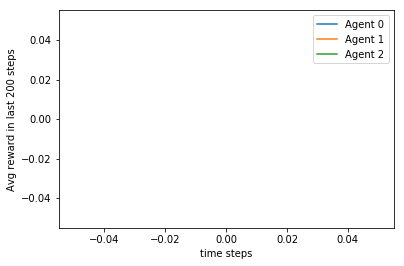

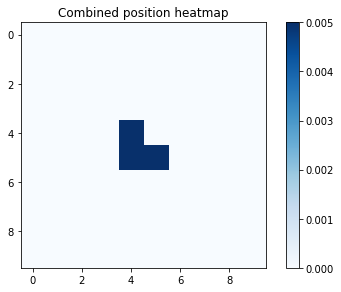

Per agent heatmaps:


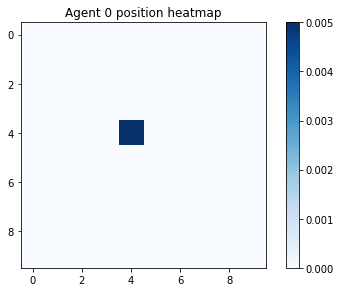

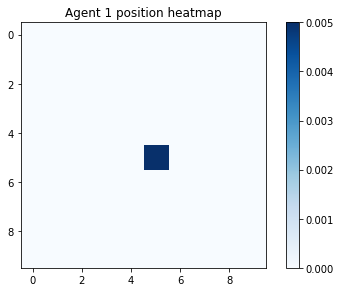

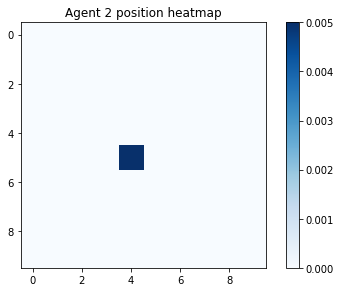

steps 0 - 200
gamma = 0.7484940065005267
avg reward for agent 0 : 0.04975124378109453
avg reward for agent 1 : 0.14925373134328357
avg reward for agent 2 : 0.09950248756218906


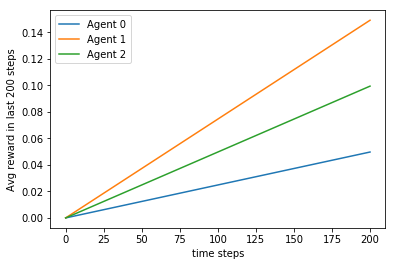

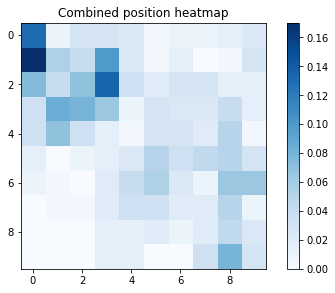

Per agent heatmaps:


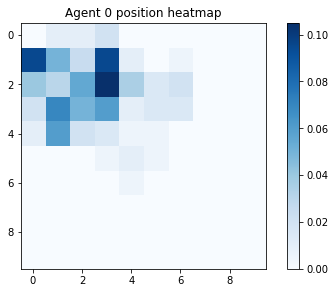

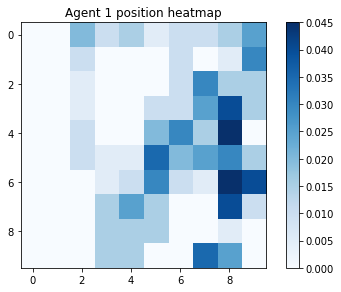

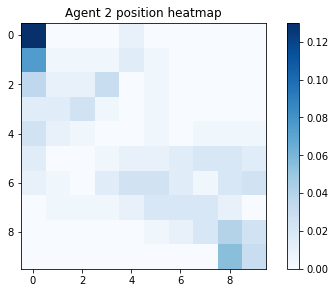

steps 200 - 400
gamma = 0.7469985070080167
avg reward for agent 0 : 0.19950124688279303
avg reward for agent 1 : 0.3491271820448878
avg reward for agent 2 : 0.1745635910224439


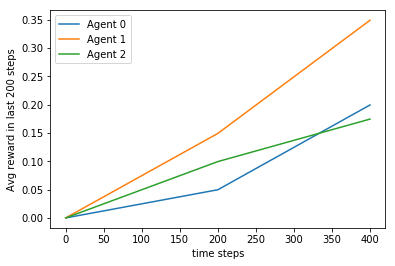

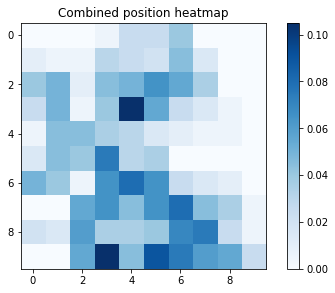

Per agent heatmaps:


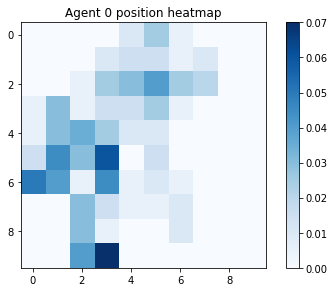

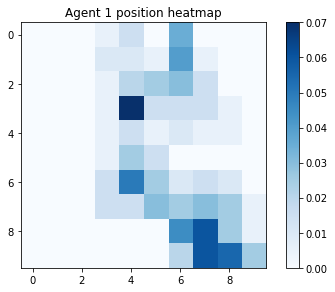

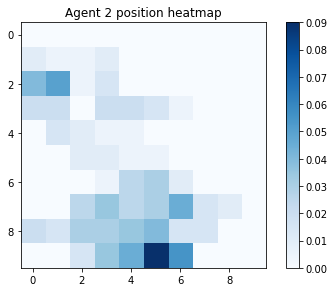

steps 400 - 600
gamma = 0.7455059955404121
avg reward for agent 0 : 0.26622296173044924
avg reward for agent 1 : 0.24958402662229617
avg reward for agent 2 : 0.2995008319467554


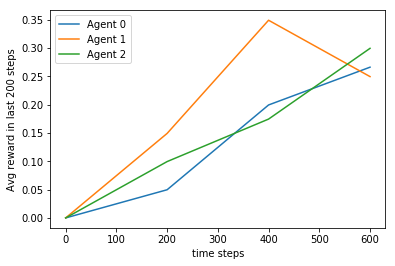

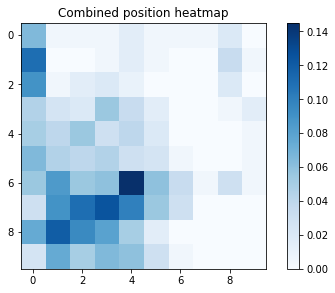

Per agent heatmaps:


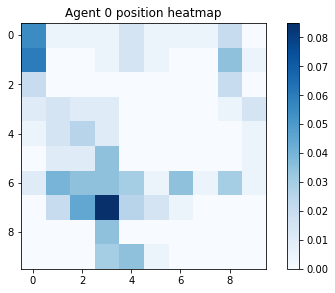

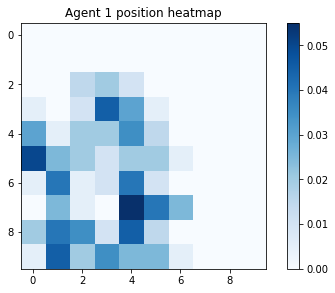

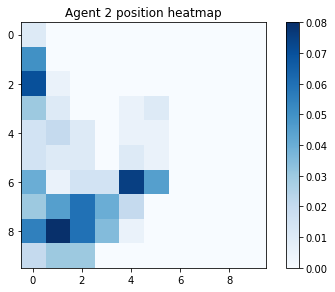

steps 600 - 800
gamma = 0.7440164661276034
avg reward for agent 0 : 0.26217228464419473
avg reward for agent 1 : 0.299625468164794
avg reward for agent 2 : 0.299625468164794


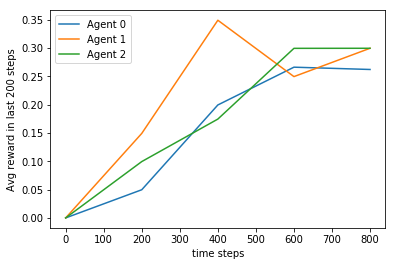

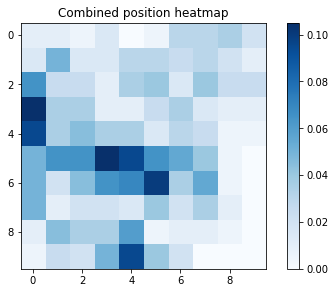

Per agent heatmaps:


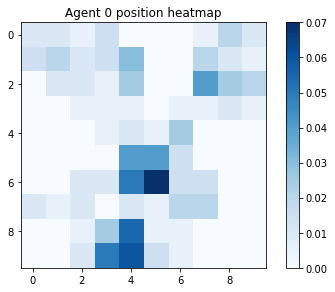

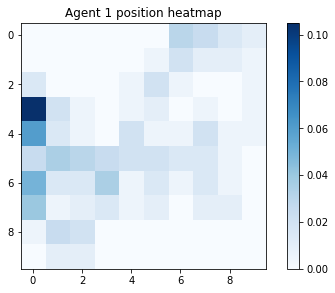

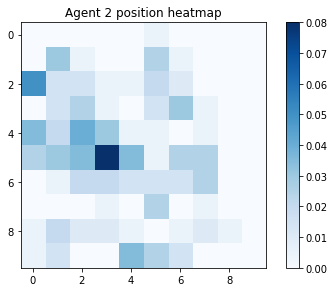

steps 800 - 1000
gamma = 0.742529912811412
avg reward for agent 0 : 0.3096903096903097
avg reward for agent 1 : 0.2597402597402597
avg reward for agent 2 : 0.2897102897102897


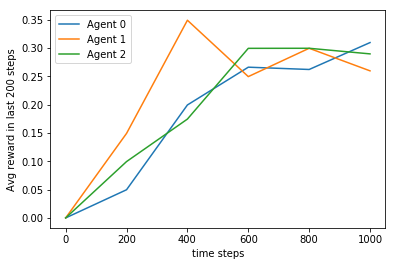

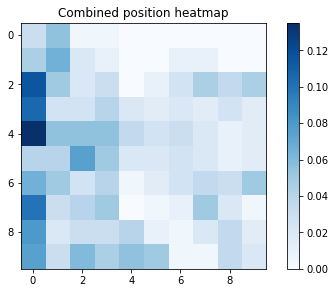

Per agent heatmaps:


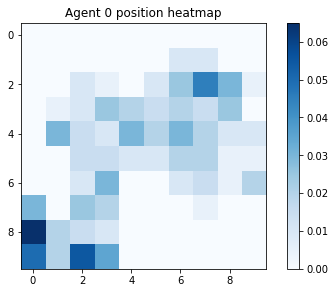

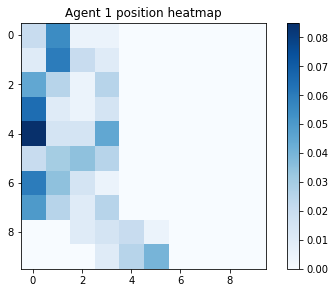

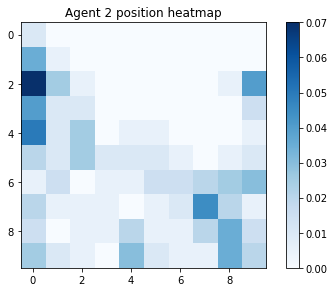

steps 1000 - 1200
gamma = 0.7410463296455646
avg reward for agent 0 : 0.3913405495420483
avg reward for agent 1 : 0.2581182348043297
avg reward for agent 2 : 0.35803497085761865


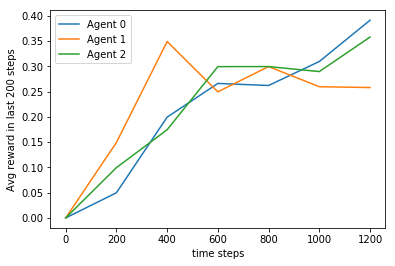

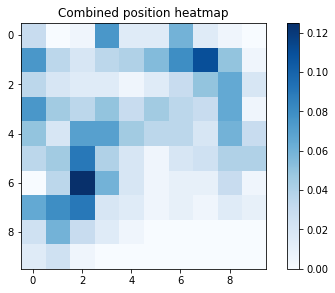

Per agent heatmaps:


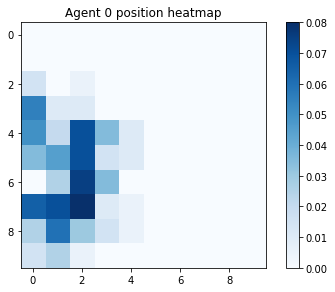

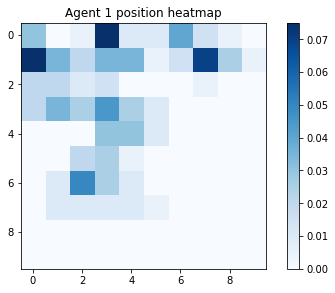

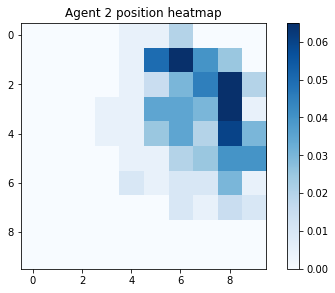

steps 1200 - 1400
gamma = 0.7395657106956656
avg reward for agent 0 : 0.35688793718772305
avg reward for agent 1 : 0.32119914346895073
avg reward for agent 2 : 0.41399000713775874


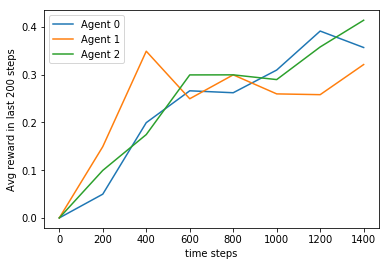

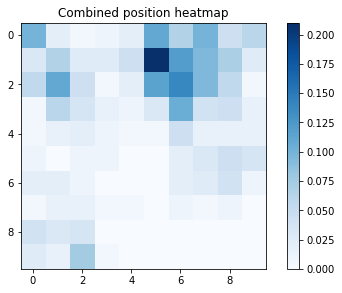

Per agent heatmaps:


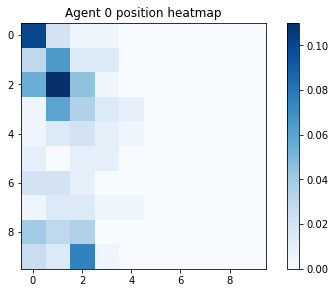

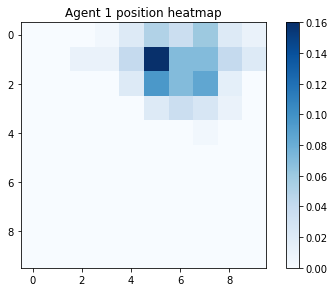

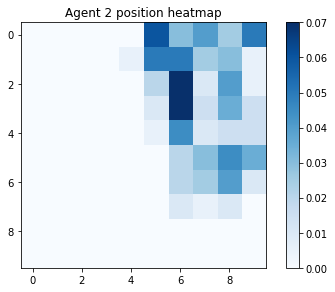

steps 1400 - 1600
gamma = 0.7380880500391779
avg reward for agent 0 : 0.3935040599625234
avg reward for agent 1 : 0.3497813866333542
avg reward for agent 2 : 0.4871955028107433


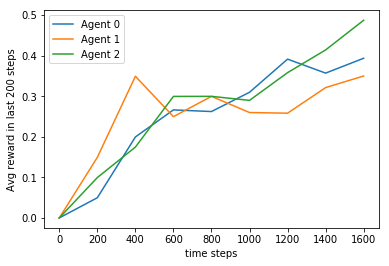

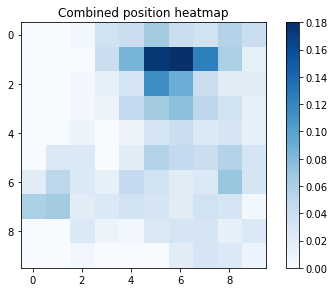

Per agent heatmaps:


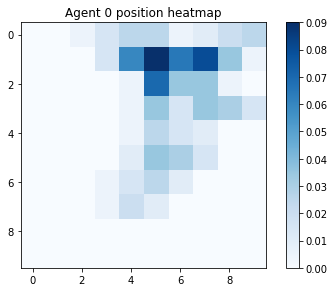

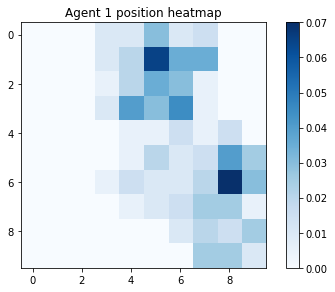

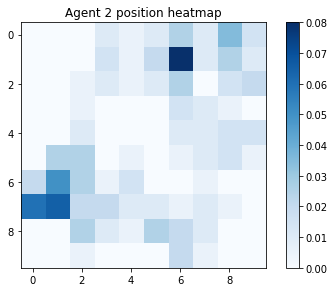

steps 1600 - 1800
gamma = 0.7366133417653984
avg reward for agent 0 : 0.3775680177679067
avg reward for agent 1 : 0.36646307606885065
avg reward for agent 2 : 0.4830649639089395


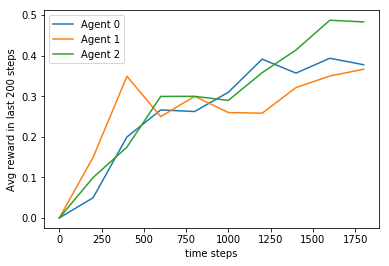

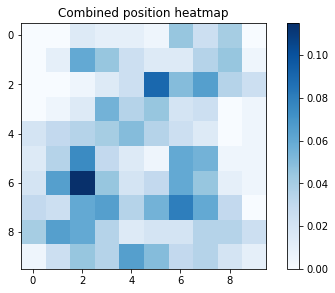

Per agent heatmaps:


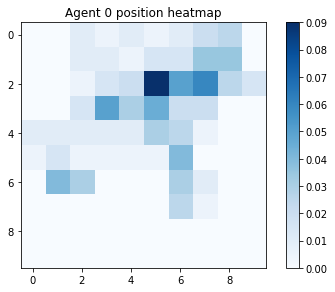

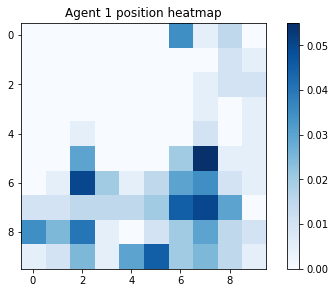

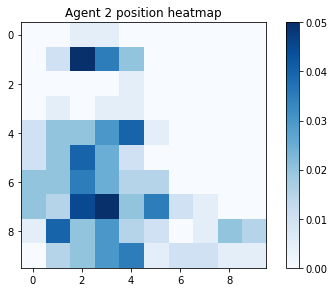

steps 1800 - 2000
gamma = 0.7351415799754325
avg reward for agent 0 : 0.3448275862068966
avg reward for agent 1 : 0.4047976011994003
avg reward for agent 2 : 0.5097451274362819


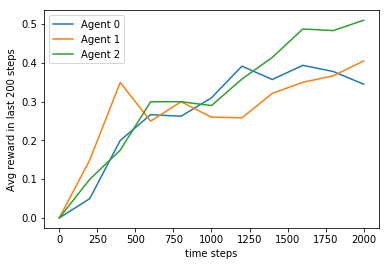

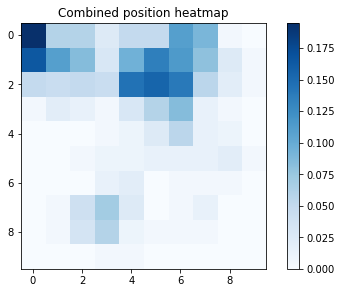

Per agent heatmaps:


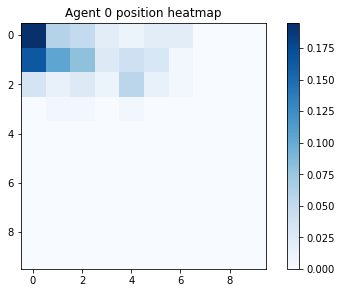

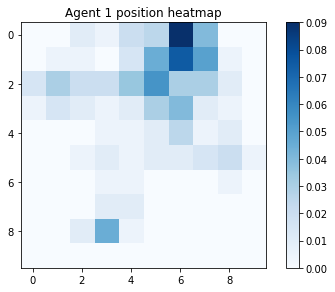

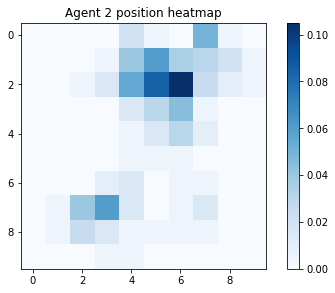

steps 2000 - 2200
gamma = 0.7336727587821723
avg reward for agent 0 : 0.3680145388459791
avg reward for agent 1 : 0.4225352112676056
avg reward for agent 2 : 0.4725124943207633


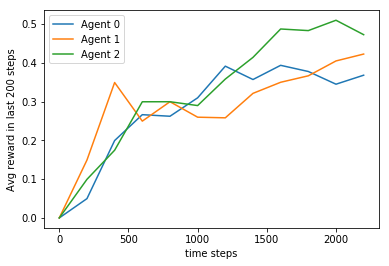

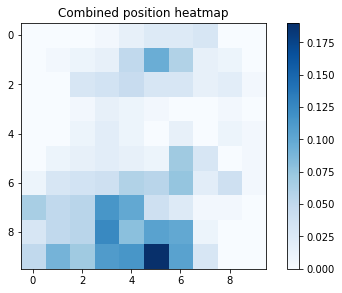

Per agent heatmaps:


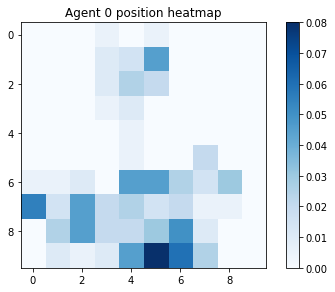

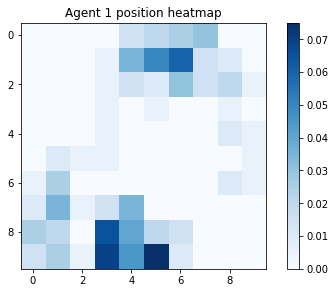

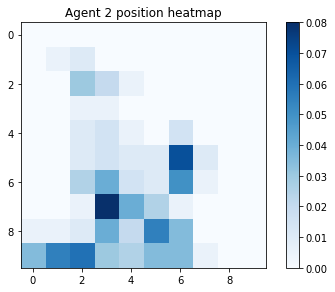

steps 2200 - 2400
gamma = 0.732206872310273
avg reward for agent 0 : 0.4039983340274885
avg reward for agent 1 : 0.47480216576426487
avg reward for agent 2 : 0.47480216576426487


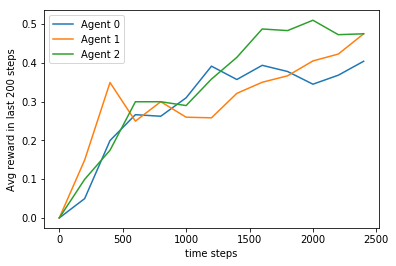

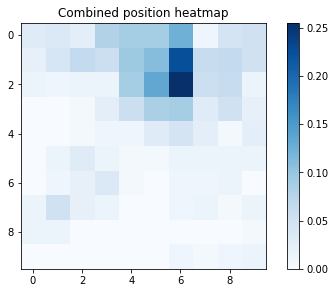

Per agent heatmaps:


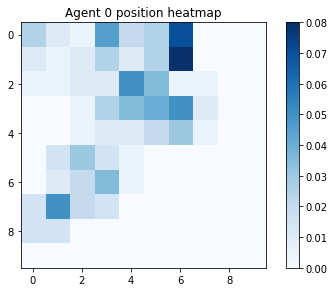

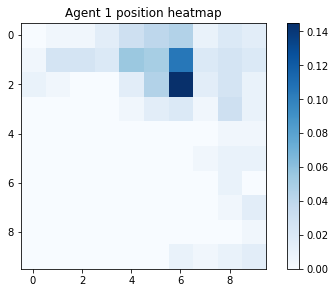

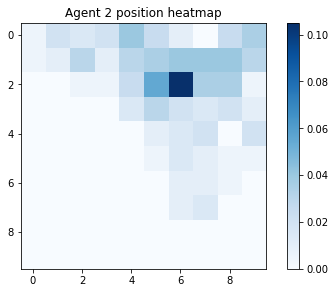

steps 2400 - 2600
gamma = 0.7307439146961278
avg reward for agent 0 : 0.4075355632449058
avg reward for agent 1 : 0.47673971549404076
avg reward for agent 2 : 0.5074971164936563


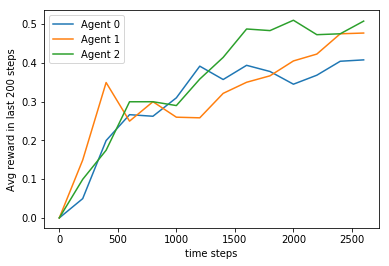

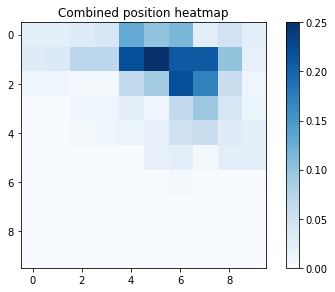

Per agent heatmaps:


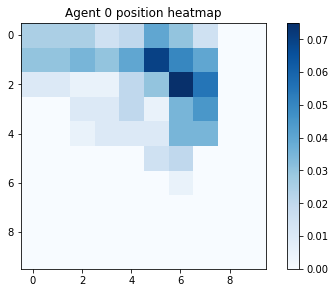

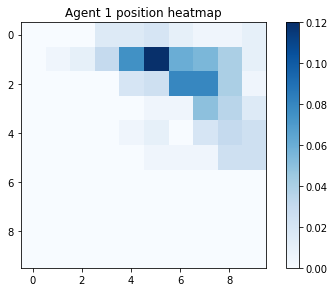

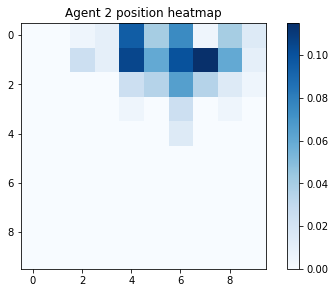

steps 2600 - 2800
gamma = 0.7292838800878461
avg reward for agent 0 : 0.42127811495894324
avg reward for agent 1 : 0.4891110317743663
avg reward for agent 2 : 0.5426633345233846


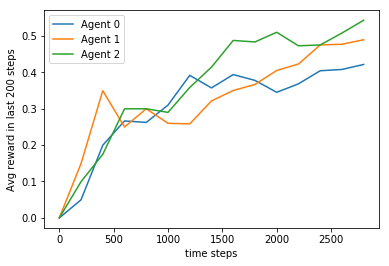

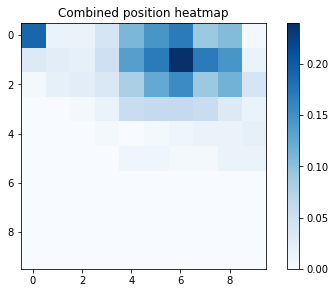

Per agent heatmaps:


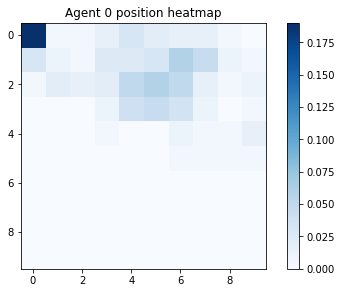

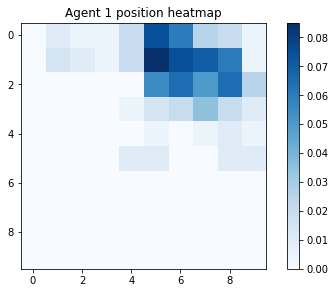

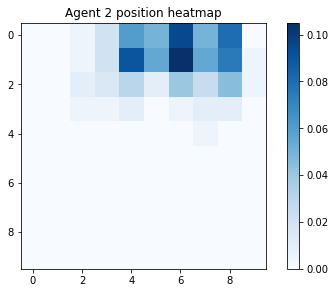

steps 2800 - 3000
gamma = 0.7278267626452294
avg reward for agent 0 : 0.433188937020993
avg reward for agent 1 : 0.489836721092969
avg reward for agent 2 : 0.52649116961013


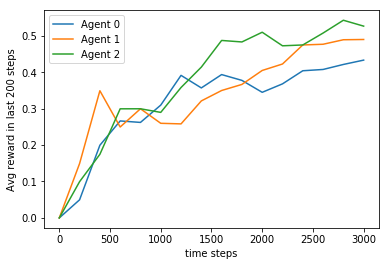

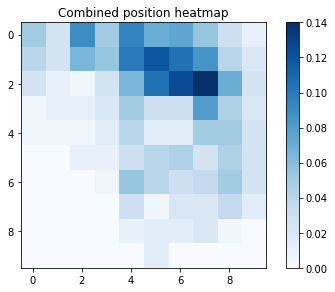

Per agent heatmaps:


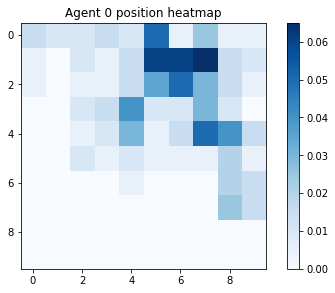

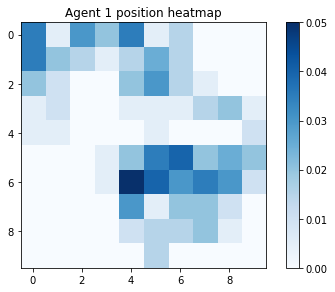

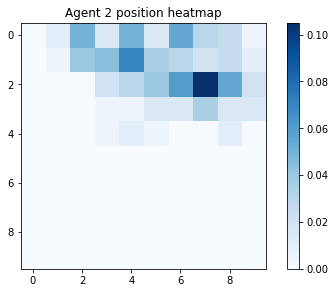

steps 3000 - 3200
gamma = 0.7263725565397459
avg reward for agent 0 : 0.4217432052483599
avg reward for agent 1 : 0.5435801312089972
avg reward for agent 2 : 0.5279600124960949


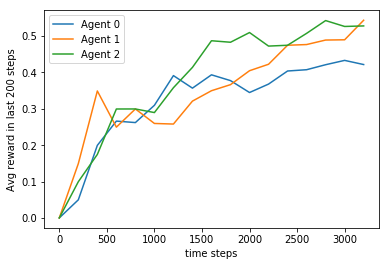

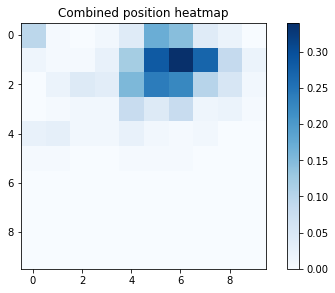

Per agent heatmaps:


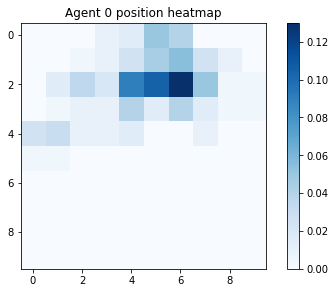

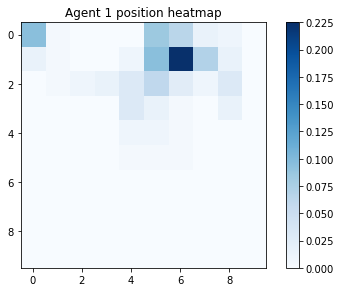

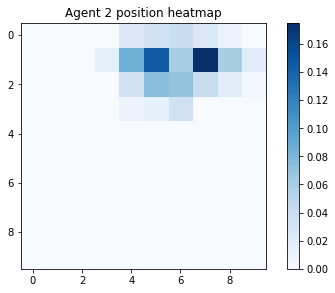

steps 3200 - 3400
gamma = 0.7249212559545128
avg reward for agent 0 : 0.41752425757130257
avg reward for agent 1 : 0.5233754778006469
avg reward for agent 2 : 0.5292561011467215


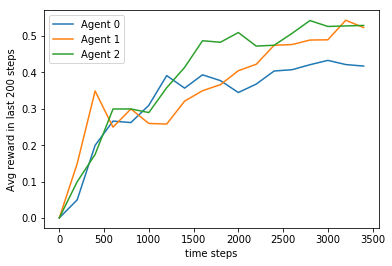

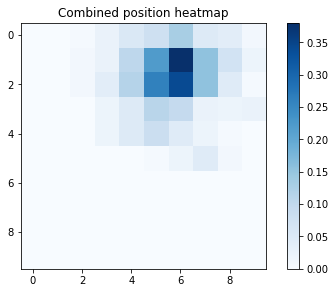

Per agent heatmaps:


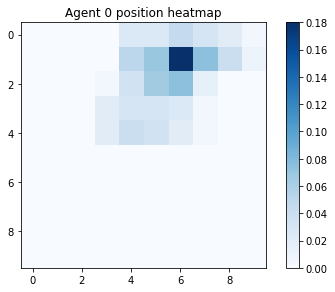

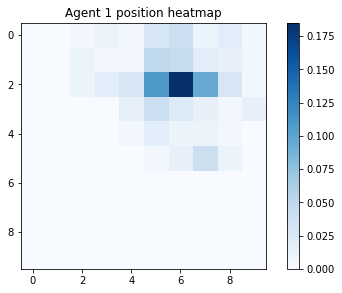

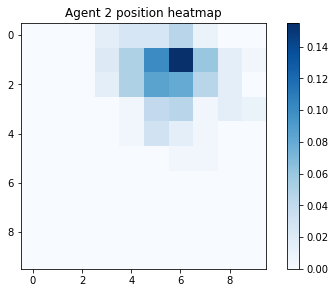

steps 3400 - 3600
gamma = 0.7234728550842664
avg reward for agent 0 : 0.41932796445431825
avg reward for agent 1 : 0.510969175229103
avg reward for agent 2 : 0.5498472646487087


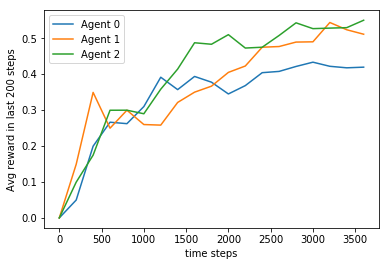

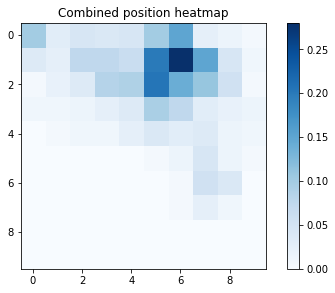

Per agent heatmaps:


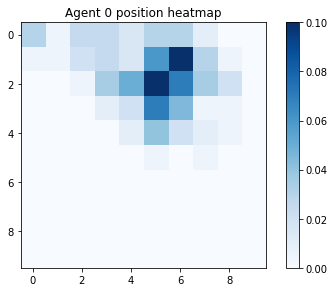

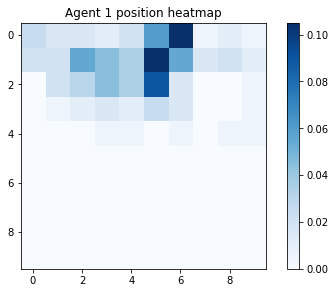

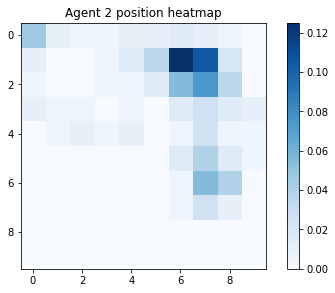

steps 3600 - 3800
gamma = 0.7220273481353452
avg reward for agent 0 : 0.4104183109707972
avg reward for agent 1 : 0.5314390949750066
avg reward for agent 2 : 0.5761641673243884


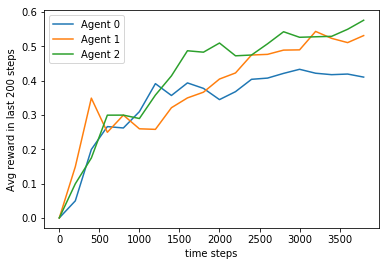

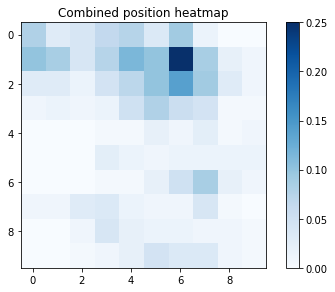

Per agent heatmaps:


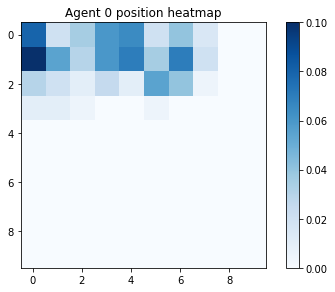

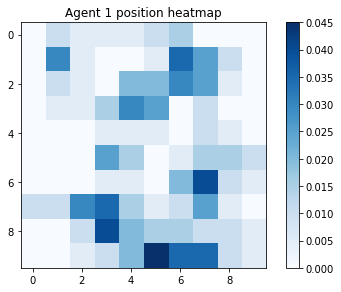

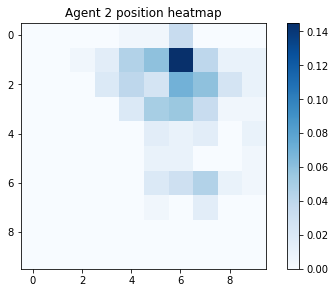

steps 3800 - 4000
gamma = 0.7205847293256598
avg reward for agent 0 : 0.4123969007748063
avg reward for agent 1 : 0.5223694076480879
avg reward for agent 2 : 0.569857535616096


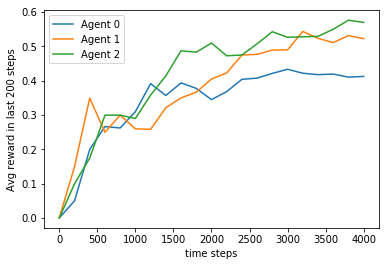

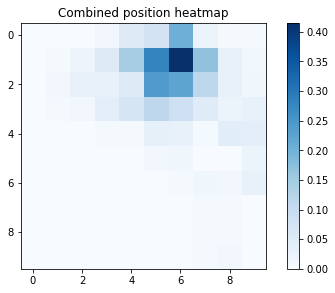

Per agent heatmaps:


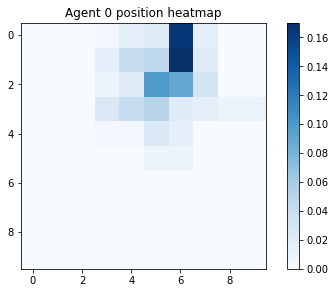

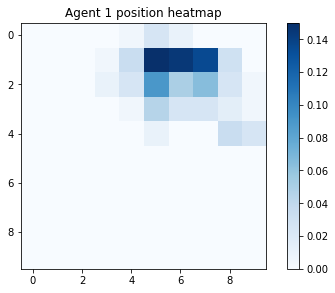

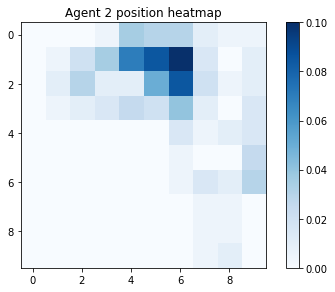

steps 4000 - 4200
gamma = 0.7191449928846763
avg reward for agent 0 : 0.4046655558200428
avg reward for agent 1 : 0.5165436800761724
avg reward for agent 2 : 0.552249464413235


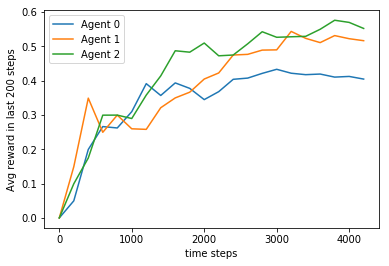

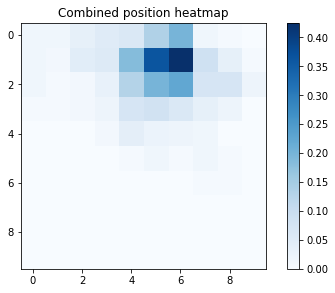

Per agent heatmaps:


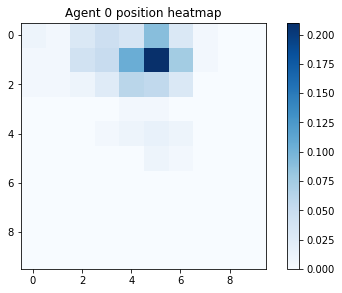

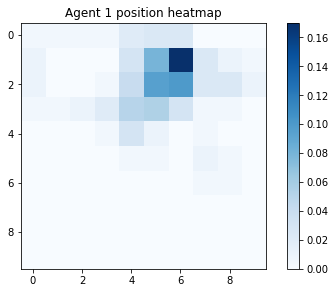

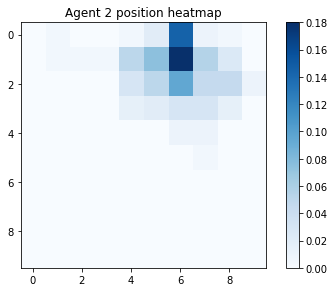

steps 4200 - 4400
gamma = 0.7177081330533887
avg reward for agent 0 : 0.42490343103840034
avg reward for agent 1 : 0.5021586003181095
avg reward for agent 2 : 0.5521472392638037


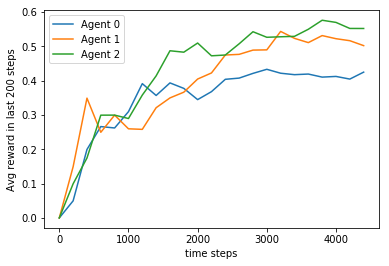

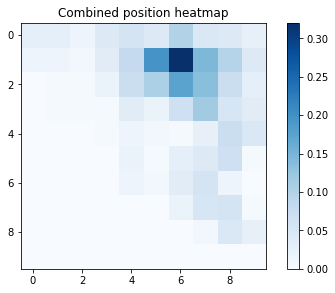

Per agent heatmaps:


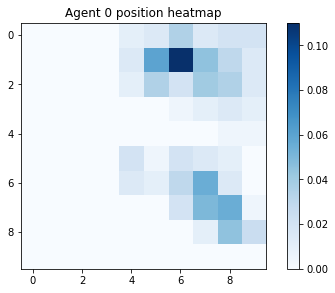

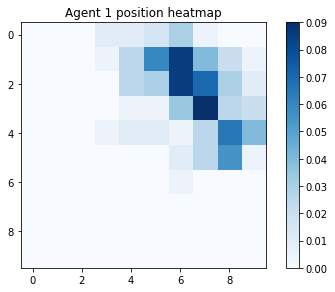

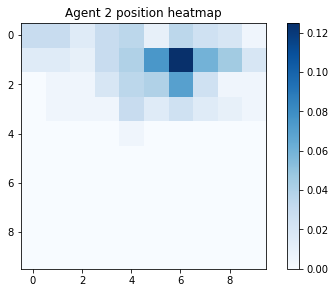

steps 4400 - 4600
gamma = 0.7162741440842997
avg reward for agent 0 : 0.4064333840469463
avg reward for agent 1 : 0.4933710063029776
avg reward for agent 2 : 0.5629211041078026


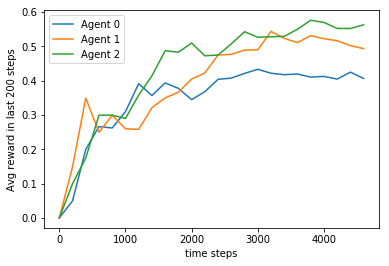

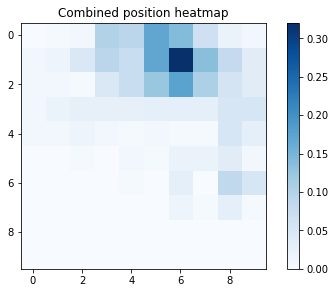

Per agent heatmaps:


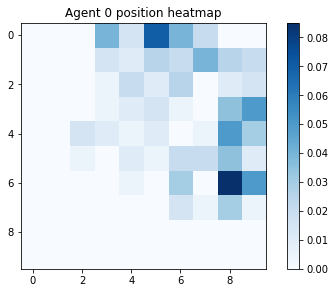

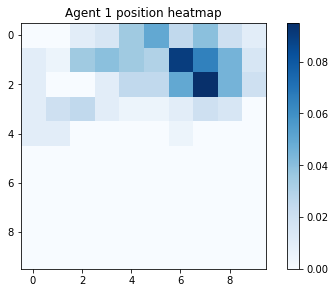

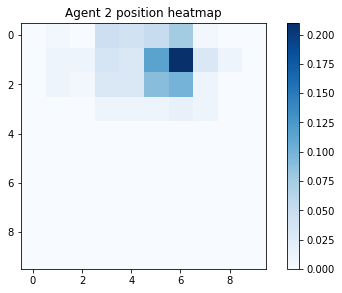

steps 4600 - 4800
gamma = 0.7148430202413928
avg reward for agent 0 : 0.4019995834201208
avg reward for agent 1 : 0.4811497604665695
avg reward for agent 2 : 0.5436367423453448


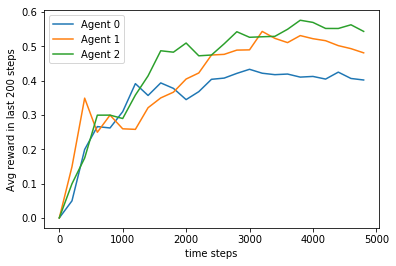

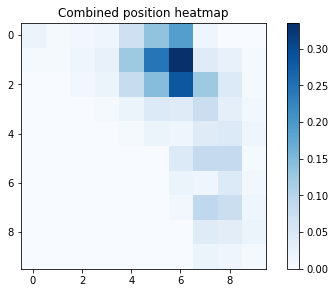

Per agent heatmaps:


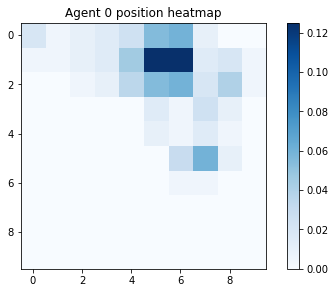

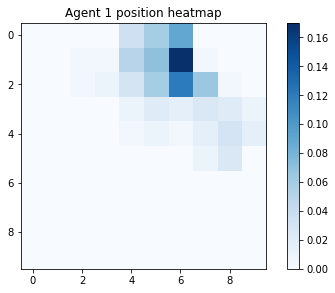

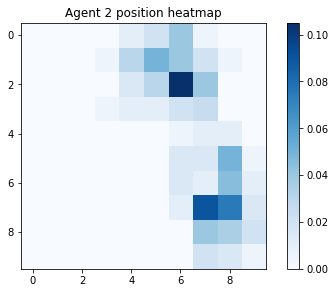

steps 4800 - 5000
gamma = 0.7134147558001144
avg reward for agent 0 : 0.4279144171165767
avg reward for agent 1 : 0.47390521895620874
avg reward for agent 2 : 0.5398920215956808


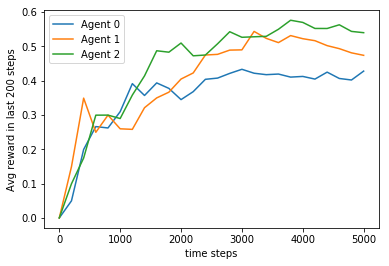

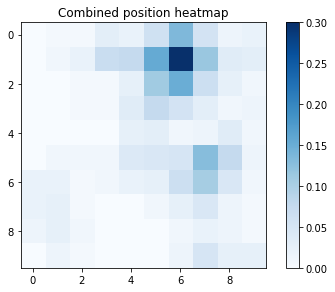

Per agent heatmaps:


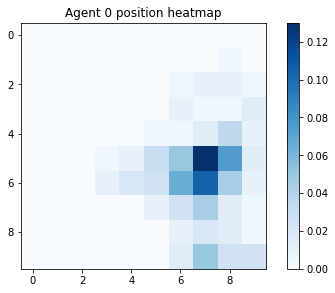

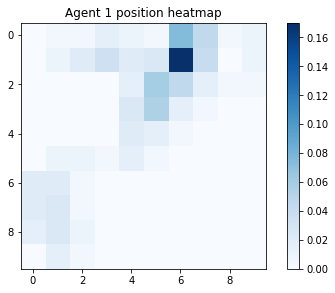

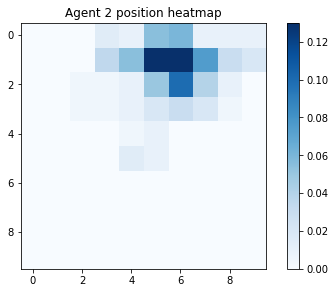

steps 5000 - 5200
gamma = 0.7119893450473471
avg reward for agent 0 : 0.4306864064602961
avg reward for agent 1 : 0.47490867140934434
avg reward for agent 2 : 0.5479715439338588


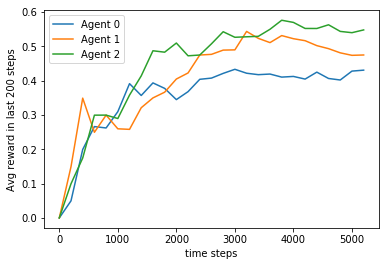

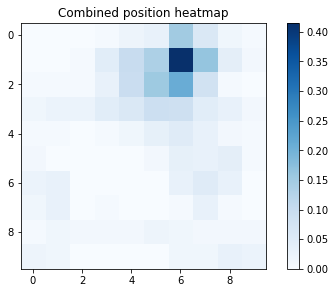

Per agent heatmaps:


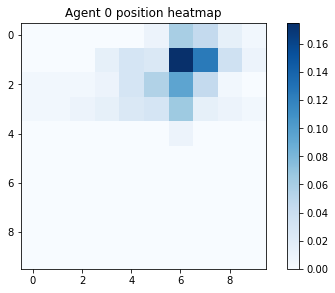

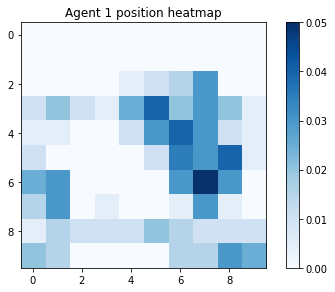

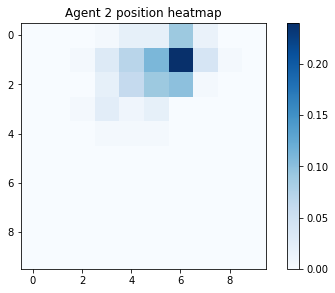

steps 5200 - 5400
gamma = 0.7105667822813897
avg reward for agent 0 : 0.4295500833179041
avg reward for agent 1 : 0.46472875393445656
avg reward for agent 2 : 0.570264765784114


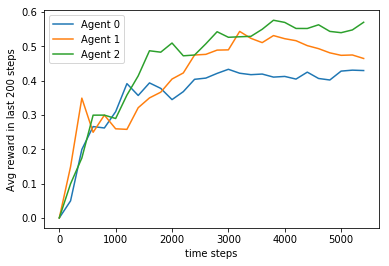

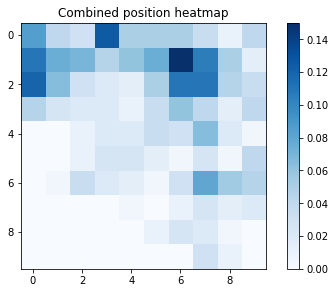

Per agent heatmaps:


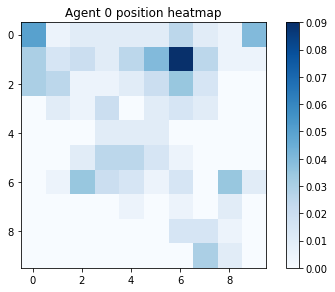

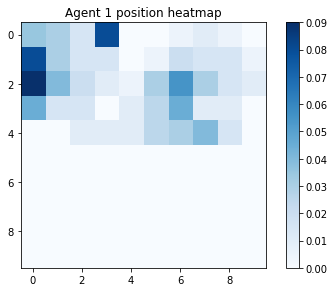

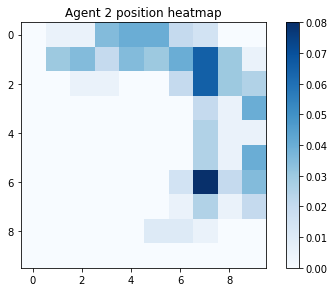

steps 5400 - 5600
gamma = 0.7091470618119308
avg reward for agent 0 : 0.4195679342974469
avg reward for agent 1 : 0.4570612390644528
avg reward for agent 2 : 0.5891805034815212


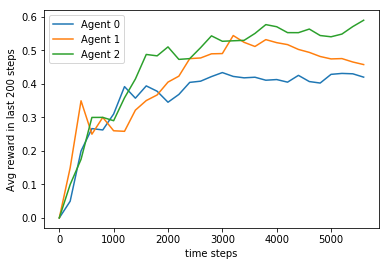

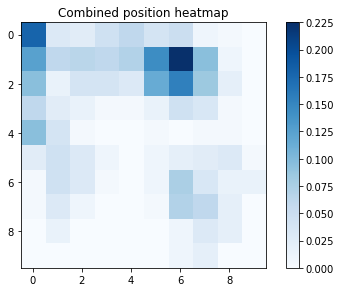

Per agent heatmaps:


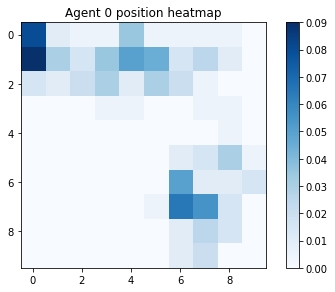

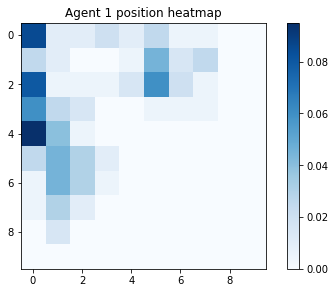

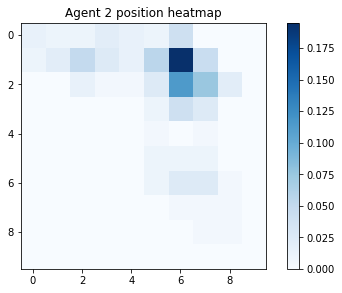

steps 5600 - 5800
gamma = 0.7077301779600308
avg reward for agent 0 : 0.4171694535424927
avg reward for agent 1 : 0.4550939493190829
avg reward for agent 2 : 0.5774866402344423


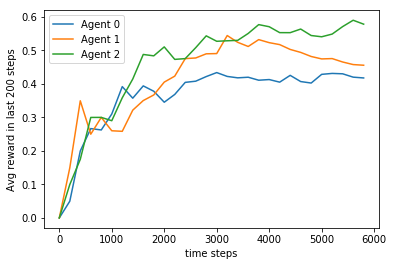

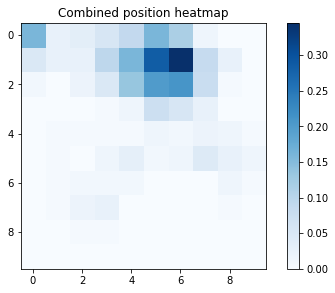

Per agent heatmaps:


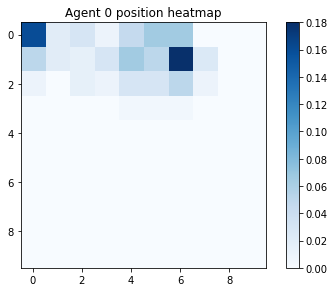

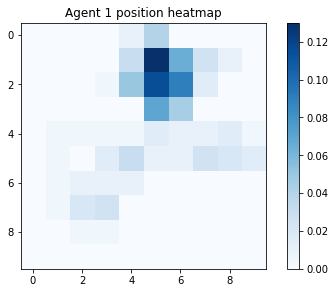

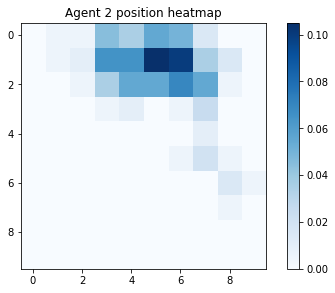

steps 5800 - 6000
gamma = 0.7063161250580957
avg reward for agent 0 : 0.4099316780536577
avg reward for agent 1 : 0.45659056823862687
avg reward for agent 2 : 0.5832361273121146


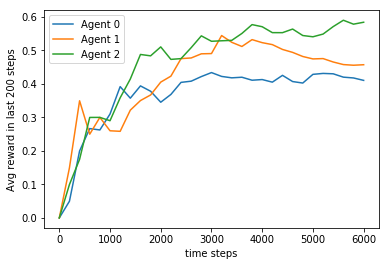

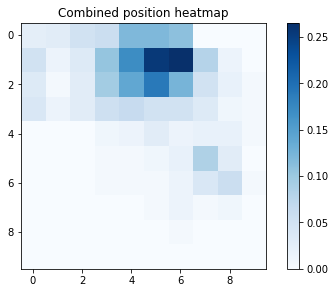

Per agent heatmaps:


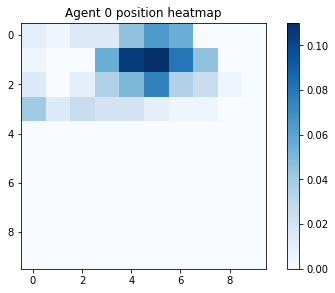

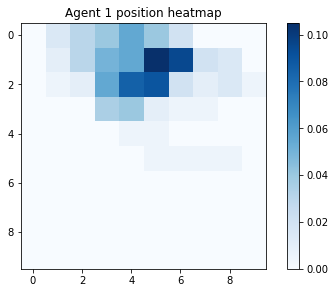

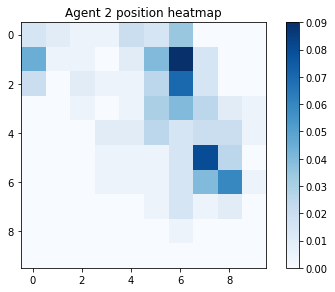

steps 6000 - 6200
gamma = 0.7049048974498564
avg reward for agent 0 : 0.4128366392517336
avg reward for agent 1 : 0.44670214481535236
avg reward for agent 2 : 0.5821641670698274


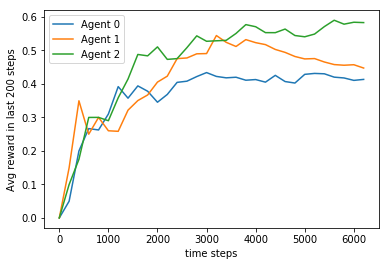

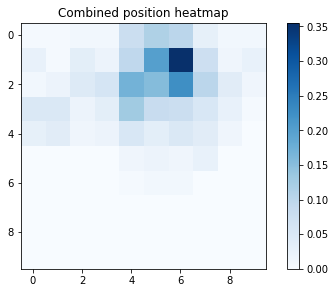

Per agent heatmaps:


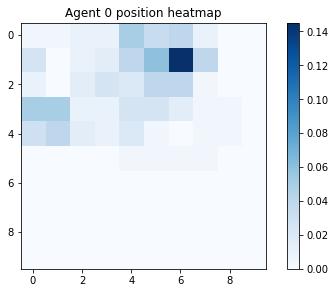

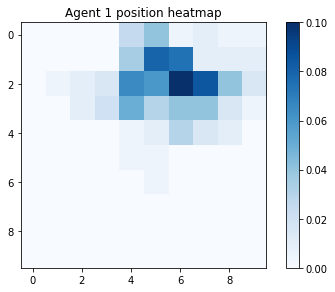

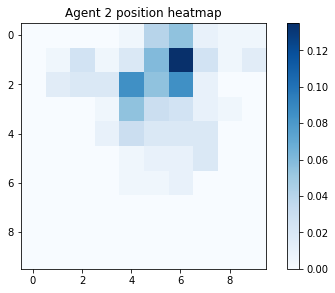

steps 6200 - 6400
gamma = 0.7034964894903425
avg reward for agent 0 : 0.4093110451491954
avg reward for agent 1 : 0.4389939072019997
avg reward for agent 2 : 0.5874082174660209


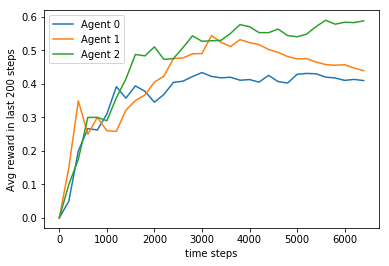

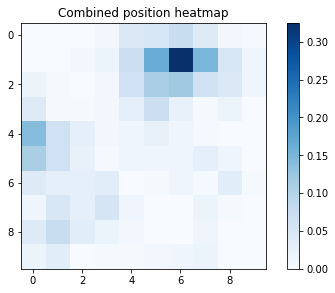

Per agent heatmaps:


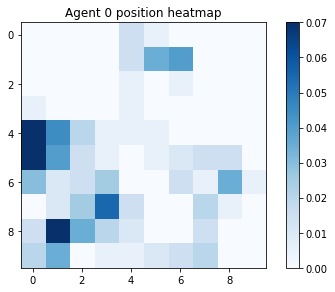

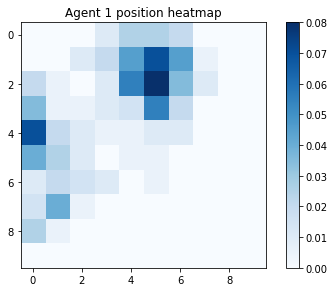

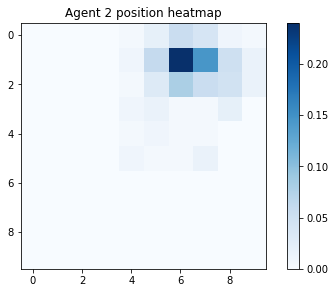

steps 6400 - 6600
gamma = 0.7020908955458653
avg reward for agent 0 : 0.409028935009847
avg reward for agent 1 : 0.44538706256627786
avg reward for agent 2 : 0.5938494167550371


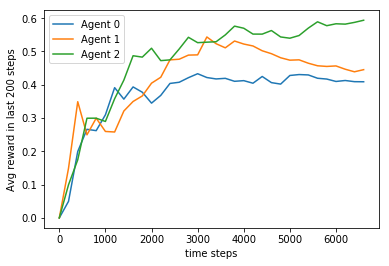

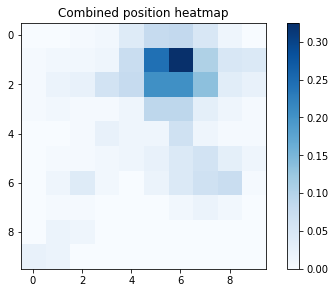

Per agent heatmaps:


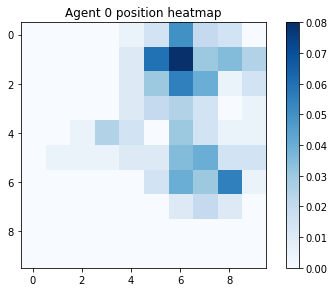

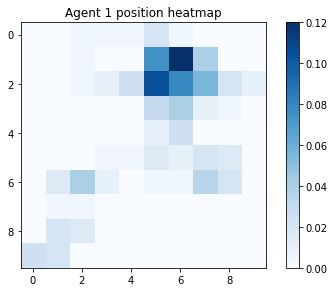

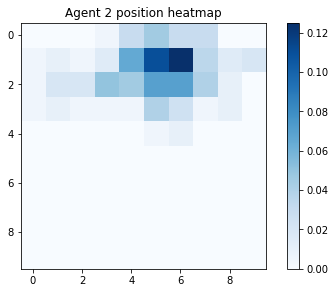

steps 6600 - 6800
gamma = 0.7006881099939904
avg reward for agent 0 : 0.4146449051610057
avg reward for agent 1 : 0.45140420526393177
avg reward for agent 2 : 0.5852080576385825


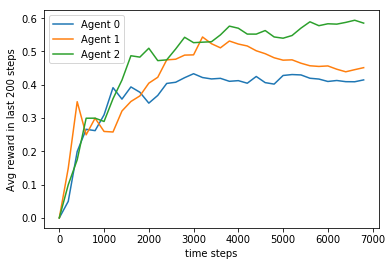

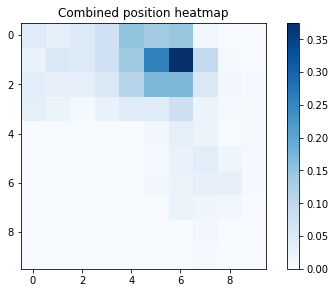

Per agent heatmaps:


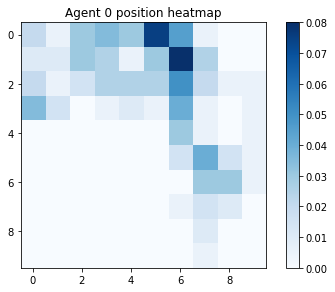

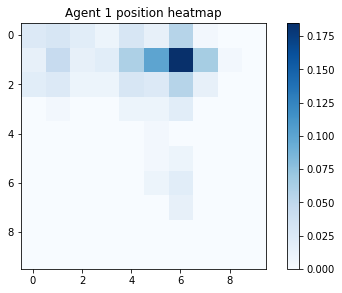

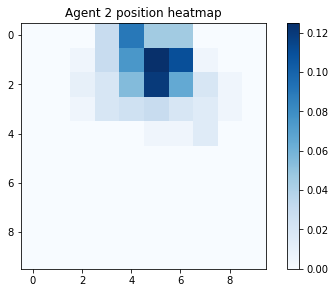

steps 6800 - 7000
gamma = 0.6992881272235179
avg reward for agent 0 : 0.4113698043136695
avg reward for agent 1 : 0.4627910298528782
avg reward for agent 2 : 0.5770604199400086


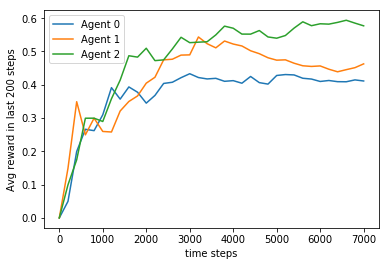

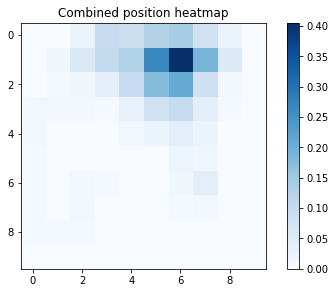

Per agent heatmaps:


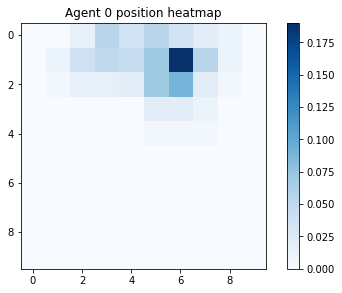

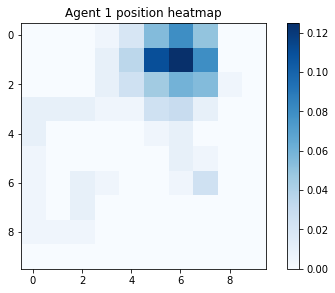

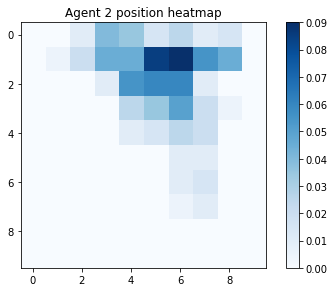

steps 7000 - 7200
gamma = 0.6978909416344579
avg reward for agent 0 : 0.417997500347174
avg reward for agent 1 : 0.4652131648382169
avg reward for agent 2 : 0.5846410220802666


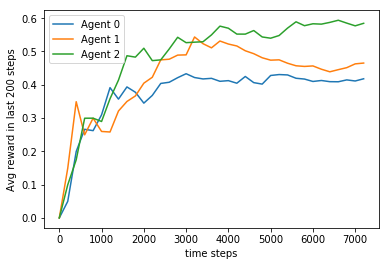

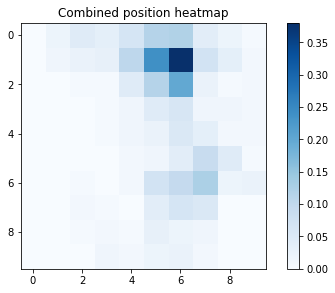

Per agent heatmaps:


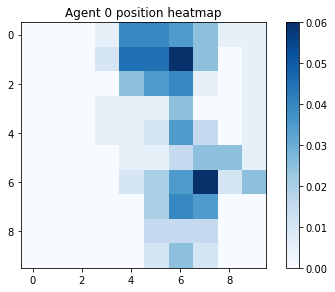

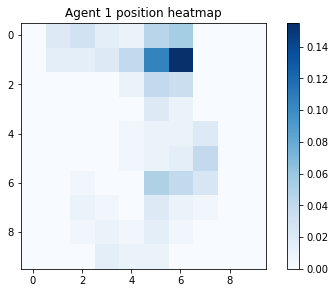

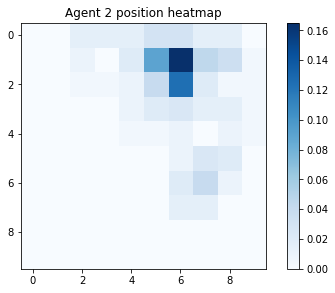

steps 7200 - 7400
gamma = 0.6964965476380109
avg reward for agent 0 : 0.42291582218619106
avg reward for agent 1 : 0.47290906634238616
avg reward for agent 2 : 0.614781786245102


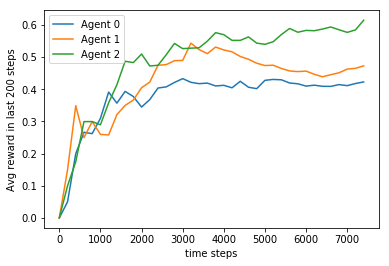

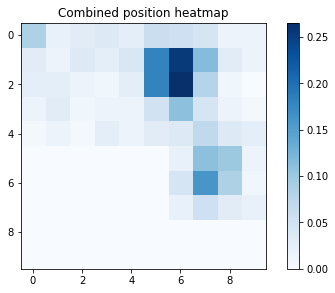

Per agent heatmaps:


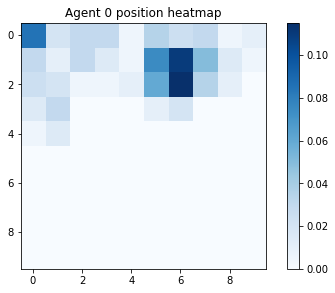

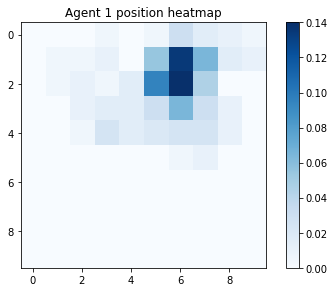

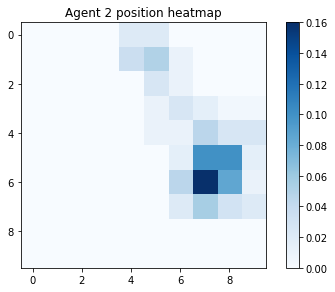

steps 7400 - 7600
gamma = 0.6951049396565432
avg reward for agent 0 : 0.4209972372056308
avg reward for agent 1 : 0.4696750427575319
avg reward for agent 2 : 0.606499144849362


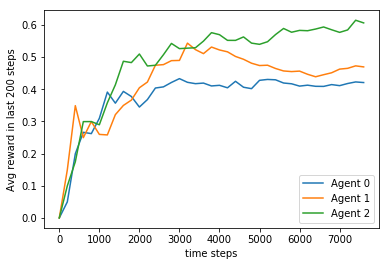

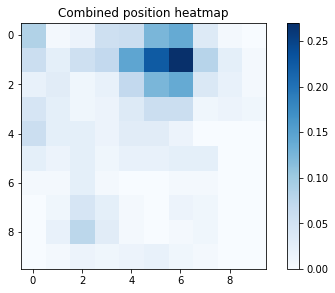

Per agent heatmaps:


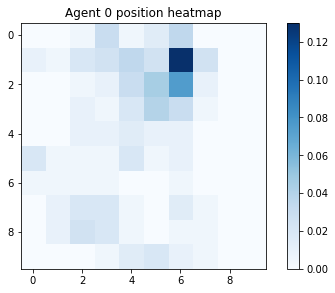

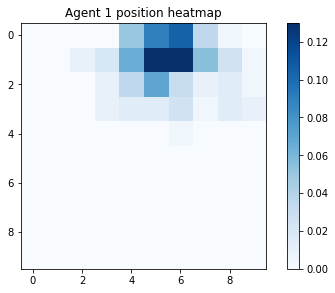

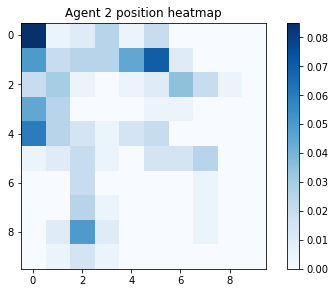

steps 7600 - 7800
gamma = 0.6937161121235647
avg reward for agent 0 : 0.4191770285860787
avg reward for agent 1 : 0.4627611844635303
avg reward for agent 2 : 0.6140238430970388


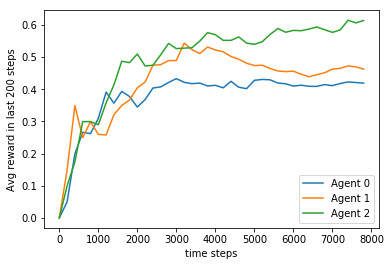

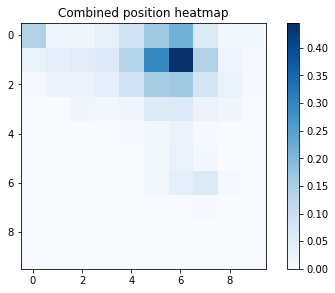

Per agent heatmaps:


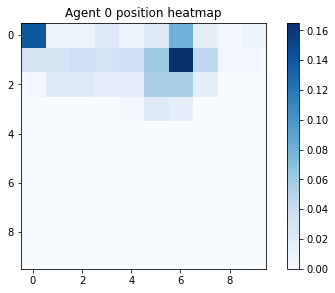

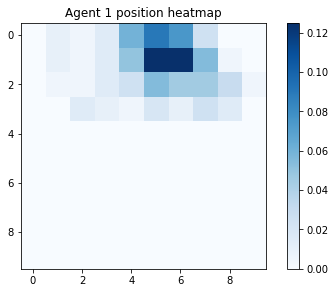

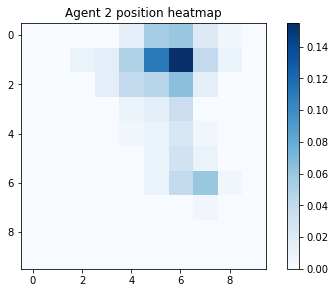

steps 7800 - 8000
gamma = 0.6923300594837084
avg reward for agent 0 : 0.43369578802649666
avg reward for agent 1 : 0.4599425071866017
avg reward for agent 2 : 0.6111736032995876


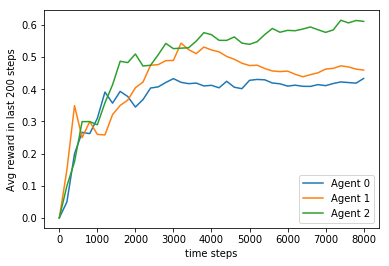

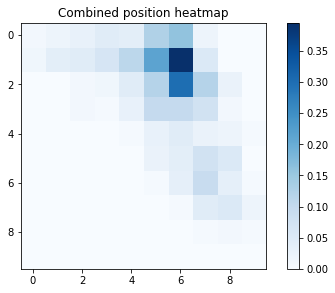

Per agent heatmaps:


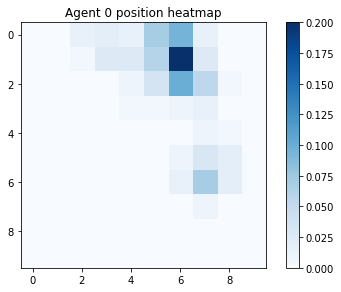

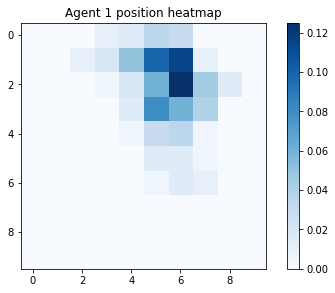

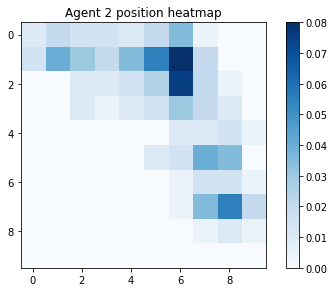

steps 8000 - 8200
gamma = 0.6909467761927074
avg reward for agent 0 : 0.4462870381660773
avg reward for agent 1 : 0.467016217534447
avg reward for agent 2 : 0.6279721985123765


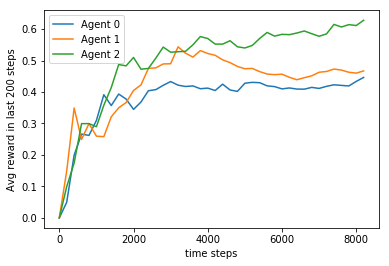

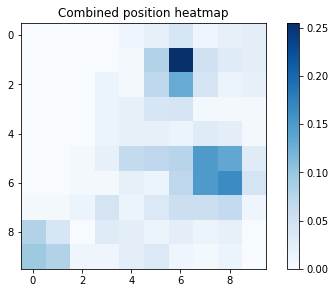

Per agent heatmaps:


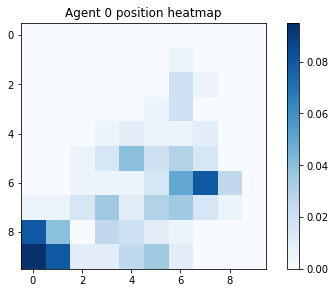

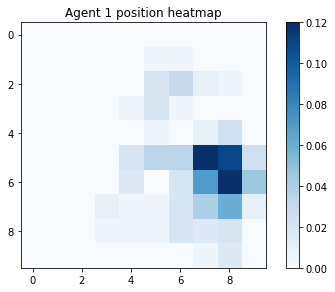

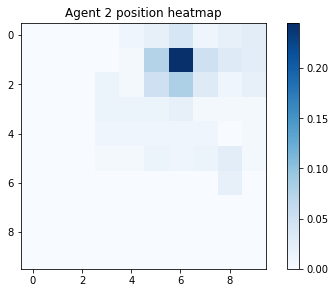

steps 8200 - 8400
gamma = 0.6895662567173704
avg reward for agent 0 : 0.4666111177240805
avg reward for agent 1 : 0.4689917866920605
avg reward for agent 2 : 0.6308772765147006


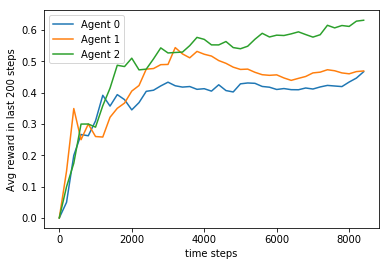

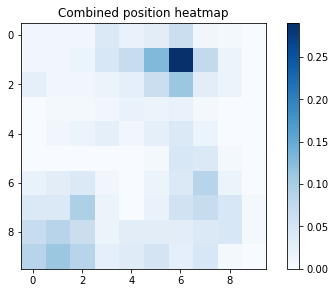

Per agent heatmaps:


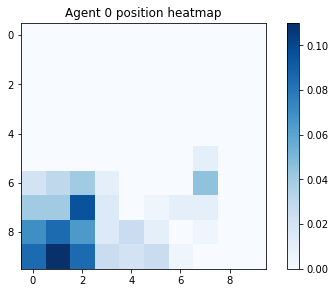

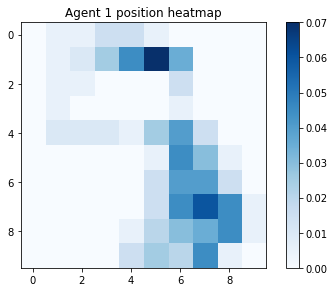

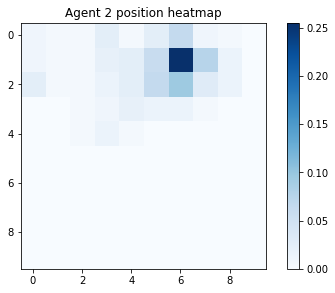

steps 8400 - 8600
gamma = 0.6881884955355622
avg reward for agent 0 : 0.4720381351005697
avg reward for agent 1 : 0.47436344611091735
avg reward for agent 2 : 0.6371352168352518


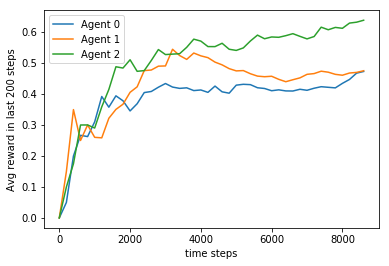

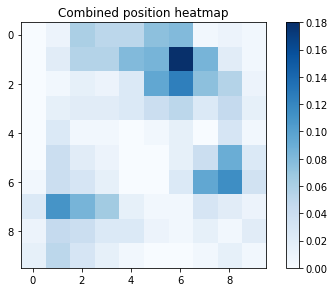

Per agent heatmaps:


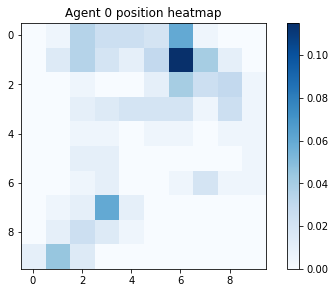

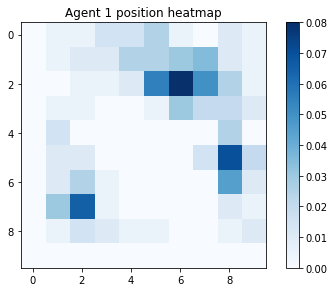

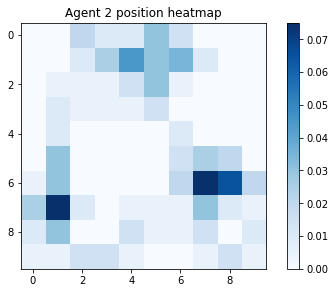

steps 8600 - 8800
gamma = 0.6868134871361814
avg reward for agent 0 : 0.4874446085672083
avg reward for agent 1 : 0.4851721395295989
avg reward for agent 2 : 0.6533348483126917


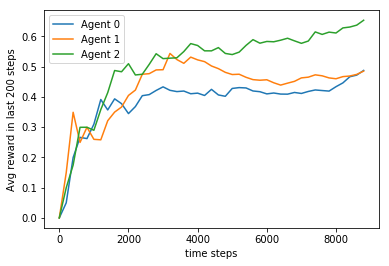

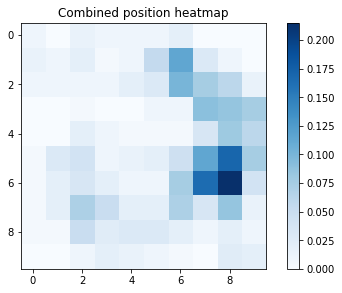

Per agent heatmaps:


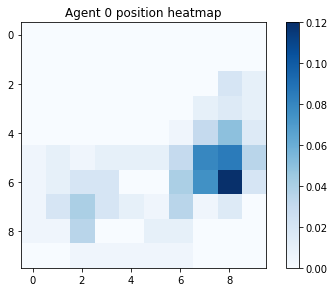

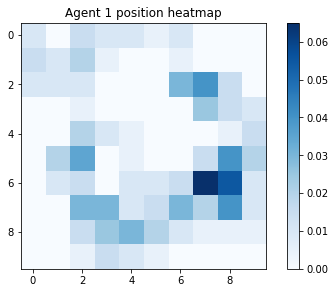

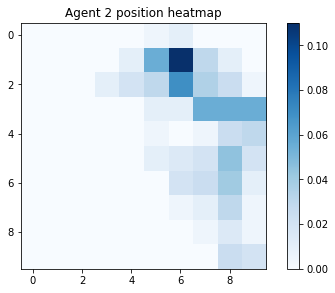

steps 8800 - 9000
gamma = 0.685441226019139
avg reward for agent 0 : 0.5132763026330408
avg reward for agent 1 : 0.5077213642928563
avg reward for agent 2 : 0.6699255638262416


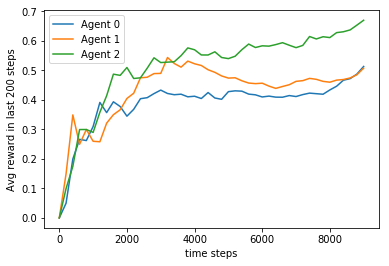

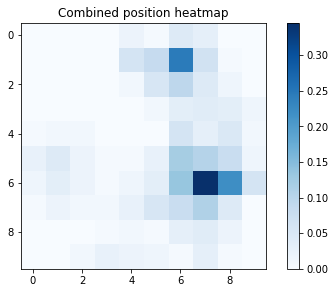

Per agent heatmaps:


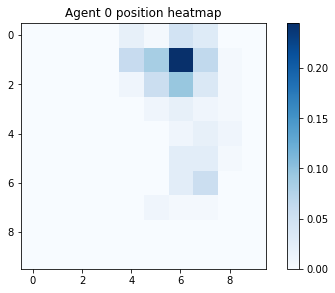

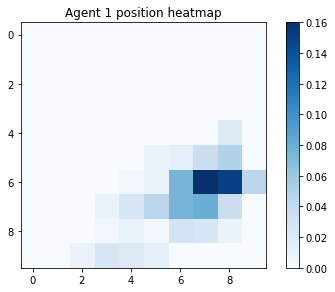

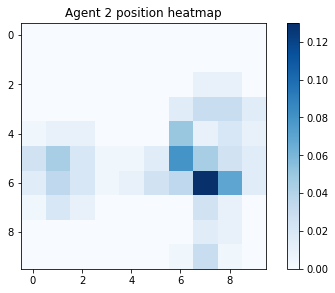

steps 9000 - 9200
gamma = 0.6840717066953313
avg reward for agent 0 : 0.5358113248559939
avg reward for agent 1 : 0.5162482338876209
avg reward for agent 2 : 0.6792739919573959


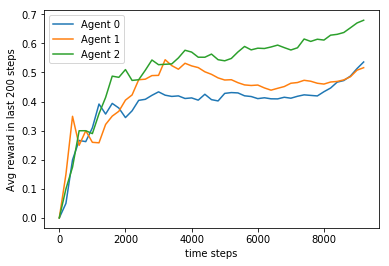

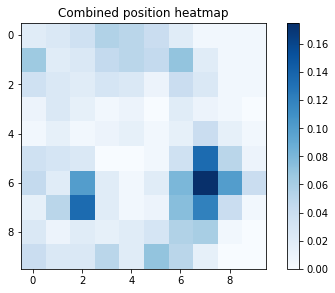

Per agent heatmaps:


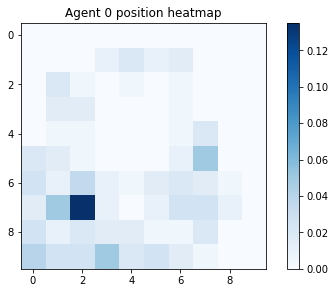

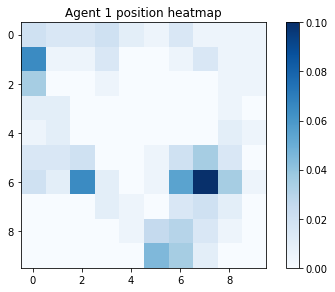

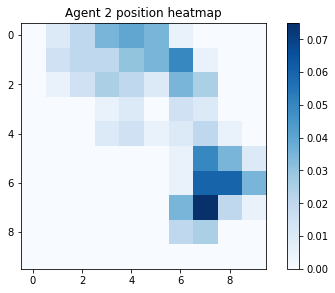

steps 9200 - 9400
gamma = 0.6827049236866265
avg reward for agent 0 : 0.5669609615998298
avg reward for agent 1 : 0.5371768960748856
avg reward for agent 2 : 0.6797149239442613


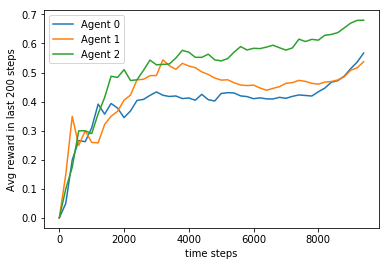

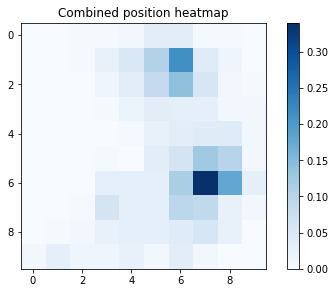

Per agent heatmaps:


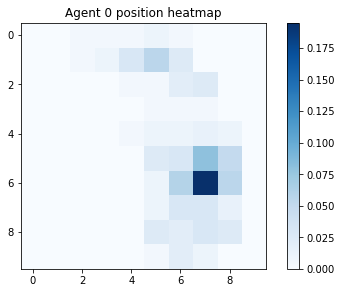

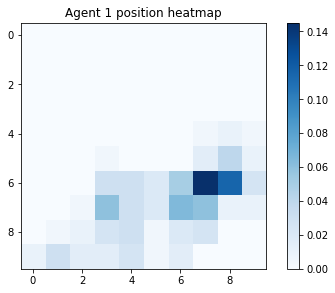

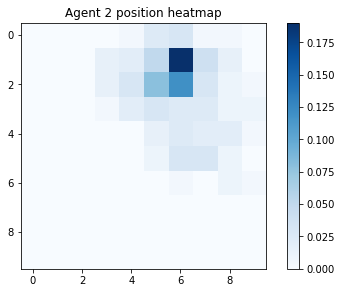

steps 9400 - 9600
gamma = 0.681340871525834
avg reward for agent 0 : 0.5895219247995
avg reward for agent 1 : 0.555150505155713
avg reward for agent 2 : 0.6968024164149568


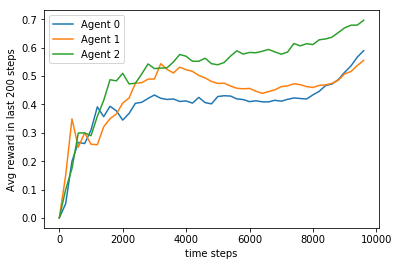

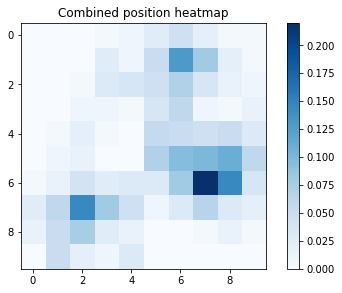

Per agent heatmaps:


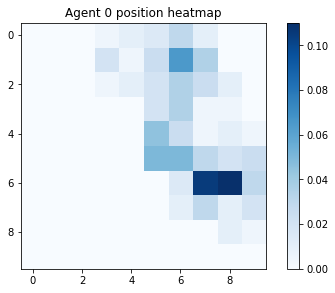

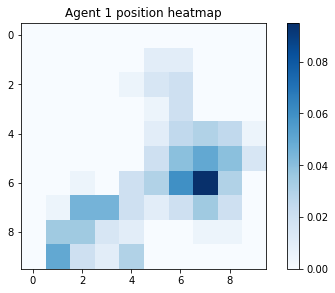

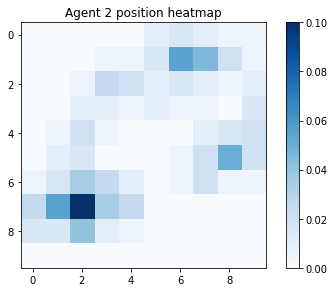

steps 9600 - 9800
gamma = 0.6799795447566906
avg reward for agent 0 : 0.6193245587184981
avg reward for agent 1 : 0.5774920926436078
avg reward for agent 2 : 0.6978879706152433


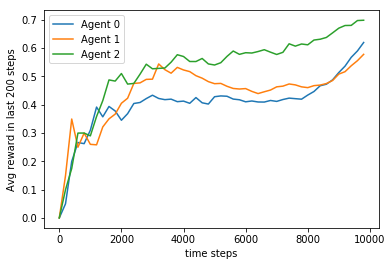

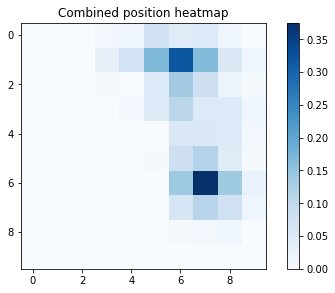

Per agent heatmaps:


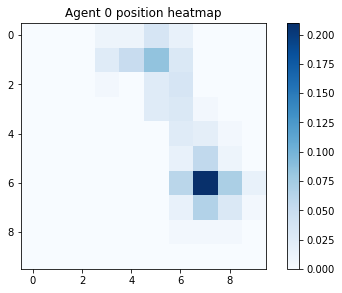

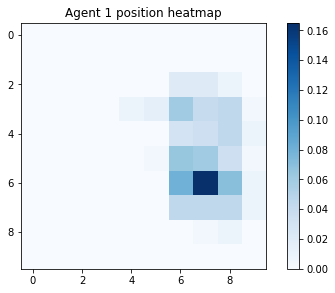

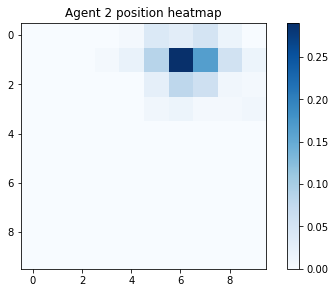

steps 9800 - 10000
gamma = 0.6786209379338319
avg reward for agent 0 : 0.660933906609339
avg reward for agent 1 : 0.577942205779422
avg reward for agent 2 : 0.6959304069593041


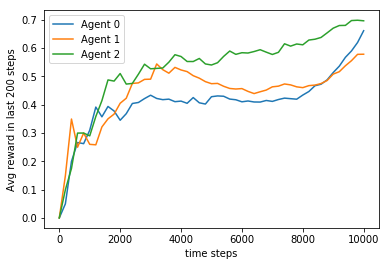

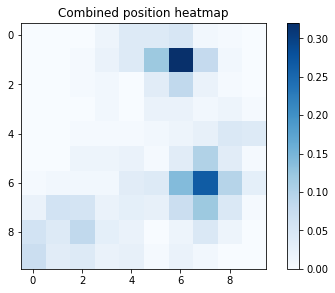

Per agent heatmaps:


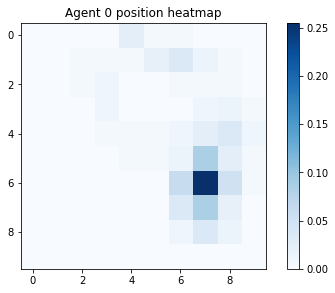

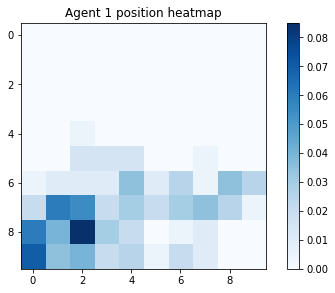

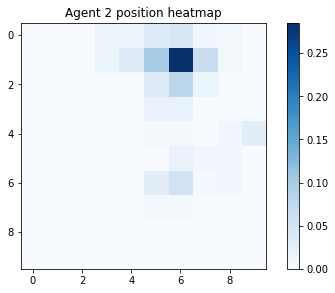

steps 10000 - 10200
gamma = 0.6772650456227753
avg reward for agent 0 : 0.6911087148318792
avg reward for agent 1 : 0.6244485834722086
avg reward for agent 2 : 0.7097343397706107


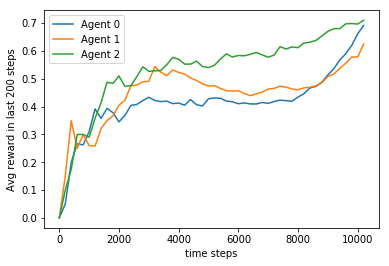

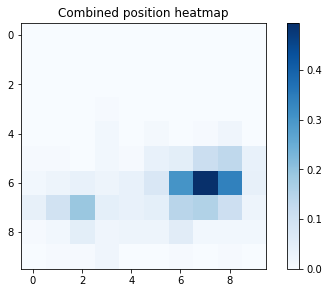

Per agent heatmaps:


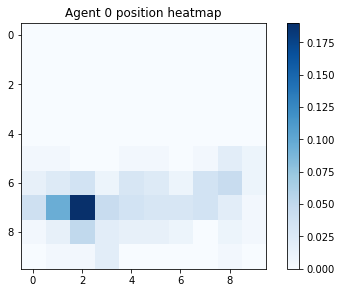

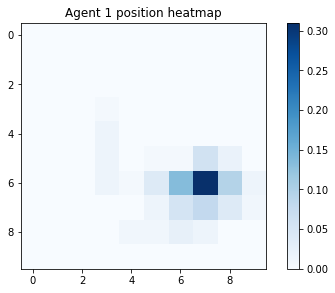

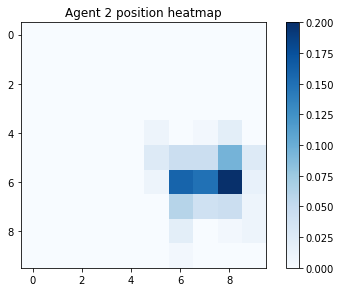

steps 10200 - 10400
gamma = 0.6759118623998952
avg reward for agent 0 : 0.712431496971445
avg reward for agent 1 : 0.6412844918757812
avg reward for agent 2 : 0.7133929429862513


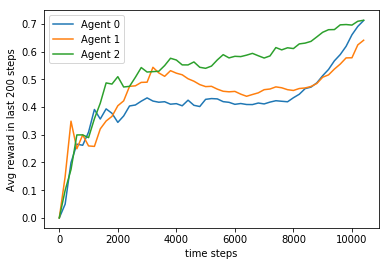

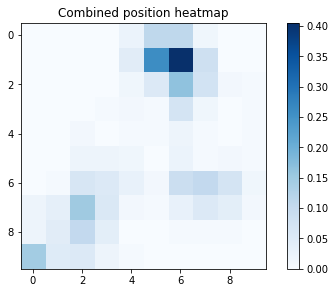

Per agent heatmaps:


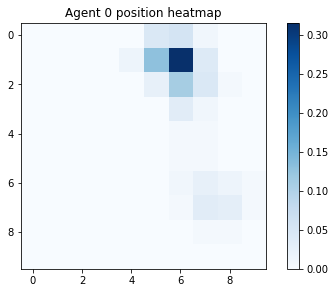

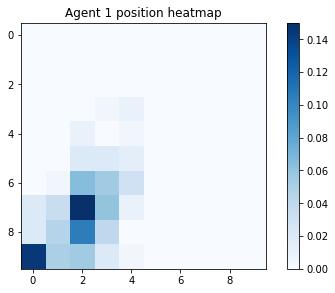

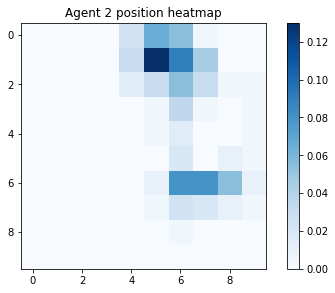

steps 10400 - 10600
gamma = 0.6745613828524022
avg reward for agent 0 : 0.748985944722196
avg reward for agent 1 : 0.6772945948495425
avg reward for agent 2 : 0.7178568059617018


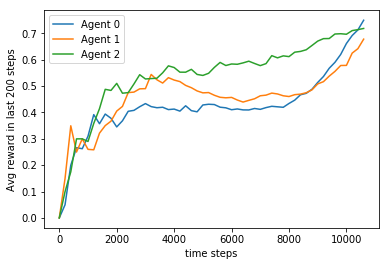

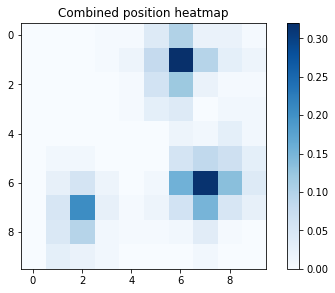

Per agent heatmaps:


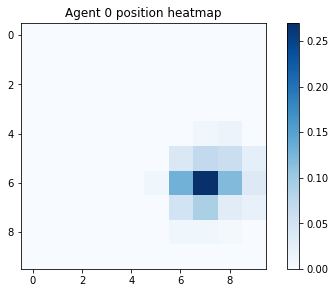

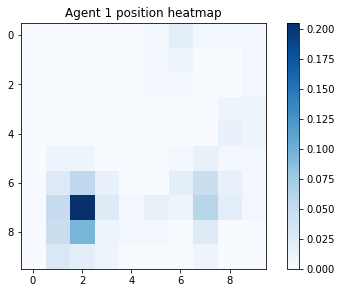

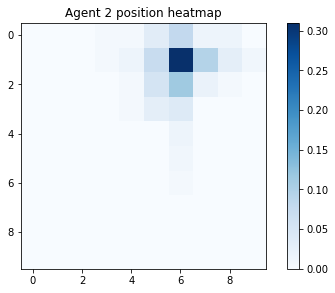

steps 10600 - 10800
gamma = 0.673213601578323
avg reward for agent 0 : 0.7619664845847607
avg reward for agent 1 : 0.7064160725858717
avg reward for agent 2 : 0.7258587167854829


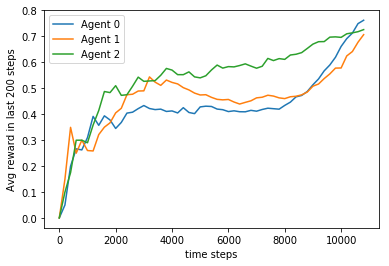

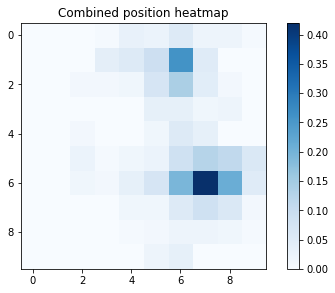

Per agent heatmaps:


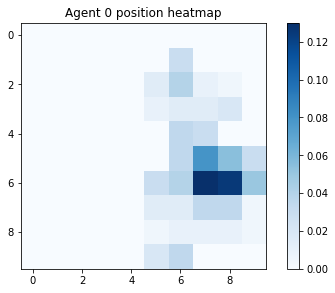

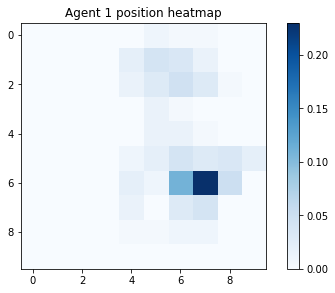

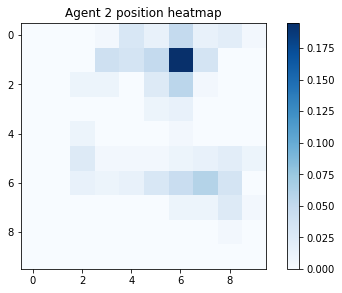

steps 10800 - 11000
gamma = 0.6718685131864768
avg reward for agent 0 : 0.783565130442687
avg reward for agent 1 : 0.7262976093082447
avg reward for agent 2 : 0.7253886010362695


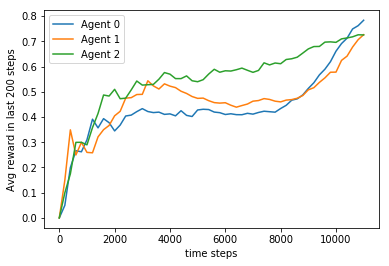

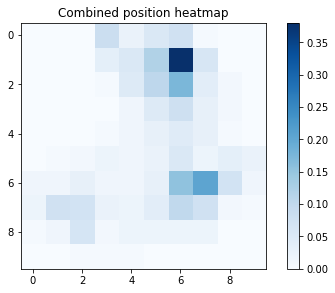

Per agent heatmaps:


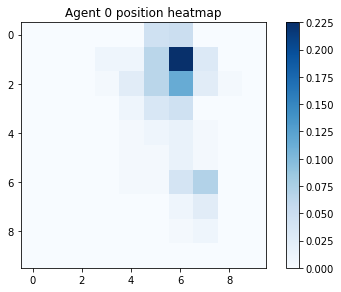

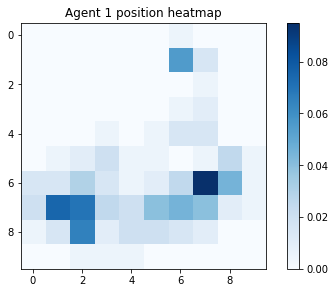

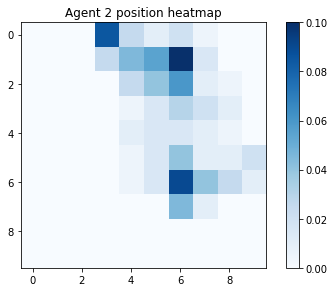

steps 11000 - 11200
gamma = 0.6705261122964526
avg reward for agent 0 : 0.7954646906526203
avg reward for agent 1 : 0.7383269350950808
avg reward for agent 2 : 0.7383269350950808


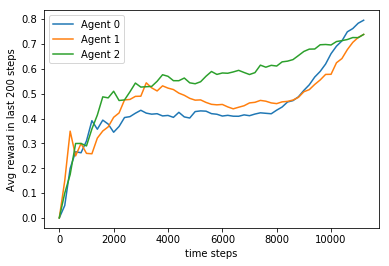

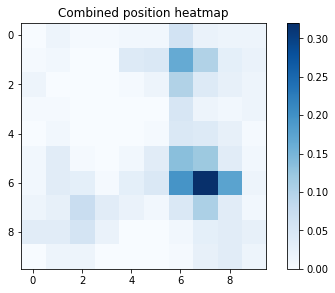

Per agent heatmaps:


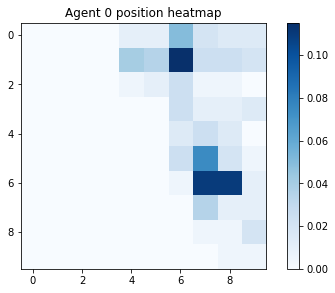

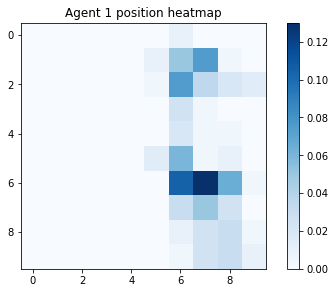

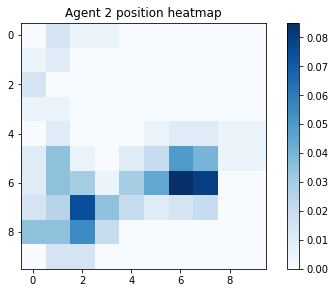

steps 11200 - 11400
gamma = 0.6691863935385938
avg reward for agent 0 : 0.7964213665467942
avg reward for agent 1 : 0.7630909569336023
avg reward for agent 2 : 0.756074028593983


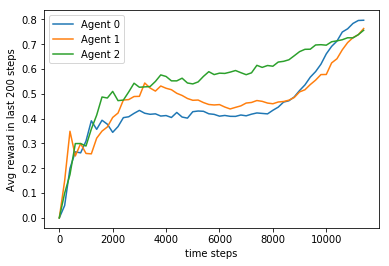

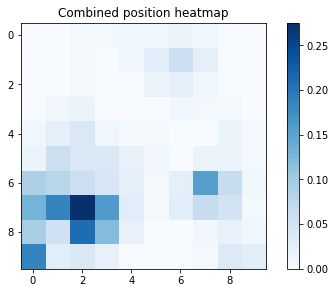

Per agent heatmaps:


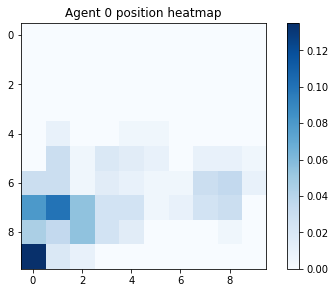

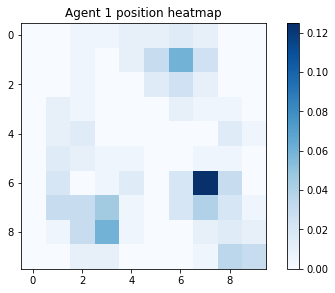

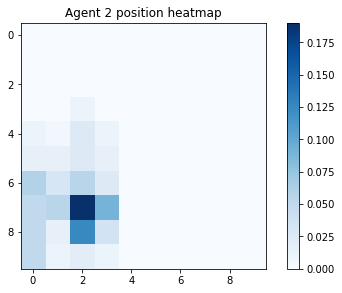

steps 11400 - 11600
gamma = 0.6678493515539694
avg reward for agent 0 : 0.7964830618050168
avg reward for agent 1 : 0.778381174036721
avg reward for agent 2 : 0.7766571847254548


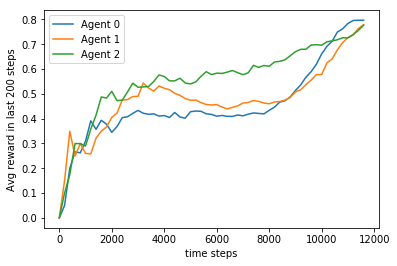

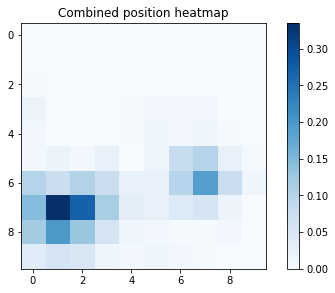

Per agent heatmaps:


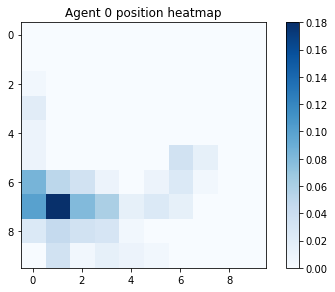

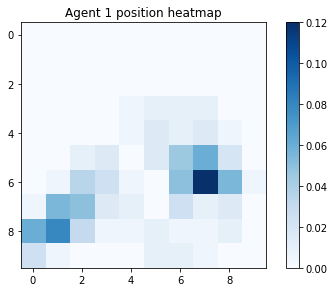

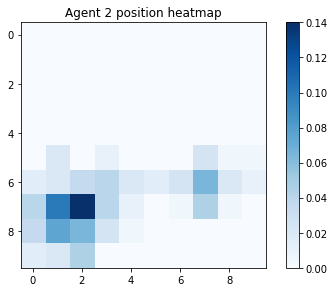

steps 11600 - 11800
gamma = 0.6665149809943551
avg reward for agent 0 : 0.7999322091348191
avg reward for agent 1 : 0.8092534530971952
avg reward for agent 2 : 0.7745106346919752


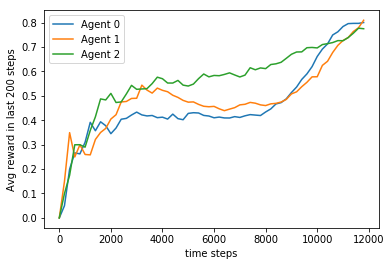

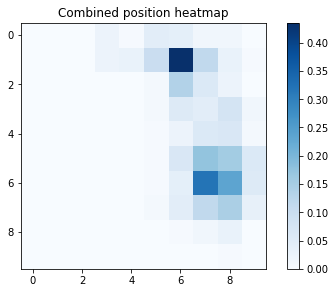

Per agent heatmaps:


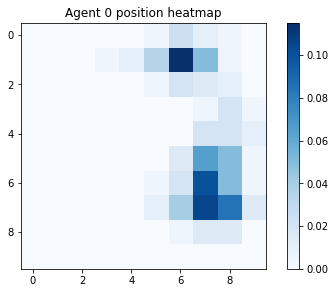

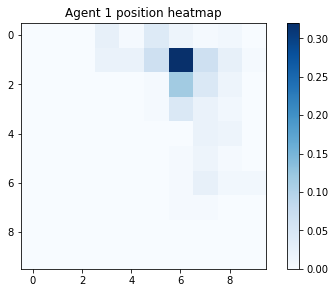

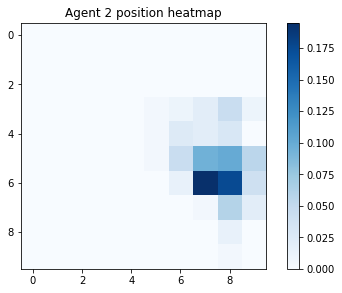

steps 11800 - 12000
gamma = 0.6651832765222149
avg reward for agent 0 : 0.799933338888426
avg reward for agent 1 : 0.8190984084659612
avg reward for agent 2 : 0.7691025747854345


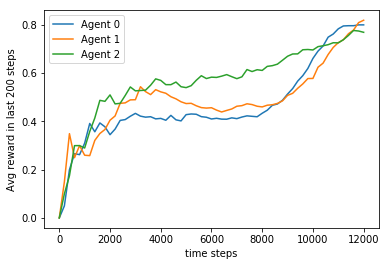

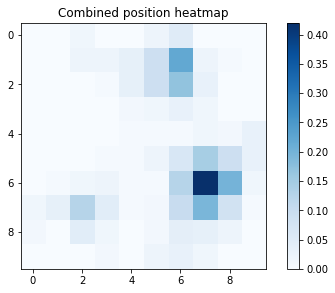

Per agent heatmaps:


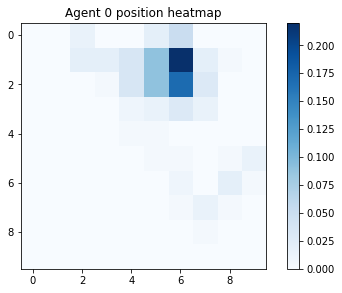

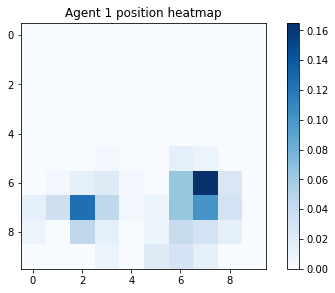

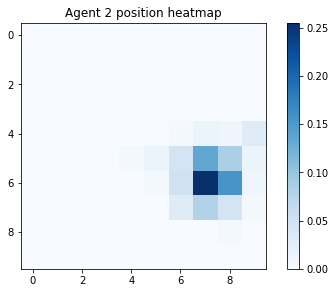

steps 12000 - 12200
gamma = 0.663854232810675
avg reward for agent 0 : 0.807310876157692
avg reward for agent 1 : 0.8392754692238341
avg reward for agent 2 : 0.7655110236865831


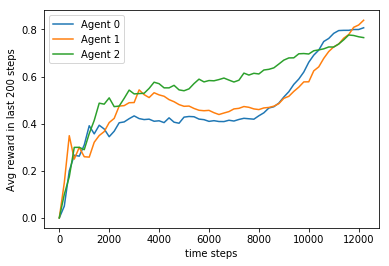

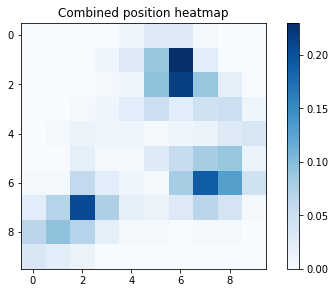

Per agent heatmaps:


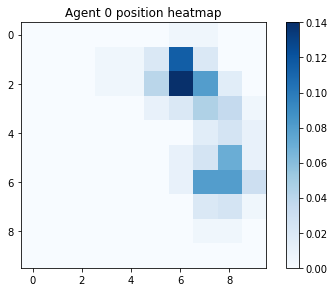

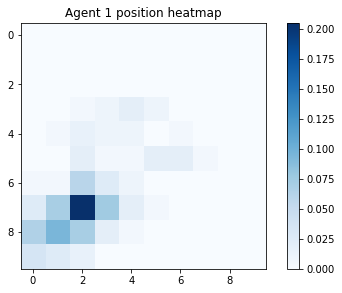

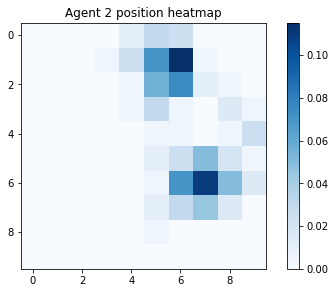

steps 12200 - 12400
gamma = 0.662527844543506
avg reward for agent 0 : 0.8209015401983711
avg reward for agent 1 : 0.8458995242319168
avg reward for agent 2 : 0.7749375050399161


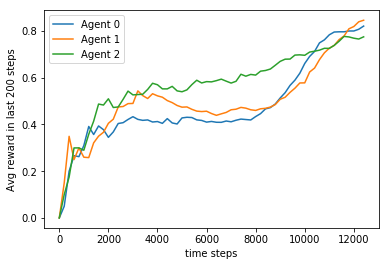

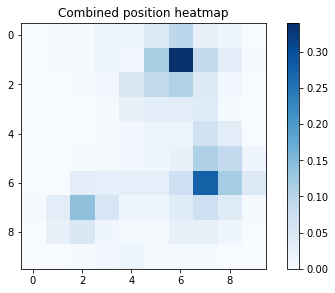

Per agent heatmaps:


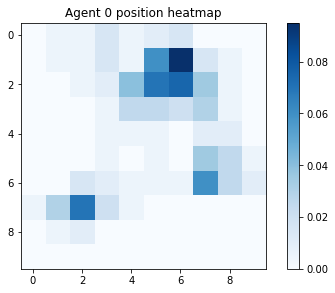

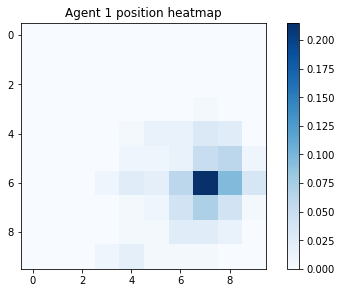

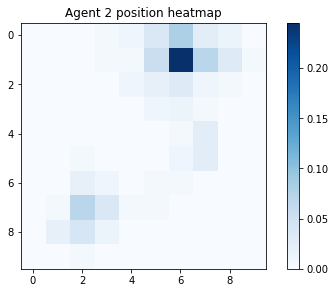

steps 12400 - 12600
gamma = 0.6612041064151005
avg reward for agent 0 : 0.8292992619633363
avg reward for agent 1 : 0.838822315689231
avg reward for agent 2 : 0.7793032299023886


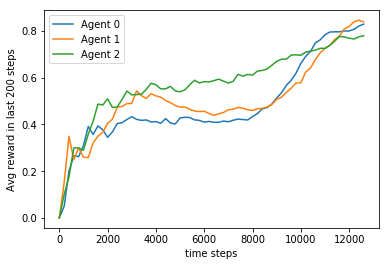

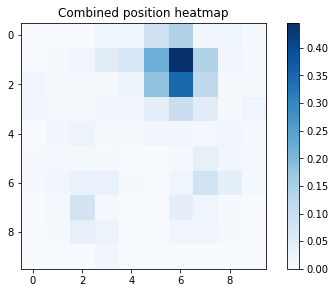

Per agent heatmaps:


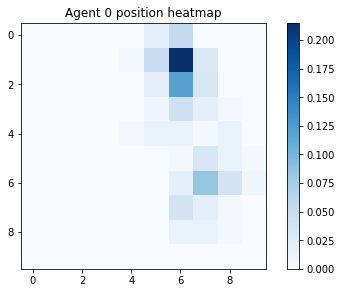

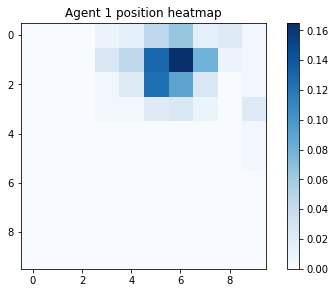

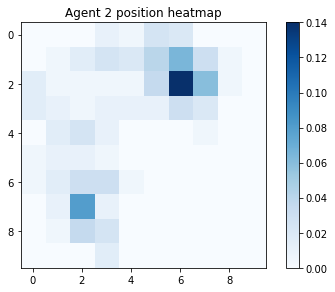

steps 12600 - 12800
gamma = 0.6598830131304493
avg reward for agent 0 : 0.8350910085149598
avg reward for agent 1 : 0.840559331302242
avg reward for agent 2 : 0.8054058276697134


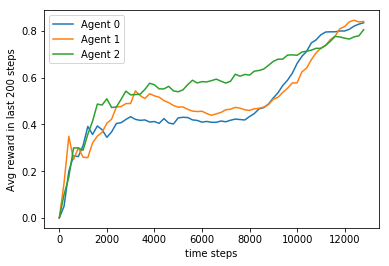

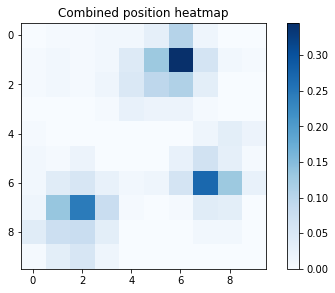

Per agent heatmaps:


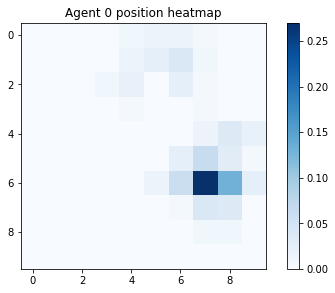

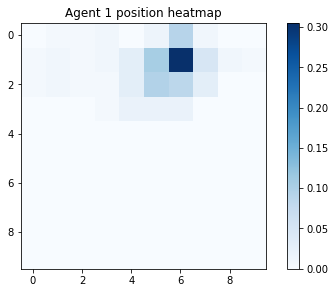

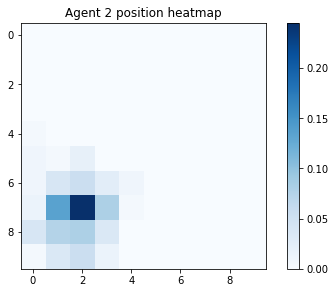

steps 12800 - 13000
gamma = 0.6585645594051264
avg reward for agent 0 : 0.8383970463810476
avg reward for agent 1 : 0.840704561187601
avg reward for agent 2 : 0.8376278747788631


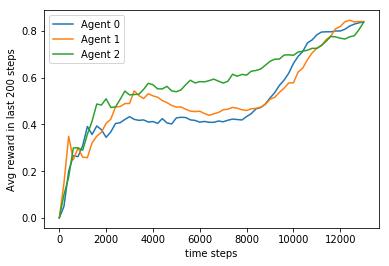

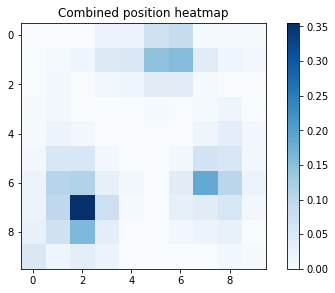

Per agent heatmaps:


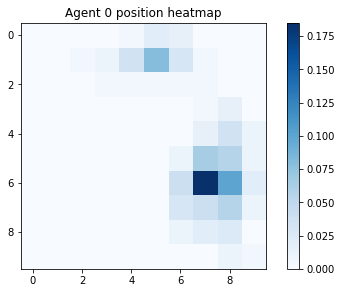

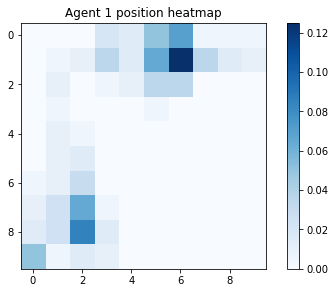

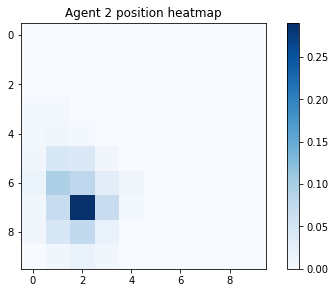

steps 13000 - 13200
gamma = 0.6572487399652622
avg reward for agent 0 : 0.8400878721308992
avg reward for agent 1 : 0.8506931293083857
avg reward for agent 2 : 0.8514506476782062


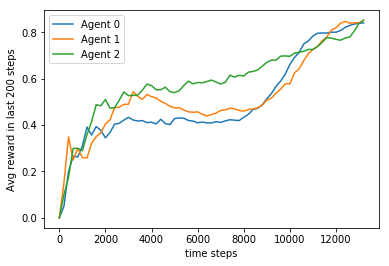

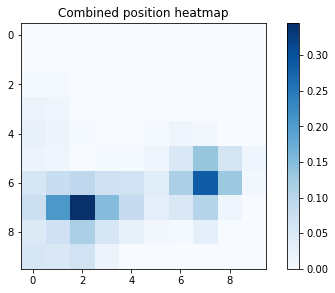

Per agent heatmaps:


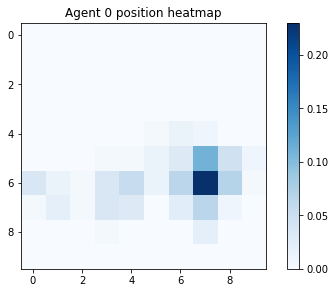

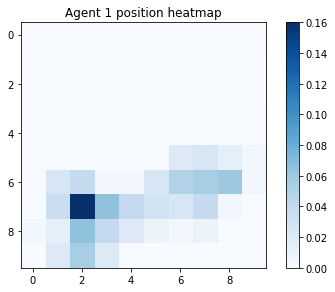

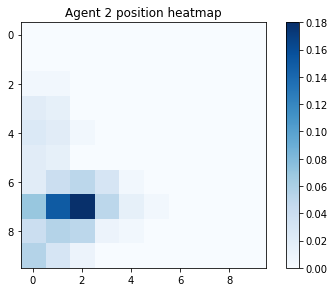

steps 13200 - 13400
gamma = 0.6559355495475241
avg reward for agent 0 : 0.8424744422058056
avg reward for agent 1 : 0.8514289978359824
avg reward for agent 2 : 0.8641146183120663


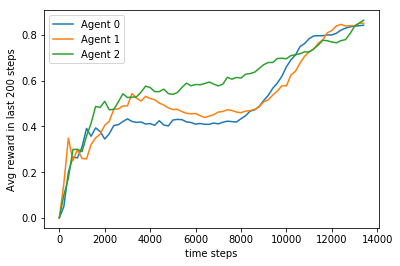

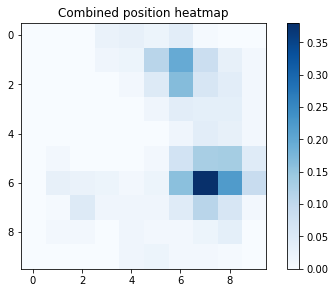

Per agent heatmaps:


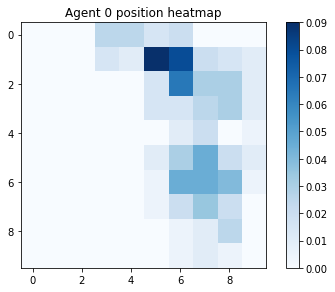

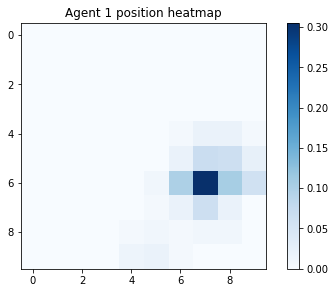

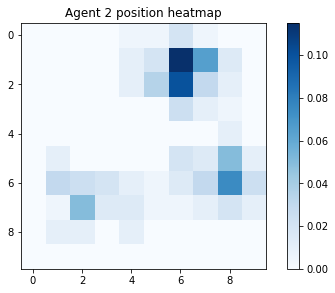

steps 13400 - 13600
gamma = 0.6546249828990969
avg reward for agent 0 : 0.8440555841482243
avg reward for agent 1 : 0.8617013454893022
avg reward for agent 2 : 0.8653775457686935


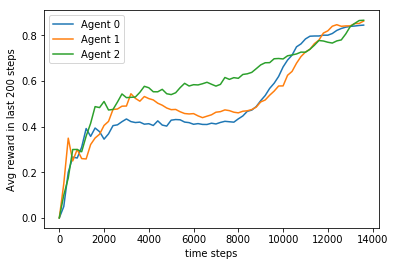

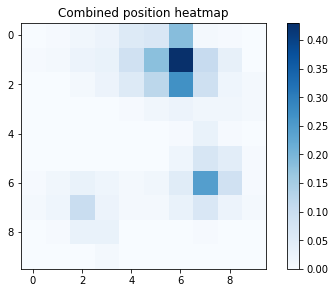

Per agent heatmaps:


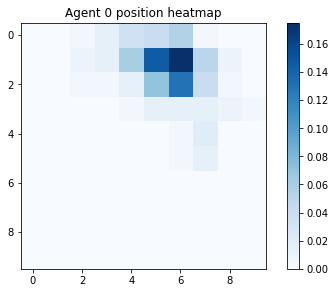

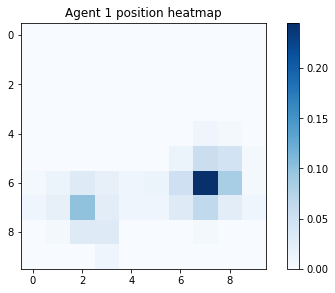

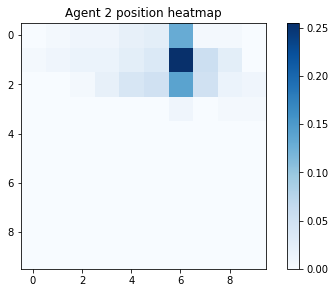

steps 13600 - 13800
gamma = 0.6533170347776592
avg reward for agent 0 : 0.8499384102601261
avg reward for agent 1 : 0.8803709876095935
avg reward for agent 2 : 0.8666038692848345


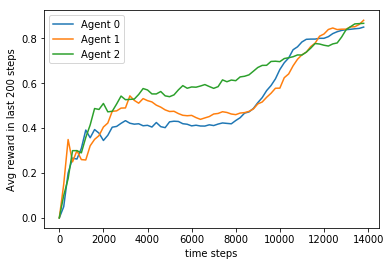

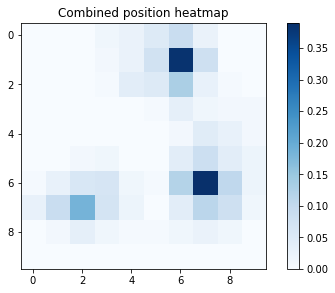

Per agent heatmaps:


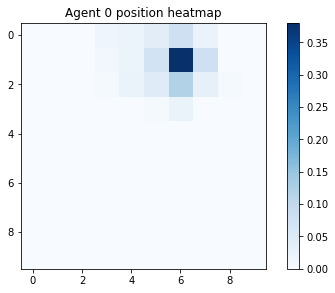

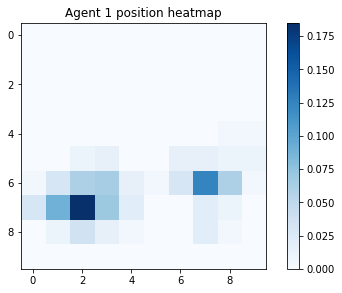

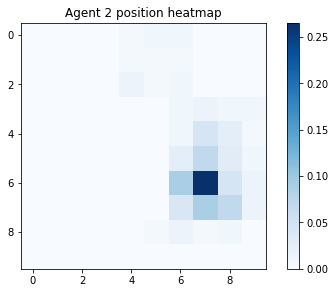

steps 13800 - 14000
gamma = 0.6520116999513645
avg reward for agent 0 : 0.8599385758160132
avg reward for agent 1 : 0.8813656167416614
avg reward for agent 2 : 0.8806513820441397


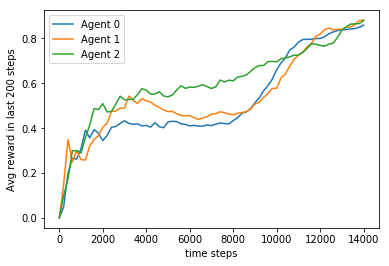

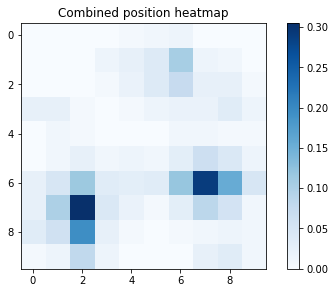

Per agent heatmaps:


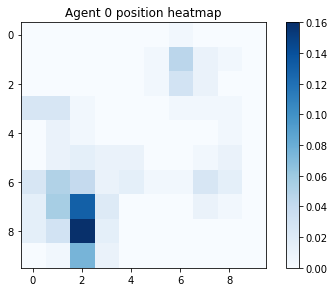

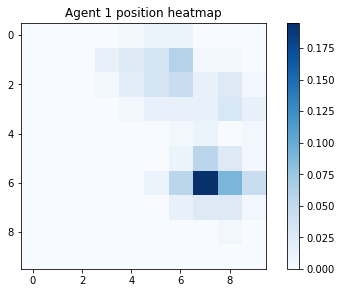

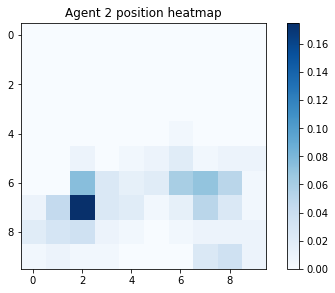

steps 14000 - 14200
gamma = 0.6507089731988203
avg reward for agent 0 : 0.8781071755510176
avg reward for agent 1 : 0.8879656362228012
avg reward for agent 2 : 0.8914865150341525


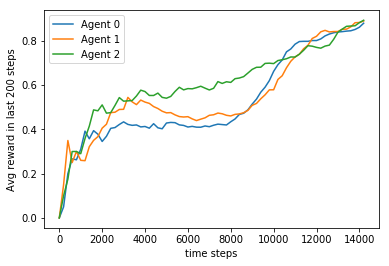

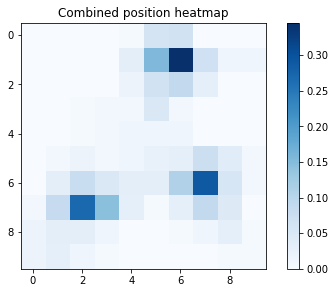

Per agent heatmaps:


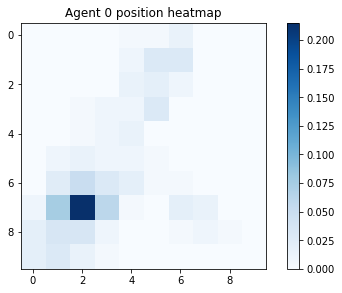

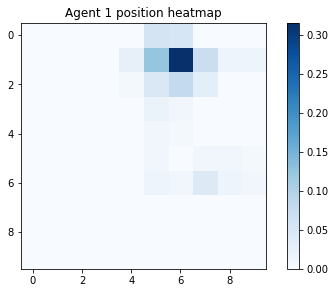

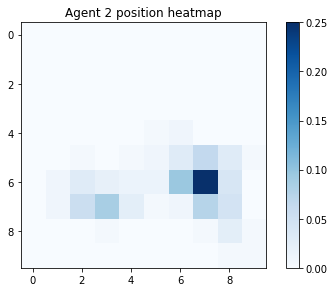

steps 14200 - 14400
gamma = 0.6494088493090642
avg reward for agent 0 : 0.874244844108048
avg reward for agent 1 : 0.888132768557739
avg reward for agent 2 : 0.9256301645719047


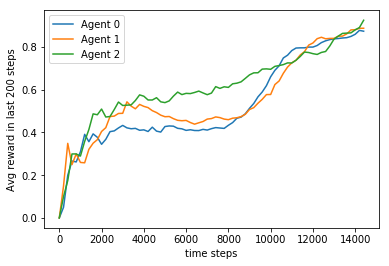

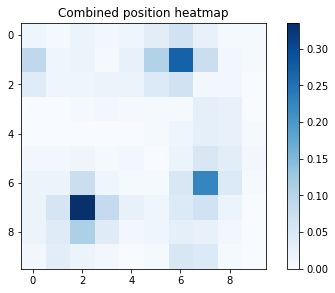

Per agent heatmaps:


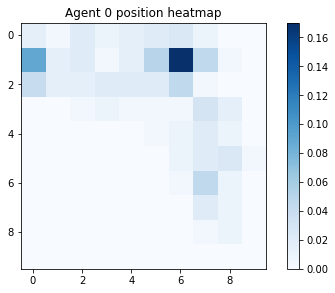

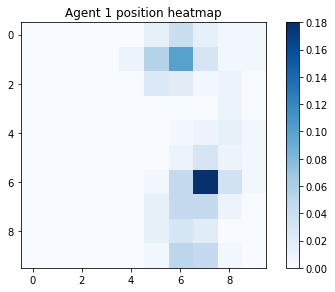

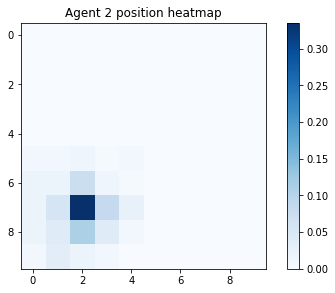

steps 14400 - 14600
gamma = 0.6481113230815481
avg reward for agent 0 : 0.8793918224779125
avg reward for agent 1 : 0.8821313608656941
avg reward for agent 2 : 0.9499349359632902


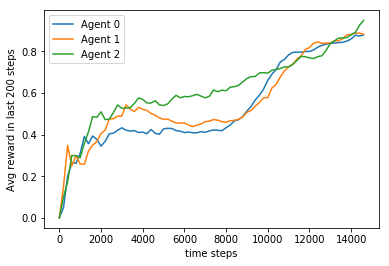

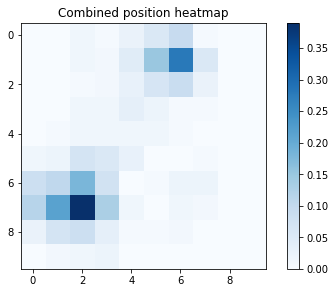

Per agent heatmaps:


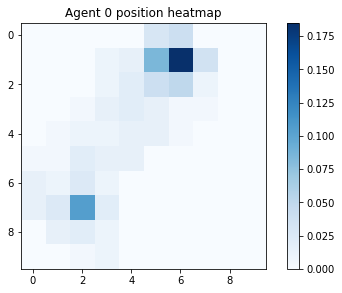

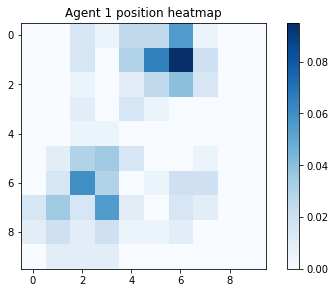

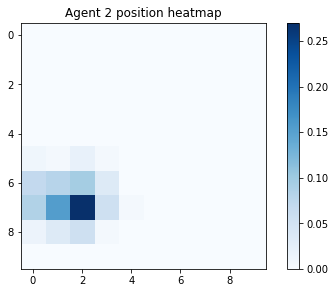

steps 14600 - 14800
gamma = 0.6468163893261138
avg reward for agent 0 : 0.8816971826227957
avg reward for agent 1 : 0.895209783122762
avg reward for agent 2 : 0.9816904263225458


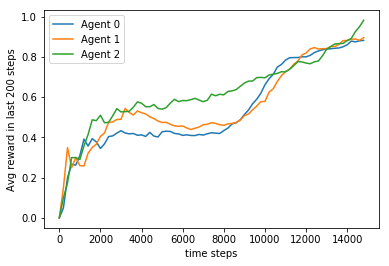

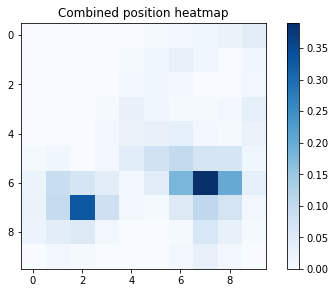

Per agent heatmaps:


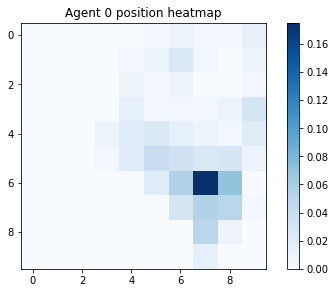

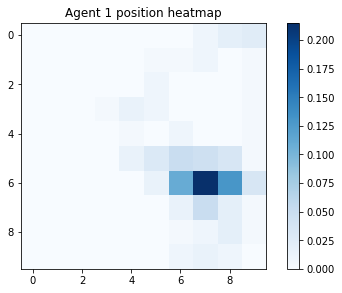

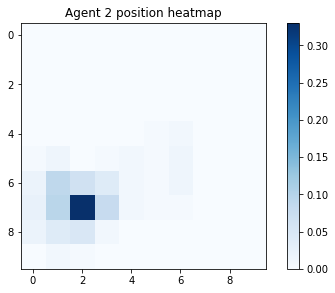

steps 14800 - 15000
gamma = 0.6455240428629712
avg reward for agent 0 : 0.8946070261982535
avg reward for agent 1 : 0.8972735150989934
avg reward for agent 2 : 0.973268448770082


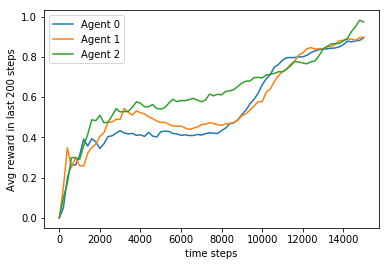

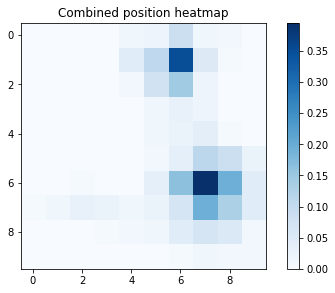

Per agent heatmaps:


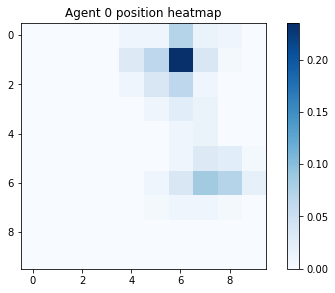

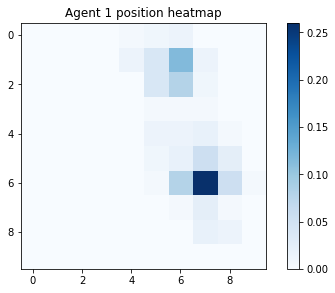

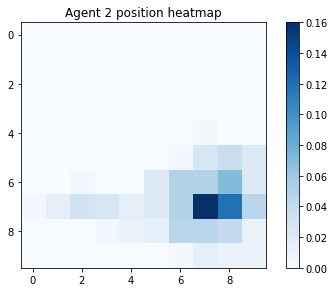

steps 15000 - 15200
gamma = 0.6442342785226814
avg reward for agent 0 : 0.9190184856259457
avg reward for agent 1 : 0.8979672389974344
avg reward for agent 2 : 0.9769094138543517


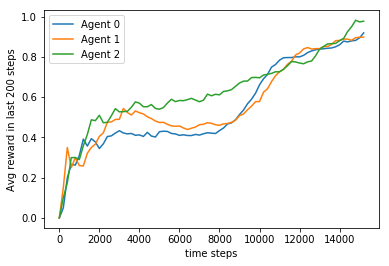

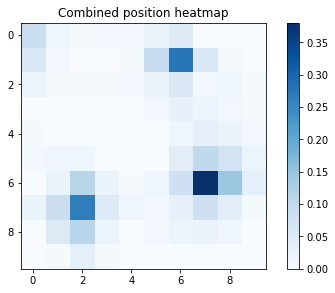

Per agent heatmaps:


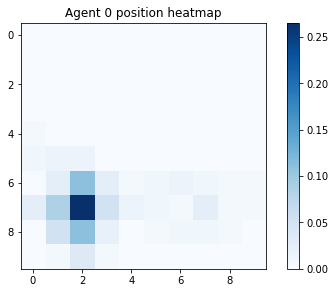

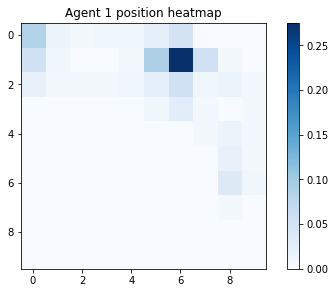

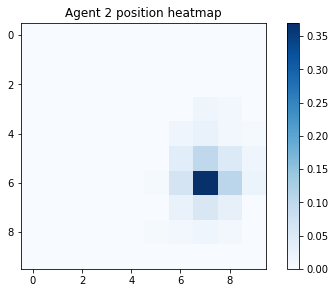

steps 15200 - 15400
gamma = 0.6429470911461355
avg reward for agent 0 : 0.9207194338029998
avg reward for agent 1 : 0.8999415622362185
avg reward for agent 2 : 0.966171027855334


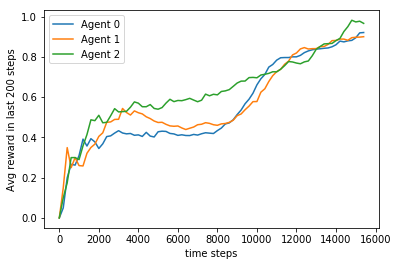

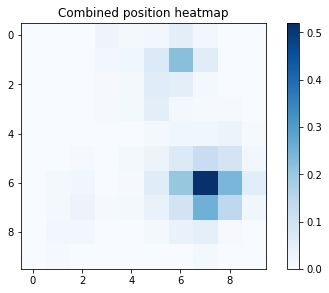

Per agent heatmaps:


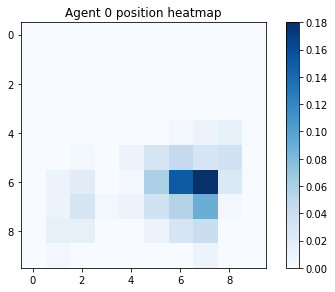

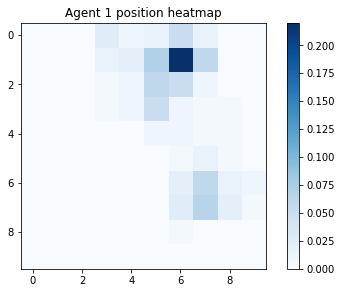

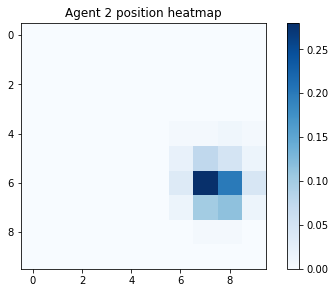

steps 15400 - 15600
gamma = 0.6416624755845289
avg reward for agent 0 : 0.9153259406448304
avg reward for agent 1 : 0.9018652650471124
avg reward for agent 2 : 0.9614768284084354


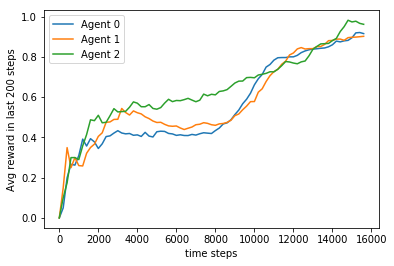

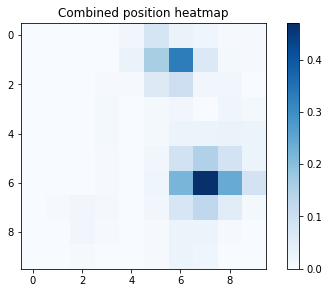

Per agent heatmaps:


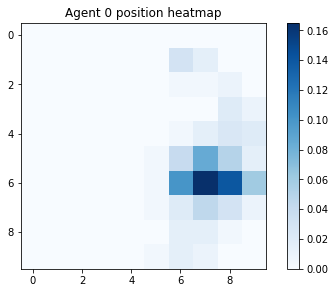

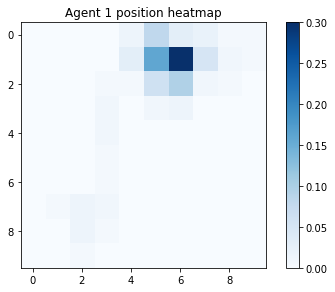

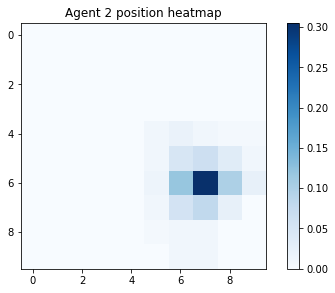

steps 15600 - 15800
gamma = 0.6403804266993471
avg reward for agent 0 : 0.9132333396620467
avg reward for agent 1 : 0.9132333396620467
avg reward for agent 2 : 0.9619644326308462


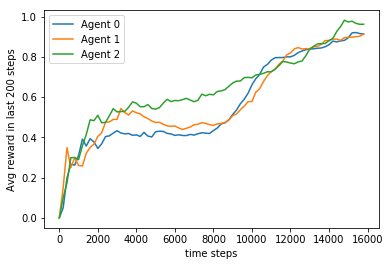

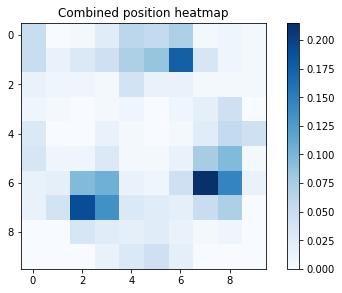

Per agent heatmaps:


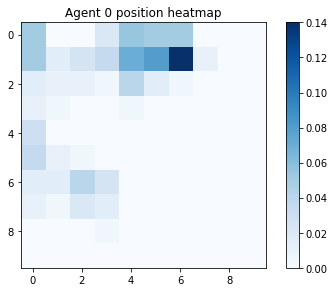

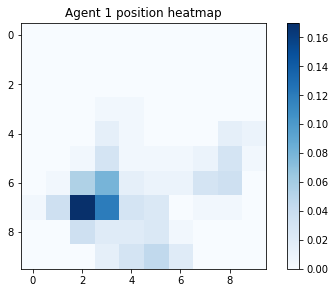

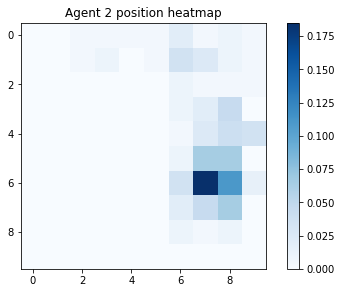

steps 15800 - 16000
gamma = 0.6391009393623417
avg reward for agent 0 : 0.9268170739328792
avg reward for agent 1 : 0.9293169176926442
avg reward for agent 2 : 0.9711893006687082


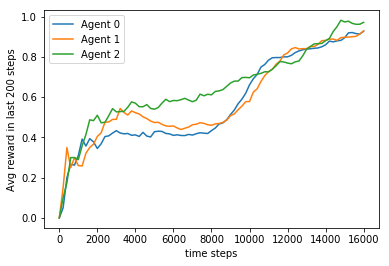

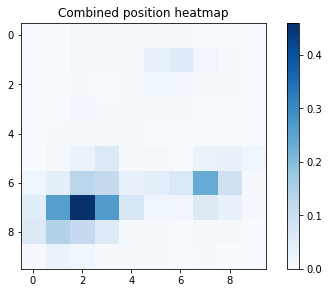

Per agent heatmaps:


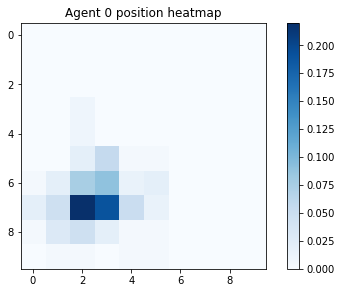

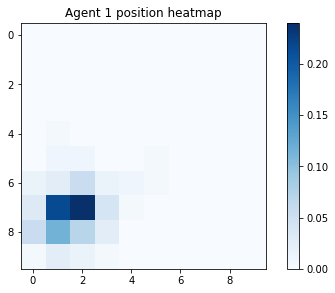

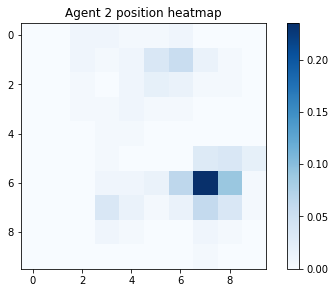

steps 16000 - 16200
gamma = 0.6378240084555099
avg reward for agent 0 : 0.9542620825874946
avg reward for agent 1 : 0.9320412320227146
avg reward for agent 2 : 0.9721622122091229


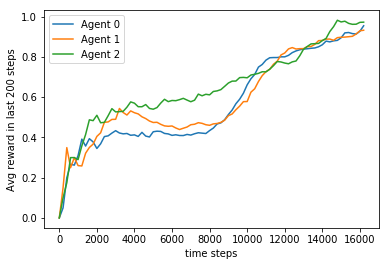

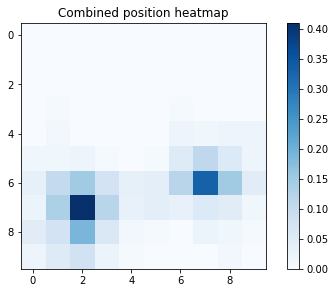

Per agent heatmaps:


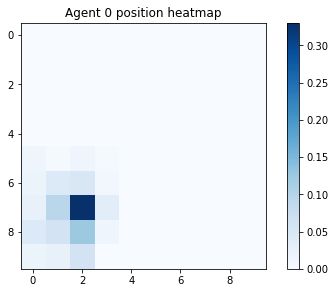

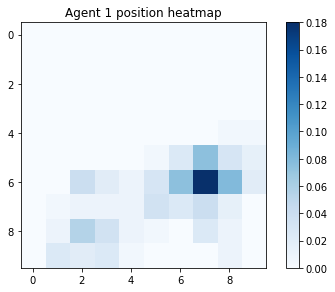

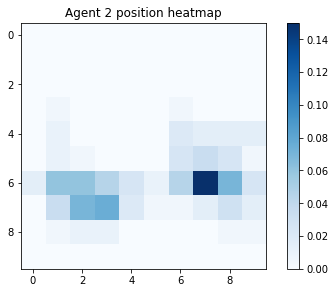

steps 16200 - 16400
gamma = 0.6365496288710755
avg reward for agent 0 : 0.9590878604963112
avg reward for agent 1 : 0.9359185415523443
avg reward for agent 2 : 0.9932321199926833


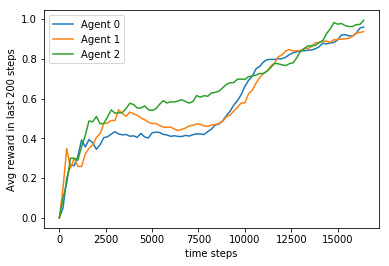

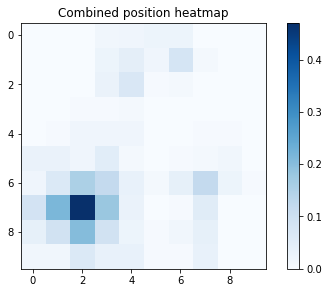

Per agent heatmaps:


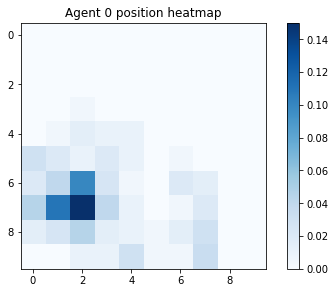

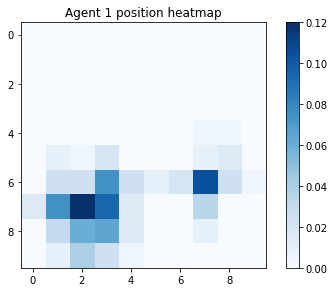

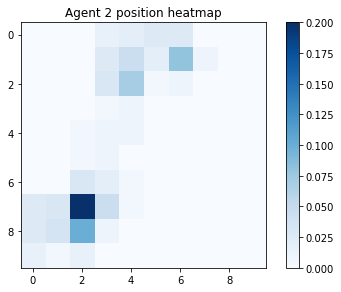

steps 16400 - 16600
gamma = 0.6352777955114686
avg reward for agent 0 : 0.9662068550087344
avg reward for agent 1 : 0.9409071742666104
avg reward for agent 2 : 0.9872899222938377


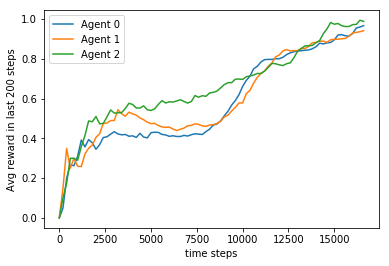

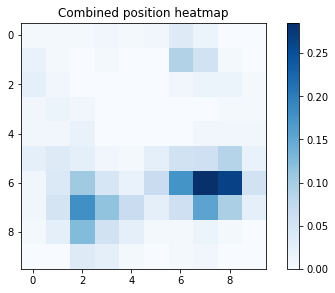

Per agent heatmaps:


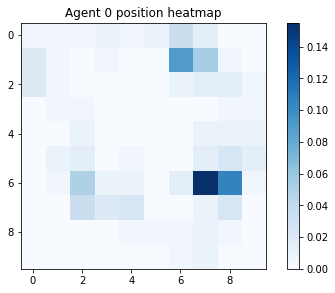

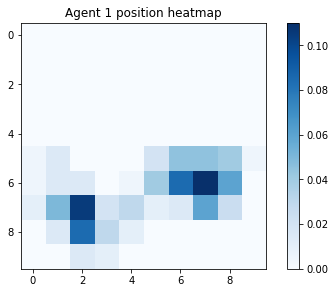

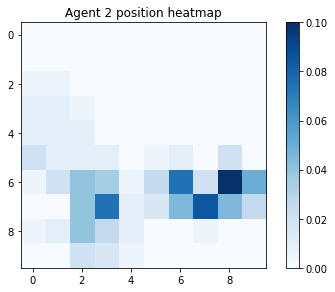

steps 16600 - 16800
gamma = 0.6340085032893017
avg reward for agent 0 : 0.9767275757395393
avg reward for agent 1 : 0.9511338610796977
avg reward for agent 2 : 0.9820843997381108


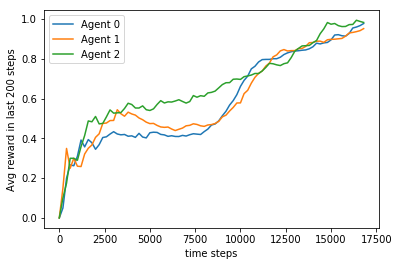

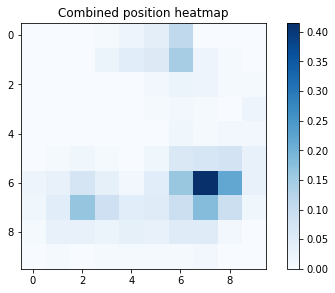

Per agent heatmaps:


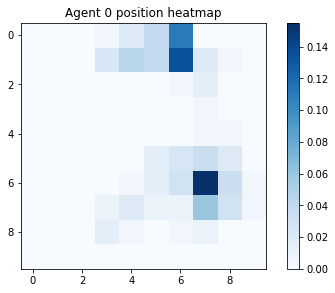

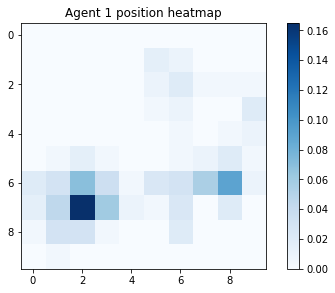

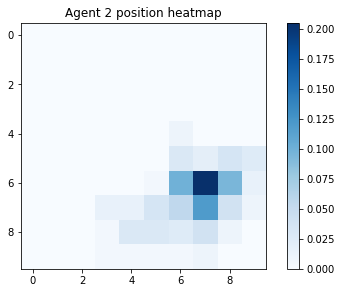

steps 16800 - 17000
gamma = 0.6327417471273538
avg reward for agent 0 : 0.9852361625786719
avg reward for agent 1 : 0.9634727368978295
avg reward for agent 2 : 0.981706958414211


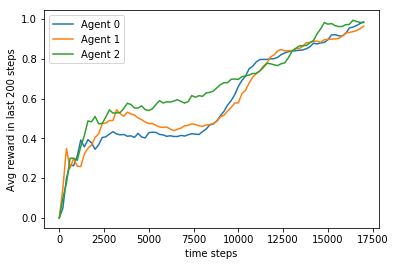

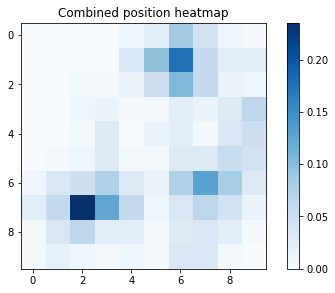

Per agent heatmaps:


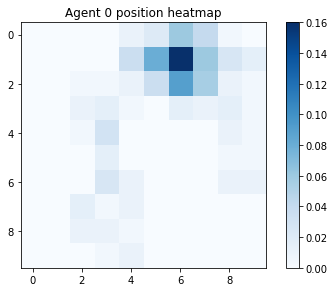

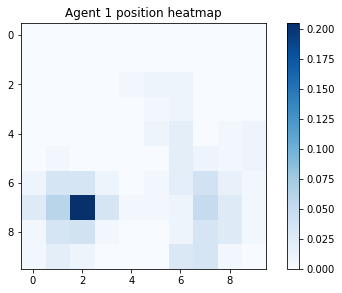

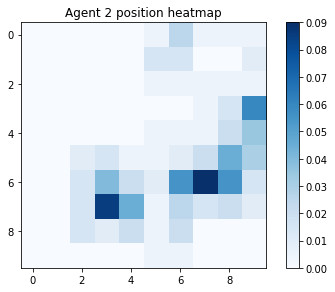

steps 17000 - 17200
gamma = 0.6314775219585474
avg reward for agent 0 : 0.9894773559676763
avg reward for agent 1 : 0.9615720016278123
avg reward for agent 2 : 0.9854078251264461


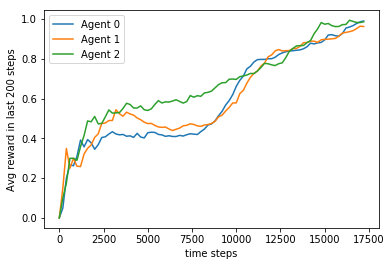

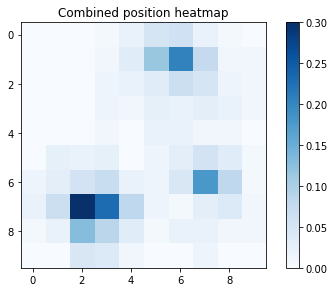

Per agent heatmaps:


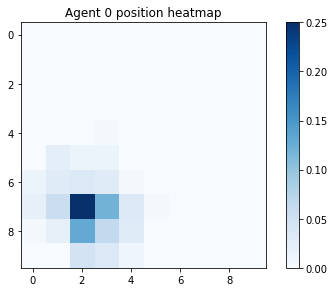

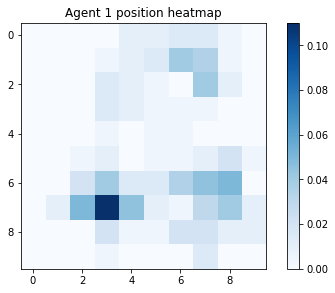

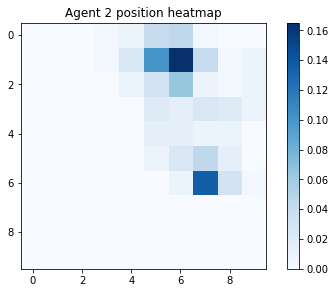

steps 17200 - 17400
gamma = 0.6302158227259311
avg reward for agent 0 : 0.9895982989483363
avg reward for agent 1 : 0.9556922015976094
avg reward for agent 2 : 0.980403425090512


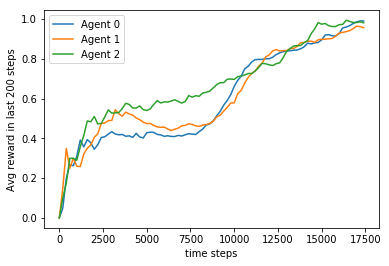

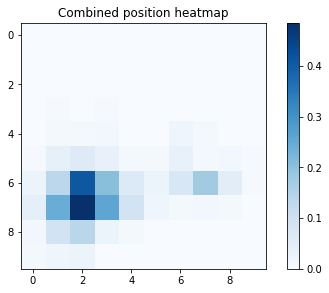

Per agent heatmaps:


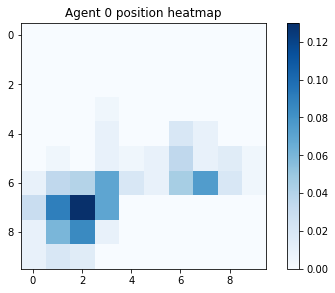

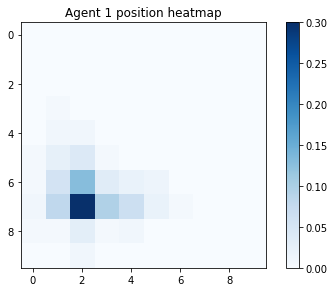

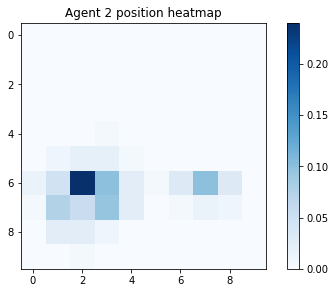

steps 17400 - 17600
gamma = 0.6289566443826539
avg reward for agent 0 : 0.9919890915288904
avg reward for agent 1 : 0.9590364183853191
avg reward for agent 2 : 0.9948298392136811


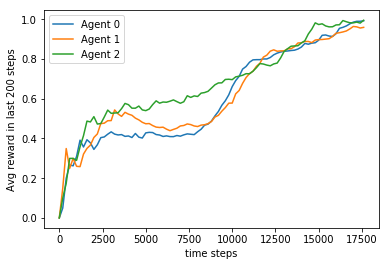

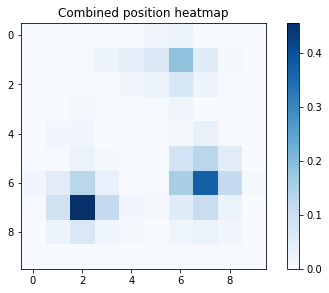

Per agent heatmaps:


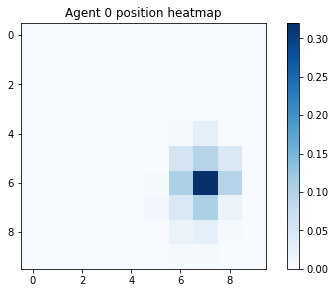

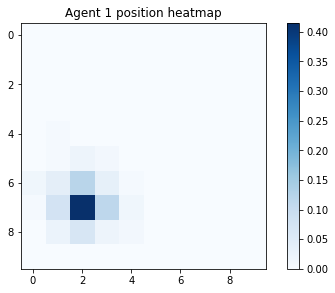

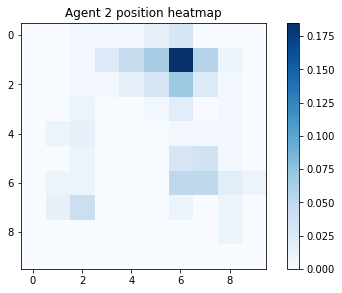

steps 17600 - 17800
gamma = 0.6276999818919518
avg reward for agent 0 : 0.9909555642941408
avg reward for agent 1 : 0.9566878265265997
avg reward for agent 2 : 1.0061232515027245


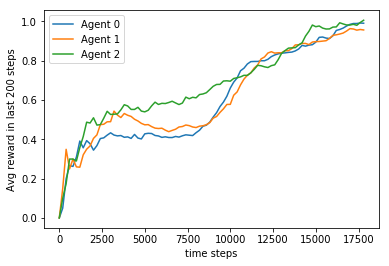

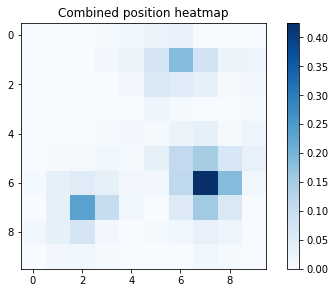

Per agent heatmaps:


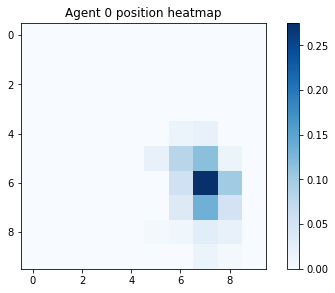

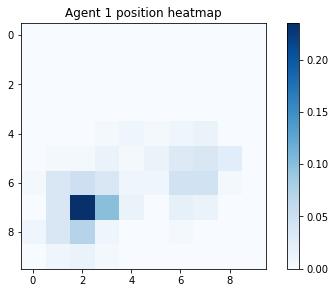

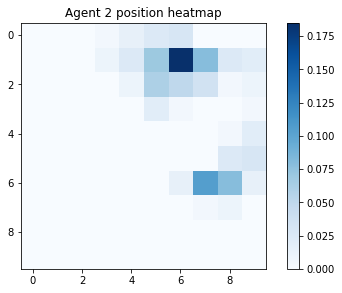

steps 17800 - 18000
gamma = 0.6264458302271231
avg reward for agent 0 : 0.9921671018276762
avg reward for agent 1 : 0.9577245708571746
avg reward for agent 2 : 1.006610743847564


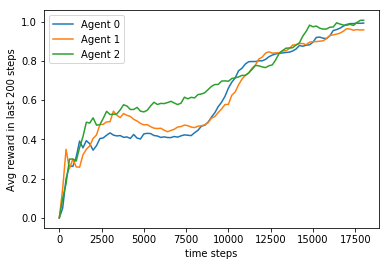

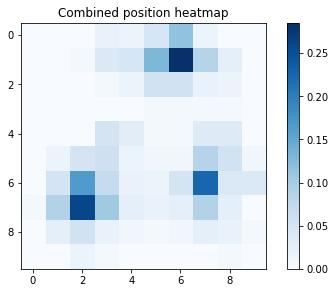

Per agent heatmaps:


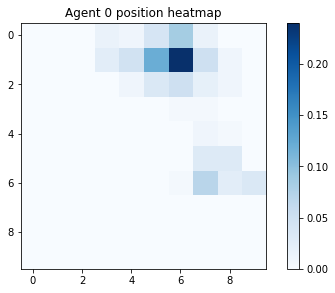

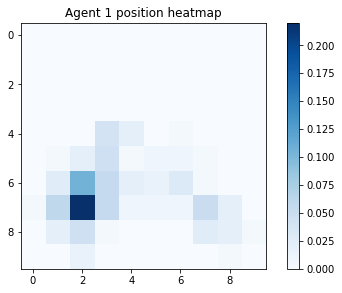

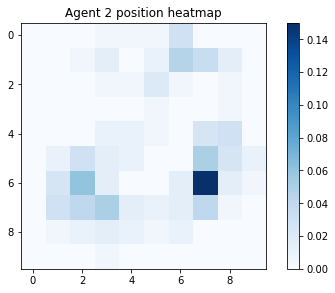

steps 18000 - 18200
gamma = 0.6251941843715076
avg reward for agent 0 : 0.9845612878413273
avg reward for agent 1 : 0.9548925883193231
avg reward for agent 2 : 0.9982967968792923


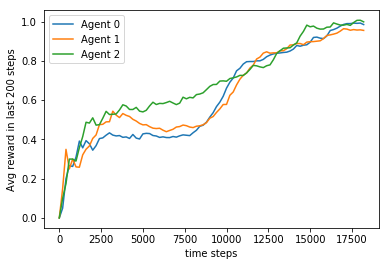

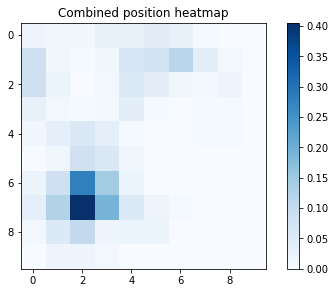

Per agent heatmaps:


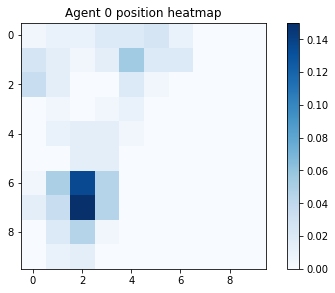

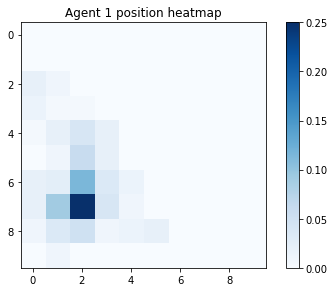

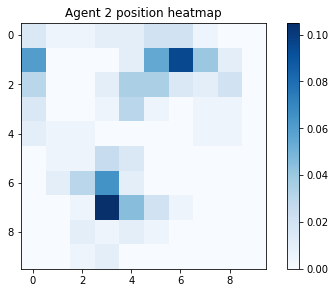

steps 18200 - 18400
gamma = 0.6239450393184713
avg reward for agent 0 : 0.9961415140481495
avg reward for agent 1 : 0.9559263083528069
avg reward for agent 2 : 1.001576001304277


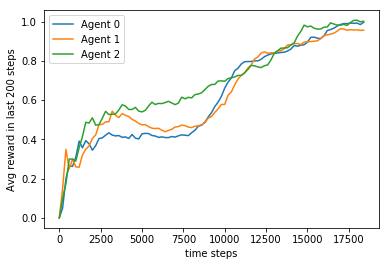

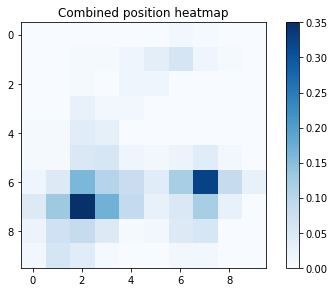

Per agent heatmaps:


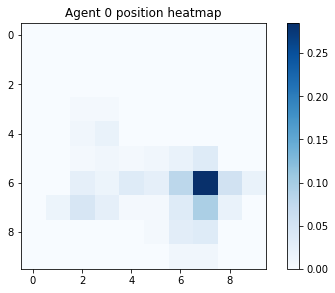

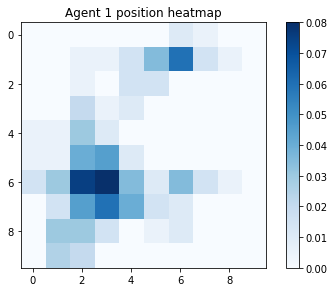

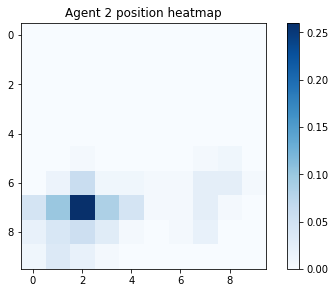

steps 18400 - 18600
gamma = 0.6226983900713835
avg reward for agent 0 : 0.9951077899037686
avg reward for agent 1 : 0.9585506155583033
avg reward for agent 2 : 1.0020966614698135


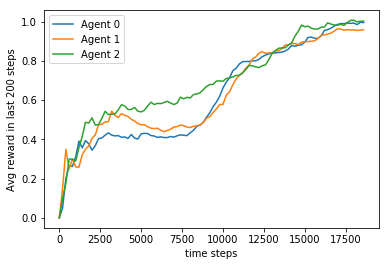

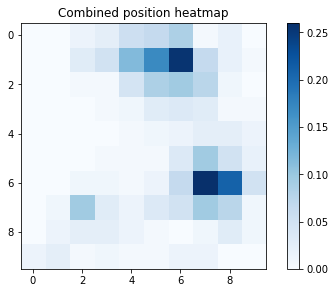

Per agent heatmaps:


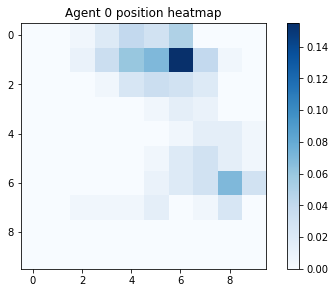

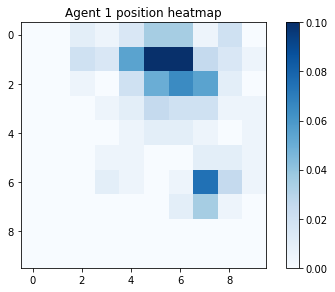

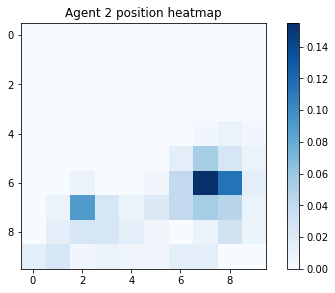

steps 18600 - 18800
gamma = 0.6214542316435928
avg reward for agent 0 : 0.9893090793042923
avg reward for agent 1 : 0.9504813573746077
avg reward for agent 2 : 1.0063294505611404


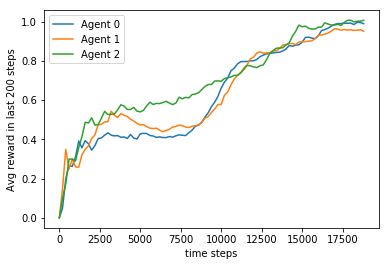

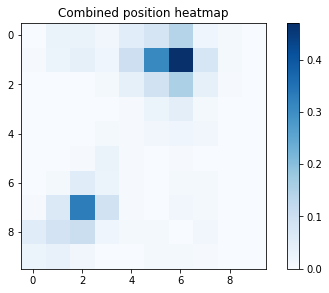

Per agent heatmaps:


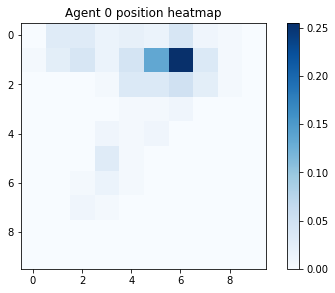

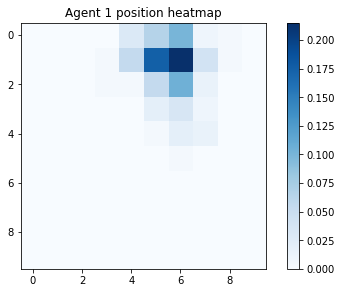

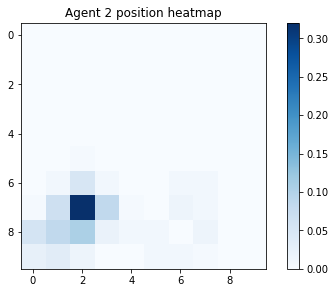

steps 18800 - 19000
gamma = 0.620212559058416
avg reward for agent 0 : 0.9910004736592811
avg reward for agent 1 : 0.9499500026314405
avg reward for agent 2 : 1.0204726067049104


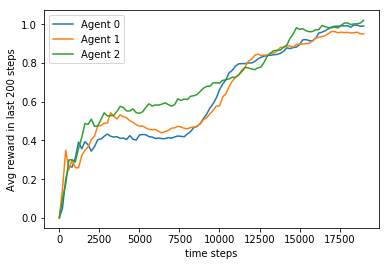

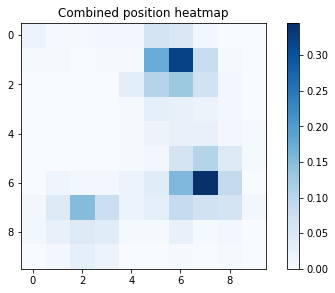

Per agent heatmaps:


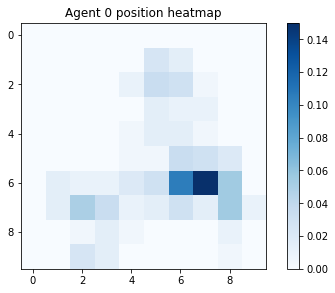

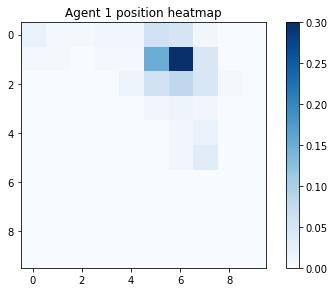

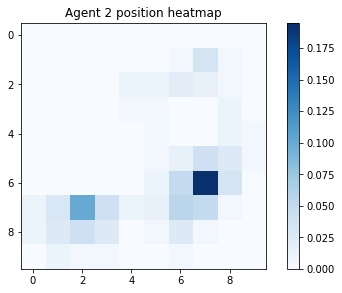

steps 19000 - 19200
gamma = 0.6189733673491118
avg reward for agent 0 : 0.993177438675069
avg reward for agent 1 : 0.949950523410239
avg reward for agent 2 : 1.018696942867559


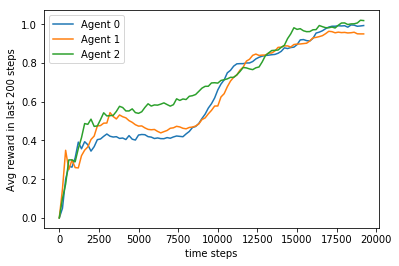

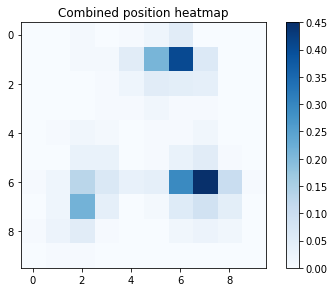

Per agent heatmaps:


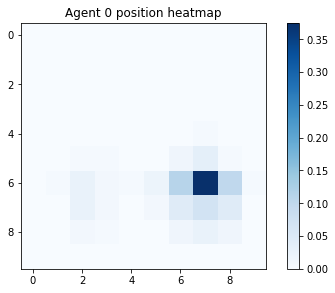

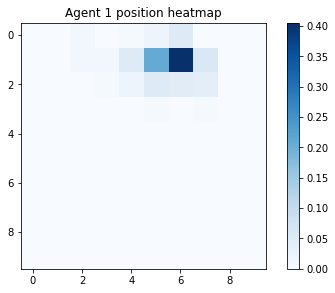

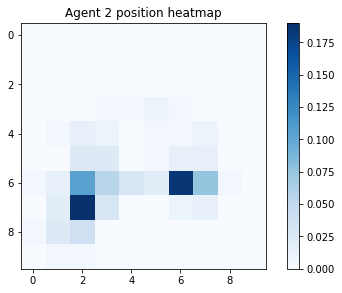

steps 19200 - 19400
gamma = 0.6177366515588611
avg reward for agent 0 : 0.9932477707334674
avg reward for agent 1 : 0.9499510334518839
avg reward for agent 2 : 1.0210813875573423


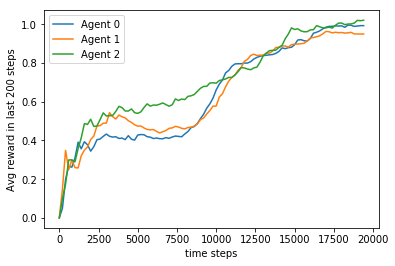

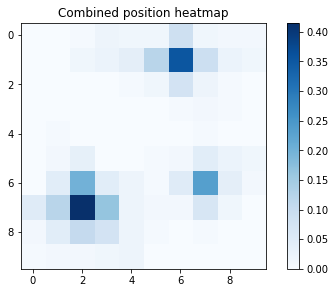

Per agent heatmaps:


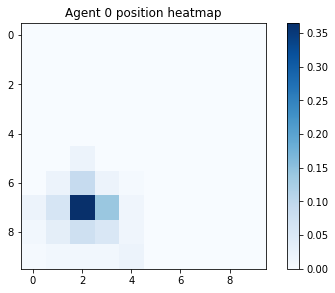

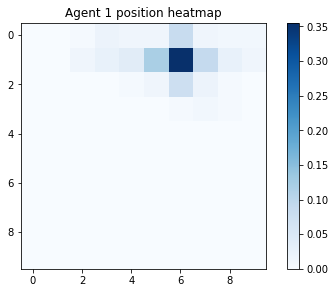

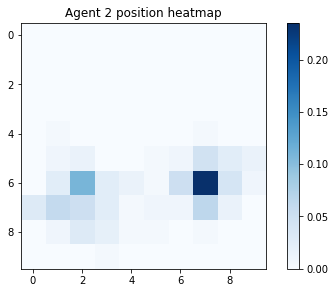

steps 19400 - 19600
gamma = 0.6165024067407494
avg reward for agent 0 : 0.9871945308912811
avg reward for agent 1 : 0.9458701086679251
avg reward for agent 2 : 1.017805214019693


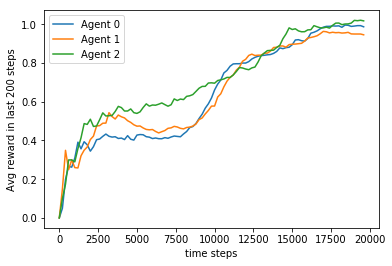

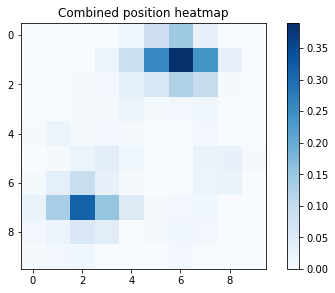

Per agent heatmaps:


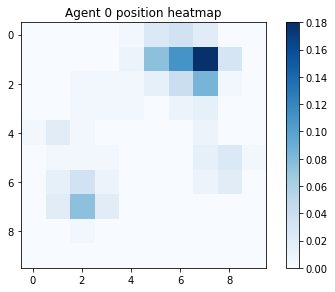

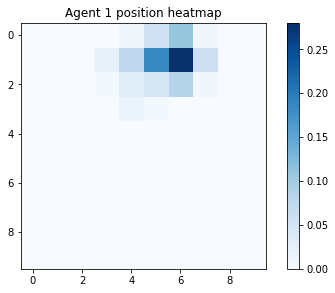

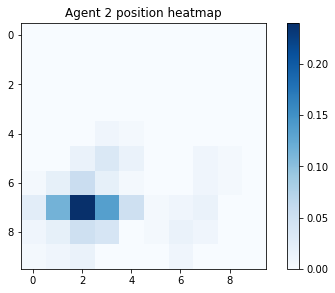

steps 19600 - 19800
gamma = 0.615270627957747
avg reward for agent 0 : 0.990354022524115
avg reward for agent 1 : 0.9484369476289076
avg reward for agent 2 : 1.0161102974597243


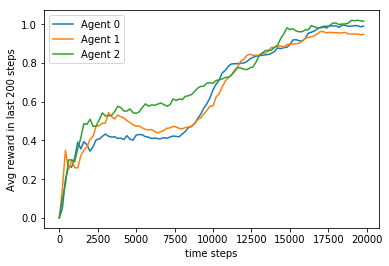

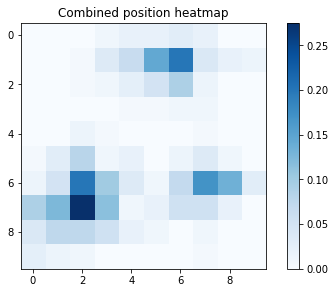

Per agent heatmaps:


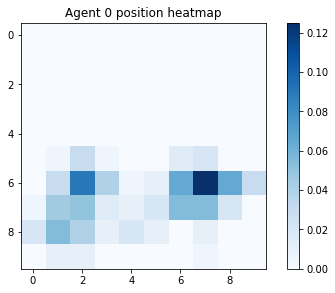

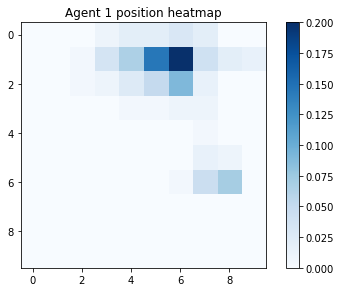

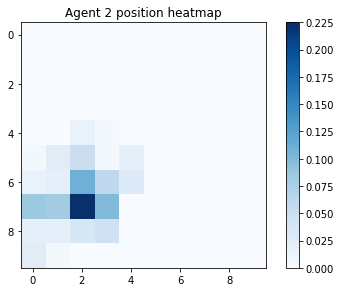

steps 19800 - 20000
gamma = 0.6140413102826882
avg reward for agent 0 : 0.9894505274736263
avg reward for agent 1 : 0.9494525273736313
avg reward for agent 2 : 1.0164491775411229


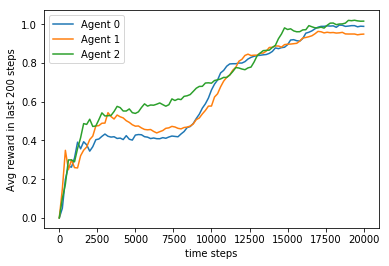

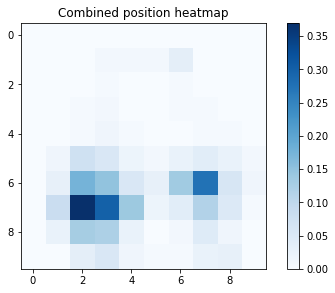

Per agent heatmaps:


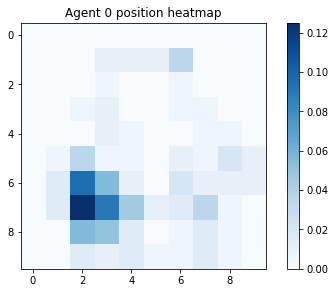

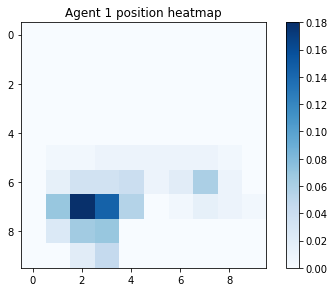

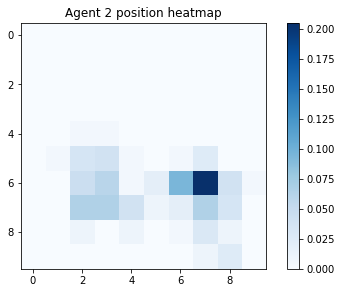

steps 20000 - 20200
gamma = 0.6128144487982505
avg reward for agent 0 : 0.9954952725112618
avg reward for agent 1 : 0.9450027226374932
avg reward for agent 2 : 1.0098509974753724


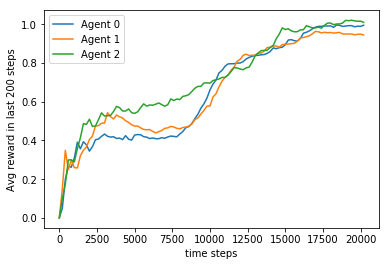

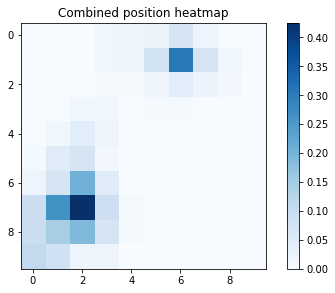

Per agent heatmaps:


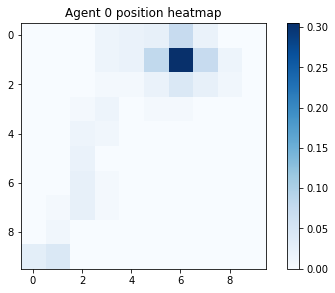

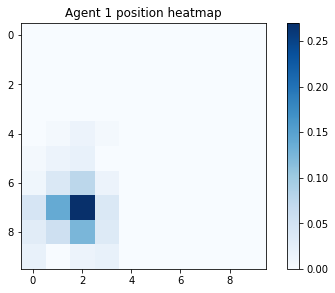

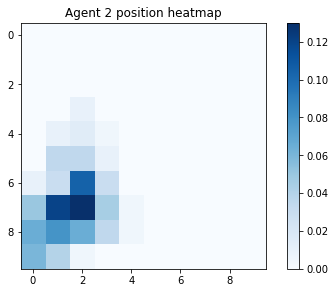

steps 20200 - 20400
gamma = 0.6115900385969388
avg reward for agent 0 : 0.9916180579383364
avg reward for agent 1 : 0.9631880790157346
avg reward for agent 2 : 1.004852703298858


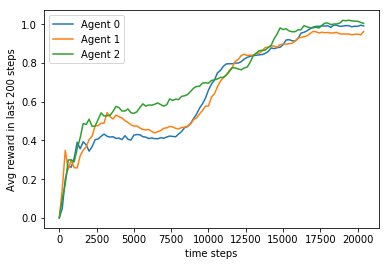

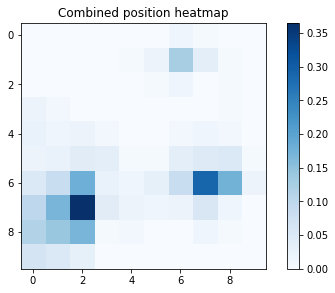

Per agent heatmaps:


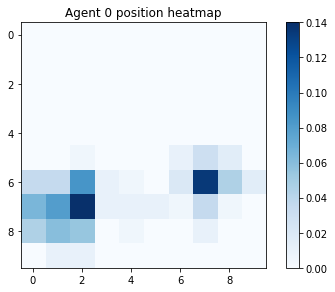

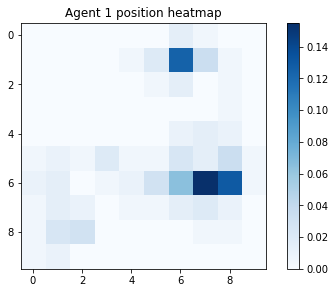

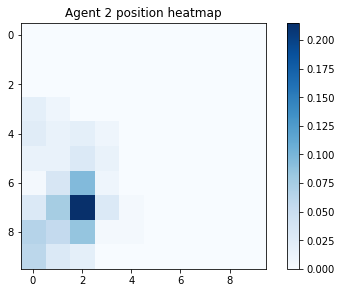

steps 20400 - 20600
gamma = 0.6103680747810605
avg reward for agent 0 : 0.9907286054075045
avg reward for agent 1 : 0.9620892189699529
avg reward for agent 2 : 1.0048055919615553


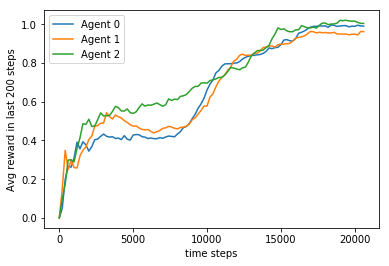

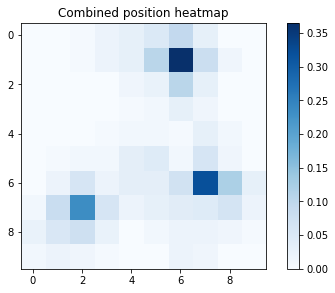

Per agent heatmaps:


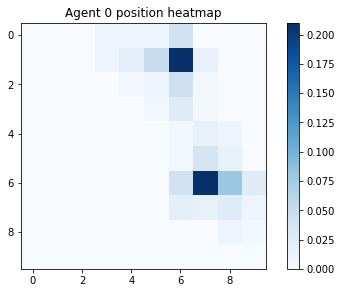

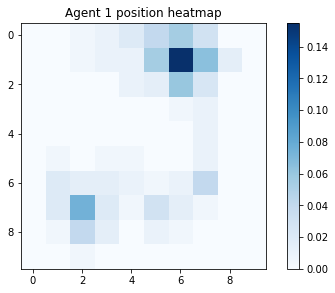

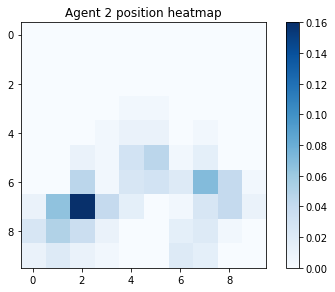

steps 20600 - 20800
gamma = 0.6091485524627095
avg reward for agent 0 : 0.9869717802028749
avg reward for agent 1 : 0.9662996971299457
avg reward for agent 2 : 1.0033171482140282


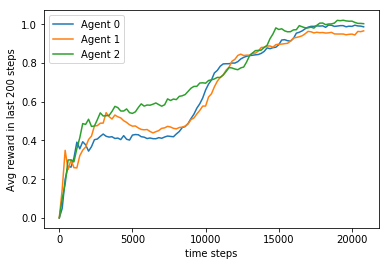

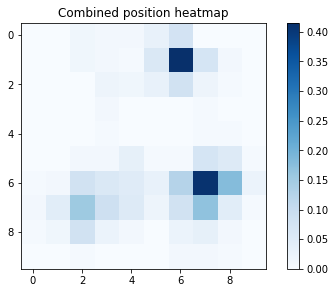

Per agent heatmaps:


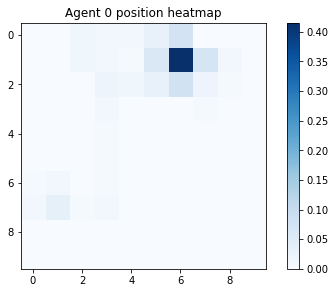

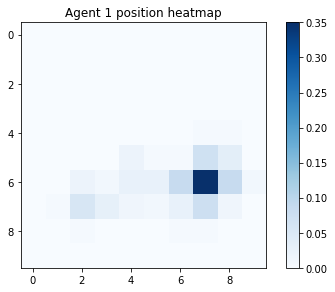

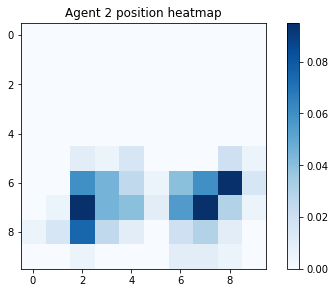

steps 20800 - 21000
gamma = 0.6079314667637473
avg reward for agent 0 : 0.9875720203799819
avg reward for agent 1 : 0.9656683015094519
avg reward for agent 2 : 0.9961430408075805


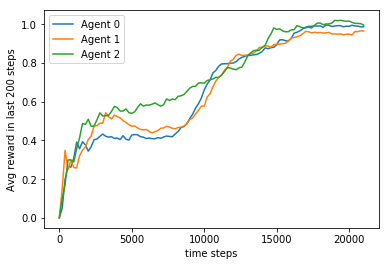

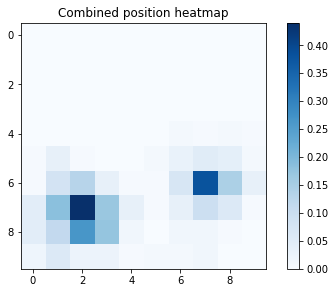

Per agent heatmaps:


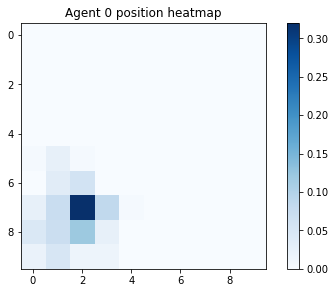

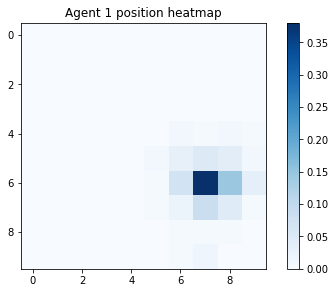

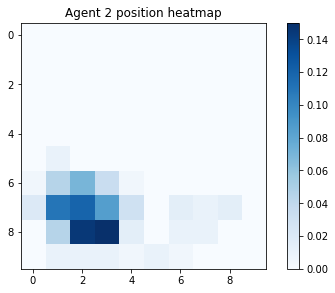

steps 21000 - 21200
gamma = 0.6067168128157802
avg reward for agent 0 : 0.9876892599405689
avg reward for agent 1 : 0.9626904391302297
avg reward for agent 2 : 1.0027828875996416


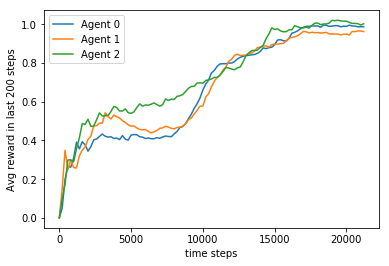

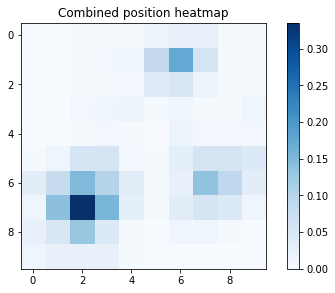

Per agent heatmaps:


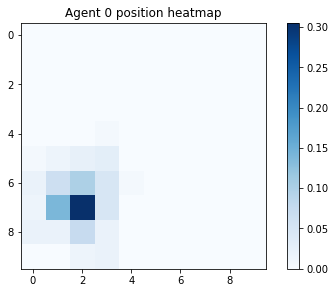

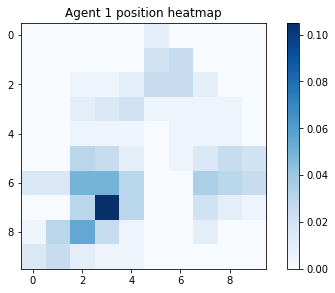

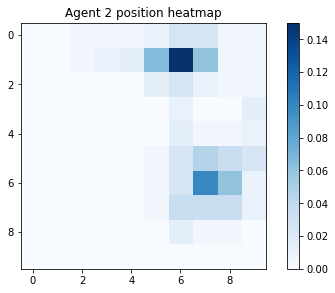

steps 21200 - 21400
gamma = 0.6055045857601424
avg reward for agent 0 : 0.9859352366711835
avg reward for agent 1 : 0.9639736460913041
avg reward for agent 2 : 0.9957478622494276


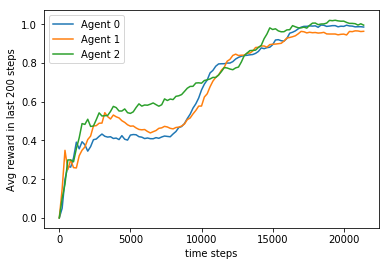

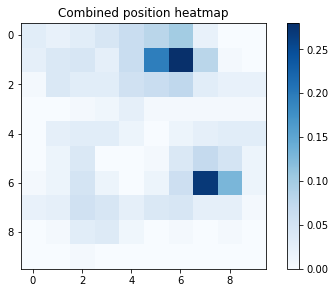

Per agent heatmaps:


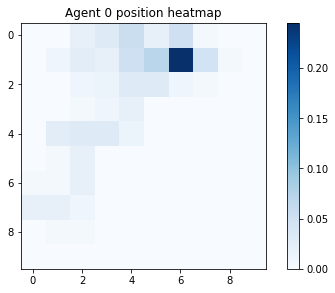

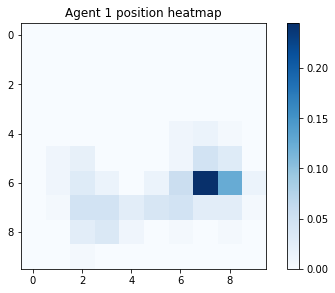

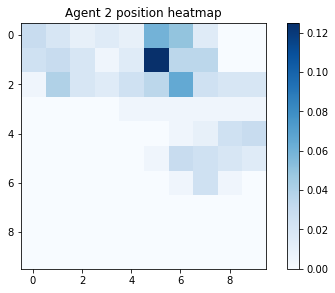

steps 21400 - 21600
gamma = 0.6042947807478748
avg reward for agent 0 : 0.9814360446275635
avg reward for agent 1 : 0.9666219156520531
avg reward for agent 2 : 0.9934725244201658


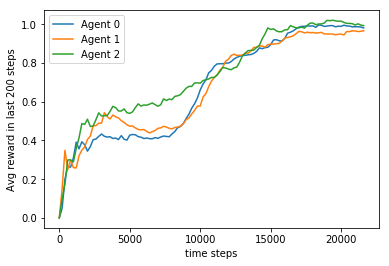

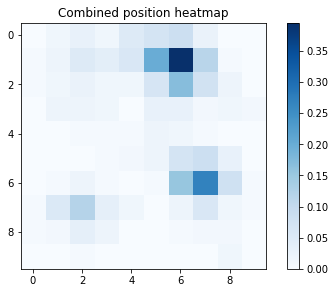

Per agent heatmaps:


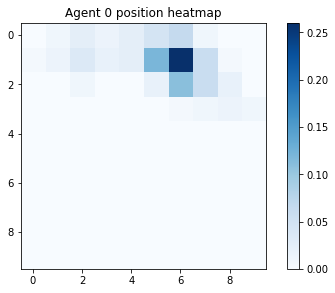

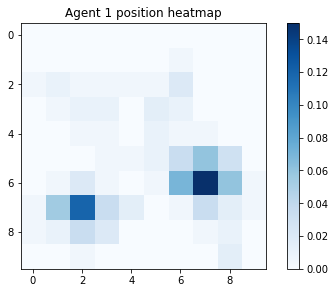

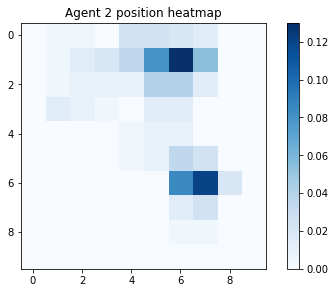

steps 21600 - 21800
gamma = 0.6030873929397084
avg reward for agent 0 : 0.9765607082243933
avg reward for agent 1 : 0.960965093344342
avg reward for agent 2 : 0.9926150176597404


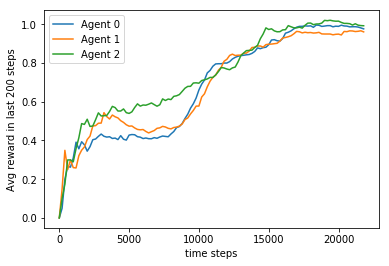

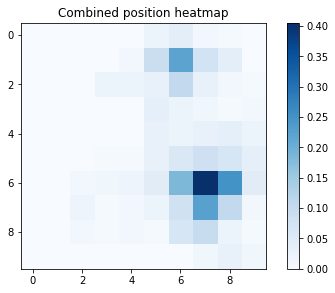

Per agent heatmaps:


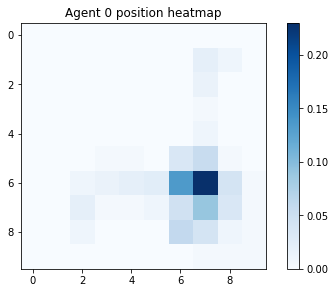

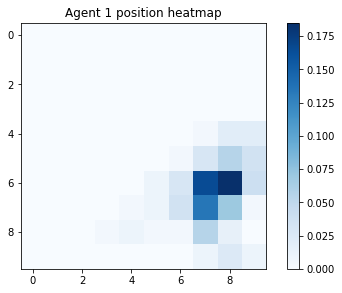

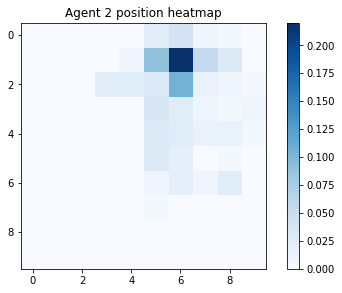

steps 21800 - 22000
gamma = 0.6018824175060412
avg reward for agent 0 : 0.9849552293077587
avg reward for agent 1 : 0.9608654152083996
avg reward for agent 2 : 0.9895004772510341


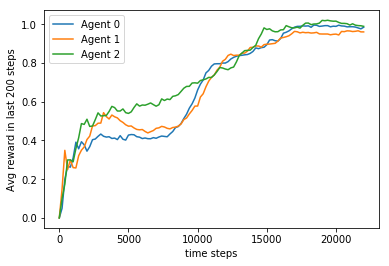

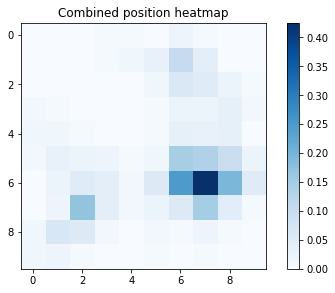

Per agent heatmaps:


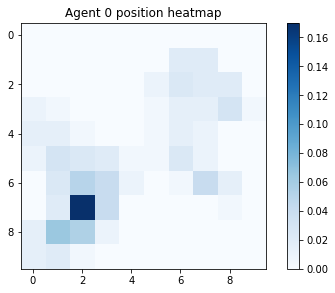

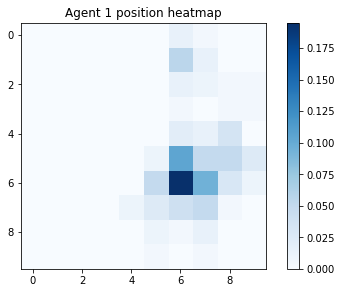

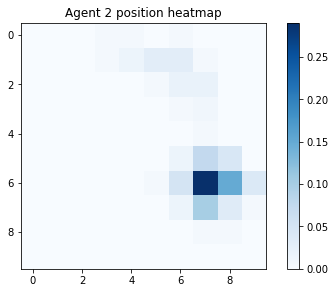

steps 22000 - 22200
gamma = 0.6006798496269223
avg reward for agent 0 : 0.9931985045718661
avg reward for agent 1 : 0.9612179631548129
avg reward for agent 2 : 0.9823881807125805


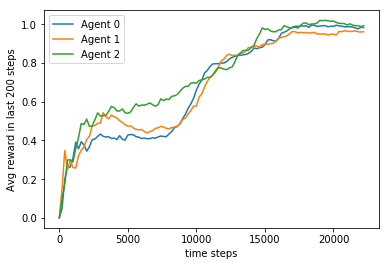

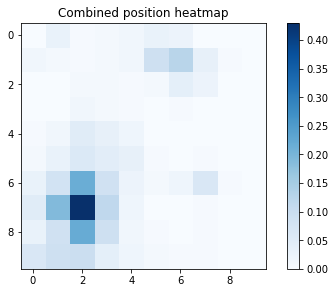

Per agent heatmaps:


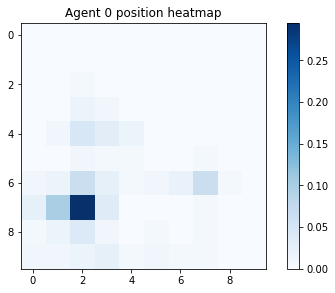

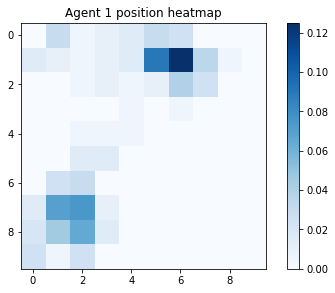

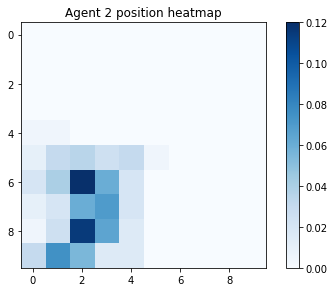

steps 22200 - 22400
gamma = 0.59947968449203
avg reward for agent 0 : 1.0008481764206956
avg reward for agent 1 : 0.9593321726708629
avg reward for agent 2 : 0.9820990134369001


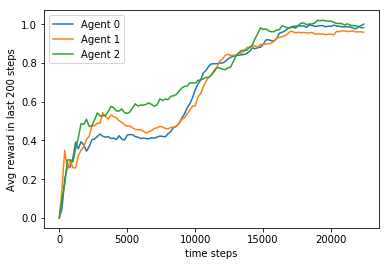

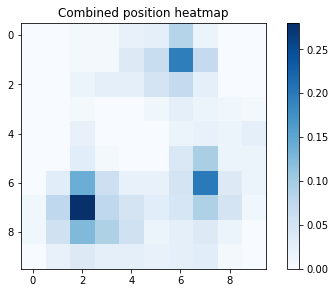

Per agent heatmaps:


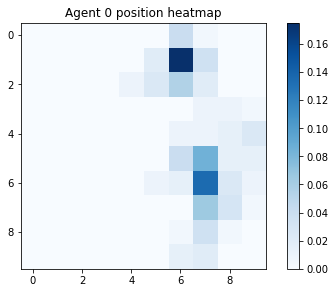

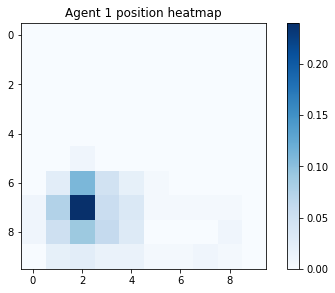

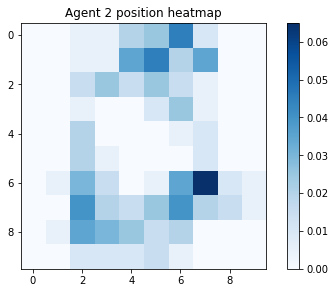

steps 22400 - 22600
gamma = 0.5982819173006552
avg reward for agent 0 : 0.9973010043803372
avg reward for agent 1 : 0.9570372992345472
avg reward for agent 2 : 0.9813725056413433


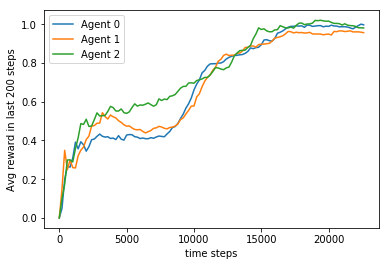

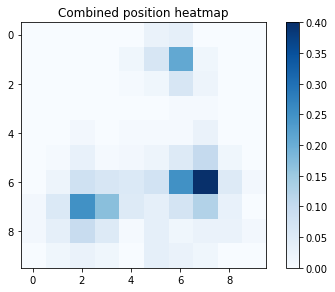

Per agent heatmaps:


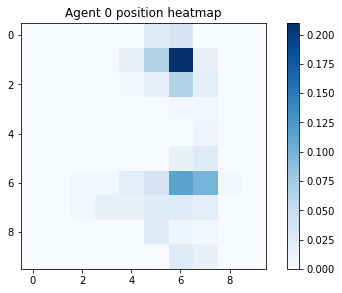

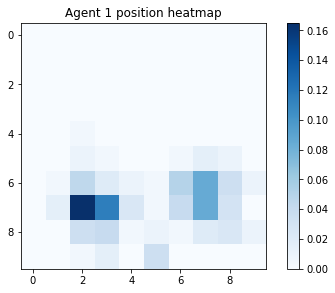

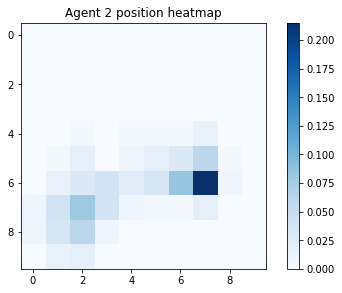

steps 22600 - 22800
gamma = 0.5970865432616781
avg reward for agent 0 : 1.0017104512959958
avg reward for agent 1 : 0.9560984167361081
avg reward for agent 2 : 0.9815358975483531


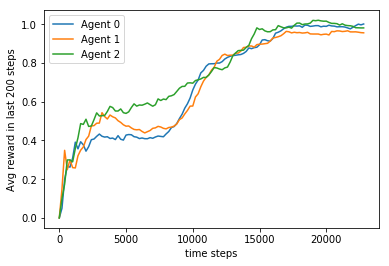

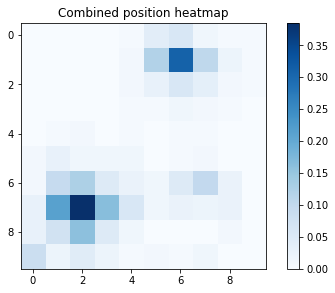

Per agent heatmaps:


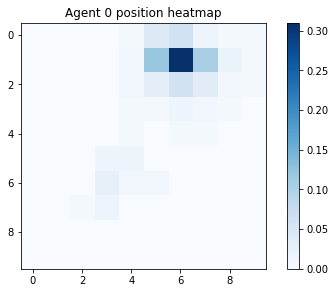

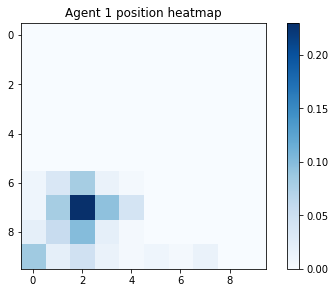

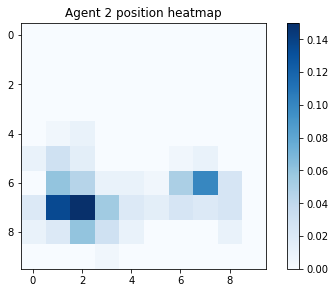

steps 22800 - 23000
gamma = 0.5958935575935543
avg reward for agent 0 : 1.003434633276814
avg reward for agent 1 : 0.9521325159775662
avg reward for agent 2 : 0.9734359375679318


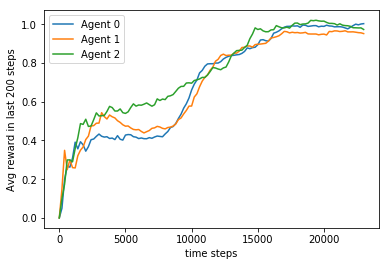

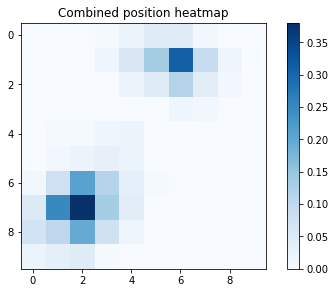

Per agent heatmaps:


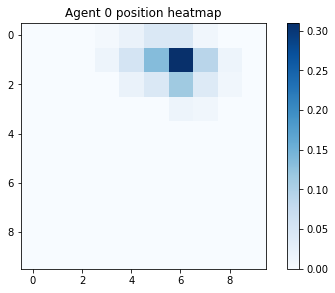

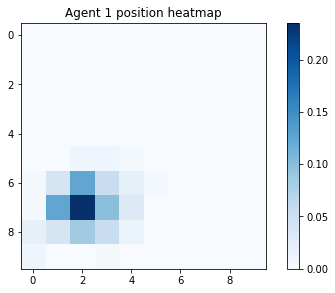

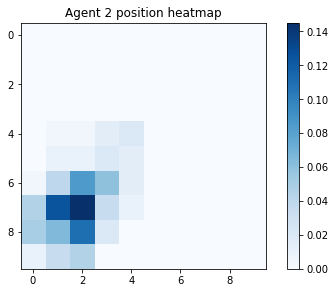

steps 23000 - 23200
gamma = 0.5947029555242908
avg reward for agent 0 : 1.000818930218525
avg reward for agent 1 : 0.9512521012025343
avg reward for agent 2 : 0.9684927373820094


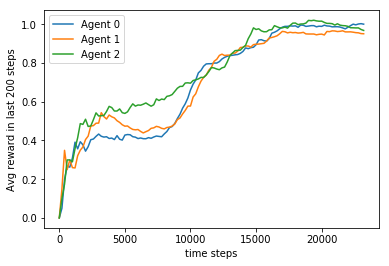

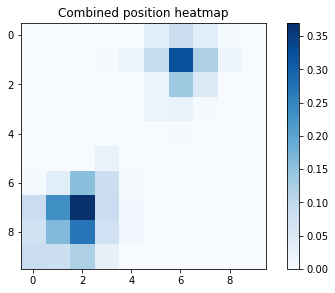

Per agent heatmaps:


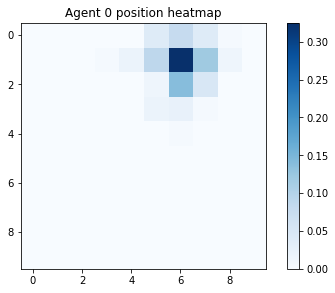

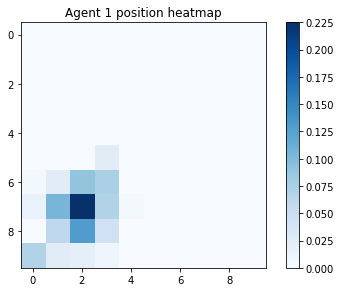

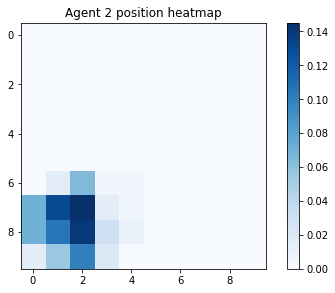

steps 23200 - 23400
gamma = 0.5935147322914311
avg reward for agent 0 : 1.005512584932268
avg reward for agent 1 : 0.9525233964360498
avg reward for agent 2 : 0.9657706935601043


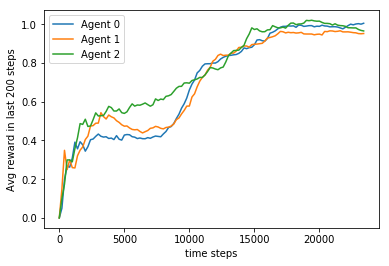

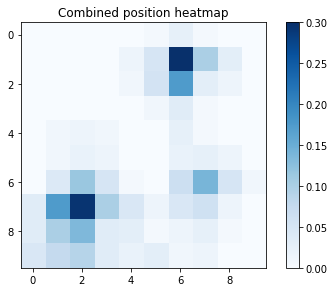

Per agent heatmaps:


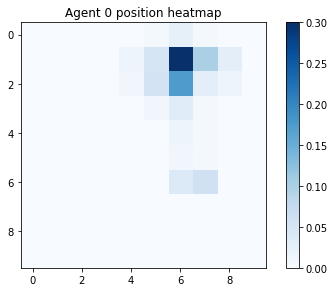

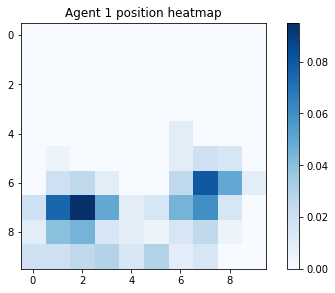

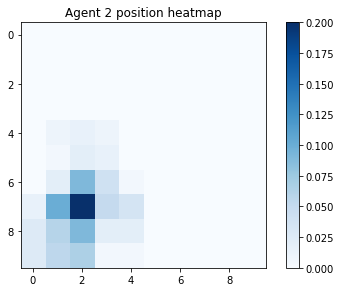

steps 23400 - 23600
gamma = 0.592328883142032
avg reward for agent 0 : 1.0029236049319945
avg reward for agent 1 : 0.9673318927164103
avg reward for agent 2 : 0.965637049277573


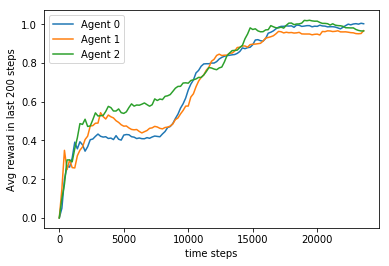

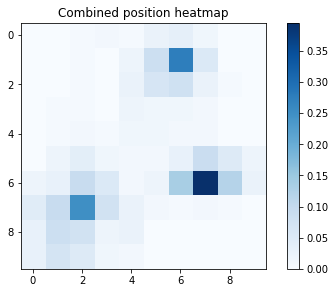

Per agent heatmaps:


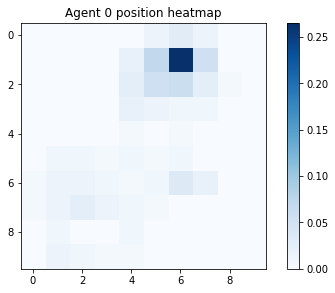

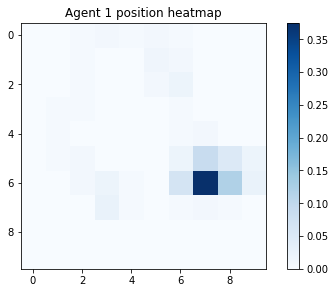

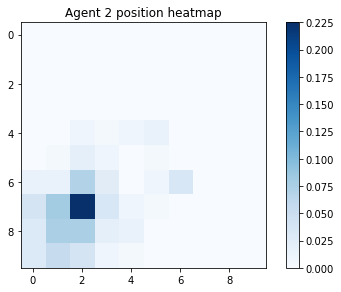

steps 23600 - 23800
gamma = 0.591145403332649
avg reward for agent 0 : 1.0062602411663375
avg reward for agent 1 : 0.9625645981261292
avg reward for agent 2 : 0.9629847485399773


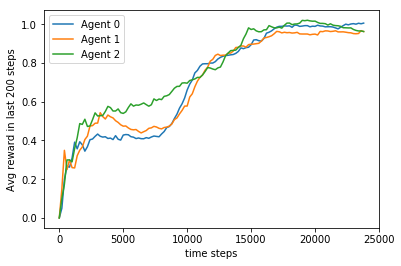

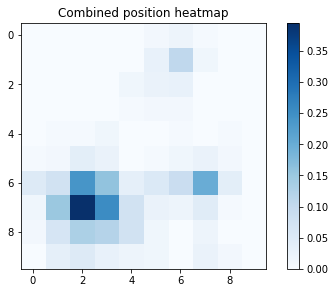

Per agent heatmaps:


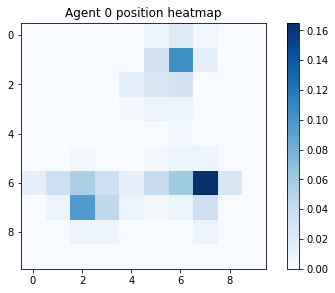

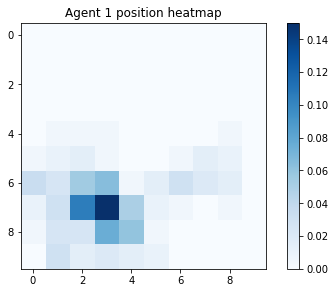

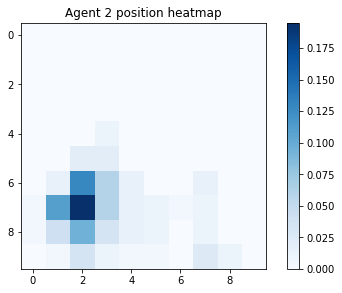

steps 23800 - 24000
gamma = 0.5899642881293129
avg reward for agent 0 : 1.0062080746635558
avg reward for agent 1 : 0.9591267030540395
avg reward for agent 2 : 0.9641264947293863


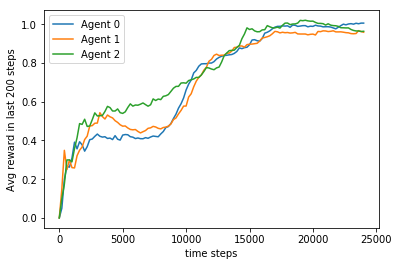

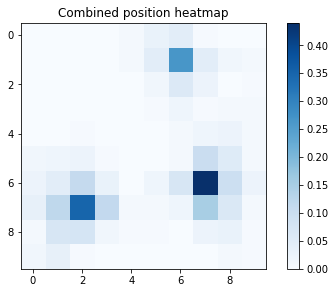

Per agent heatmaps:


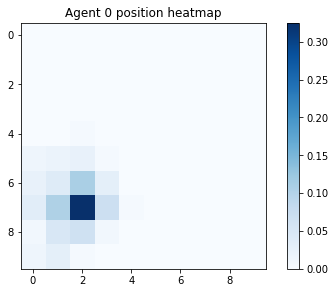

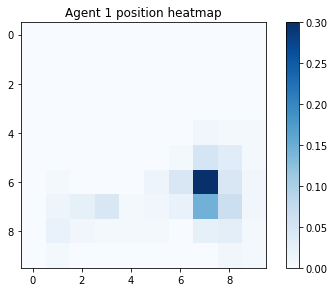

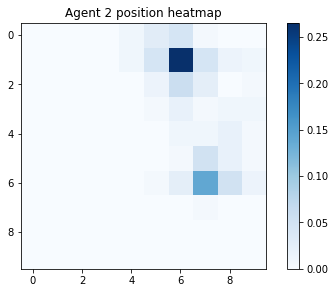

steps 24000 - 24200
gamma = 0.5887855328075148
avg reward for agent 0 : 1.0073963885789843
avg reward for agent 1 : 0.9578116606751788
avg reward for agent 2 : 0.961117309202099


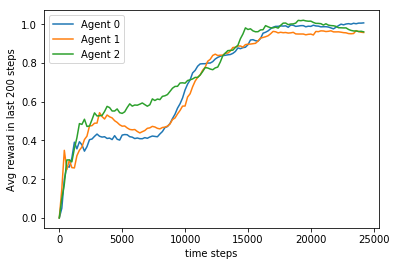

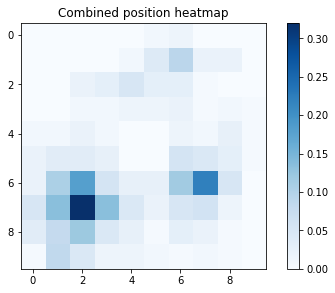

Per agent heatmaps:


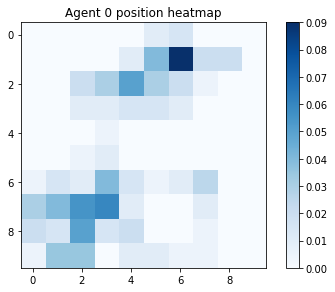

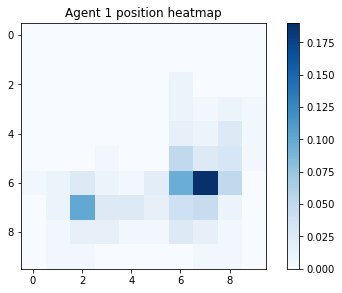

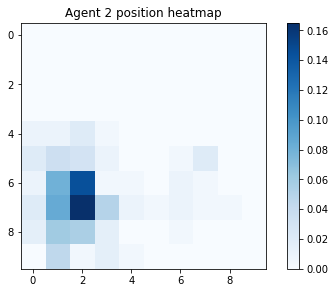

steps 24200 - 24400
gamma = 0.5876091326521853
avg reward for agent 0 : 1.0102044998155812
avg reward for agent 1 : 0.9589770911028237
avg reward for agent 2 : 0.9602065489119298


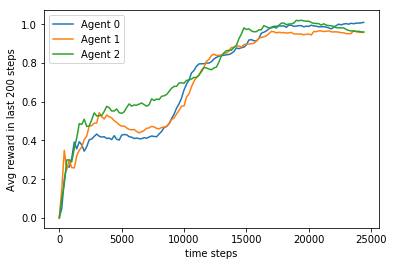

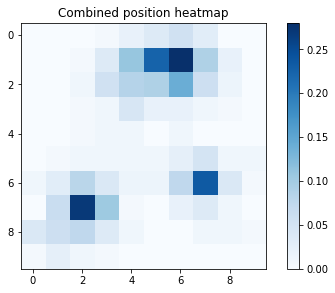

Per agent heatmaps:


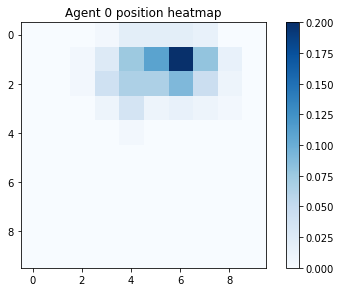

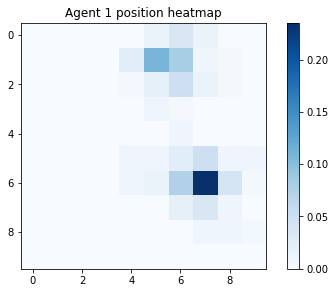

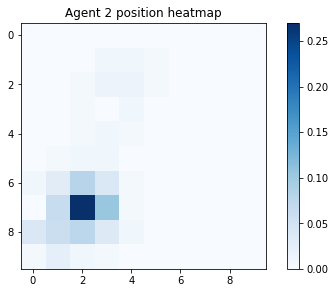

steps 24400 - 24600
gamma = 0.5864350829576737
avg reward for agent 0 : 1.0093085646924922
avg reward for agent 1 : 0.9576846469655705
avg reward for agent 2 : 0.9597170846713549


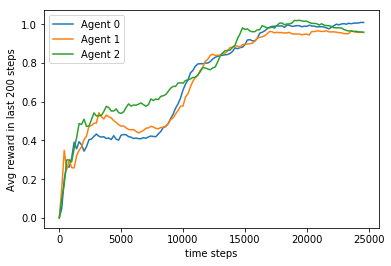

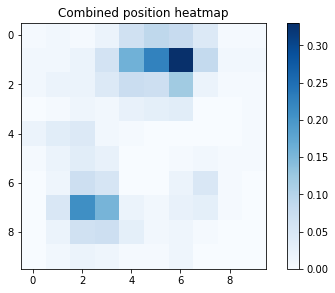

Per agent heatmaps:


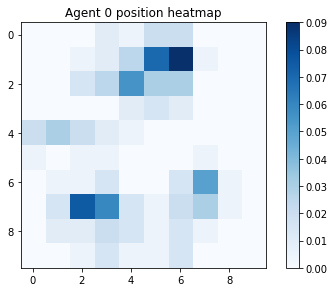

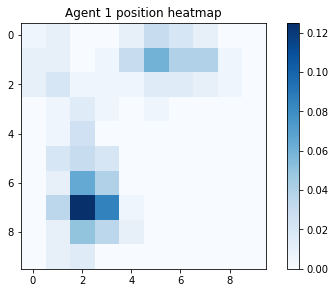

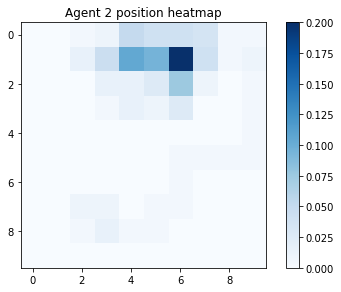

steps 24600 - 24800
gamma = 0.5852633790277336
avg reward for agent 0 : 1.0152816418692794
avg reward for agent 1 : 0.954800209668965
avg reward for agent 2 : 0.9600419337929922


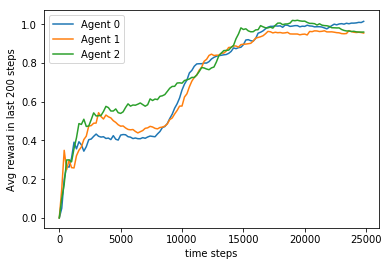

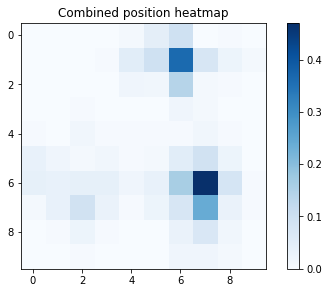

Per agent heatmaps:


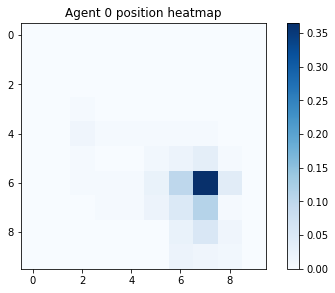

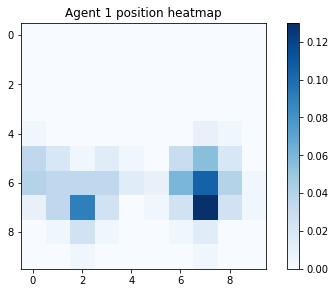

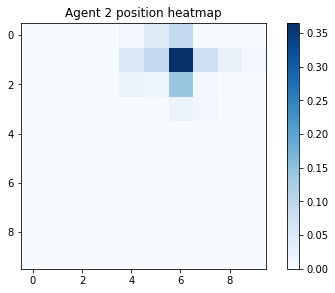

steps 24800 - 25000
gamma = 0.5840940161755007
avg reward for agent 0 : 1.013559457621695
avg reward for agent 1 : 0.953561857525699
avg reward for agent 2 : 0.9587616495340187


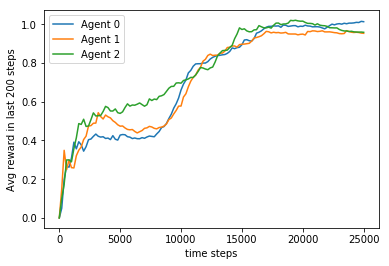

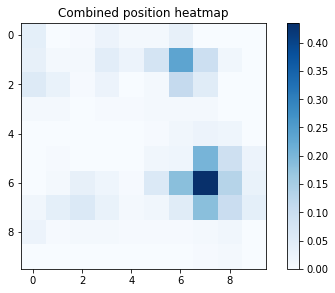

Per agent heatmaps:


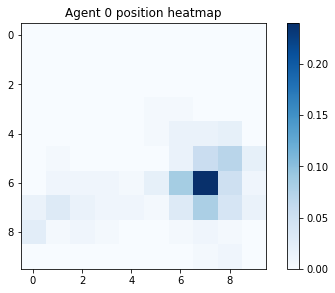

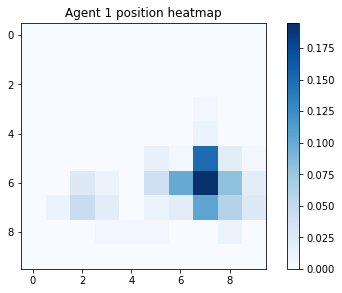

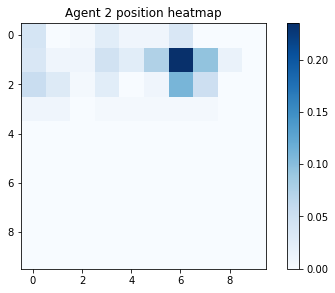

steps 25000 - 25200
gamma = 0.5829269897234759
avg reward for agent 0 : 1.014245466449744
avg reward for agent 1 : 0.9543272092377286
avg reward for agent 2 : 0.9582953057418356


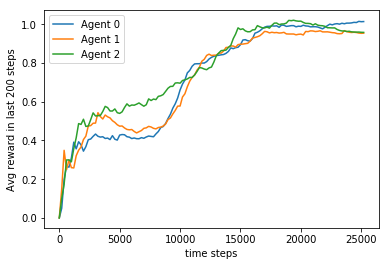

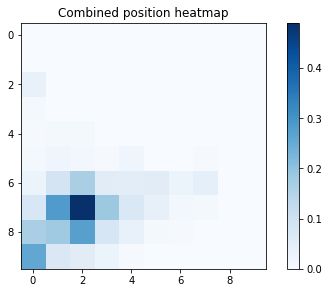

Per agent heatmaps:


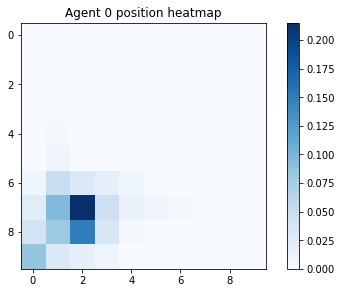

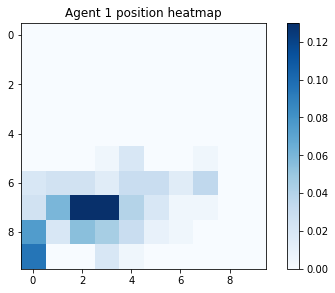

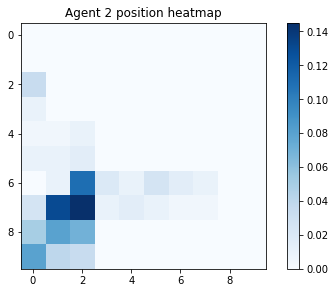

steps 25200 - 25400
gamma = 0.5817622950035043
avg reward for agent 0 : 1.016495413566395
avg reward for agent 1 : 0.9661036967048542
avg reward for agent 2 : 0.9653163261288925


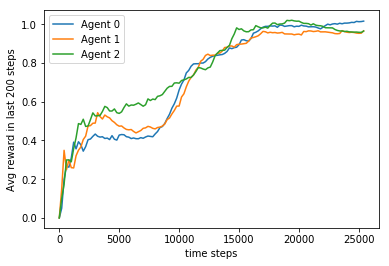

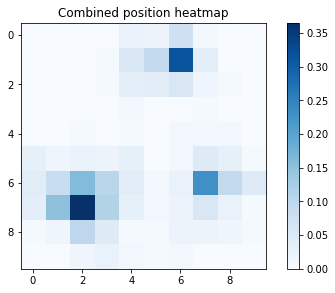

Per agent heatmaps:


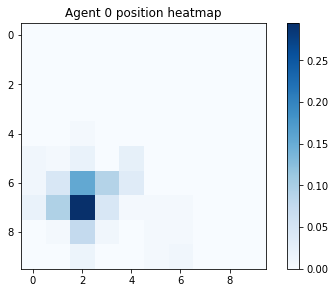

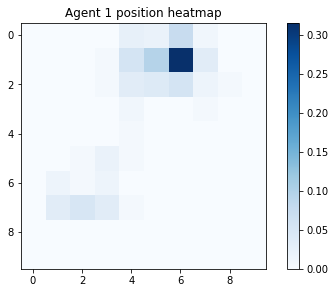

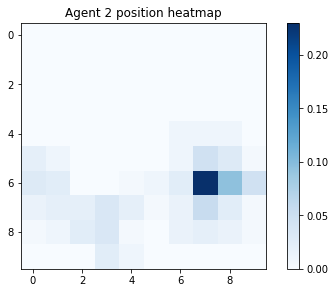

steps 25400 - 25600
gamma = 0.58059992735676
avg reward for agent 0 : 1.0155853286980978
avg reward for agent 1 : 0.9663685012304207
avg reward for agent 2 : 0.9655872817468067


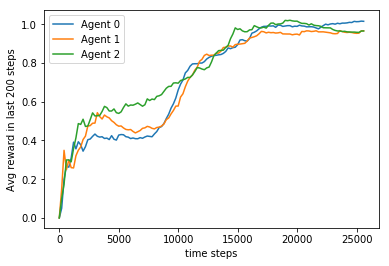

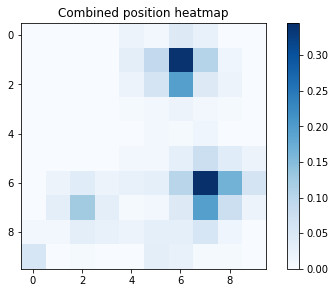

Per agent heatmaps:


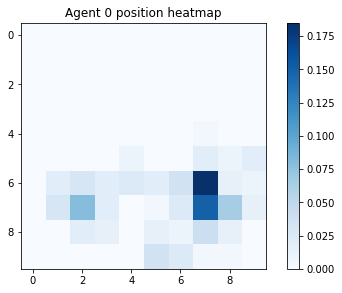

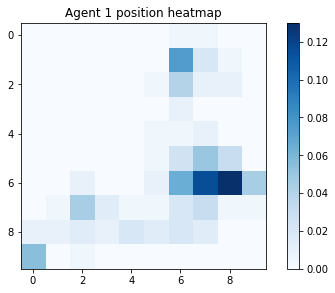

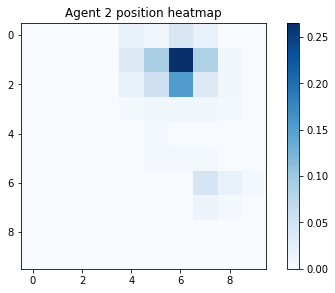

steps 25600 - 25800
gamma = 0.5794398821337224
avg reward for agent 0 : 1.0154645168791907
avg reward for agent 1 : 0.9631409635285454
avg reward for agent 2 : 0.96972985543196


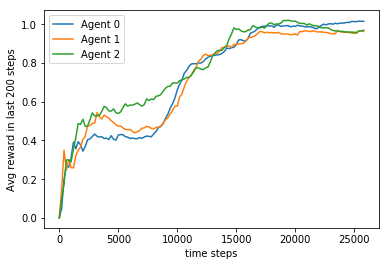

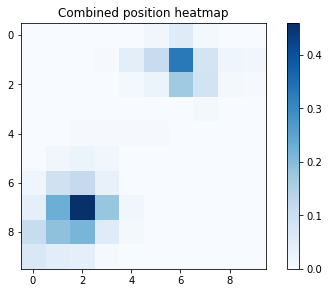

Per agent heatmaps:


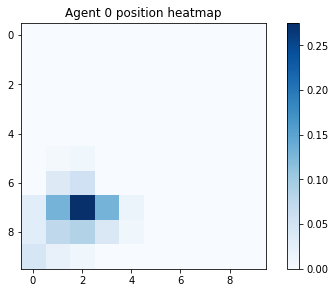

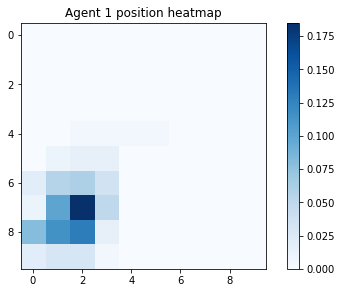

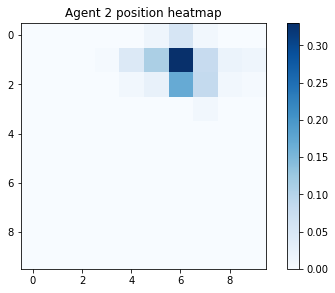

steps 25800 - 26000
gamma = 0.5782821546941649
avg reward for agent 0 : 1.0207299719241567
avg reward for agent 1 : 0.9638090842659898
avg reward for agent 2 : 0.9722702972962578


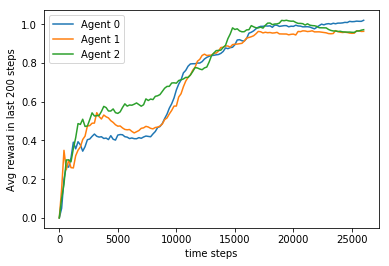

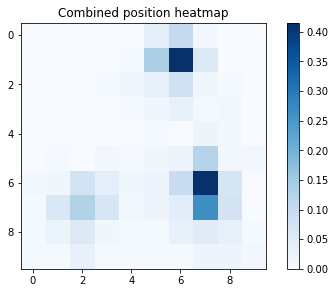

Per agent heatmaps:


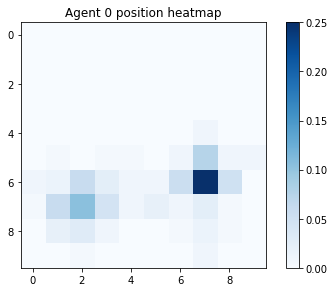

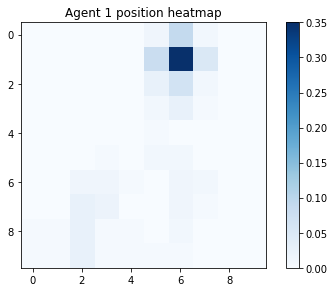

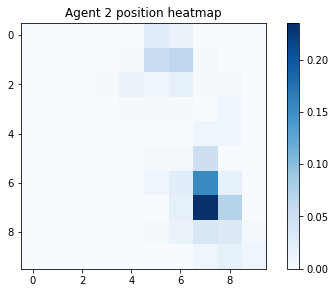

steps 26000 - 26200
gamma = 0.5771267404071283
avg reward for agent 0 : 1.0274417006984466
avg reward for agent 1 : 0.963322010610282
avg reward for agent 2 : 0.970573642227396


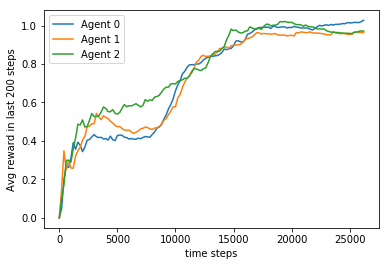

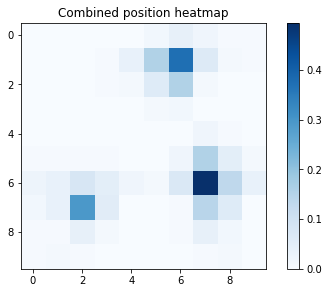

Per agent heatmaps:


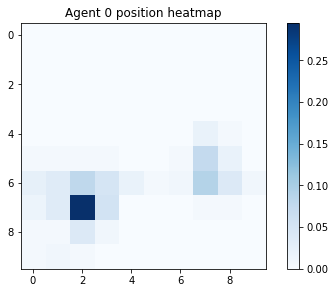

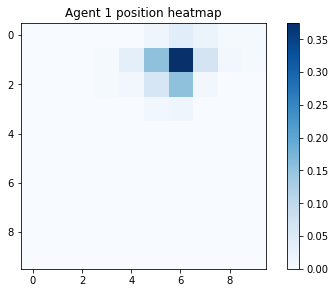

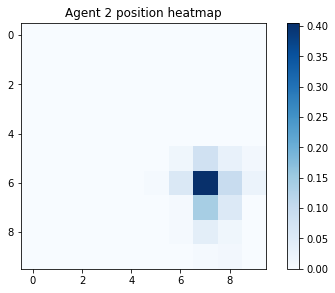

steps 26200 - 26400
gamma = 0.5759736346509075
avg reward for agent 0 : 1.0264762698382637
avg reward for agent 1 : 0.9651149577667513
avg reward for agent 2 : 0.9700390136737245


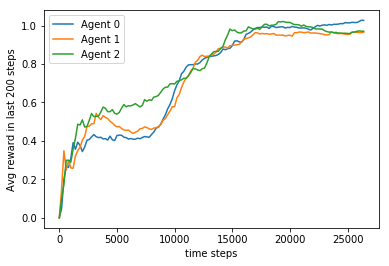

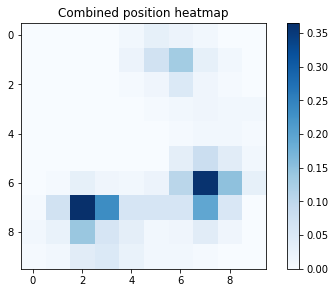

Per agent heatmaps:


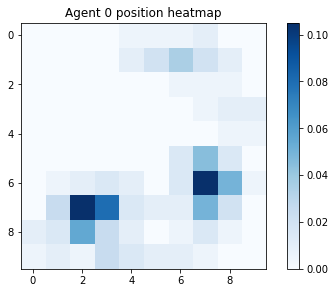

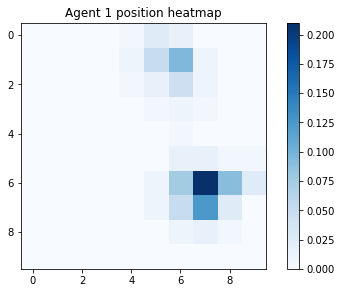

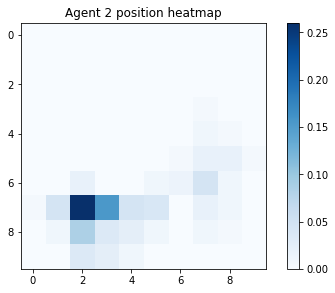

steps 26400 - 26600
gamma = 0.5748228328130327
avg reward for agent 0 : 1.026653133340852
avg reward for agent 1 : 0.967632795759558
avg reward for agent 2 : 0.970264275779106


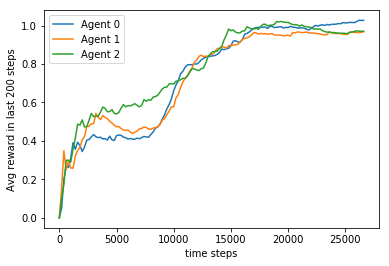

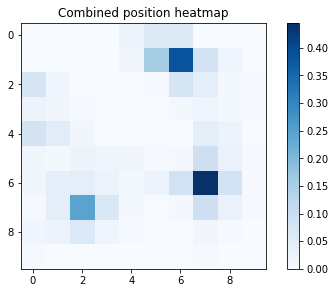

Per agent heatmaps:


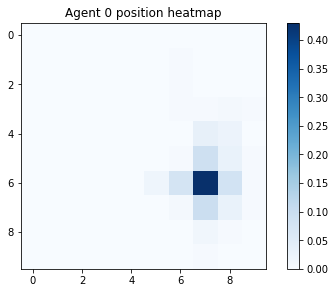

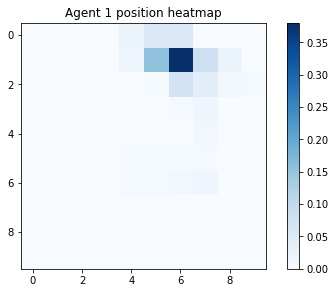

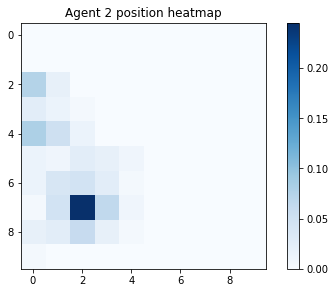

steps 26600 - 26800
gamma = 0.5736743302902483
avg reward for agent 0 : 1.0249617551583896
avg reward for agent 1 : 0.9626506473639044
avg reward for agent 2 : 0.9689936942651394


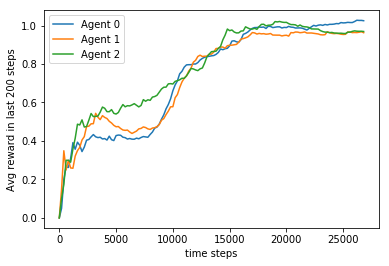

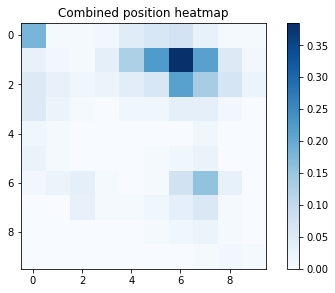

Per agent heatmaps:


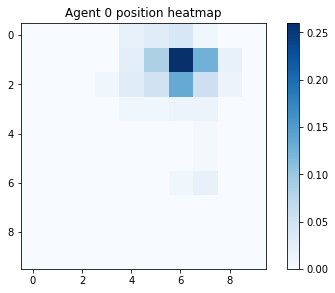

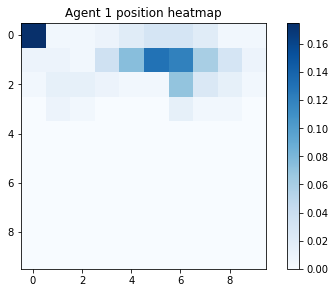

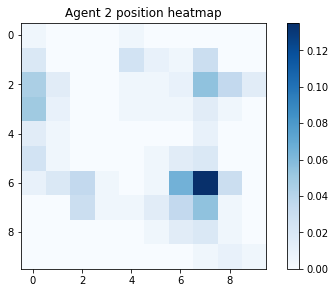

steps 26800 - 27000
gamma = 0.572528122488497
avg reward for agent 0 : 1.0310729232250657
avg reward for agent 1 : 0.9603348024147254
avg reward for agent 2 : 0.971815858671901


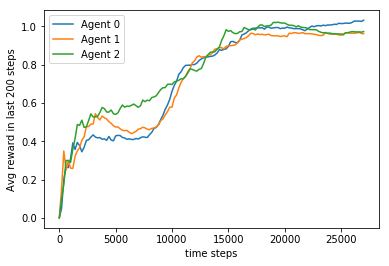

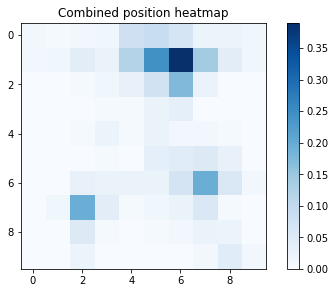

Per agent heatmaps:


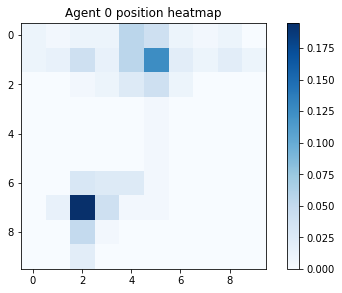

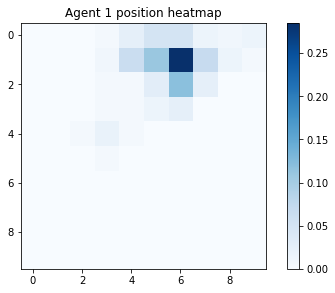

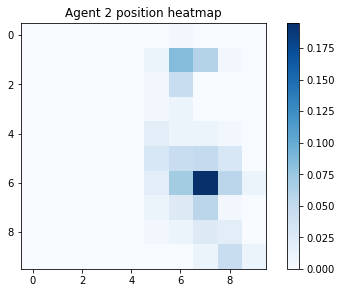

steps 27000 - 27200
gamma = 0.5713842048229006
avg reward for agent 0 : 1.0326826219624279
avg reward for agent 1 : 0.9576853792139994
avg reward for agent 2 : 0.969449652586302


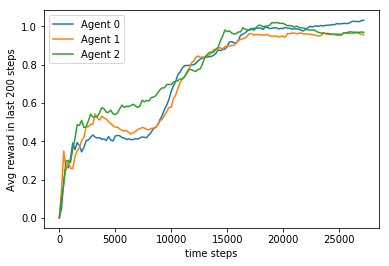

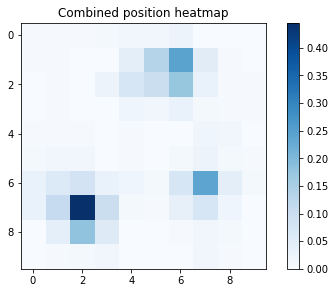

Per agent heatmaps:


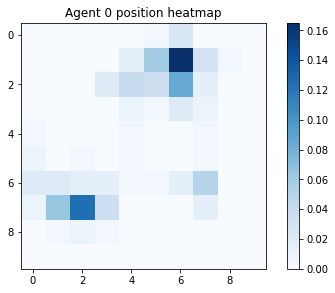

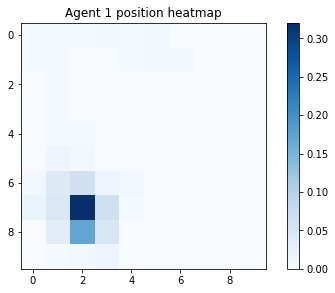

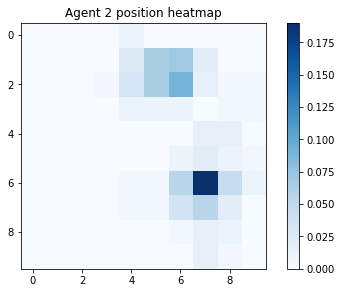

steps 27200 - 27400
gamma = 0.5702425727177406
avg reward for agent 0 : 1.032809021568556
avg reward for agent 1 : 0.9572643334184884
avg reward for agent 2 : 0.9693076895003832


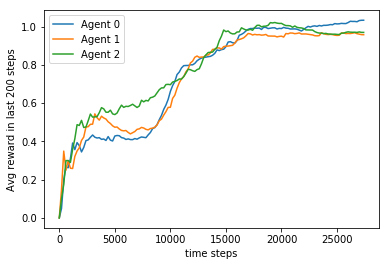

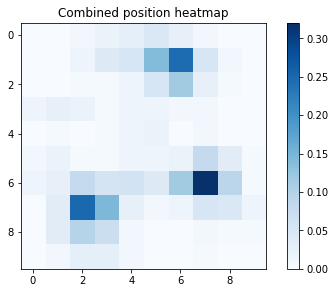

Per agent heatmaps:


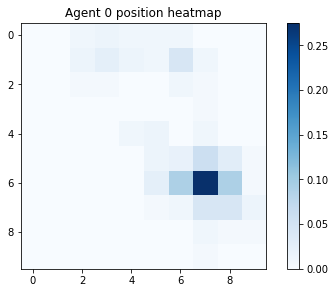

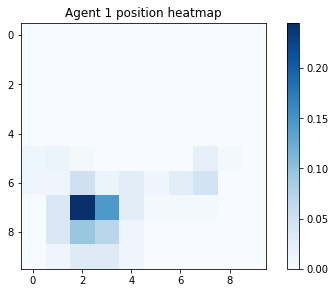

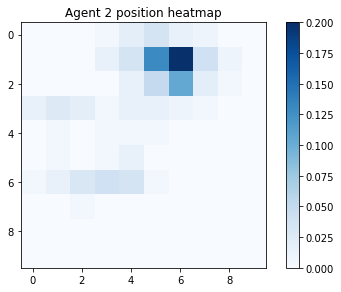

steps 27400 - 27600
gamma = 0.5691032216064421
avg reward for agent 0 : 1.0289482265135321
avg reward for agent 1 : 0.9604724466504837
avg reward for agent 2 : 0.9648201152132169


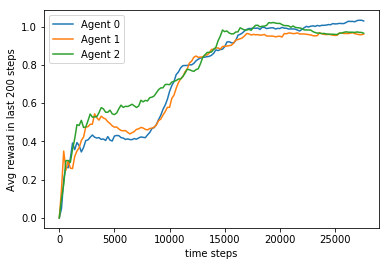

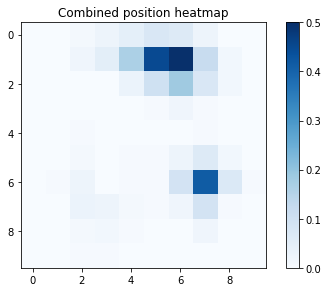

Per agent heatmaps:


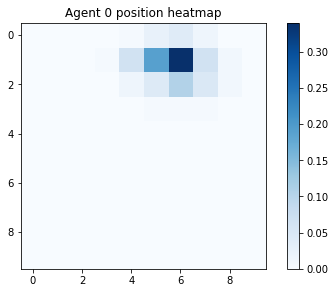

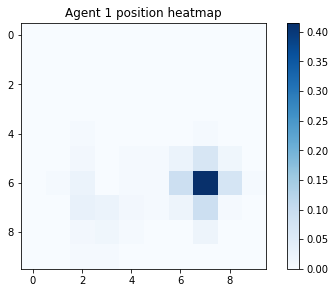

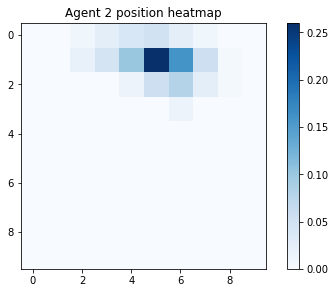

steps 27600 - 27800
gamma = 0.5679661469315533
avg reward for agent 0 : 1.0265817776338981
avg reward for agent 1 : 0.9575195136865581
avg reward for agent 2 : 0.95931801014352


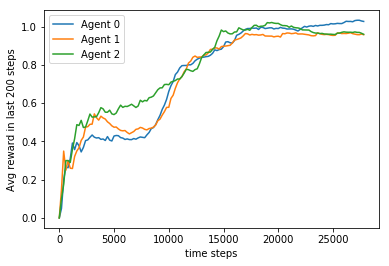

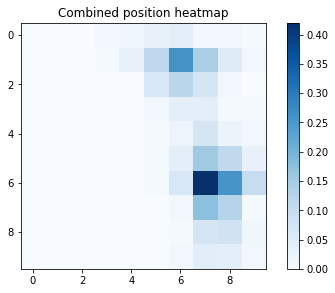

Per agent heatmaps:


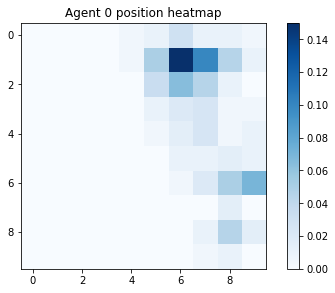

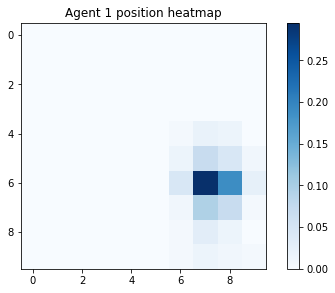

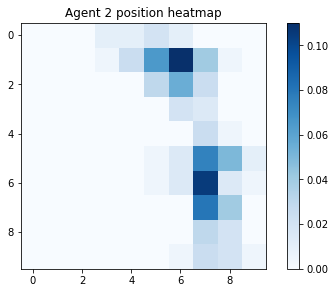

steps 27800 - 28000
gamma = 0.5668313441447285
avg reward for agent 0 : 1.0249633941644942
avg reward for agent 1 : 0.9638941466376201
avg reward for agent 2 : 0.9621084961251384


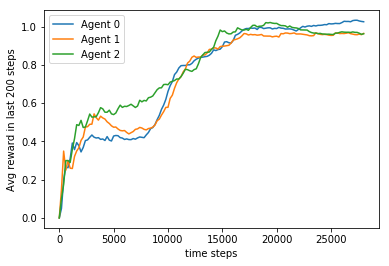

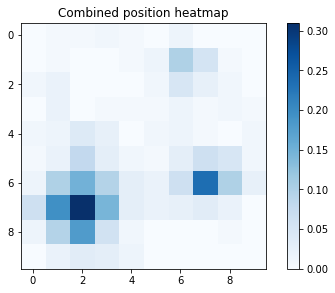

Per agent heatmaps:


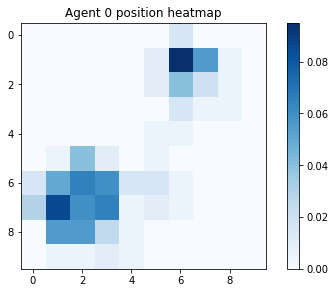

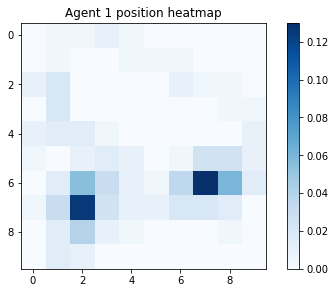

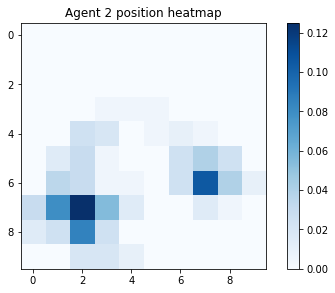

steps 28000 - 28200
gamma = 0.5656988087067095
avg reward for agent 0 : 1.0226587709655686
avg reward for agent 1 : 0.9662777915676749
avg reward for agent 2 : 0.9588312471188964


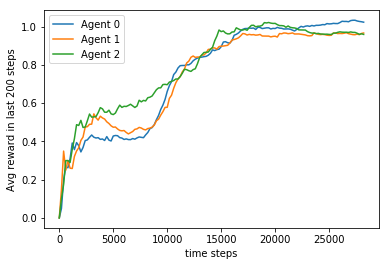

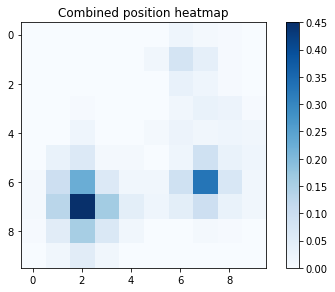

Per agent heatmaps:


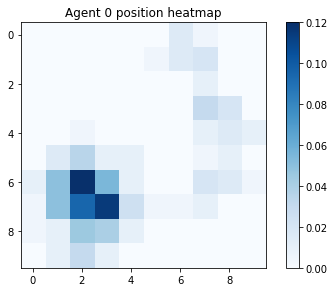

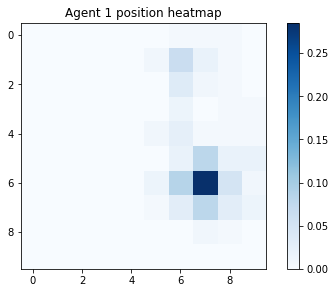

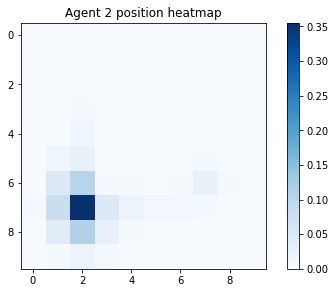

steps 28200 - 28400
gamma = 0.5645685360873067
avg reward for agent 0 : 1.0210908066617372
avg reward for agent 1 : 0.9665152635470582
avg reward for agent 2 : 0.9580648568712369


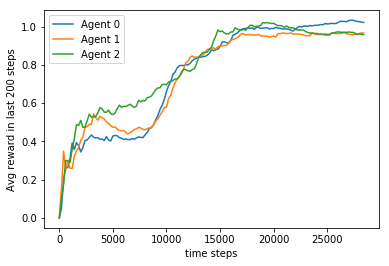

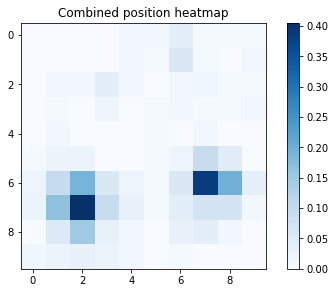

Per agent heatmaps:


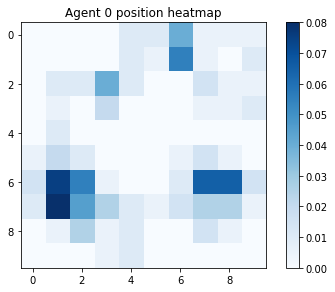

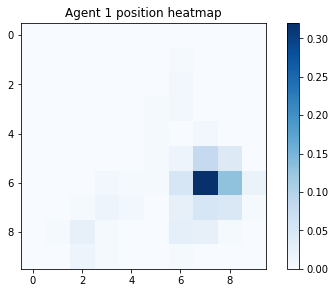

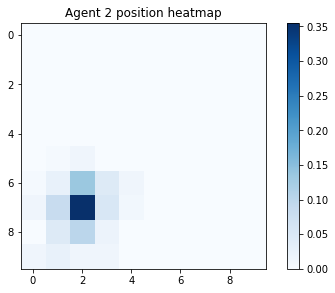

steps 28400 - 28600
gamma = 0.5634405217653853
avg reward for agent 0 : 1.0240900667808819
avg reward for agent 1 : 0.9636026712352715
avg reward for agent 2 : 0.9545120799972029


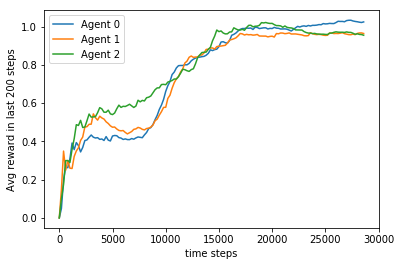

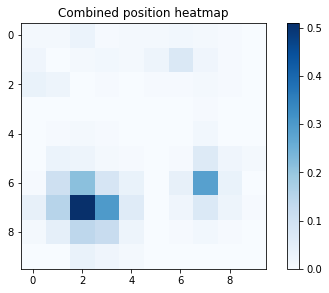

Per agent heatmaps:


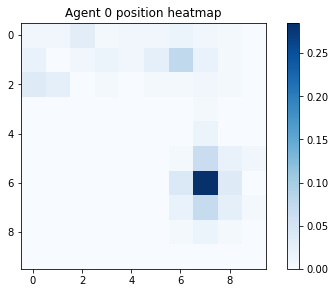

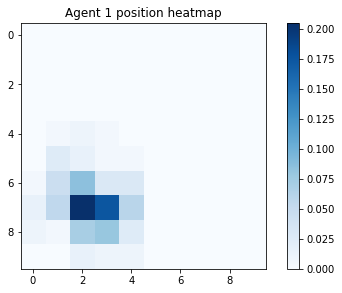

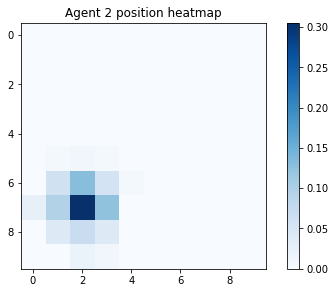

steps 28600 - 28800
gamma = 0.5623147612288402
avg reward for agent 0 : 1.0232283601263845
avg reward for agent 1 : 0.9642026318530607
avg reward for agent 2 : 0.9572584285267872


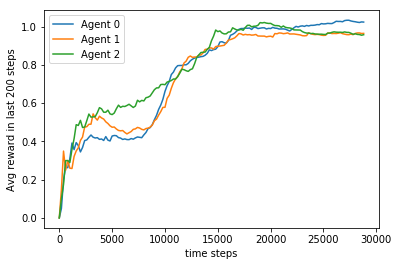

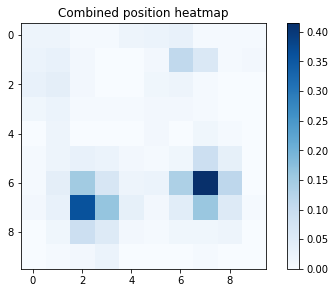

Per agent heatmaps:


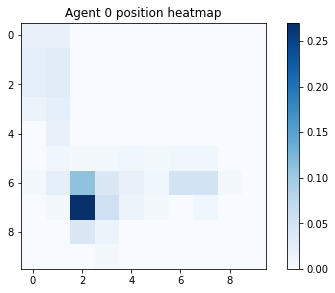

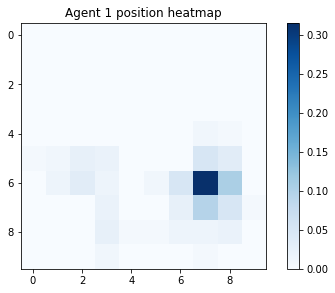

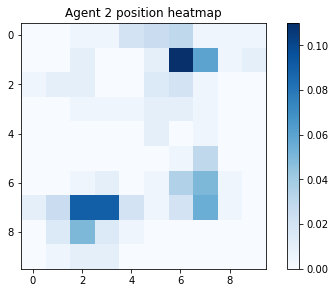

steps 28800 - 29000
gamma = 0.5611912499745825
avg reward for agent 0 : 1.0220337229750698
avg reward for agent 1 : 0.9647943174373298
avg reward for agent 2 : 0.9572083721250991


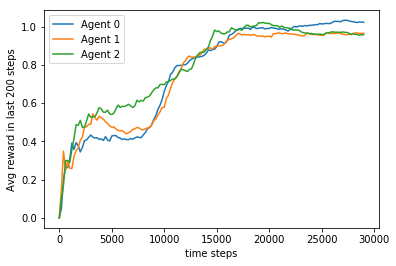

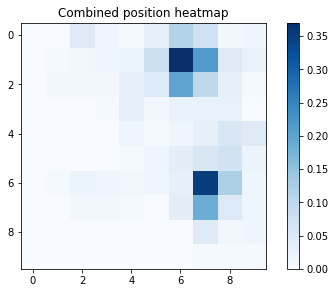

Per agent heatmaps:


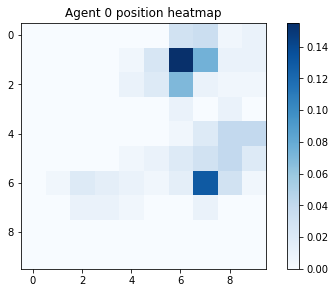

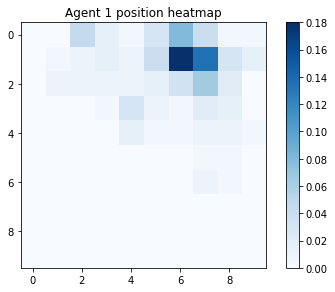

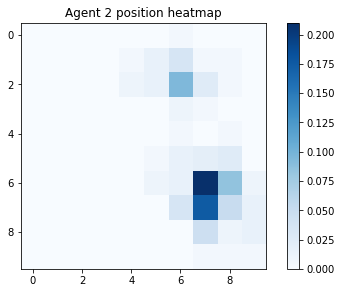

steps 29000 - 29200
gamma = 0.5600699835085196
avg reward for agent 0 : 1.0307866168966817
avg reward for agent 1 : 0.9605835416595322
avg reward for agent 2 : 0.9571590014040615


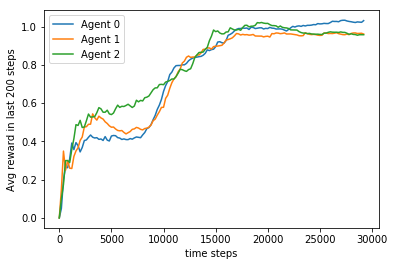

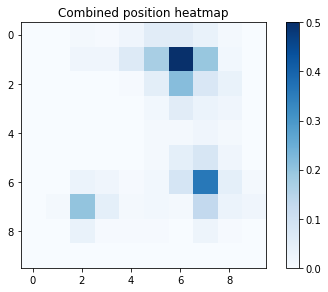

Per agent heatmaps:


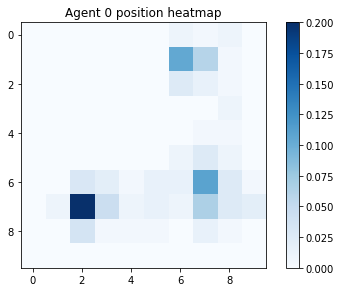

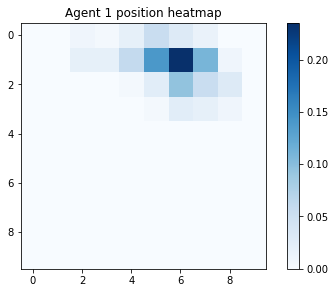

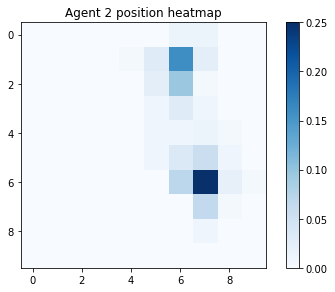

steps 29200 - 29400
gamma = 0.5589509573455411
avg reward for agent 0 : 1.0288765688241897
avg reward for agent 1 : 0.9622121696540934
avg reward for agent 2 : 0.9533689330294888


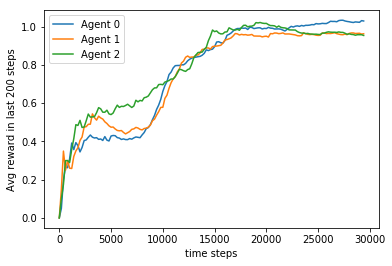

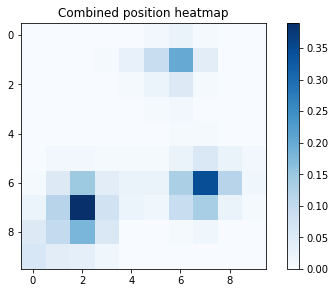

Per agent heatmaps:


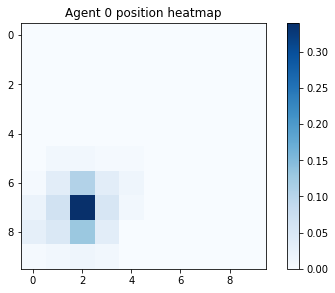

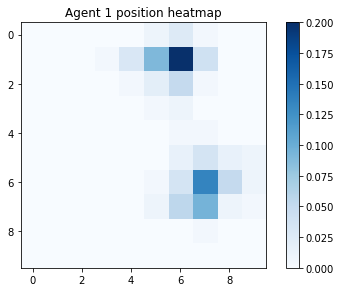

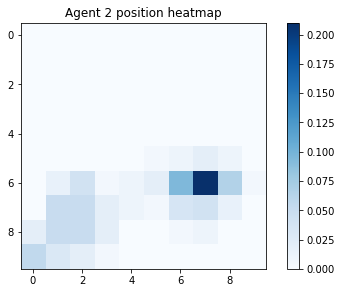

steps 29400 - 29600
gamma = 0.557834167009496
avg reward for agent 0 : 1.030370595587987
avg reward for agent 1 : 0.9574000878348704
avg reward for agent 2 : 0.9516570386135603


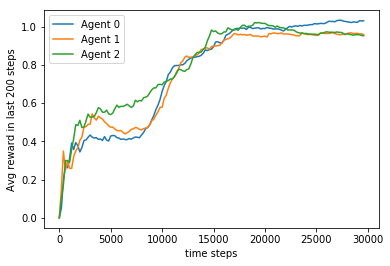

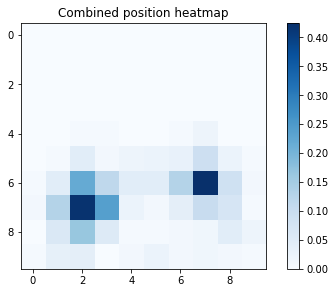

Per agent heatmaps:


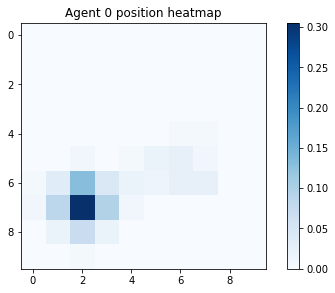

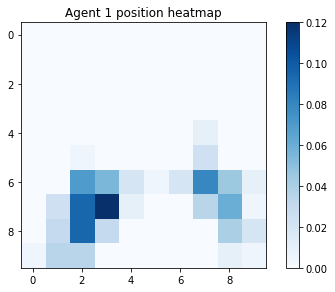

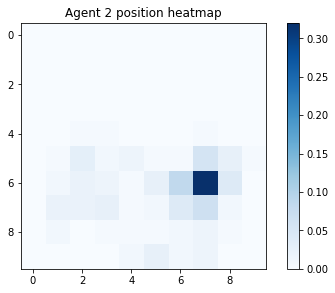

steps 29600 - 29800
gamma = 0.5567196080331757
avg reward for agent 0 : 1.028153417670548
avg reward for agent 1 : 0.9563437468541324
avg reward for agent 2 : 0.9509747995033724


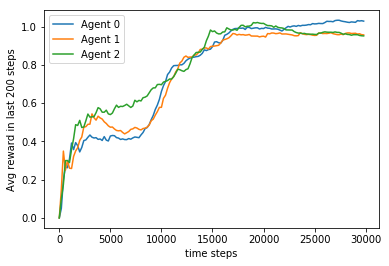

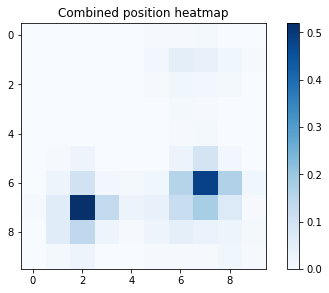

Per agent heatmaps:


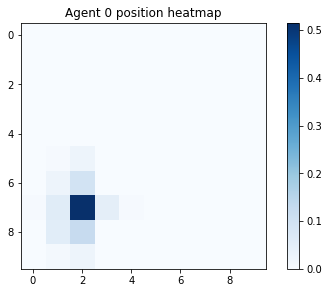

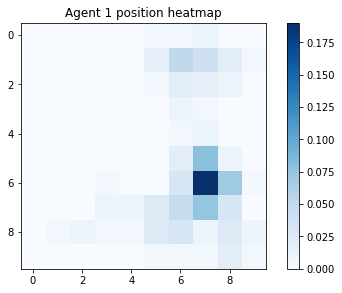

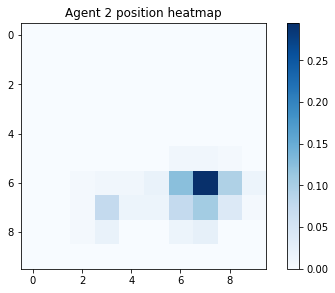

steps 29800 - 30000
gamma = 0.5556072759582992
avg reward for agent 0 : 1.02829905669811
avg reward for agent 1 : 0.9546348455051499
avg reward for agent 2 : 0.9573014232858905


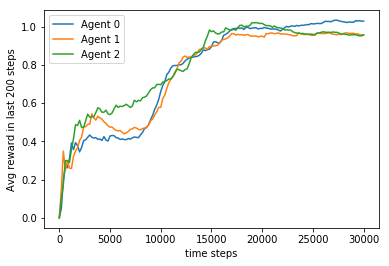

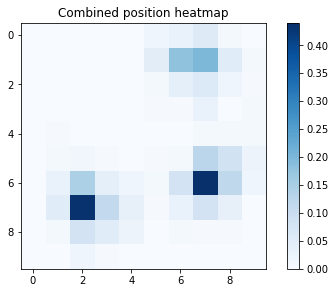

Per agent heatmaps:


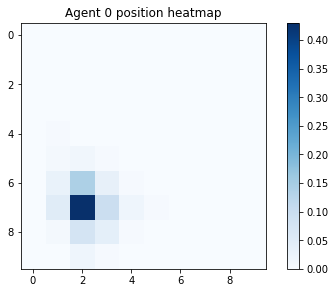

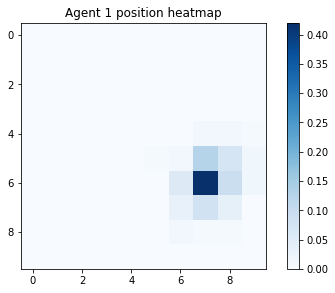

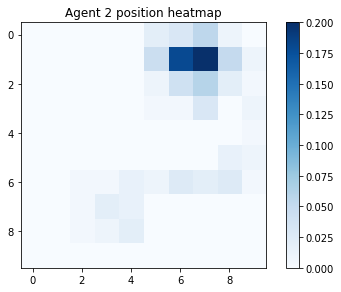

steps 30000 - 30200
gamma = 0.5544971663354917
avg reward for agent 0 : 1.0261249627495779
avg reward for agent 1 : 0.9539419224528989
avg reward for agent 2 : 0.9622197940465548


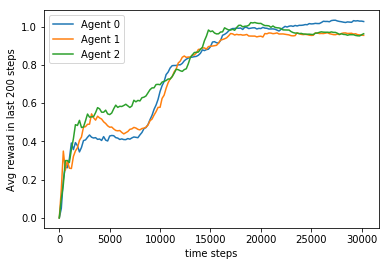

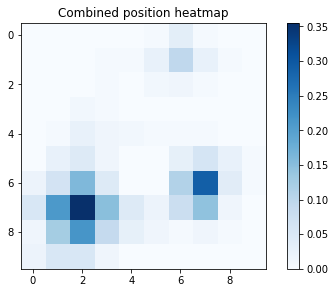

Per agent heatmaps:


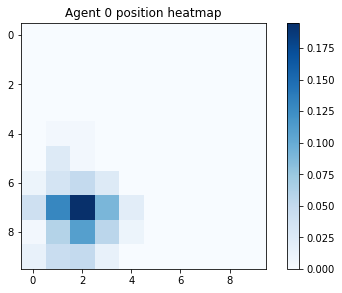

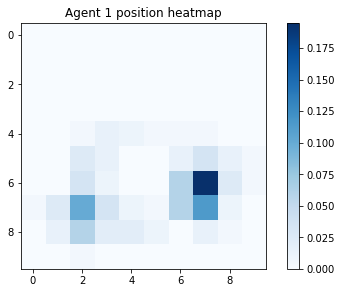

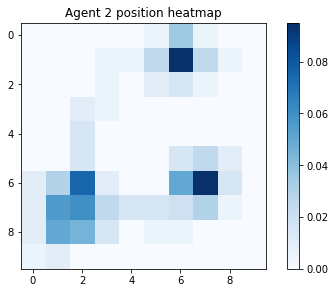

steps 30200 - 30400
gamma = 0.5533892747242695
avg reward for agent 0 : 1.021676918522417
avg reward for agent 1 : 0.9516134337686261
avg reward for agent 2 : 0.9604947205684023


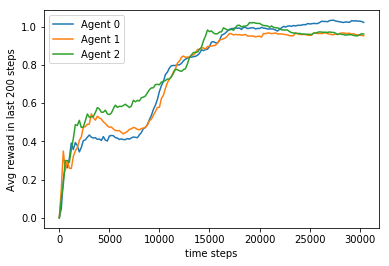

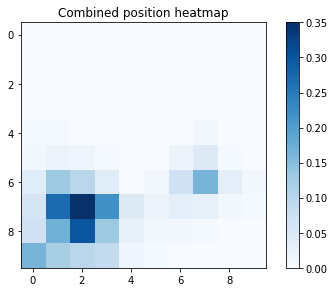

Per agent heatmaps:


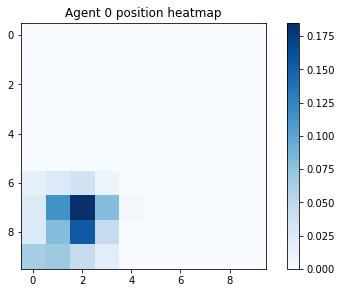

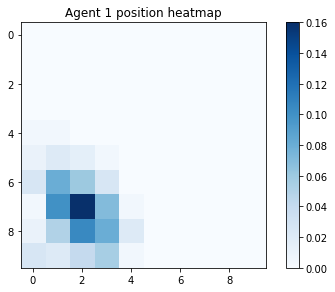

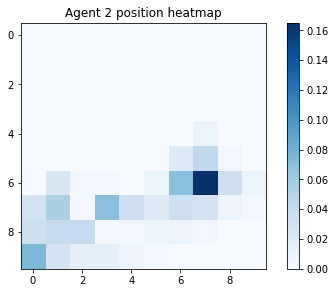

steps 30400 - 30600
gamma = 0.5522835966930189
avg reward for agent 0 : 1.0172870167641581
avg reward for agent 1 : 0.9509493153818502
avg reward for agent 2 : 0.9630404235155714


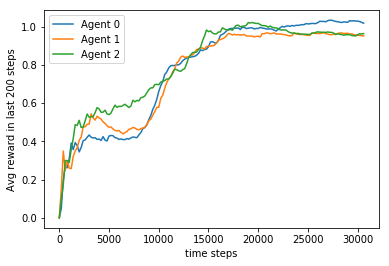

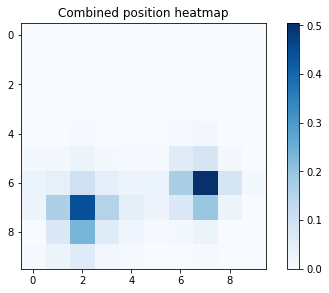

Per agent heatmaps:


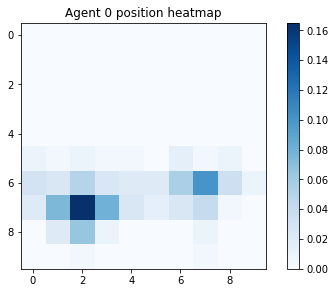

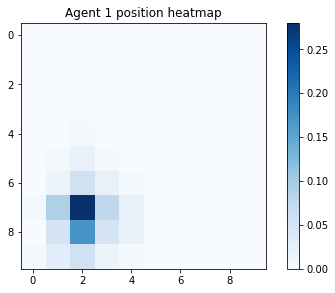

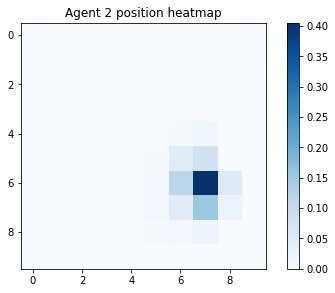

steps 30600 - 30800
gamma = 0.5511801278189833
avg reward for agent 0 : 1.025291386643291
avg reward for agent 1 : 0.9506184864127788
avg reward for agent 2 : 0.9597091003538846


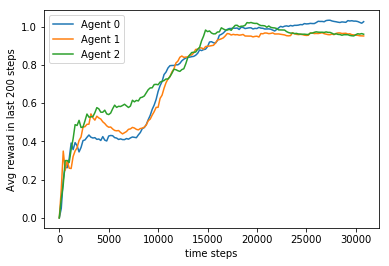

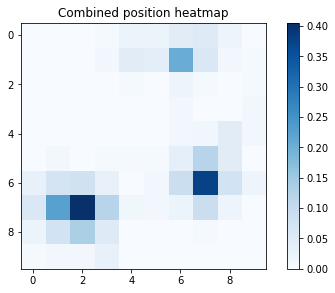

Per agent heatmaps:


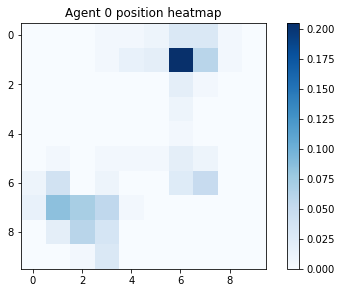

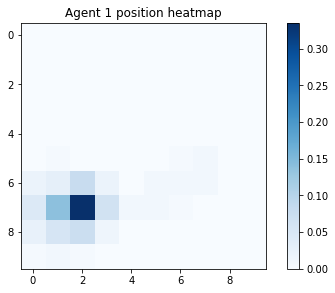

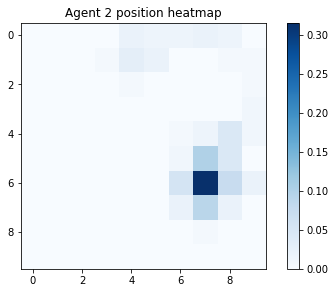

steps 30800 - 31000
gamma = 0.5500788636882412
avg reward for agent 0 : 1.0257733621496081
avg reward for agent 1 : 0.948356504628883
avg reward for agent 2 : 0.9570659010999645


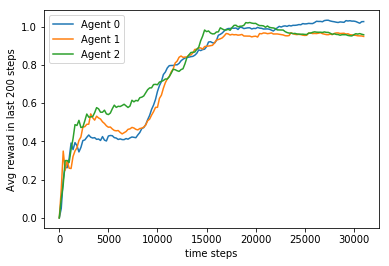

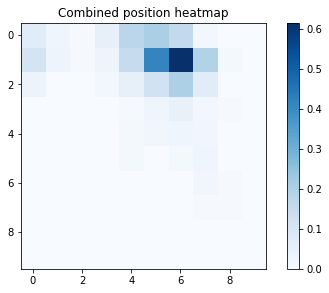

Per agent heatmaps:


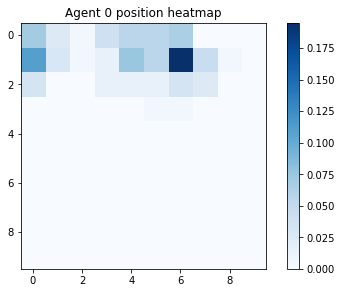

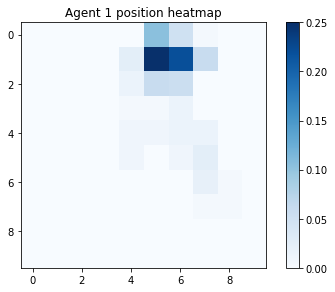

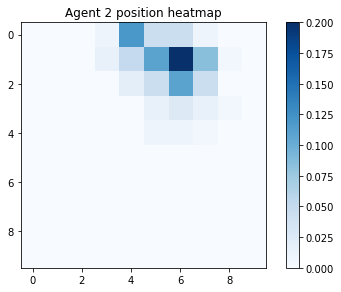

steps 31000 - 31200
gamma = 0.5489797998956909
avg reward for agent 0 : 1.0265696612288067
avg reward for agent 1 : 0.9515720649979167
avg reward for agent 2 : 0.9615076439857697


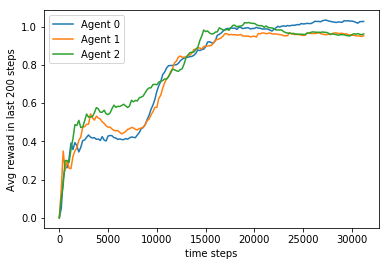

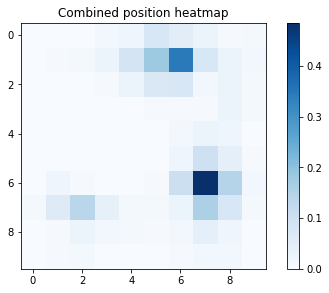

Per agent heatmaps:


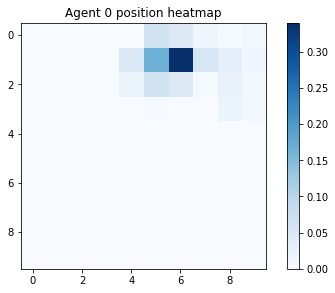

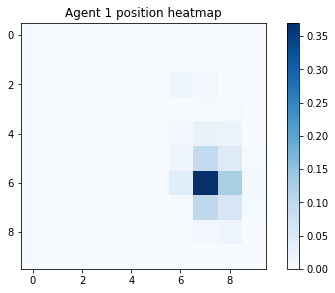

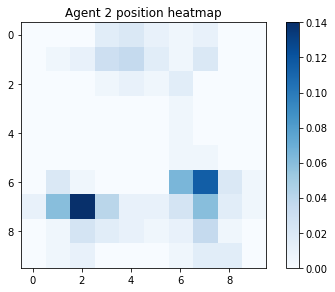

steps 31200 - 31400
gamma = 0.5478829320450311
avg reward for agent 0 : 1.0235342823476958
avg reward for agent 1 : 0.9557020477054871
avg reward for agent 2 : 0.9627081940065603


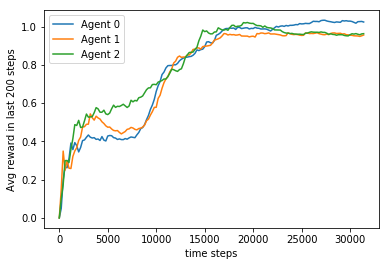

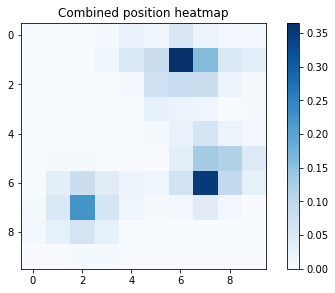

Per agent heatmaps:


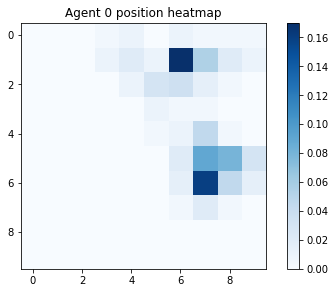

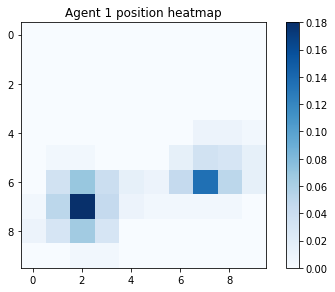

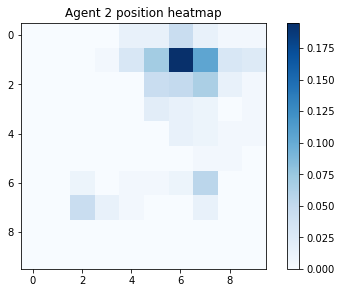

steps 31400 - 31600
gamma = 0.5467882557487458
avg reward for agent 0 : 1.0281320211385716
avg reward for agent 1 : 0.9559824056200753
avg reward for agent 2 : 0.9604126451694567


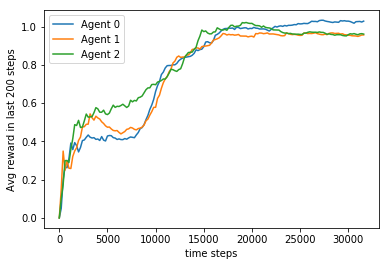

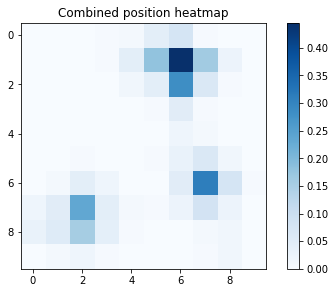

Per agent heatmaps:


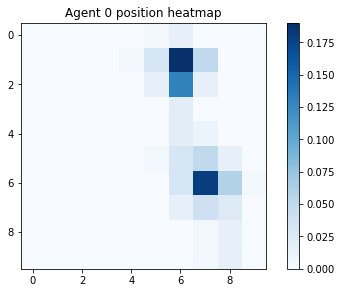

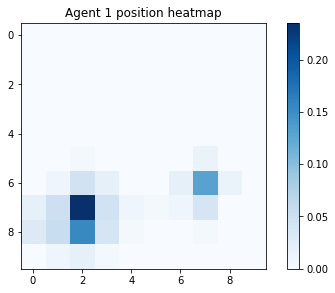

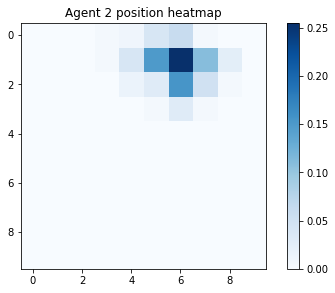

steps 31600 - 31800
gamma = 0.5456957666280842
avg reward for agent 0 : 1.0229238074274394
avg reward for agent 1 : 0.9518568598471746
avg reward for agent 2 : 0.9600327033741077


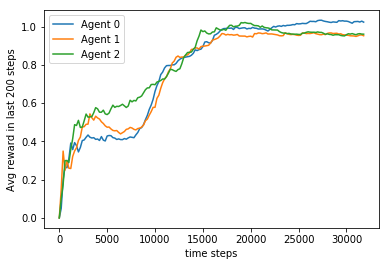

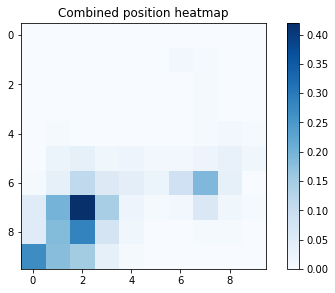

Per agent heatmaps:


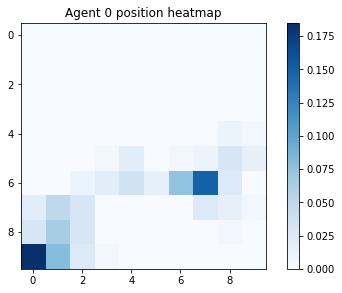

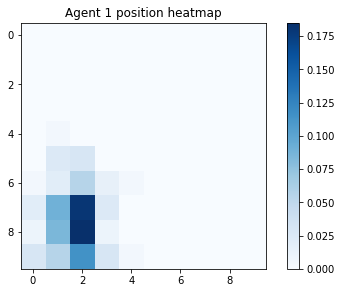

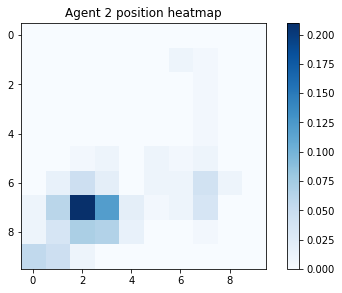

steps 31800 - 32000
gamma = 0.5446054603130445
avg reward for agent 0 : 1.0237180088122246
avg reward for agent 1 : 0.9521577450704666
avg reward for agent 2 : 0.9562201181213087


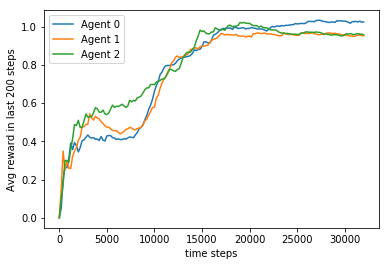

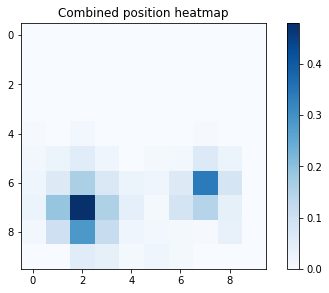

Per agent heatmaps:


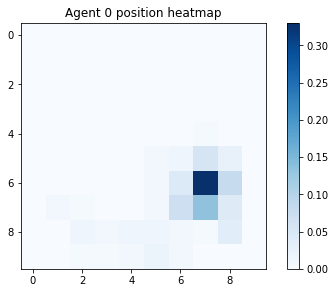

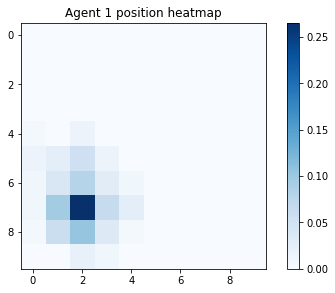

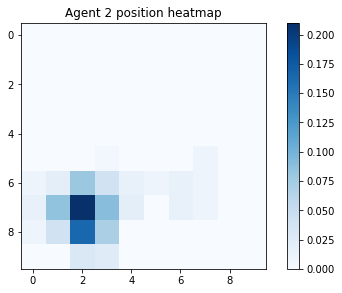

steps 32000 - 32200
gamma = 0.543517332442357
avg reward for agent 0 : 1.020775752305829
avg reward for agent 1 : 0.969845656967175
avg reward for agent 2 : 0.955249836961585


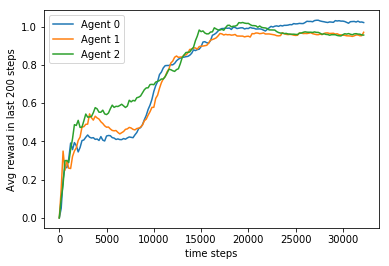

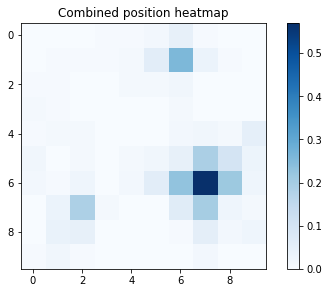

Per agent heatmaps:


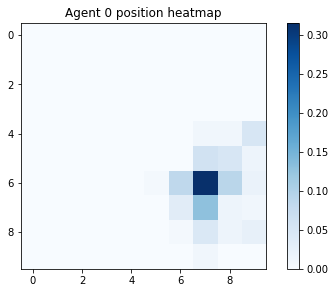

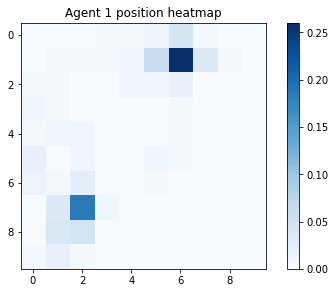

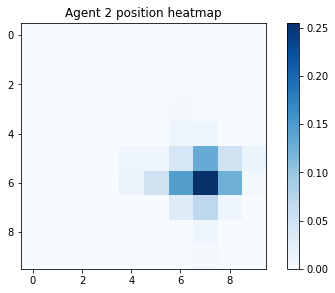

steps 32200 - 32400
gamma = 0.5424313786634644
avg reward for agent 0 : 1.021882040677757
avg reward for agent 1 : 0.9681799944446159
avg reward for agent 2 : 0.9678713619950001


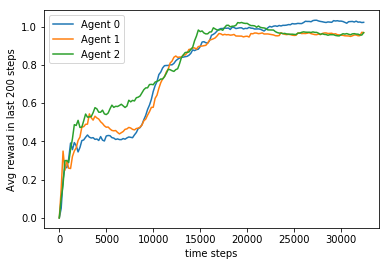

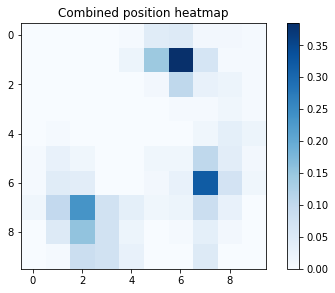

Per agent heatmaps:


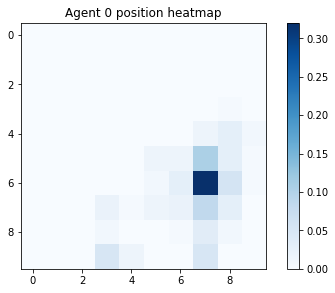

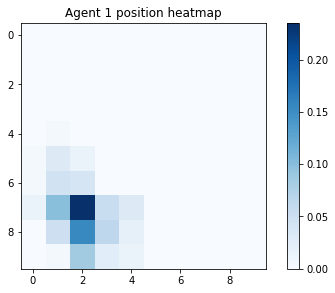

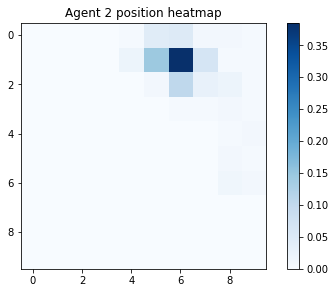

steps 32400 - 32600
gamma = 0.5413475946325074
avg reward for agent 0 : 1.0192938866905923
avg reward for agent 1 : 0.9659212907579522
avg reward for agent 2 : 0.9680684641575412


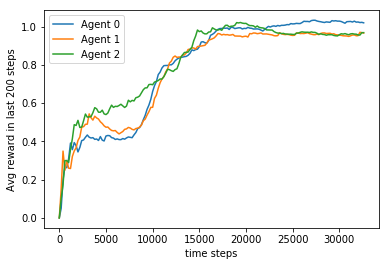

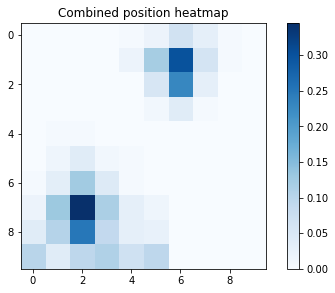

Per agent heatmaps:


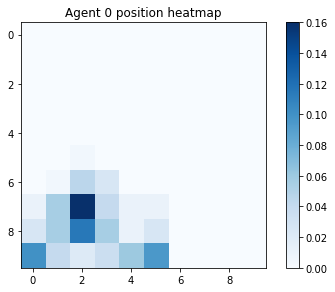

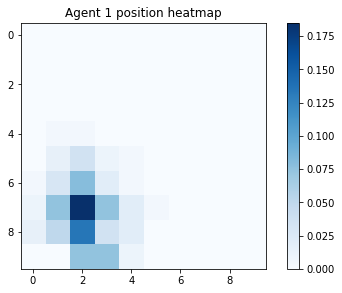

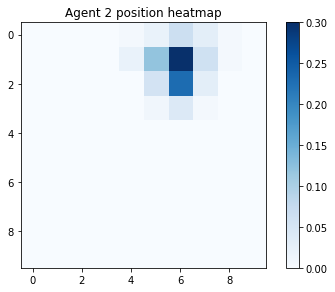

steps 32600 - 32800
gamma = 0.5402659760143042
avg reward for agent 0 : 1.0146032133166671
avg reward for agent 1 : 0.9624706563824273
avg reward for agent 2 : 0.9670436876924484


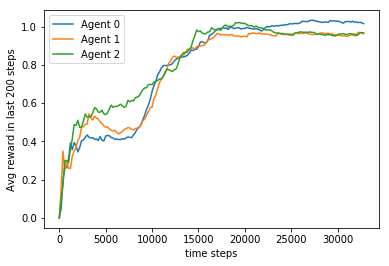

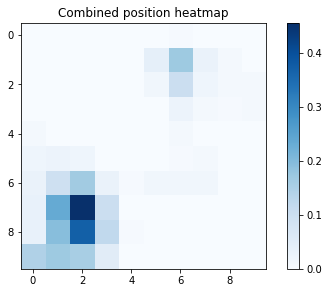

Per agent heatmaps:


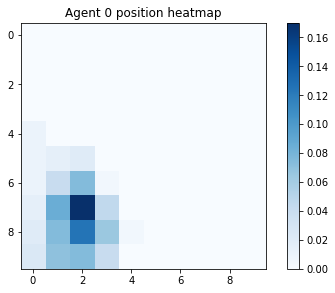

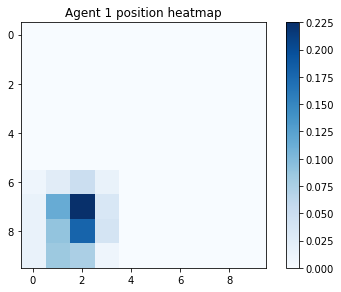

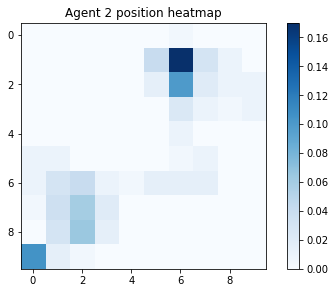

steps 32800 - 33000
gamma = 0.5391865184823373
avg reward for agent 0 : 1.0151207539165479
avg reward for agent 1 : 0.9611829944547134
avg reward for agent 2 : 0.9617890366958577


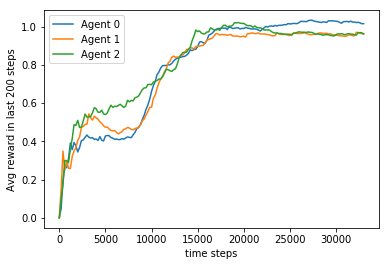

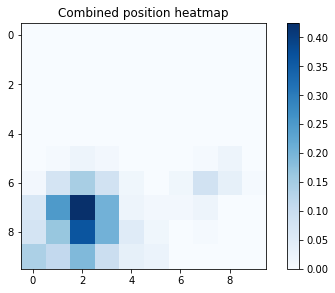

Per agent heatmaps:


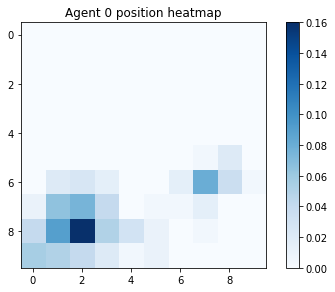

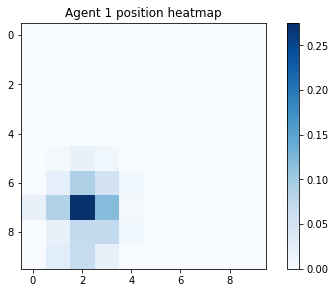

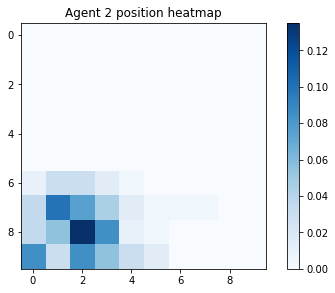

steps 33000 - 33200
gamma = 0.5381092177187305
avg reward for agent 0 : 1.0174392337580194
avg reward for agent 1 : 0.9587060630703894
avg reward for agent 2 : 0.9791873738742809


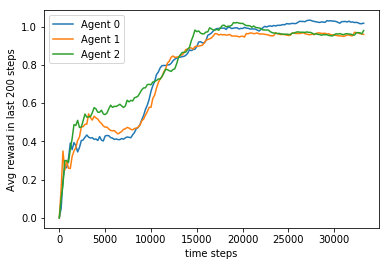

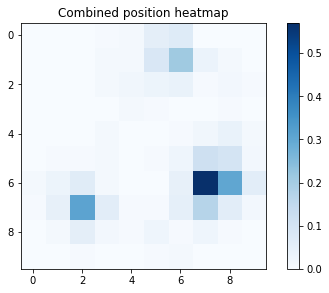

Per agent heatmaps:


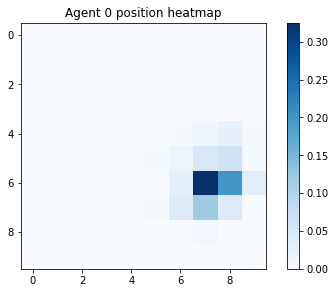

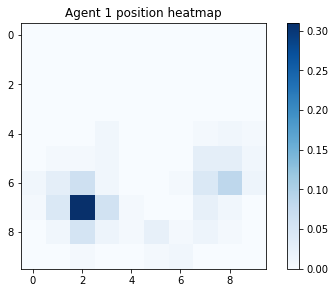

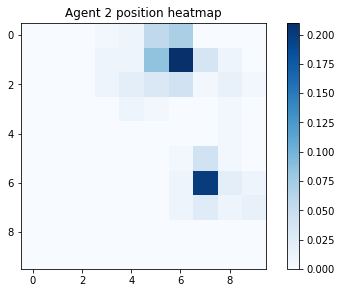

steps 33200 - 33400
gamma = 0.5370340694142368
avg reward for agent 0 : 1.016137241399958
avg reward for agent 1 : 0.965539953893596
avg reward for agent 2 : 0.9802101733481033


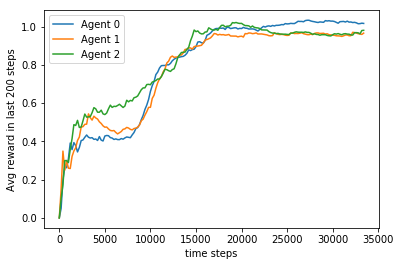

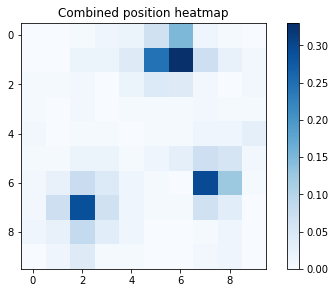

Per agent heatmaps:


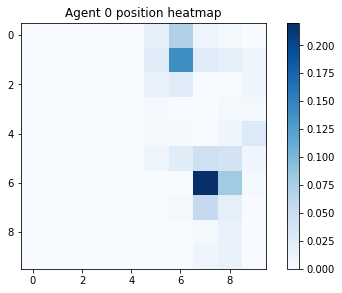

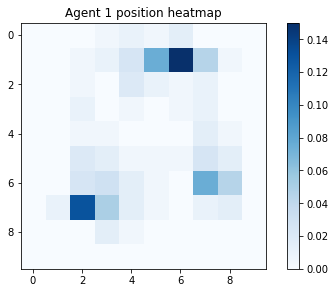

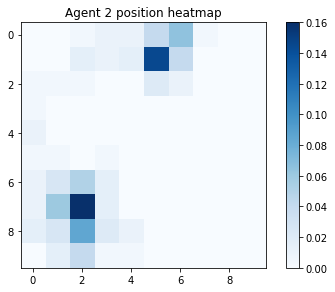

steps 33400 - 33600
gamma = 0.5359610692682184
avg reward for agent 0 : 1.0136603077289366
avg reward for agent 1 : 0.969018779203
avg reward for agent 2 : 0.9791375256688789


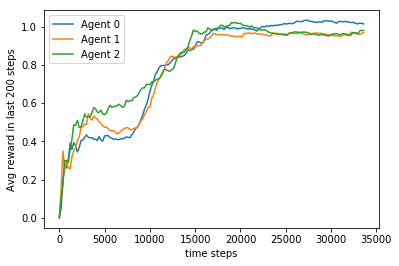

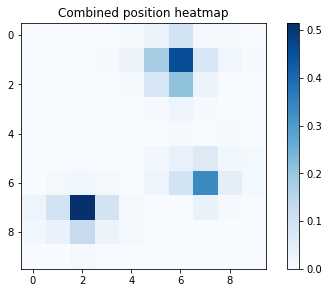

Per agent heatmaps:


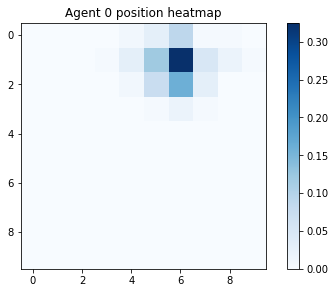

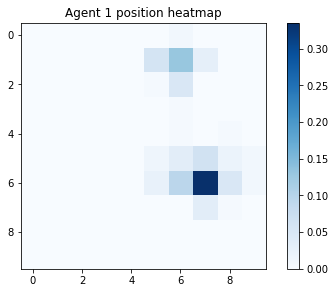

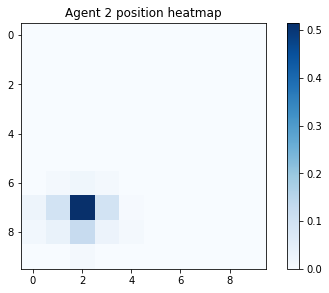

steps 33600 - 33800
gamma = 0.5348902129886297
avg reward for agent 0 : 1.0121002337208957
avg reward for agent 1 : 0.970681340788734
avg reward for agent 2 : 0.9783734209047069


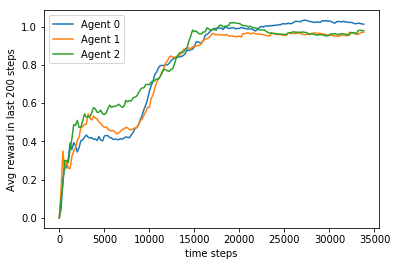

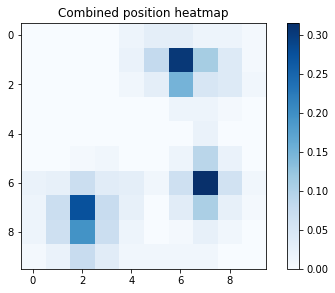

Per agent heatmaps:


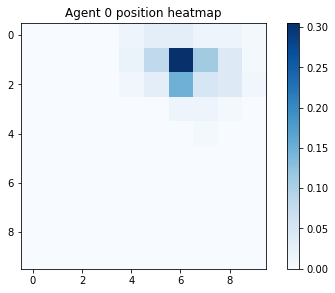

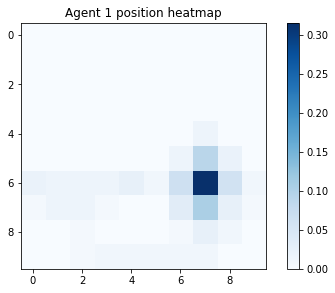

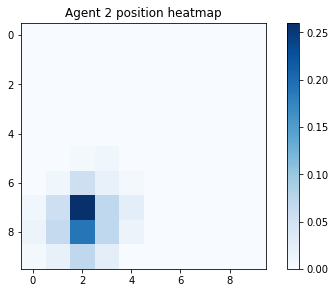

steps 33800 - 34000
gamma = 0.5338214962920025
avg reward for agent 0 : 1.0108526219817064
avg reward for agent 1 : 0.9696773624305167
avg reward for agent 2 : 0.9787947413311373


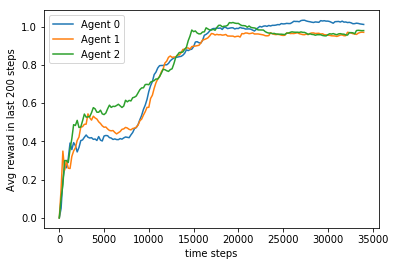

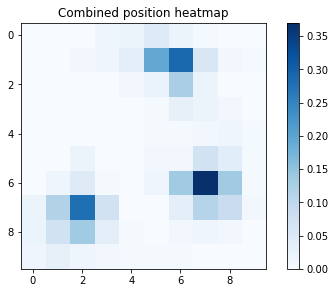

Per agent heatmaps:


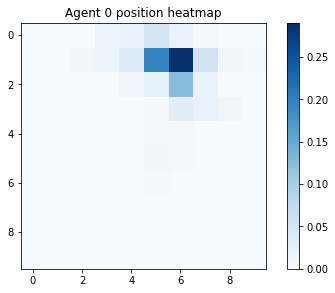

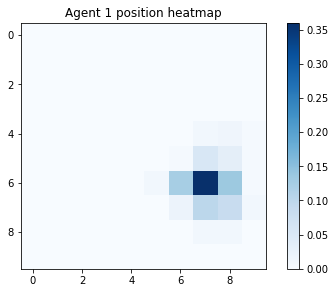

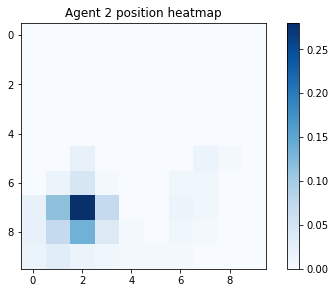

steps 34000 - 34200
gamma = 0.5327549149034244
avg reward for agent 0 : 1.0104967691003186
avg reward for agent 1 : 0.9686851261659016
avg reward for agent 2 : 0.9821350252916582


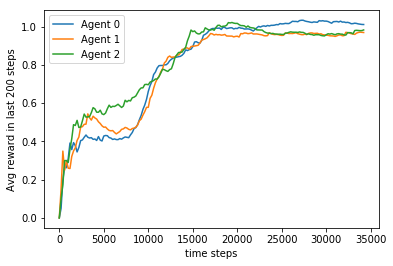

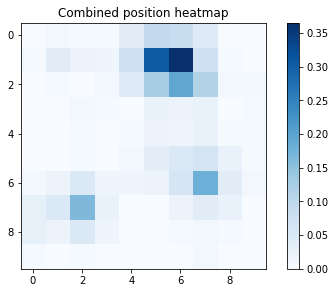

Per agent heatmaps:


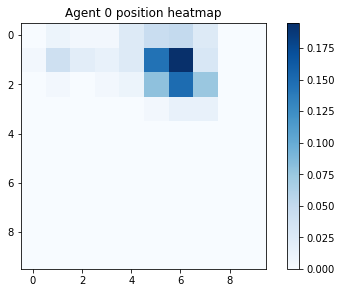

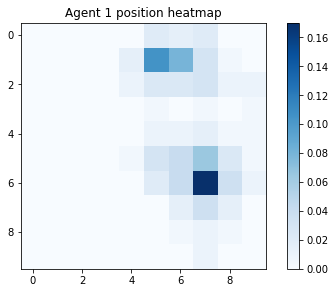

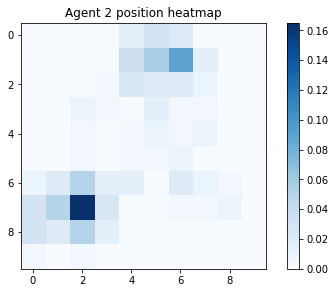

steps 34200 - 34400
gamma = 0.5316904645565265
avg reward for agent 0 : 1.0098543646987006
avg reward for agent 1 : 0.9659602918519811
avg reward for agent 2 : 0.9807854422836545


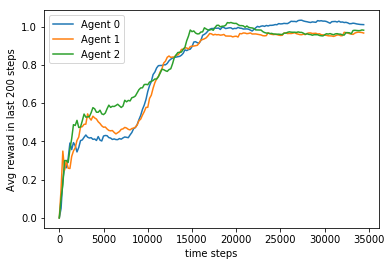

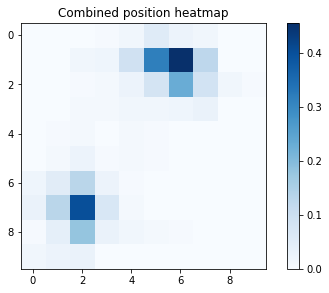

Per agent heatmaps:


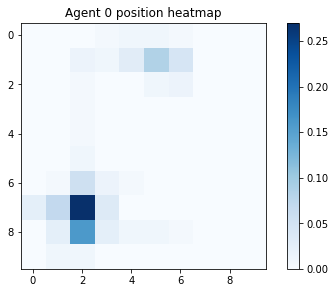

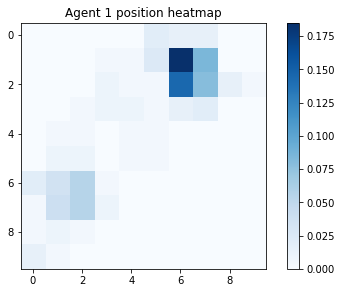

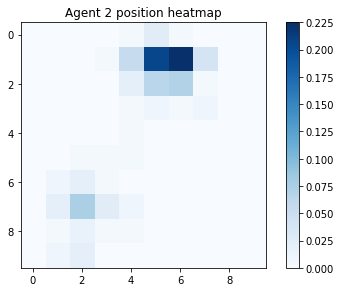

steps 34400 - 34600
gamma = 0.5306281409934639
avg reward for agent 0 : 1.0069073148174907
avg reward for agent 1 : 0.9667350654605358
avg reward for agent 2 : 0.9800294789167943


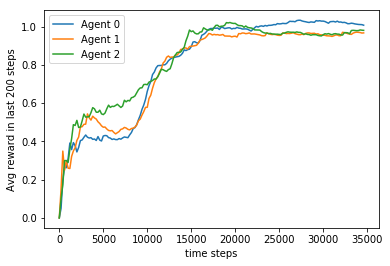

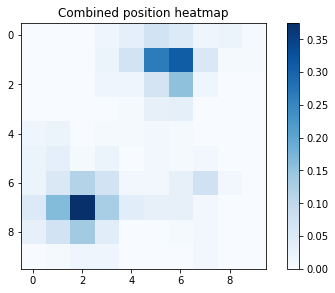

Per agent heatmaps:


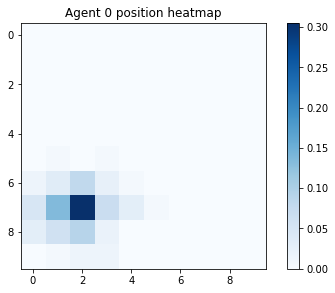

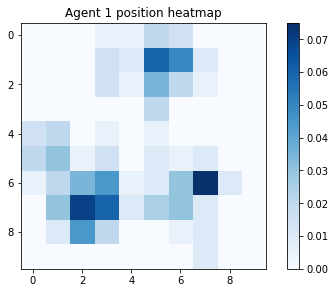

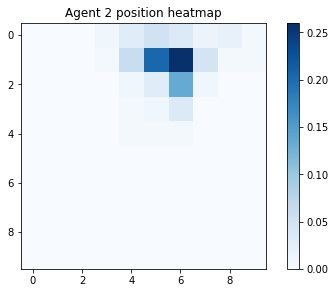

steps 34600 - 34800
gamma = 0.5295679399648986
avg reward for agent 0 : 1.005143530358323
avg reward for agent 1 : 0.9646274532341025
avg reward for agent 2 : 0.9781328122755093


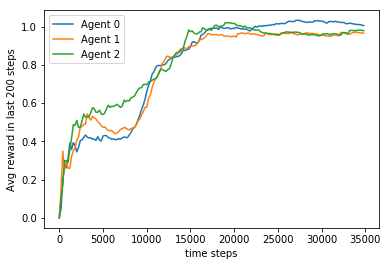

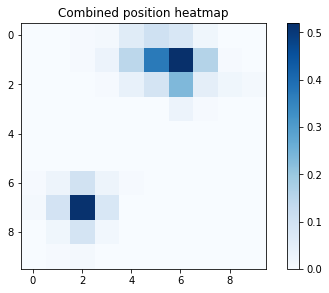

Per agent heatmaps:


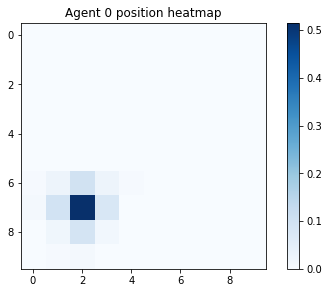

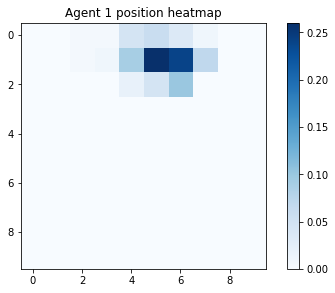

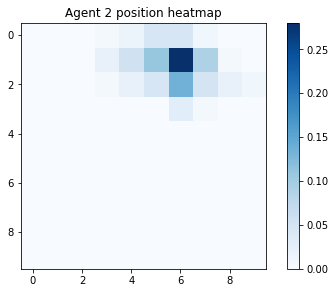

steps 34800 - 35000
gamma = 0.5285098572299817
avg reward for agent 0 : 1.012542498785749
avg reward for agent 1 : 0.9722579354875575
avg reward for agent 2 : 0.9794005885546128


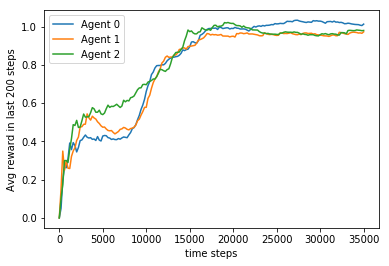

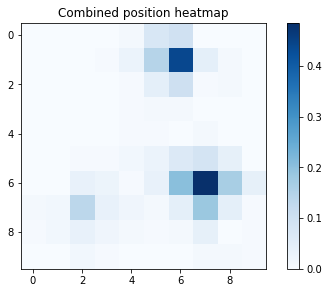

Per agent heatmaps:


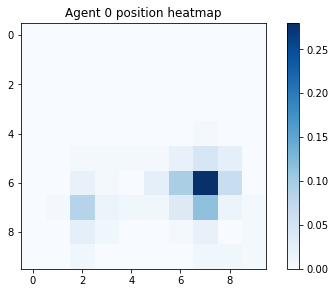

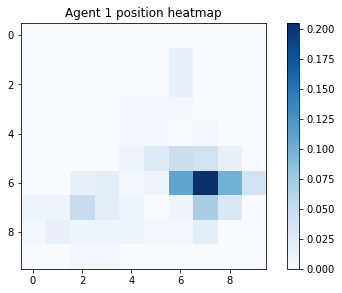

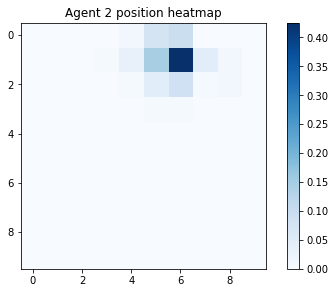

steps 35000 - 35200
gamma = 0.5274538885563389
avg reward for agent 0 : 1.0119030709354848
avg reward for agent 1 : 0.9735518877304622
avg reward for agent 2 : 0.9755404676003523


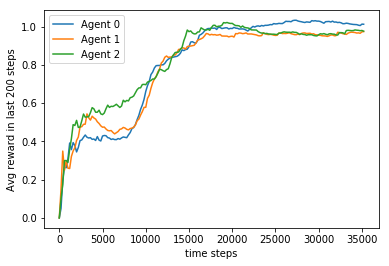

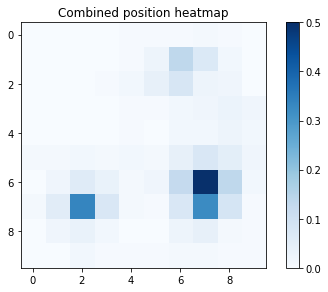

Per agent heatmaps:


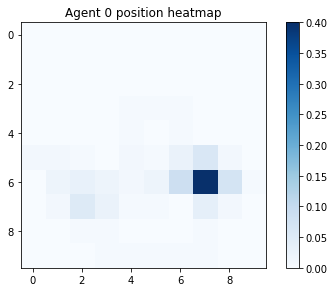

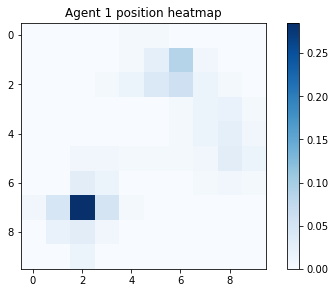

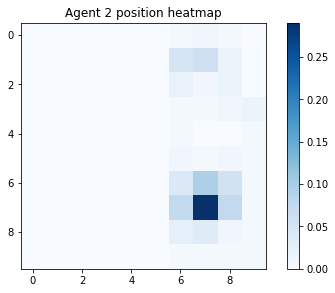

steps 35200 - 35400
gamma = 0.5264000297200531
avg reward for agent 0 : 1.0129657354312025
avg reward for agent 1 : 0.9700290952232988
avg reward for agent 2 : 0.9708765289116127


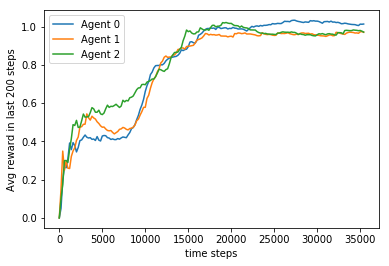

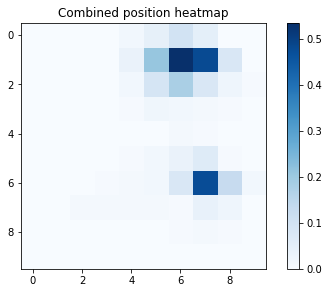

Per agent heatmaps:


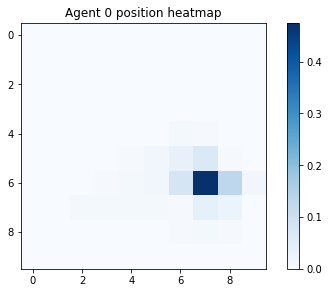

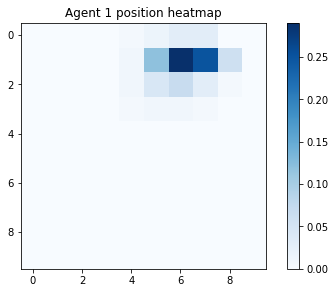

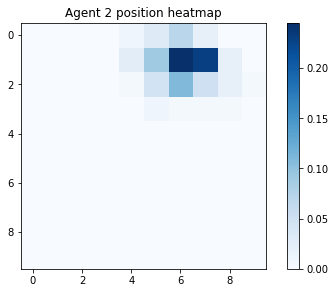

steps 35400 - 35600
gamma = 0.5253482765056432
avg reward for agent 0 : 1.0137355692255836
avg reward for agent 1 : 0.9673885565012219
avg reward for agent 2 : 0.9682312294598466


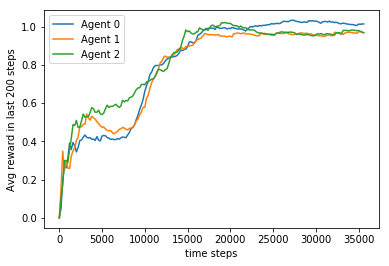

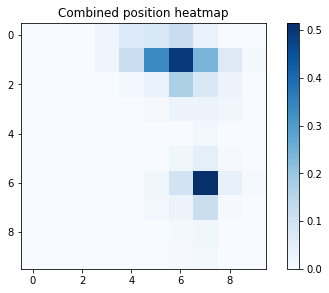

Per agent heatmaps:


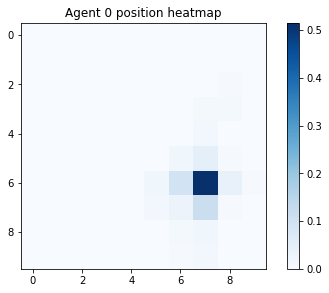

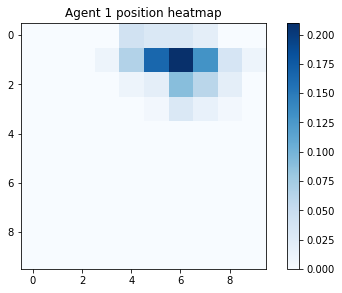

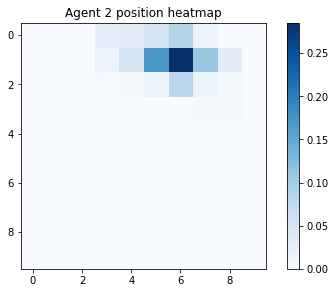

steps 35600 - 35800
gamma = 0.5242986247060549
avg reward for agent 0 : 1.0119829055054328
avg reward for agent 1 : 0.9656154856009609
avg reward for agent 2 : 0.9644981983743471


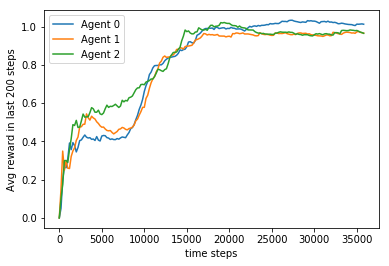

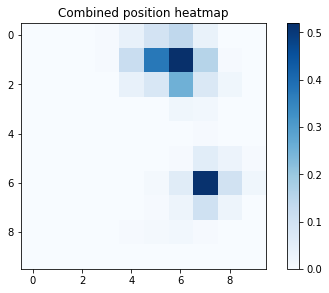

Per agent heatmaps:


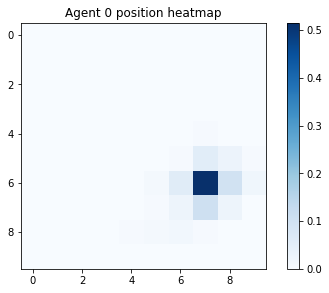

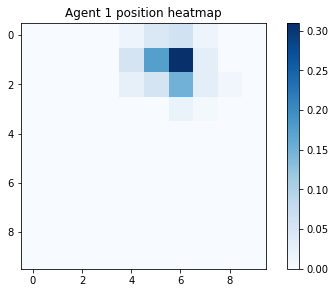

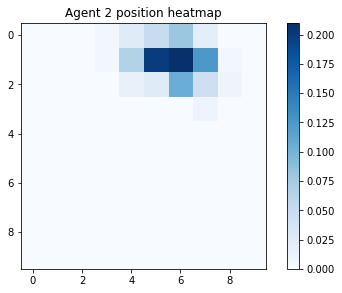

steps 35800 - 36000
gamma = 0.5232510701226363
avg reward for agent 0 : 1.0177495069581401
avg reward for agent 1 : 0.9658065053748507
avg reward for agent 2 : 0.9649731951890226


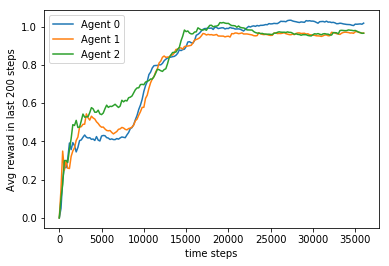

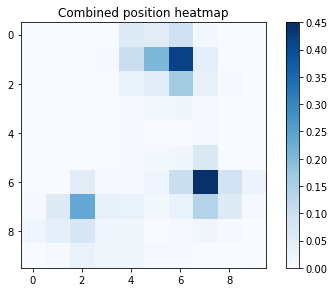

Per agent heatmaps:


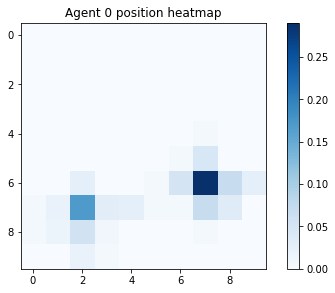

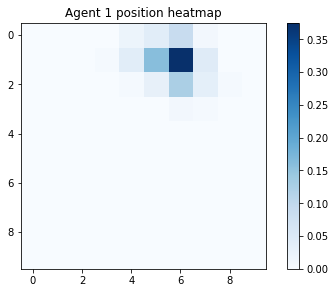

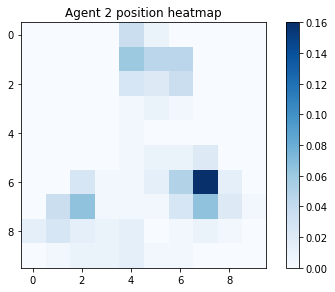

steps 36000 - 36200
gamma = 0.5222056085651252
avg reward for agent 0 : 1.0162702687771057
avg reward for agent 1 : 0.9640617662495511
avg reward for agent 2 : 0.9607469406922461


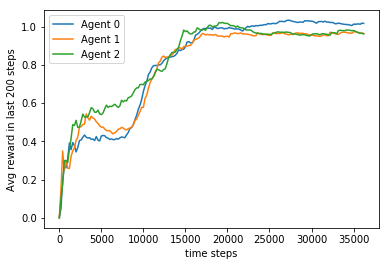

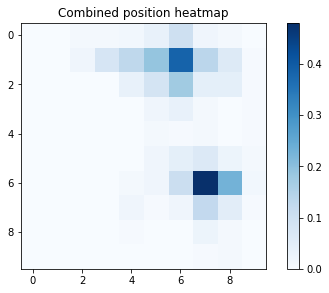

Per agent heatmaps:


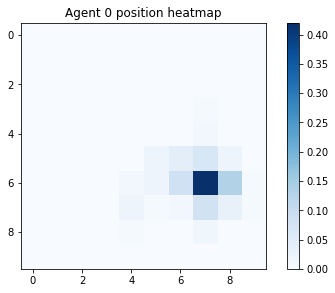

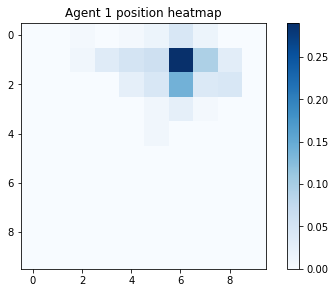

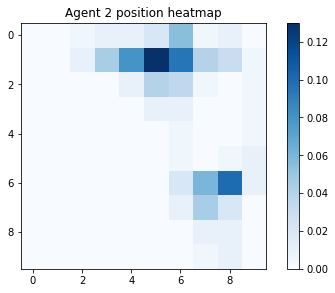

steps 36200 - 36400
gamma = 0.5211622358516338
avg reward for agent 0 : 1.0224993818851131
avg reward for agent 1 : 0.9609626109172825
avg reward for agent 2 : 0.9571165627317931


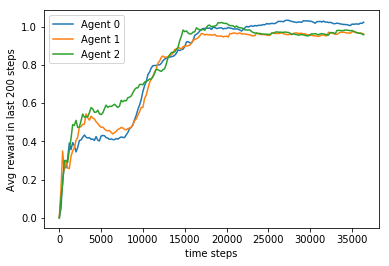

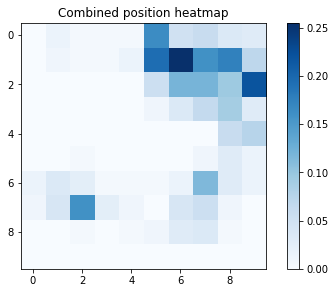

Per agent heatmaps:


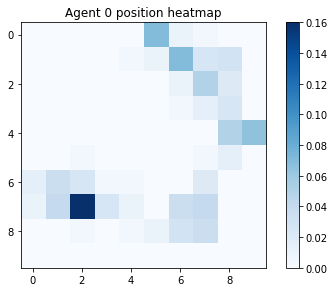

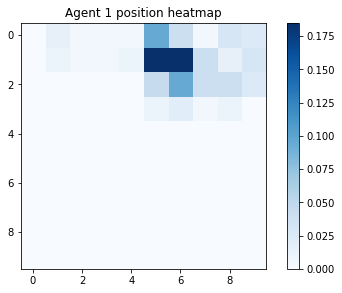

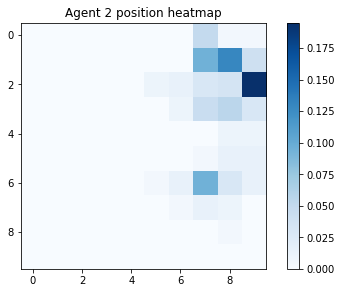

steps 36400 - 36600
gamma = 0.5201209478086267
avg reward for agent 0 : 1.023742520696156
avg reward for agent 1 : 0.9652741728368077
avg reward for agent 2 : 0.9554383760006557


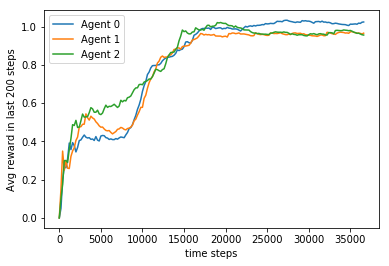

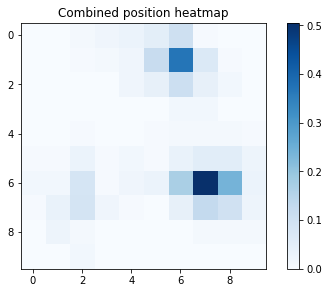

Per agent heatmaps:


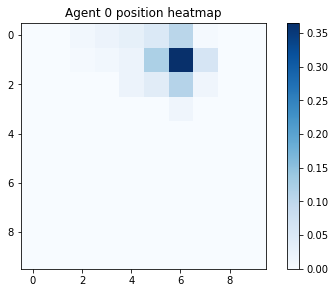

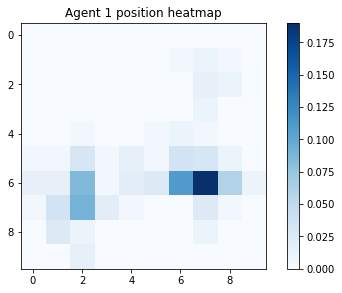

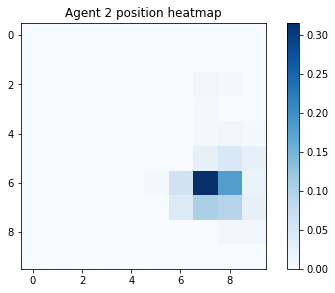

steps 36600 - 36800
gamma = 0.5190817402709101
avg reward for agent 0 : 1.0268742697209314
avg reward for agent 1 : 0.9747017744083041
avg reward for agent 2 : 0.9586696013695281


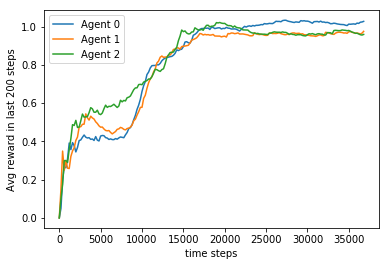

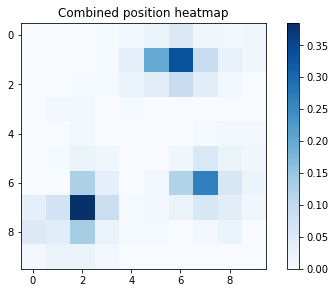

Per agent heatmaps:


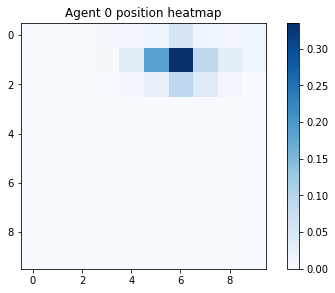

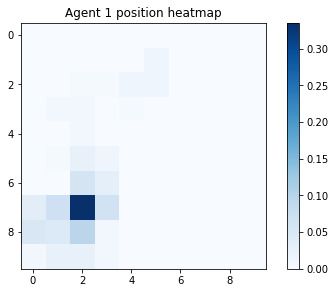

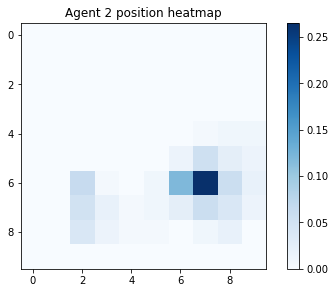

steps 36800 - 37000
gamma = 0.5180446090816098
avg reward for agent 0 : 1.0242966406313343
avg reward for agent 1 : 0.978892462365882
avg reward for agent 2 : 0.9561903732331558


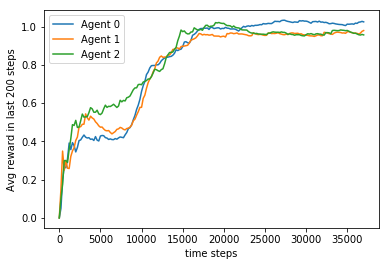

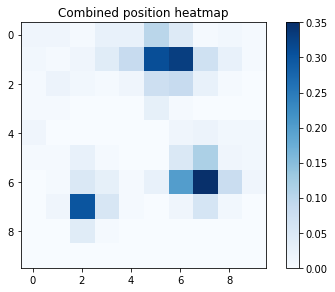

Per agent heatmaps:


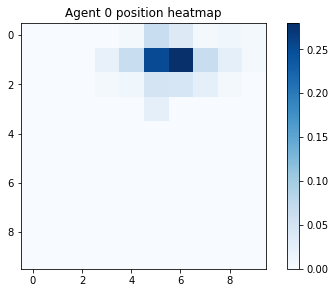

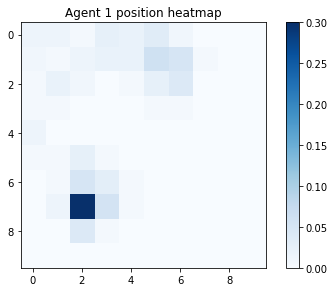

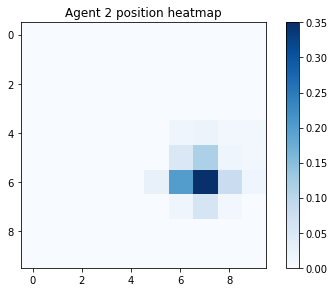

steps 37000 - 37200
gamma = 0.517009550092159
avg reward for agent 0 : 1.0249724469772319
avg reward for agent 1 : 0.9776618908093868
avg reward for agent 2 : 0.9575011424424075


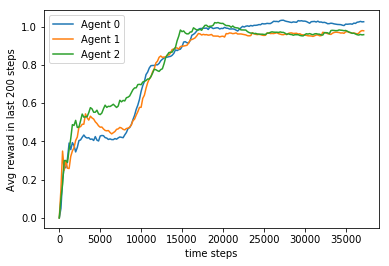

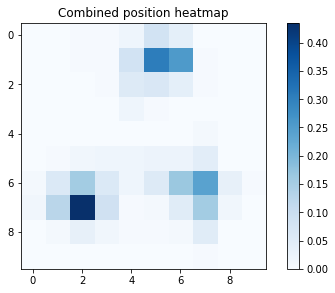

Per agent heatmaps:


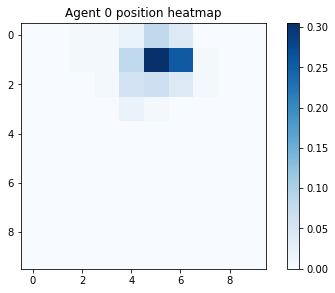

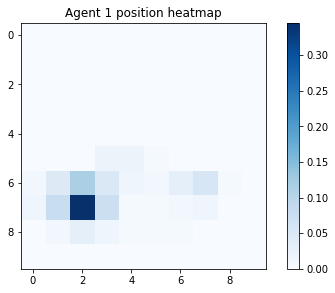

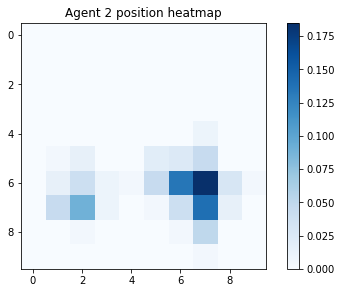

steps 37200 - 37400
gamma = 0.5159765591622776
avg reward for agent 0 : 1.0216304376888319
avg reward for agent 1 : 0.9740381273227988
avg reward for agent 2 : 0.9553220502125611


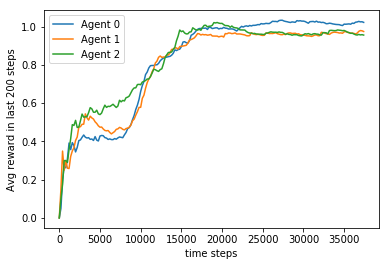

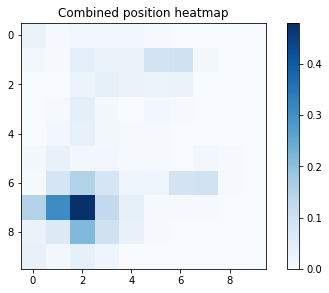

Per agent heatmaps:


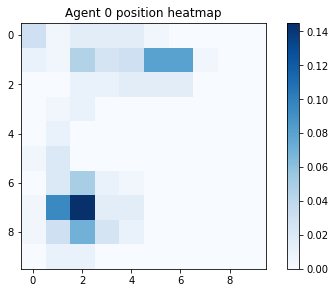

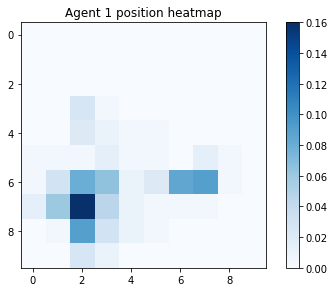

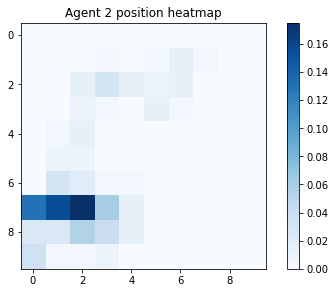

steps 37400 - 37600
gamma = 0.5149456321599604
avg reward for agent 0 : 1.0207175341081354
avg reward for agent 1 : 0.9707188638600037
avg reward for agent 2 : 0.9590170474189517


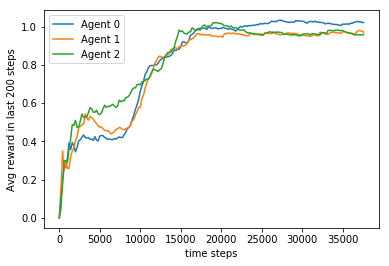

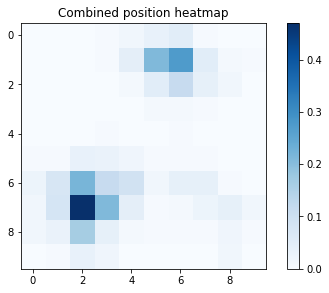

Per agent heatmaps:


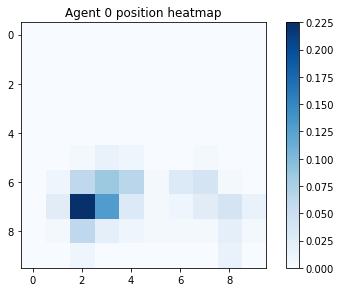

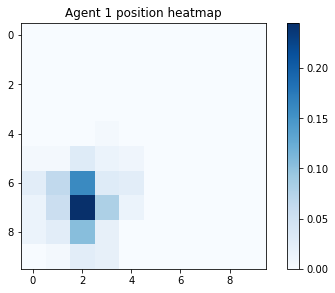

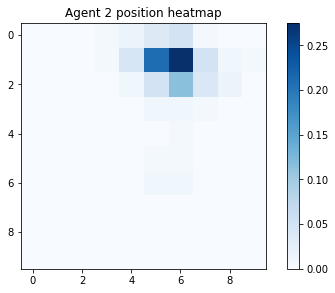

steps 37600 - 37800
gamma = 0.5139167649614569
avg reward for agent 0 : 1.0184915742969762
avg reward for agent 1 : 0.970873786407767
avg reward for agent 2 : 0.9592338827015159


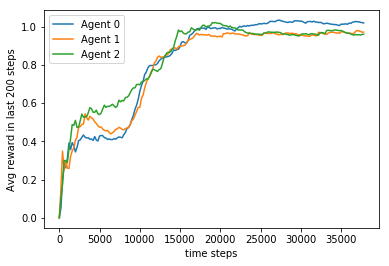

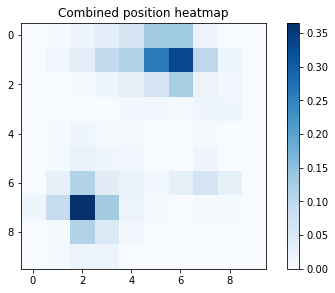

Per agent heatmaps:


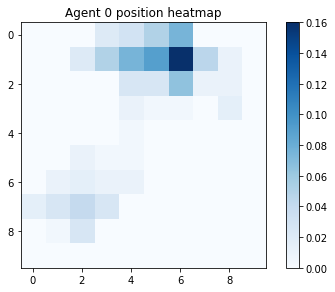

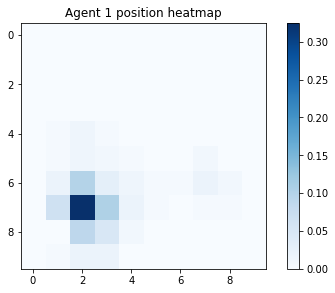

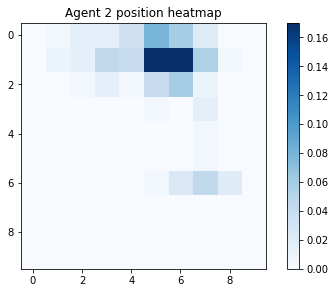

steps 37800 - 38000
gamma = 0.5128899534512551
avg reward for agent 0 : 1.0157627430857084
avg reward for agent 1 : 0.9757637956895872
avg reward for agent 2 : 0.9557643219915265


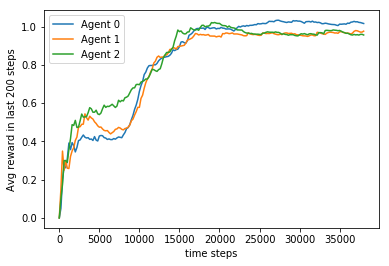

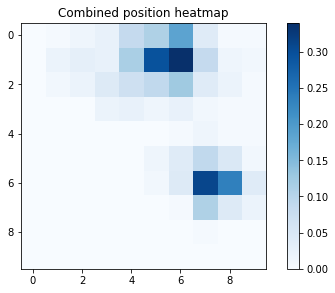

Per agent heatmaps:


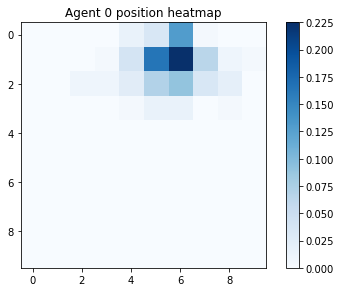

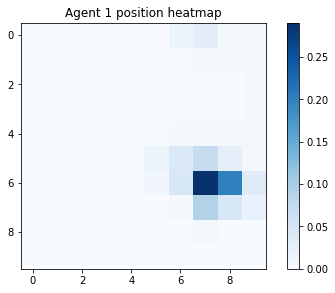

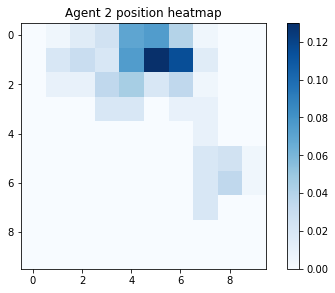

steps 38000 - 38200
gamma = 0.5118651935220666
avg reward for agent 0 : 1.0154184445433365
avg reward for agent 1 : 0.9737964974738881
avg reward for agent 2 : 0.952069317557132


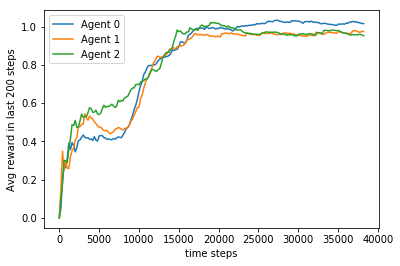

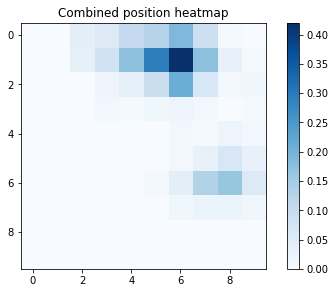

Per agent heatmaps:


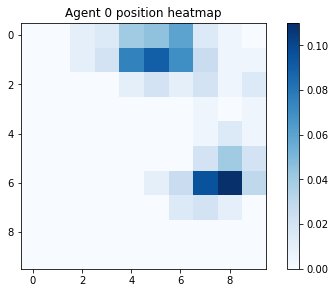

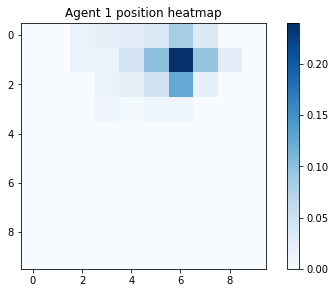

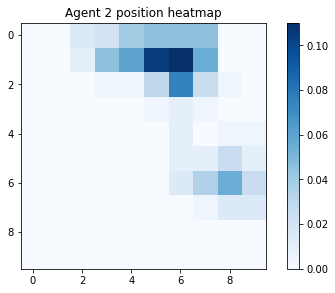

steps 38200 - 38400
gamma = 0.5108424810748097
avg reward for agent 0 : 1.0129944532694461
avg reward for agent 1 : 0.9697664123330122
avg reward for agent 2 : 0.9515377203718653


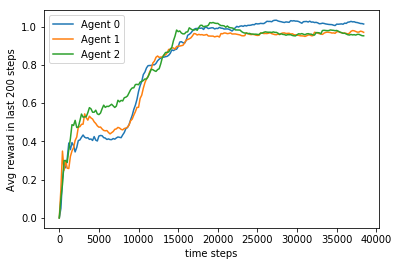

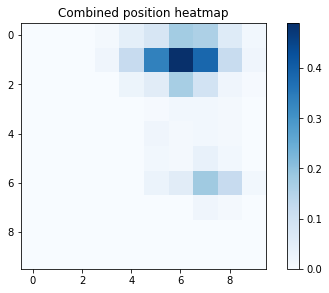

Per agent heatmaps:


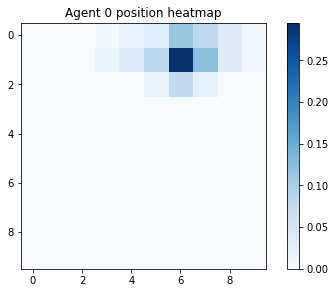

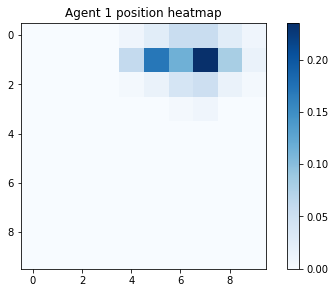

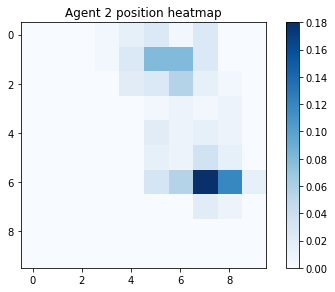

steps 38400 - 38600
gamma = 0.5098218120185911
avg reward for agent 0 : 1.011113701717572
avg reward for agent 1 : 0.9665552705888448
avg reward for agent 2 : 0.9523069350534961


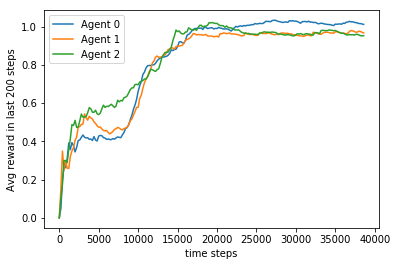

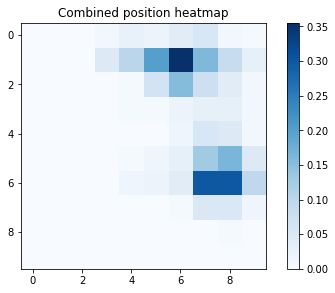

Per agent heatmaps:


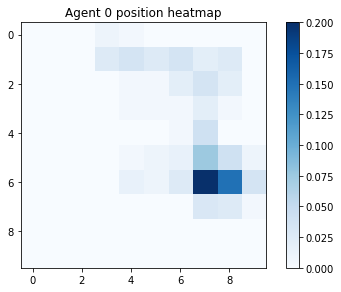

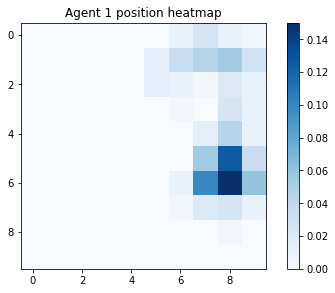

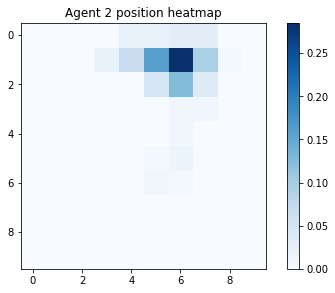

steps 38600 - 38800
gamma = 0.5088031822706938
avg reward for agent 0 : 1.007705986959099
avg reward for agent 1 : 0.9641504084946264
avg reward for agent 2 : 0.9543568464730291


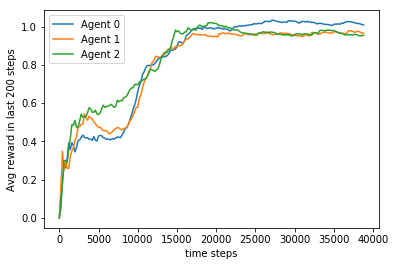

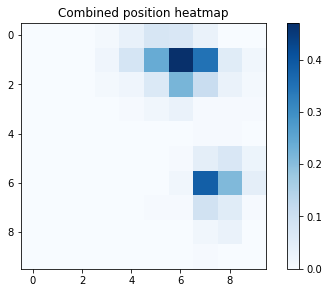

Per agent heatmaps:


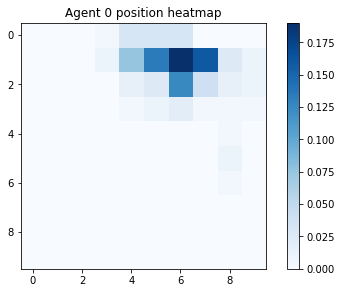

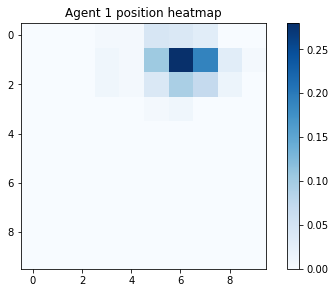

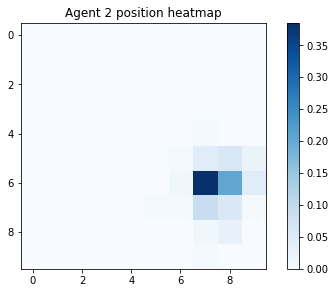

steps 38800 - 39000
gamma = 0.5077865877565567
avg reward for agent 0 : 1.0081792774544243
avg reward for agent 1 : 0.9648470552037127
avg reward for agent 2 : 0.9702315325248071


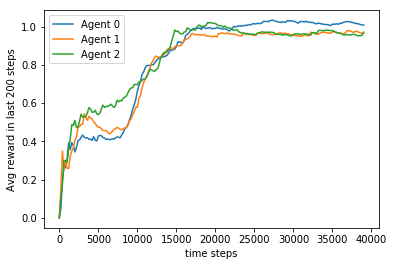

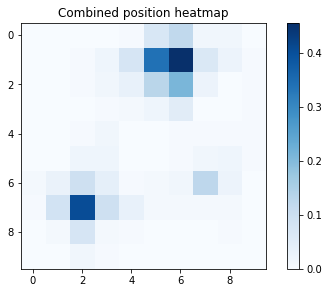

Per agent heatmaps:


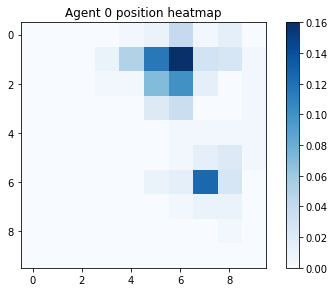

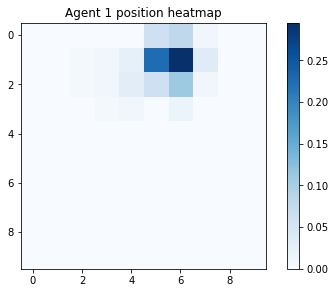

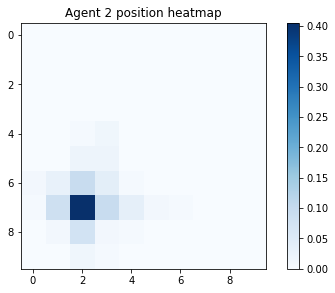

steps 39000 - 39200
gamma = 0.5067720244097599
avg reward for agent 0 : 1.008137547511543
avg reward for agent 1 : 0.9759955103186143
avg reward for agent 2 : 0.9680875487870207


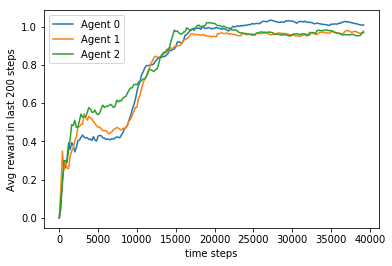

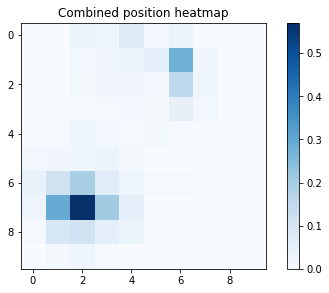

Per agent heatmaps:


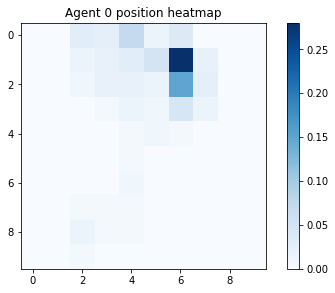

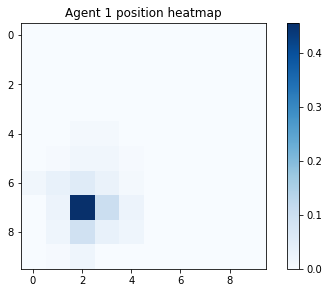

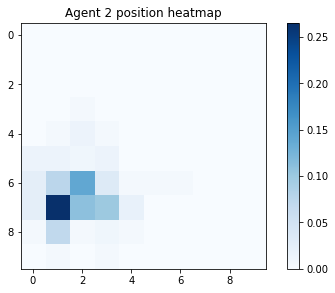

steps 39200 - 39400
gamma = 0.5057594881720069
avg reward for agent 0 : 1.0088576432070253
avg reward for agent 1 : 0.9751021547676455
avg reward for agent 2 : 0.9753559554326032


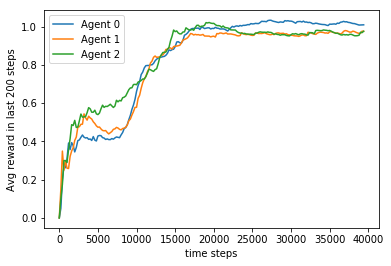

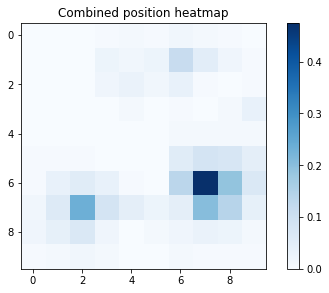

Per agent heatmaps:


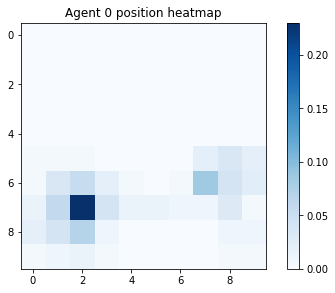

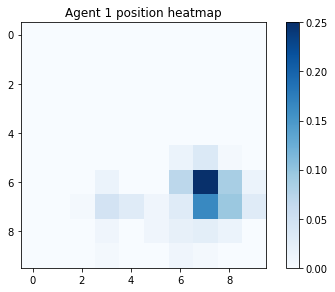

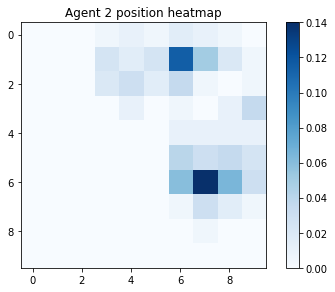

steps 39400 - 39600
gamma = 0.5047489749931114
avg reward for agent 0 : 1.0083078710133582
avg reward for agent 1 : 0.9729552284033232
avg reward for agent 2 : 0.9767430115401127


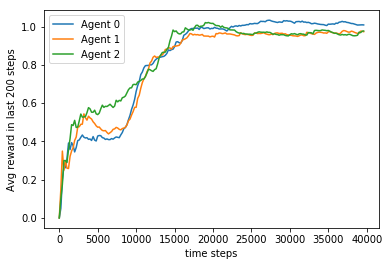

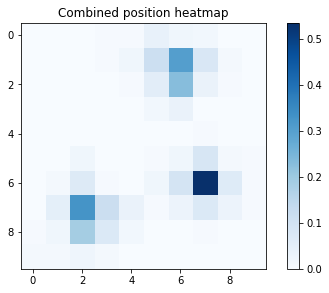

Per agent heatmaps:


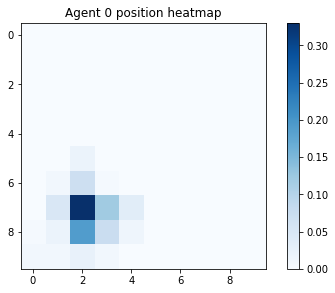

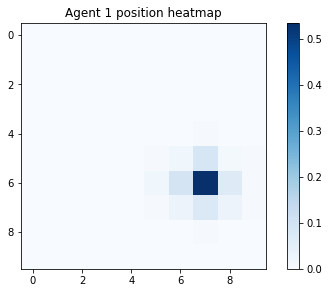

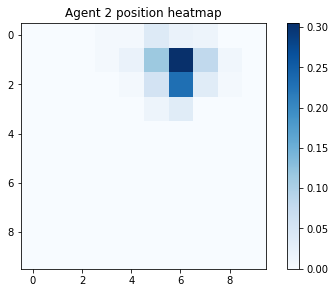

steps 39600 - 39800
gamma = 0.503740480830979
avg reward for agent 0 : 1.0085173739353284
avg reward for agent 1 : 0.9715836285520464
avg reward for agent 2 : 0.9756036280495465


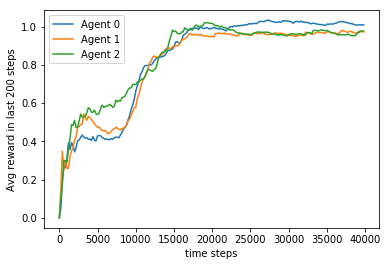

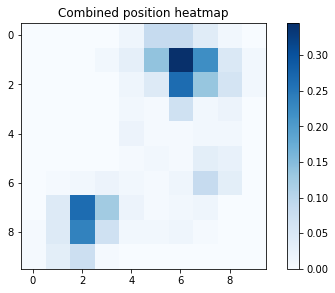

Per agent heatmaps:


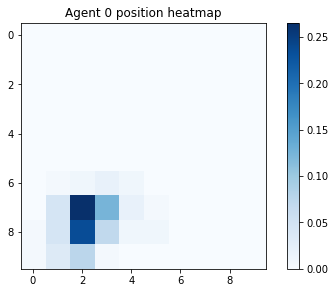

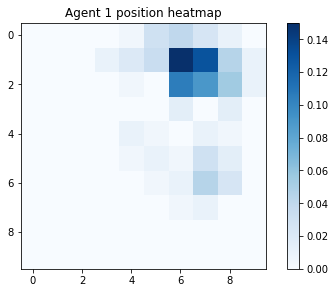

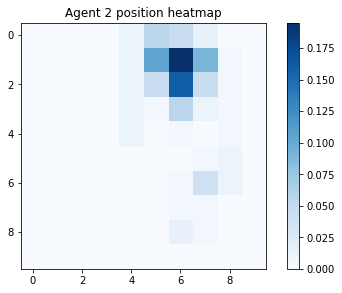

steps 39800 - 40000
gamma = 0.5027340016515915
avg reward for agent 0 : 1.0084747881302967
avg reward for agent 1 : 0.9699757506062349
avg reward for agent 2 : 0.9779755506112348


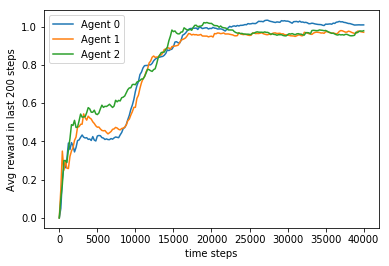

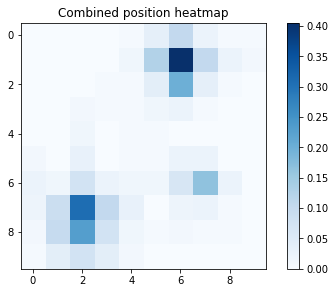

Per agent heatmaps:


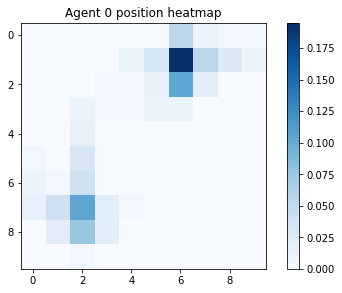

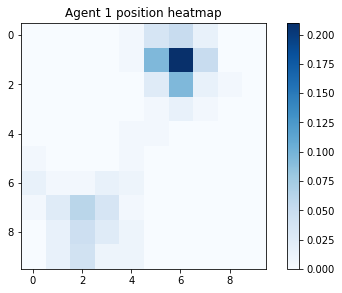

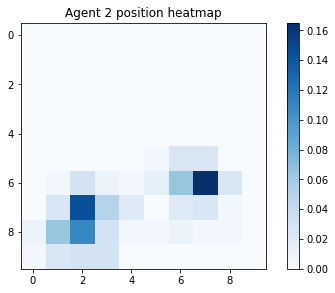

steps 40000 - 40200
gamma = 0.501729533428991
avg reward for agent 0 : 1.0074376259297033
avg reward for agent 1 : 0.9696276212034527
avg reward for agent 2 : 0.9825626228203278


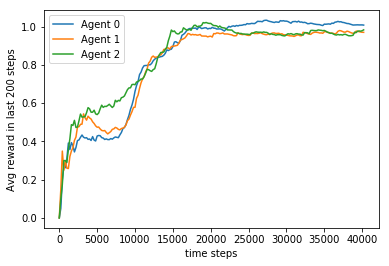

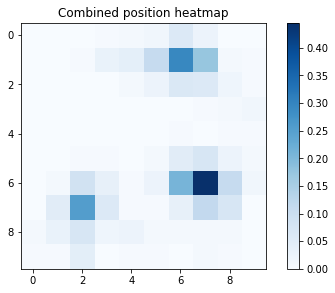

Per agent heatmaps:


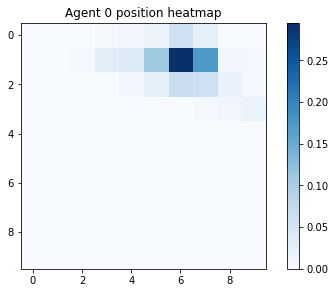

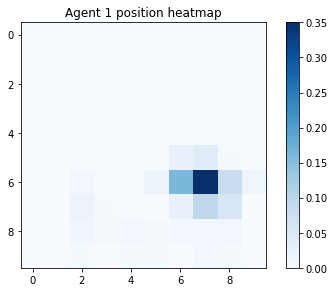

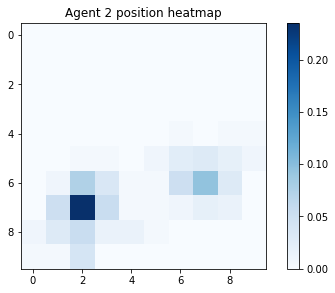

steps 40200 - 40400
gamma = 0.5007270721452615
avg reward for agent 0 : 1.005668176530284
avg reward for agent 1 : 0.9690354199153486
avg reward for agent 2 : 0.9811638325784016


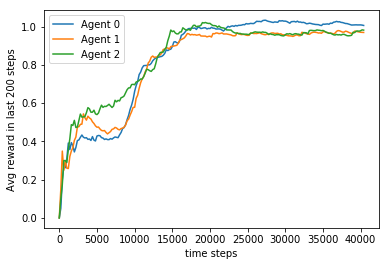

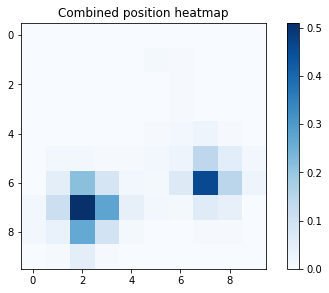

Per agent heatmaps:


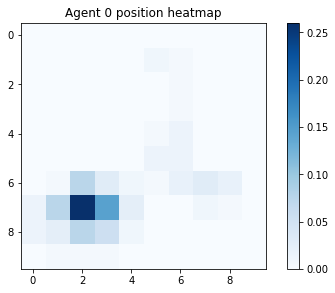

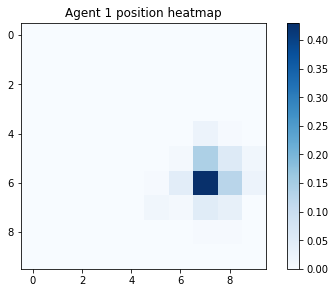

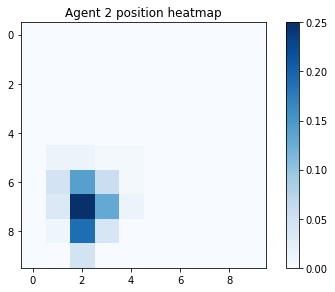

steps 40400 - 40600
gamma = 0.4997266137905182
avg reward for agent 0 : 1.0085958473929213
avg reward for agent 1 : 0.9701731484446195
avg reward for agent 2 : 0.9792862244772296


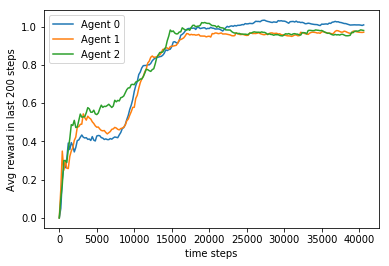

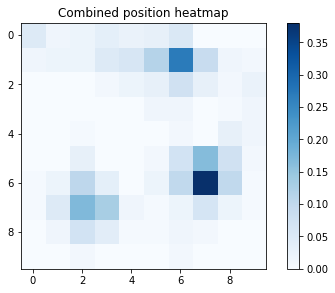

Per agent heatmaps:


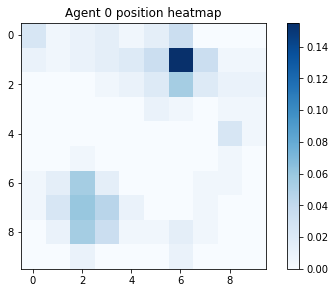

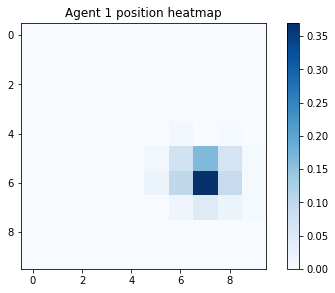

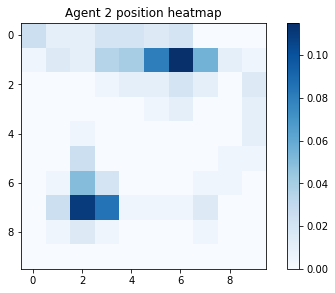

steps 40600 - 40800
gamma = 0.4987281543628857
avg reward for agent 0 : 1.0063478836303033
avg reward for agent 1 : 0.9766917477512806
avg reward for agent 2 : 0.9769368397833387


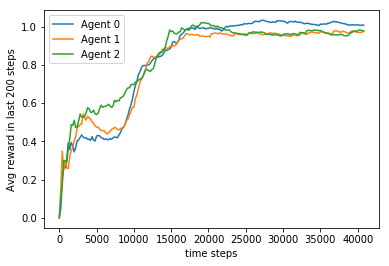

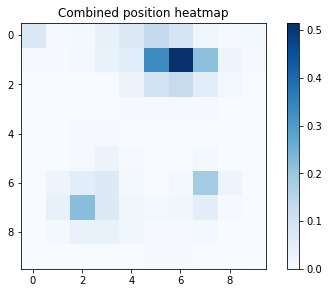

Per agent heatmaps:


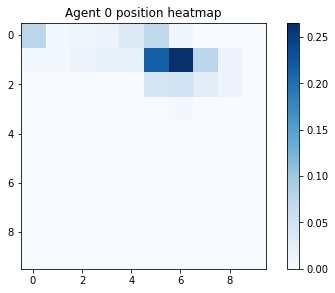

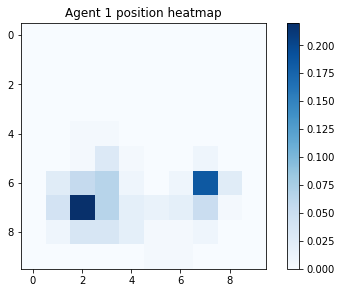

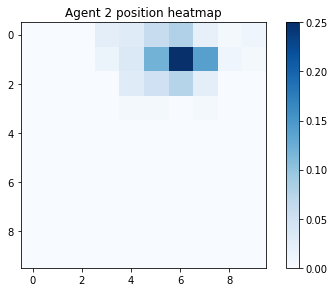

steps 40800 - 41000
gamma = 0.4977316898684843
avg reward for agent 0 : 1.0104631594351356
avg reward for agent 1 : 0.9763176507890051
avg reward for agent 2 : 0.9777810297309821


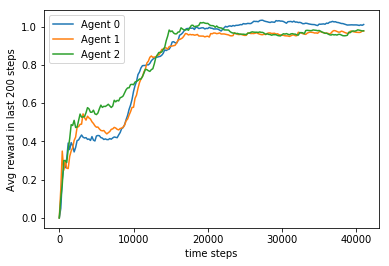

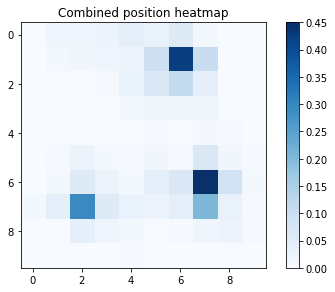

Per agent heatmaps:


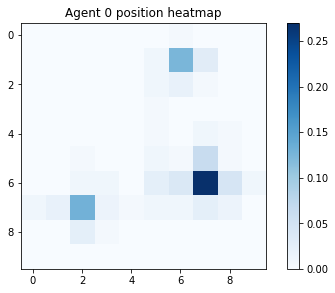

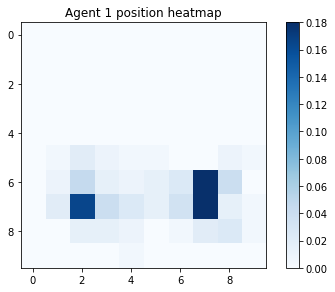

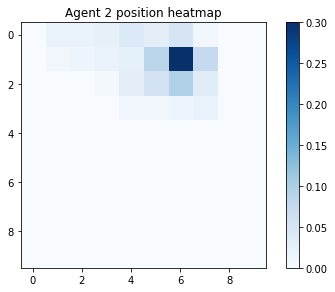

steps 41000 - 41200
gamma = 0.496737216321416
avg reward for agent 0 : 1.009198805854227
avg reward for agent 1 : 0.9747336229703163
avg reward for agent 2 : 0.9774034610810417


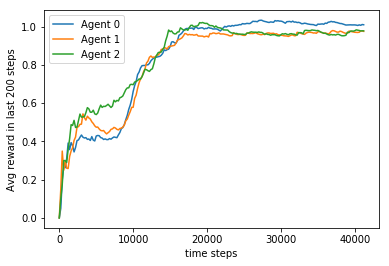

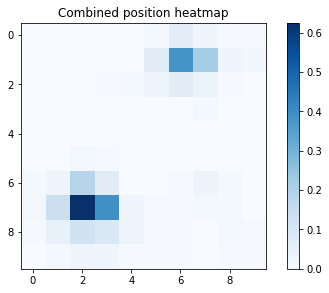

Per agent heatmaps:


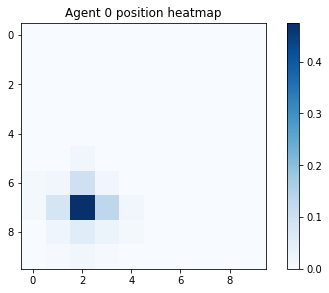

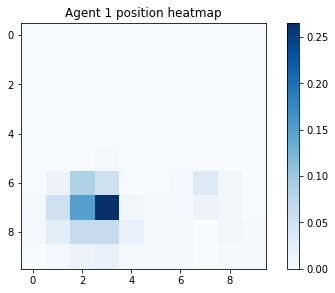

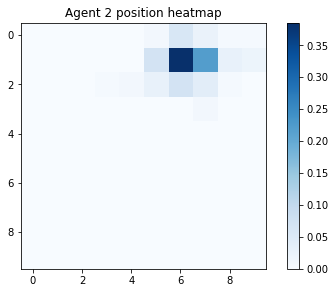

steps 41200 - 41400
gamma = 0.4957447297437446
avg reward for agent 0 : 1.0106036086084877
avg reward for agent 1 : 0.9816188014782251
avg reward for agent 2 : 0.9787203207651989


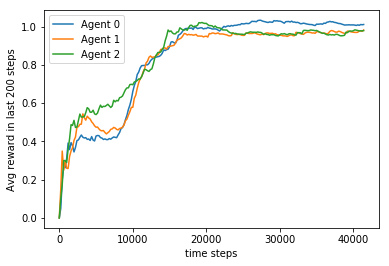

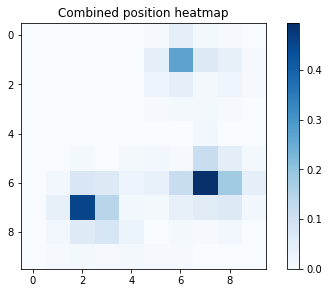

Per agent heatmaps:


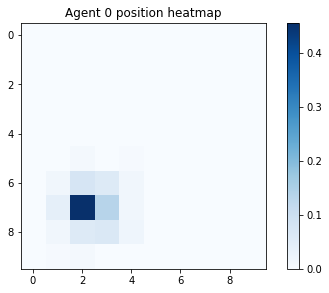

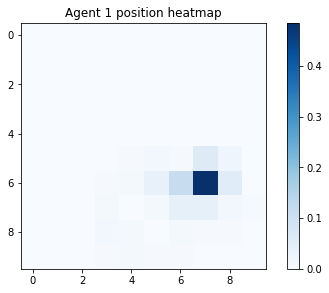

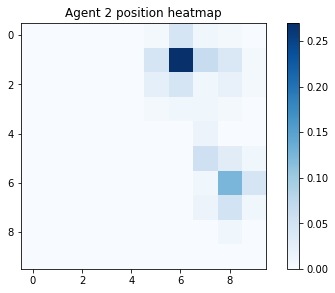

steps 41400 - 41600
gamma = 0.4947542261654832
avg reward for agent 0 : 1.0103122521093244
avg reward for agent 1 : 0.9805052763154732
avg reward for agent 2 : 0.9766592149227182


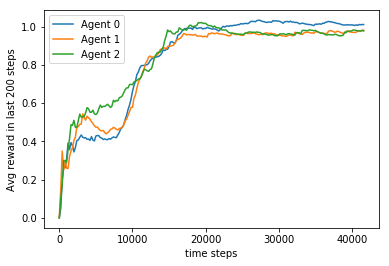

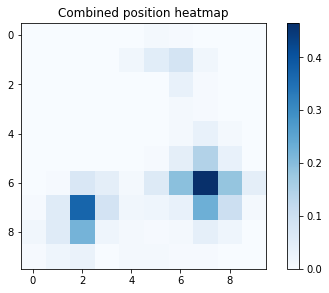

Per agent heatmaps:


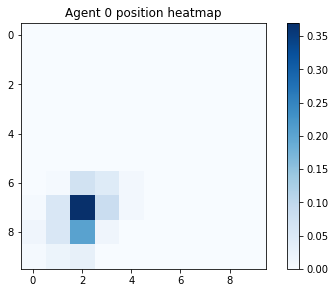

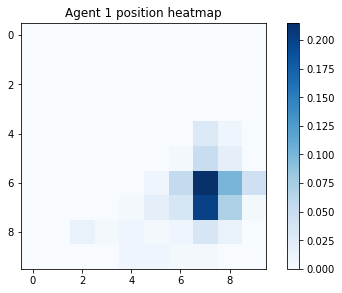

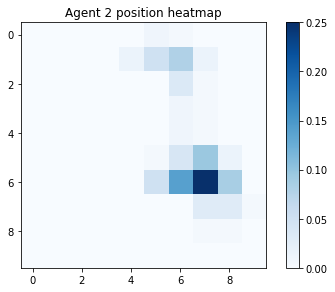

steps 41600 - 41800
gamma = 0.49376570162457645
avg reward for agent 0 : 1.0078706251046625
avg reward for agent 1 : 0.9803593215473314
avg reward for agent 2 : 0.9750962895624506


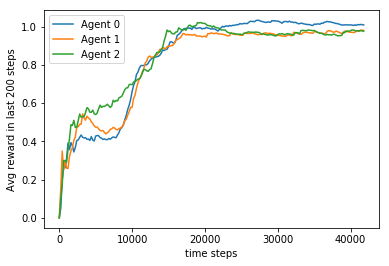

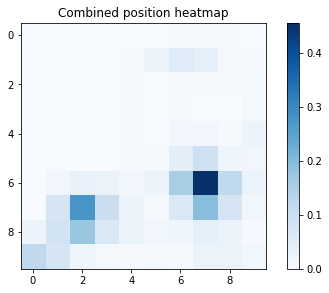

Per agent heatmaps:


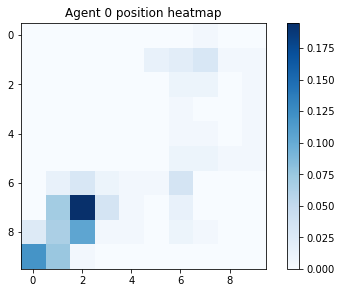

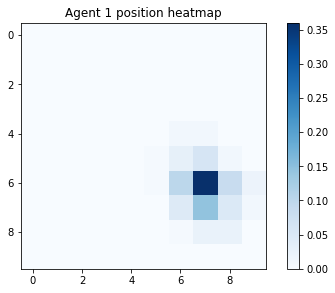

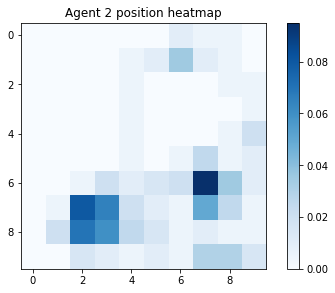

steps 41800 - 42000
gamma = 0.4927791521668855
avg reward for agent 0 : 1.0068807885526536
avg reward for agent 1 : 0.979500488083617
avg reward for agent 2 : 0.9768815028213614


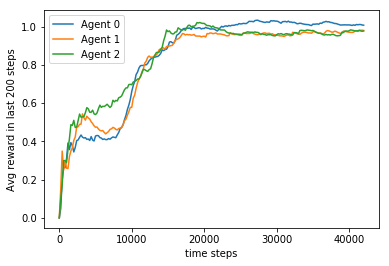

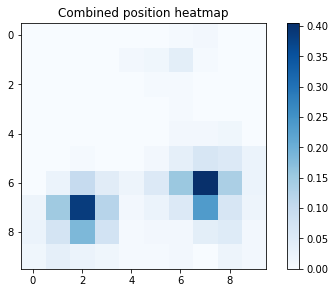

Per agent heatmaps:


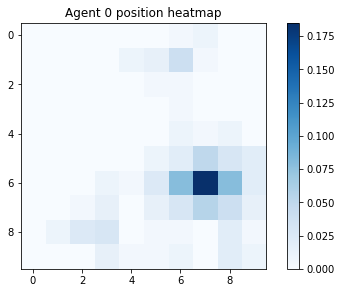

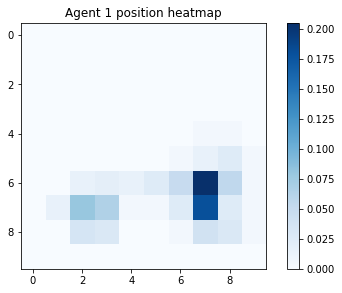

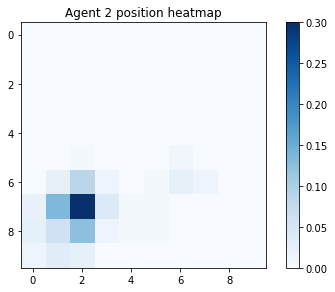

steps 42000 - 42200
gamma = 0.4917945738461717
avg reward for agent 0 : 1.0049524892775052
avg reward for agent 1 : 0.9769910665624038
avg reward for agent 2 : 0.9838629416364542


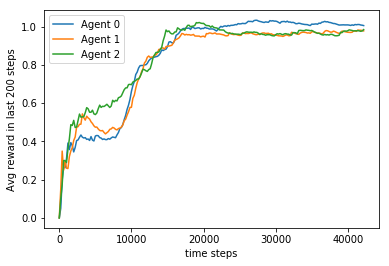

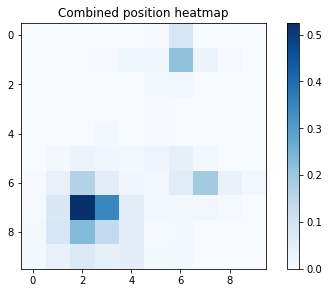

Per agent heatmaps:


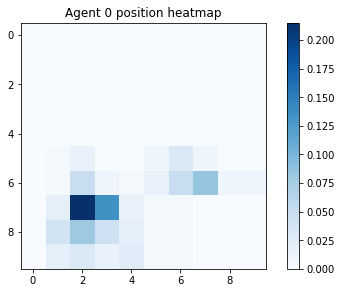

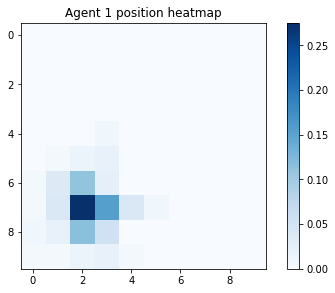

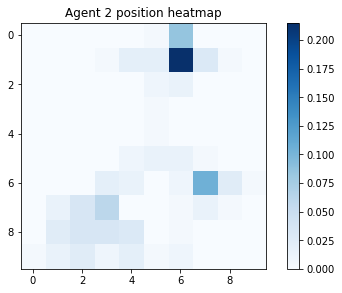

steps 42200 - 42400
gamma = 0.49081196272408106
avg reward for agent 0 : 1.0068158769840334
avg reward for agent 1 : 0.9754486922478244
avg reward for agent 2 : 0.9860616494893988


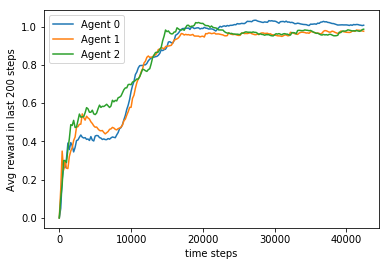

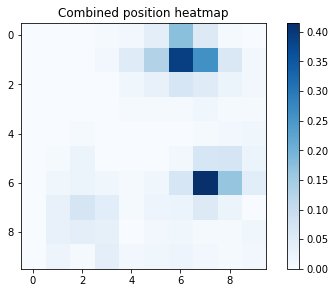

Per agent heatmaps:


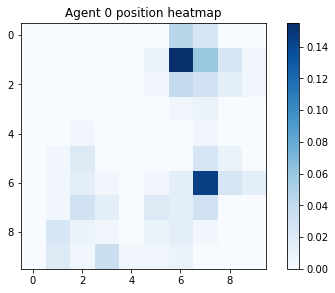

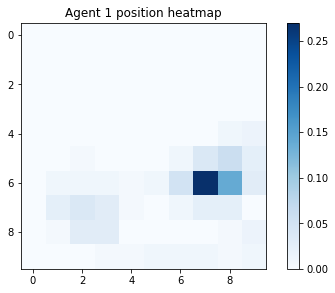

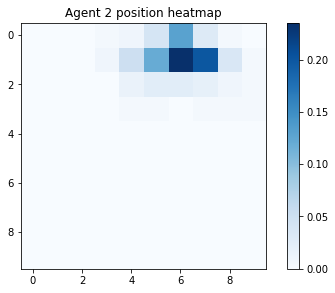

steps 42400 - 42600
gamma = 0.4898313148701276
avg reward for agent 0 : 1.0042017793009554
avg reward for agent 1 : 0.9783807891833525
avg reward for agent 2 : 0.9828407783854839


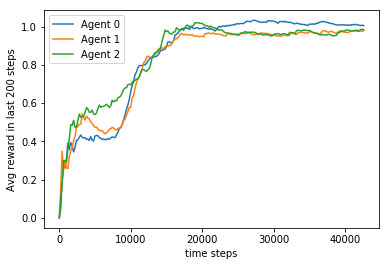

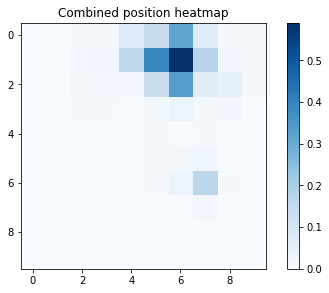

Per agent heatmaps:


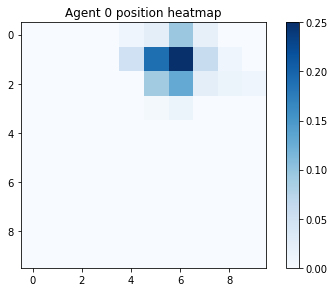

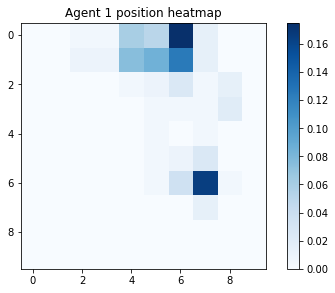

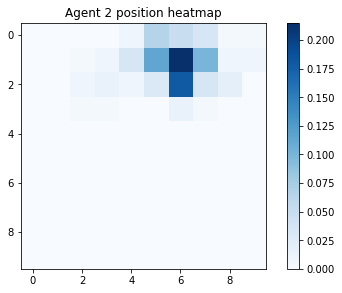

steps 42600 - 42800
gamma = 0.4888526263616809
avg reward for agent 0 : 1.0025466694703395
avg reward for agent 1 : 0.9831545991916076
avg reward for agent 2 : 0.9798836475783276


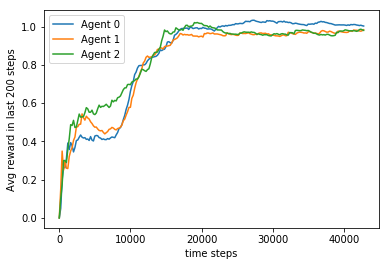

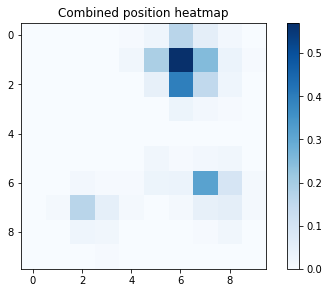

Per agent heatmaps:


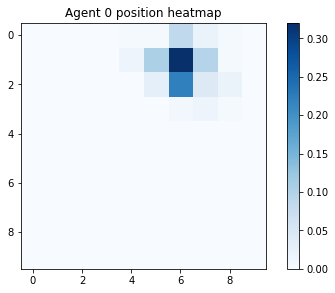

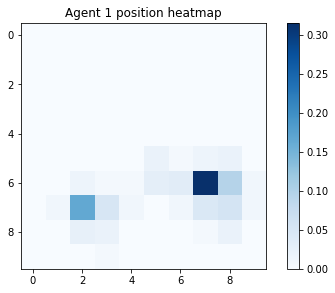

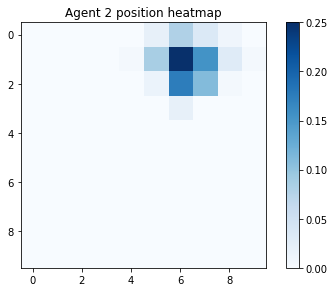

steps 42800 - 43000
gamma = 0.4878758932839452
avg reward for agent 0 : 1.002302272040185
avg reward for agent 1 : 0.9853259226529616
avg reward for agent 2 : 0.979279551638334


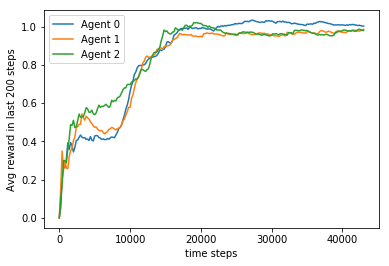

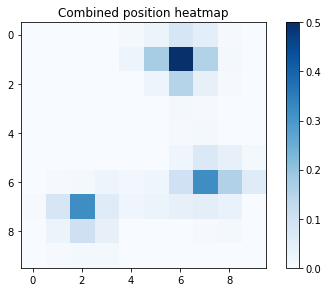

Per agent heatmaps:


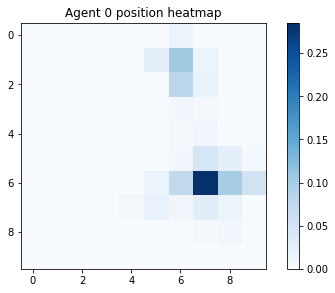

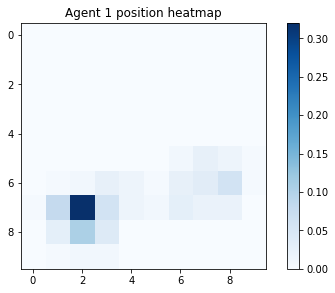

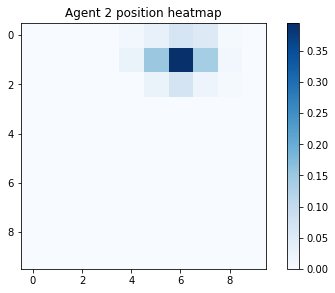

steps 43000 - 43200
gamma = 0.4869011117299487
avg reward for agent 0 : 1.000208328510914
avg reward for agent 1 : 0.9849309043772135
avg reward for agent 2 : 0.9765977639406496


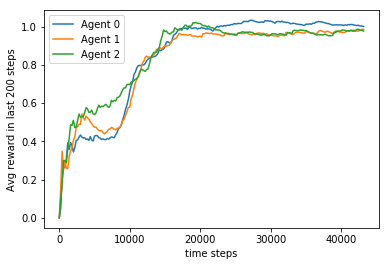

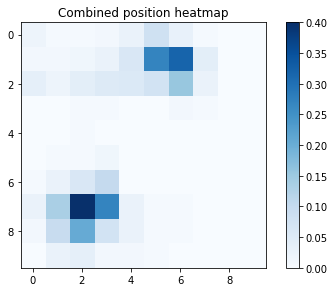

Per agent heatmaps:


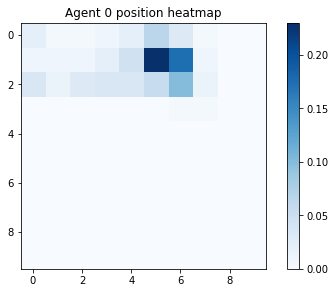

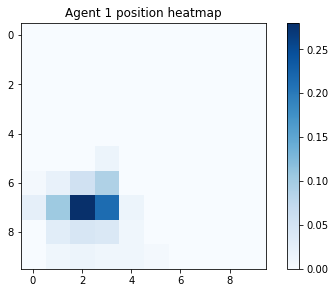

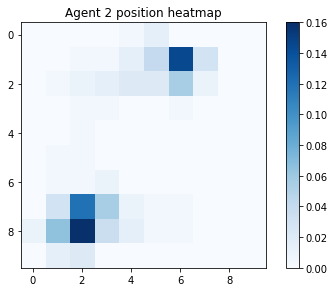

steps 43200 - 43400
gamma = 0.4859282778005241
avg reward for agent 0 : 0.999976959056243
avg reward for agent 1 : 0.982005022925739
avg reward for agent 2 : 0.9753231492361927


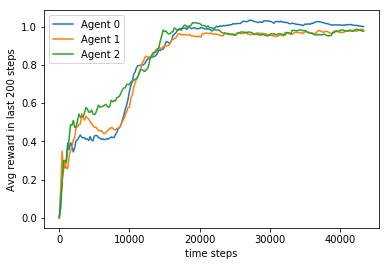

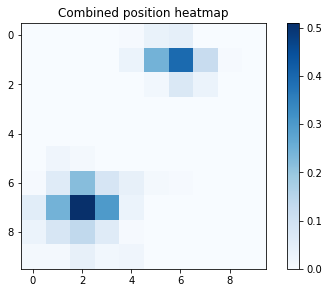

Per agent heatmaps:


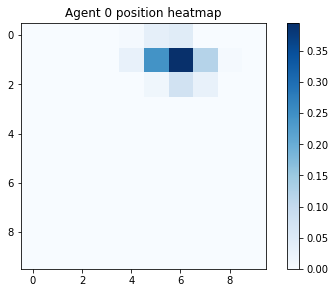

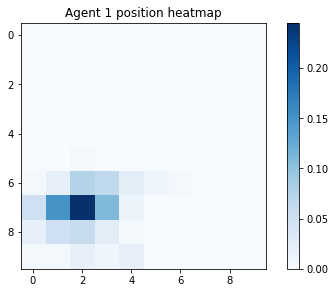

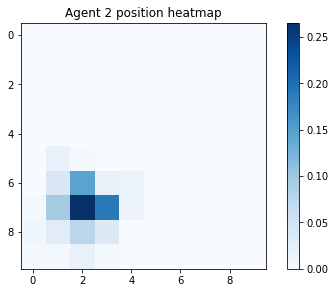

steps 43400 - 43600
gamma = 0.4849573876042964
avg reward for agent 0 : 1.0008944748973647
avg reward for agent 1 : 0.9786472787321392
avg reward for agent 2 : 0.981628861723355


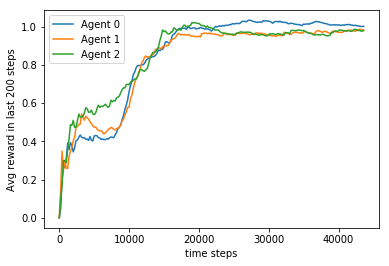

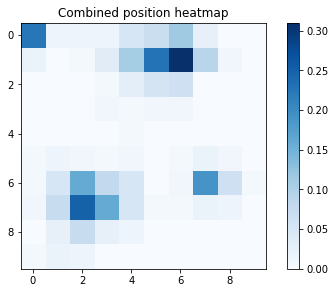

Per agent heatmaps:


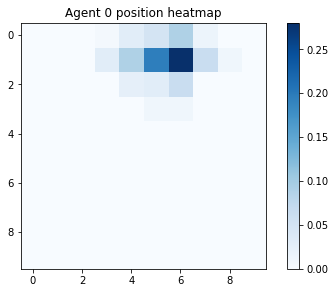

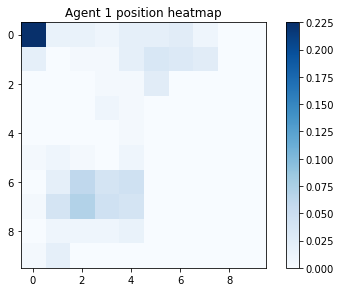

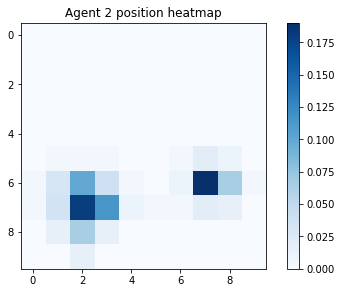

steps 43600 - 43800
gamma = 0.48398843725766416
avg reward for agent 0 : 0.999748864181183
avg reward for agent 1 : 0.9755485034588252
avg reward for agent 2 : 0.9828542727334992


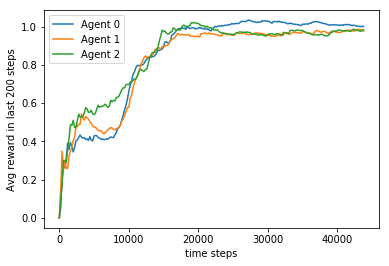

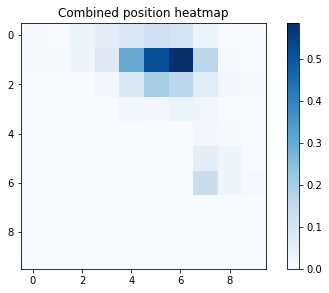

Per agent heatmaps:


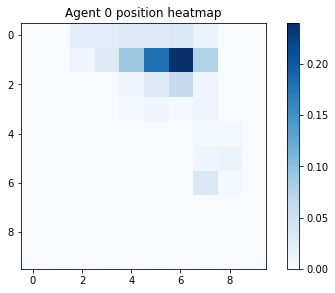

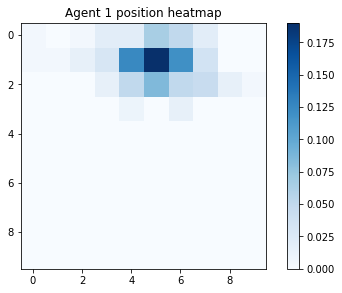

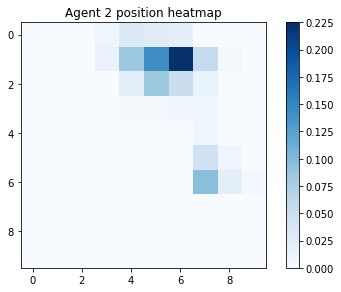

steps 43800 - 44000
gamma = 0.48302142288478617
avg reward for agent 0 : 1.0099770459762278
avg reward for agent 1 : 0.9758869116610986
avg reward for agent 2 : 0.981795868275721


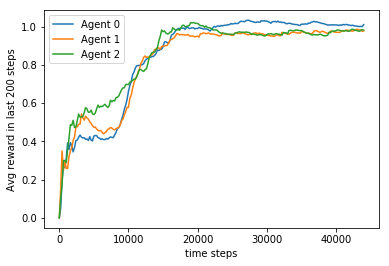

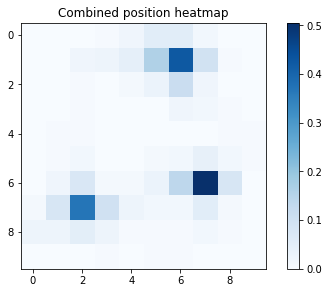

Per agent heatmaps:


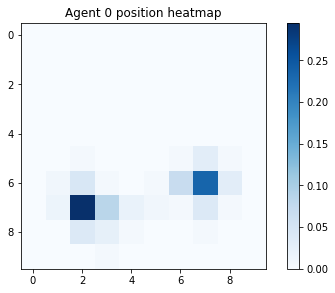

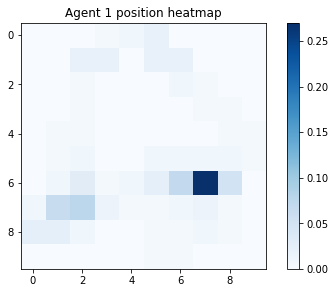

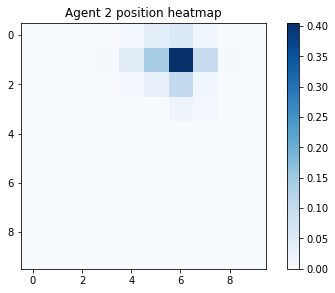

steps 44000 - 44200
gamma = 0.4820563406175644
avg reward for agent 0 : 1.0142304472749486
avg reward for agent 1 : 0.9739598651614216
avg reward for agent 2 : 0.9784846496685595


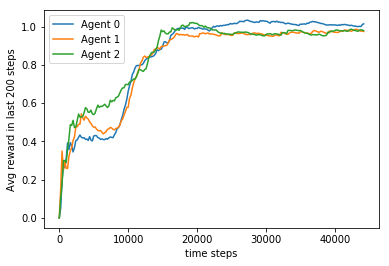

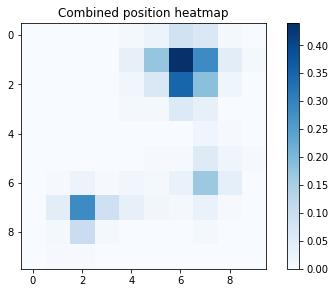

Per agent heatmaps:


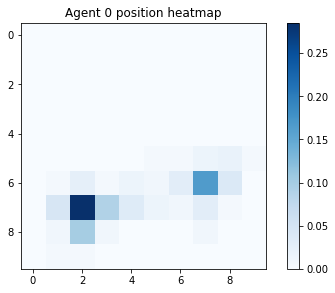

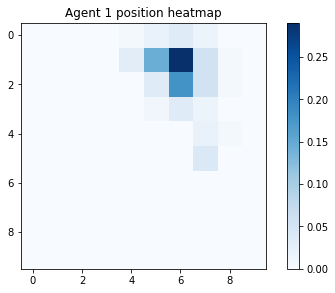

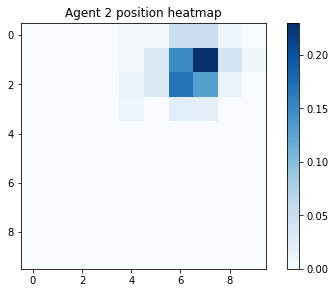

steps 44200 - 44400
gamma = 0.48109318659563055
avg reward for agent 0 : 1.0143915677574828
avg reward for agent 1 : 0.9720501790500214
avg reward for agent 2 : 0.981058985157992


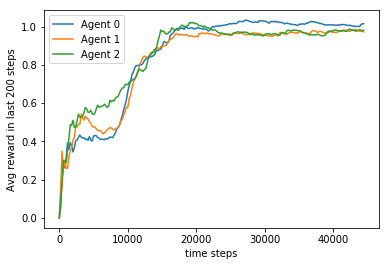

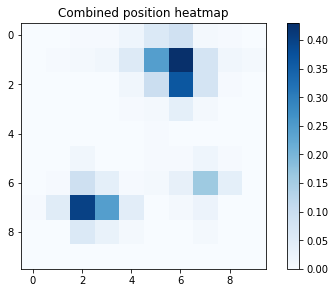

Per agent heatmaps:


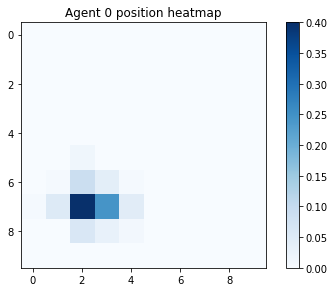

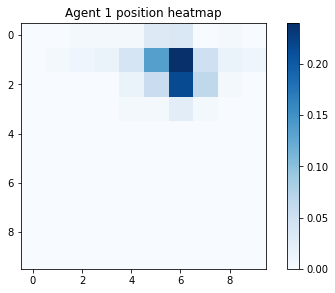

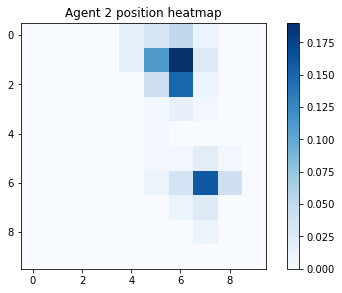

steps 44400 - 44600
gamma = 0.4801319569663284
avg reward for agent 0 : 1.0127575614896527
avg reward for agent 1 : 0.9712786708818187
avg reward for agent 2 : 0.9804712898813928


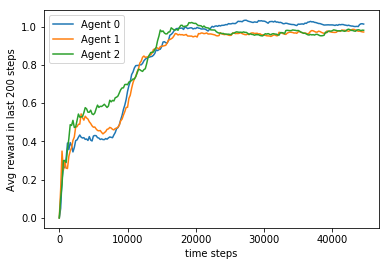

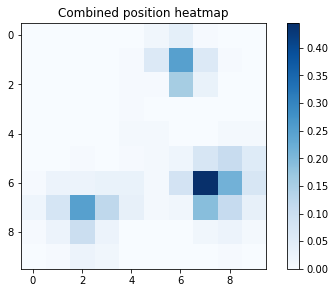

Per agent heatmaps:


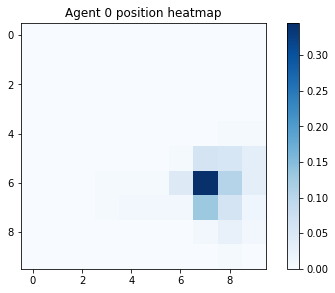

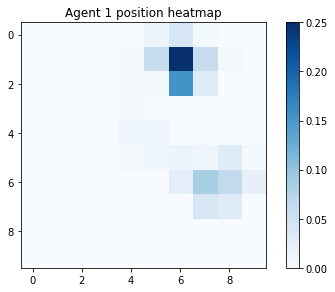

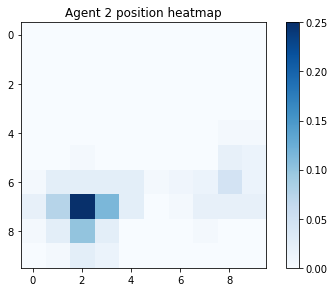

steps 44600 - 44800
gamma = 0.47917264788469954
avg reward for agent 0 : 1.0133702372714894
avg reward for agent 1 : 0.9698444231155554
avg reward for agent 2 : 0.9787727952501061


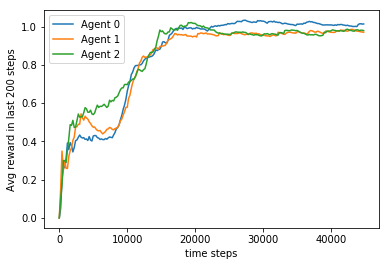

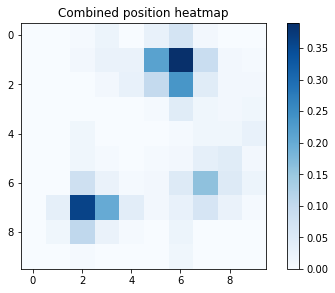

Per agent heatmaps:


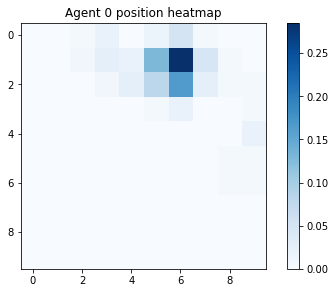

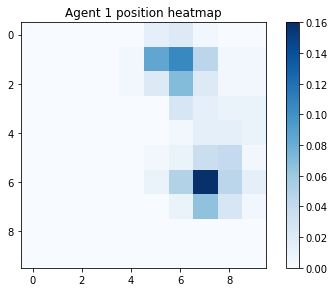

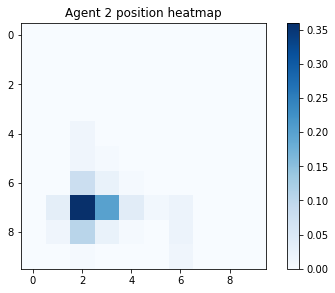

steps 44800 - 45000
gamma = 0.47821525551346805
avg reward for agent 0 : 1.0101997733383703
avg reward for agent 1 : 0.9702006622075064
avg reward for agent 2 : 0.9773116152974378


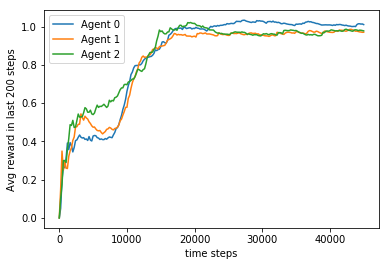

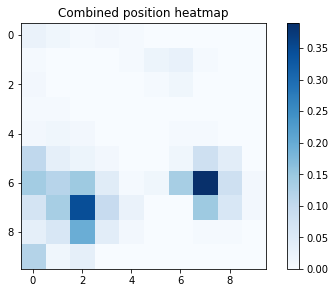

Per agent heatmaps:


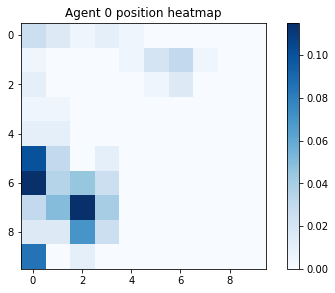

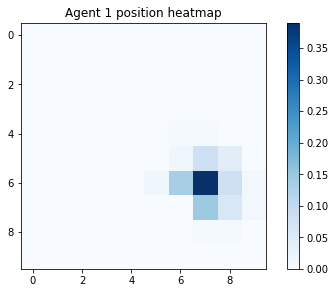

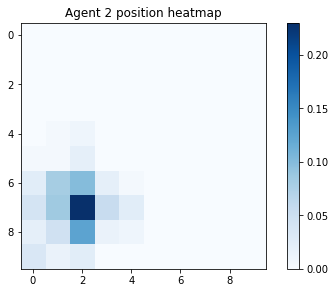

steps 45000 - 45200
gamma = 0.477259776023025
avg reward for agent 0 : 1.0072786000309728
avg reward for agent 1 : 0.9672352381584478
avg reward for agent 2 : 0.9745359615937701


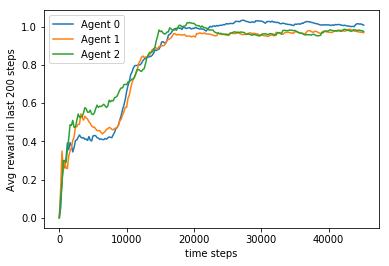

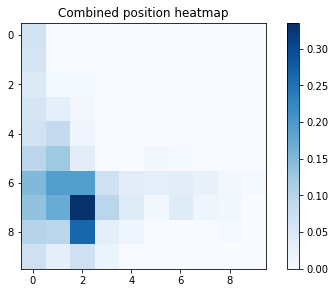

Per agent heatmaps:


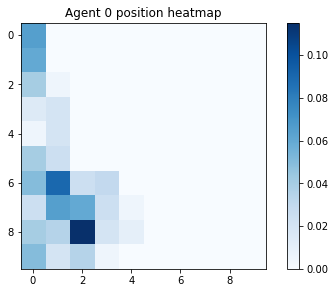

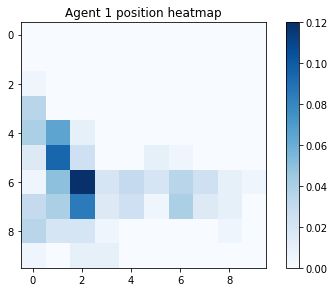

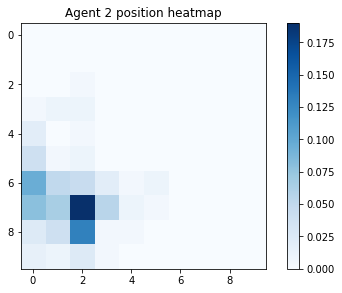

steps 45200 - 45400
gamma = 0.4763062055914131
avg reward for agent 0 : 1.0046034228320961
avg reward for agent 1 : 0.9647364595493492
avg reward for agent 2 : 0.9704632056562631


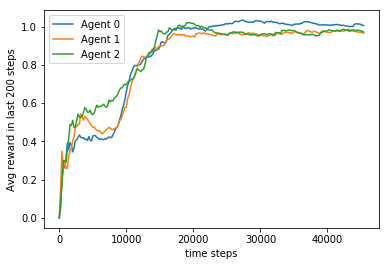

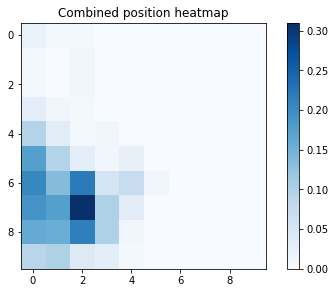

Per agent heatmaps:


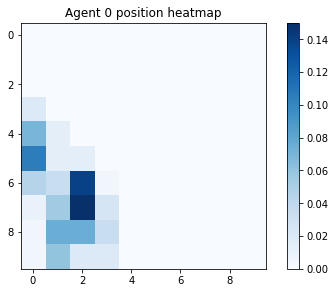

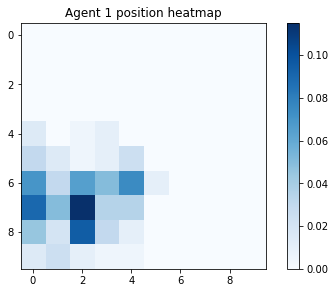

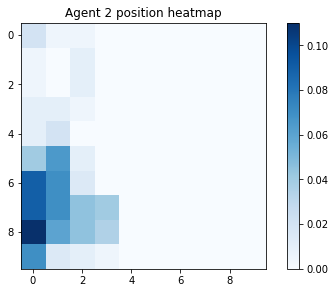

steps 45400 - 45600
gamma = 0.47535454040431097
avg reward for agent 0 : 1.0019517115852723
avg reward for agent 1 : 0.9723470976513673
avg reward for agent 2 : 0.9670840551742287


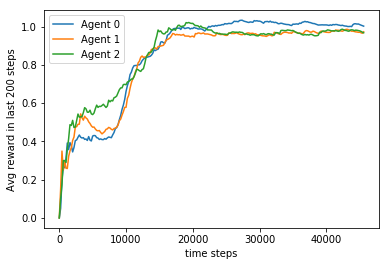

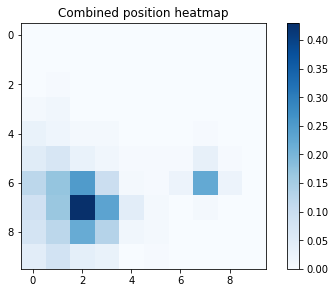

Per agent heatmaps:


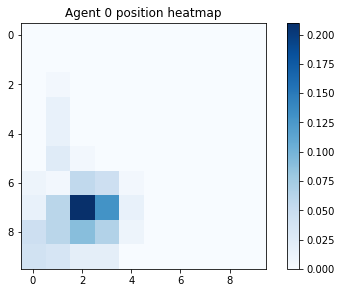

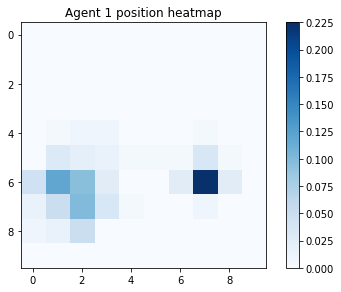

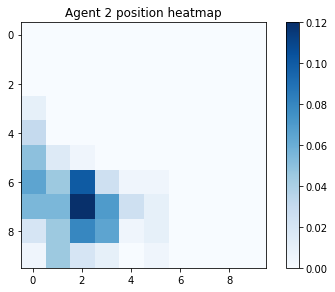

steps 45600 - 45800
gamma = 0.47440477665501857
avg reward for agent 0 : 0.999759830571385
avg reward for agent 1 : 0.9731228575795289
avg reward for agent 2 : 0.9676644614746402


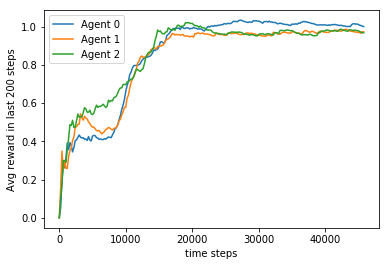

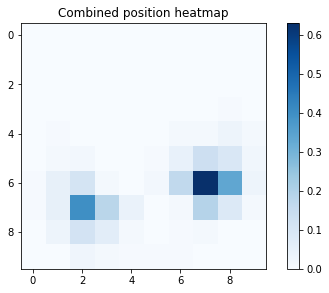

Per agent heatmaps:


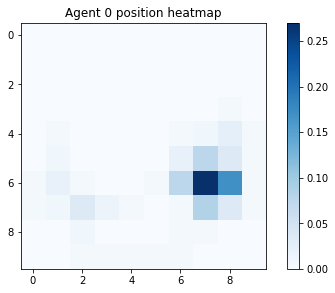

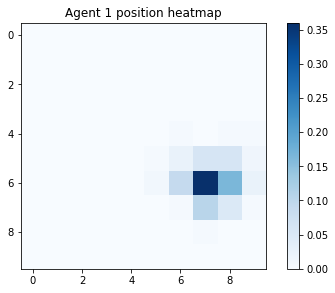

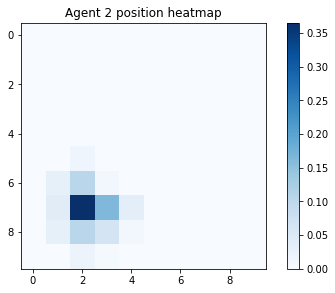

steps 45800 - 46000
gamma = 0.473456910544442
avg reward for agent 0 : 1.003456446598987
avg reward for agent 1 : 0.9745440316514858
avg reward for agent 2 : 0.9765005108584596


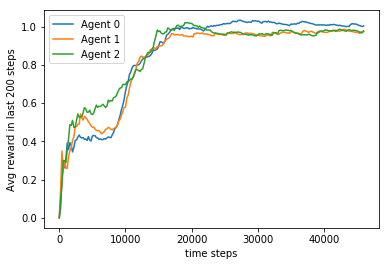

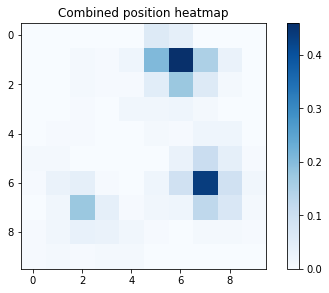

Per agent heatmaps:


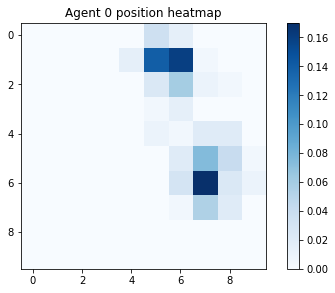

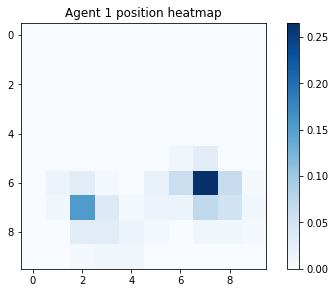

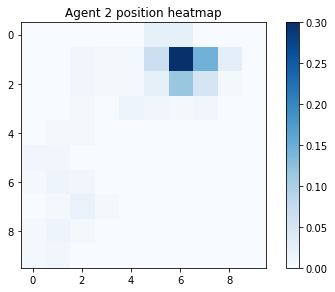

steps 46000 - 46200
gamma = 0.4725109382810774
avg reward for agent 0 : 1.004523711607974
avg reward for agent 1 : 0.9791995844245795
avg reward for agent 2 : 0.9770351291097595


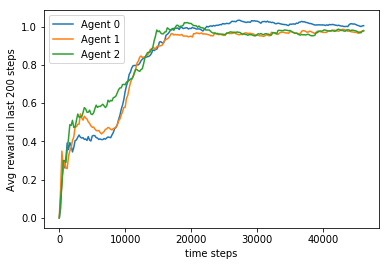

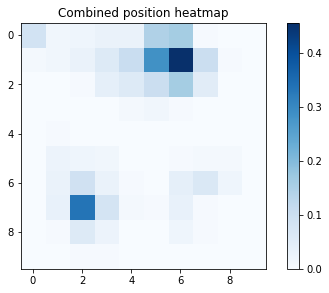

Per agent heatmaps:


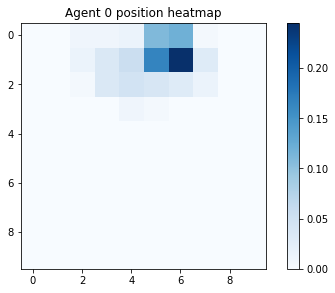

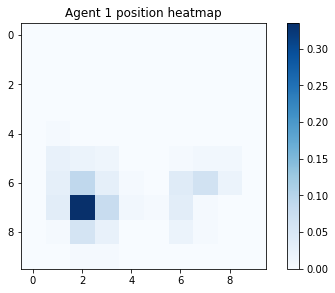

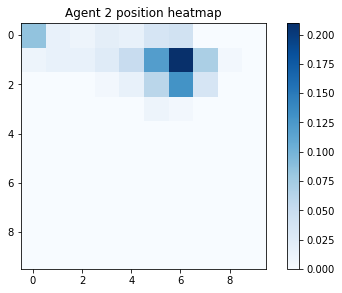

steps 46200 - 46400
gamma = 0.47156685608099624
avg reward for agent 0 : 1.0066593392383785
avg reward for agent 1 : 0.9792892394560462
avg reward for agent 2 : 0.9807978276330251


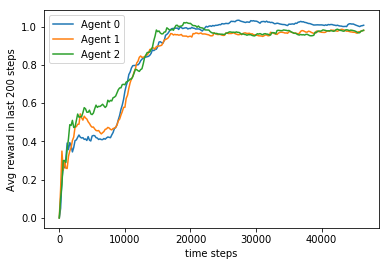

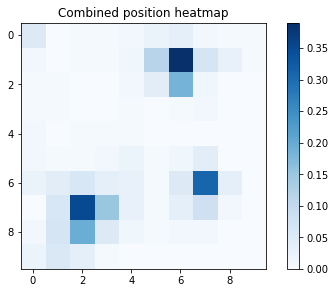

Per agent heatmaps:


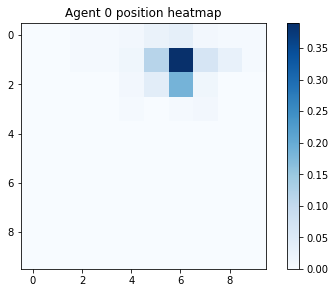

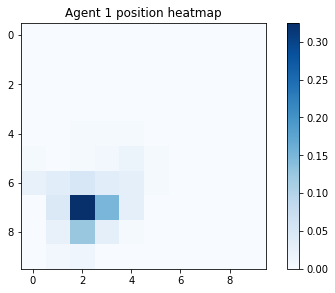

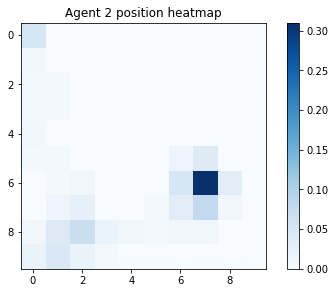

steps 46400 - 46600
gamma = 0.4706246601678312
avg reward for agent 0 : 1.0068453466663805
avg reward for agent 1 : 0.9778760112443939
avg reward for agent 2 : 0.9787343619235639


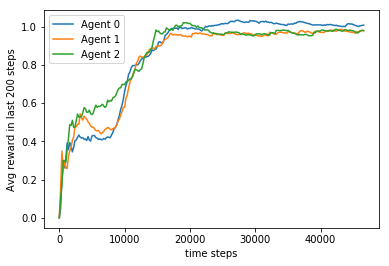

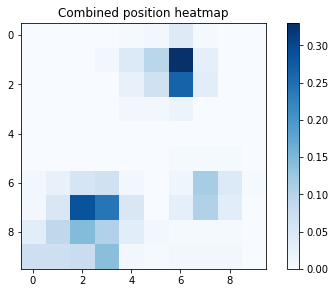

Per agent heatmaps:


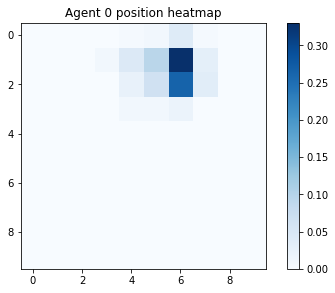

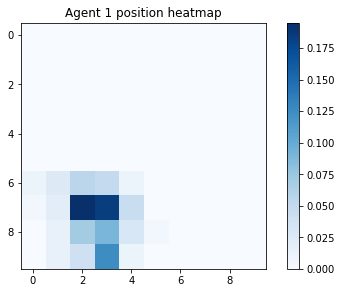

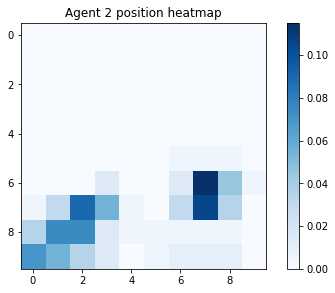

steps 46600 - 46800
gamma = 0.46968434677275966
avg reward for agent 0 : 1.0085254588577166
avg reward for agent 1 : 0.9760475203521293
avg reward for agent 2 : 0.9769022029443816


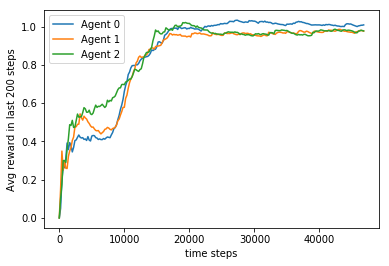

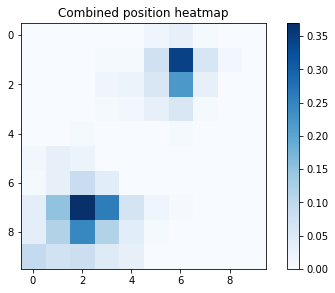

Per agent heatmaps:


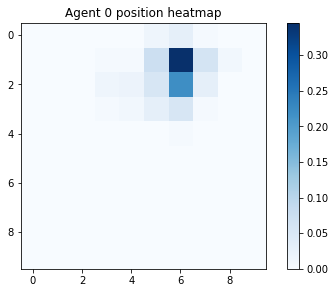

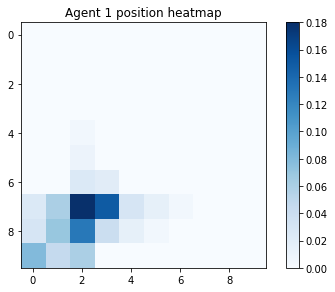

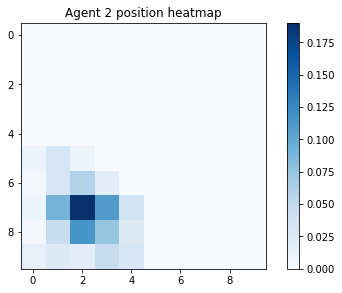

steps 46800 - 47000
gamma = 0.4687459121344886
avg reward for agent 0 : 1.009127465373077
avg reward for agent 1 : 0.9746601136146039
avg reward for agent 2 : 0.9759366821982511


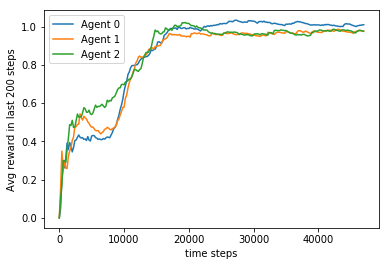

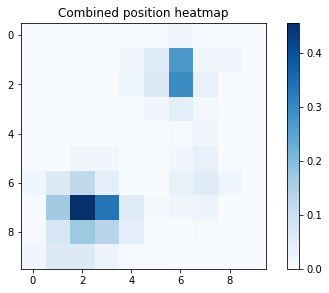

Per agent heatmaps:


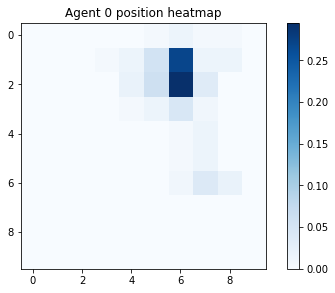

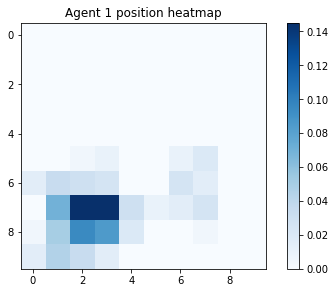

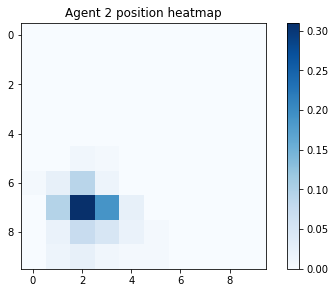

steps 47000 - 47200
gamma = 0.4678093524992409
avg reward for agent 0 : 1.0103599500010594
avg reward for agent 1 : 0.9811232812864135
avg reward for agent 2 : 0.9741319039850851


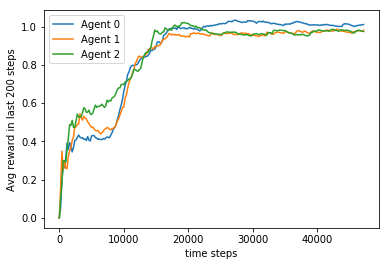

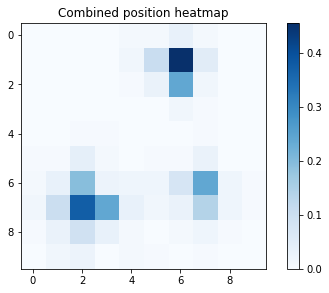

Per agent heatmaps:


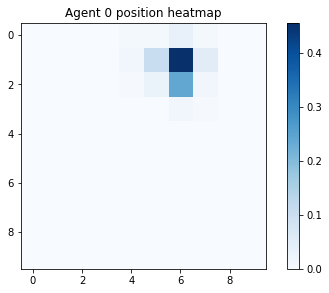

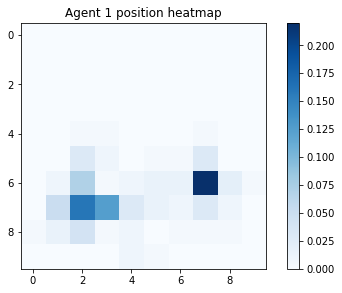

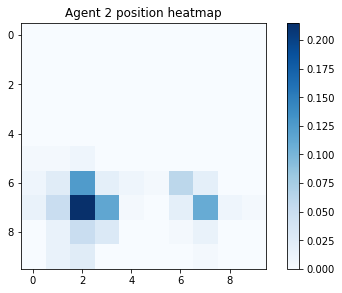

steps 47200 - 47400
gamma = 0.4668746641207397
avg reward for agent 0 : 1.0105272040674247
avg reward for agent 1 : 0.9837345203687686
avg reward for agent 2 : 0.9736081517267569


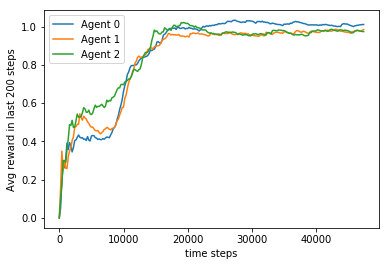

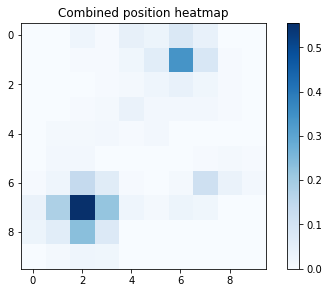

Per agent heatmaps:


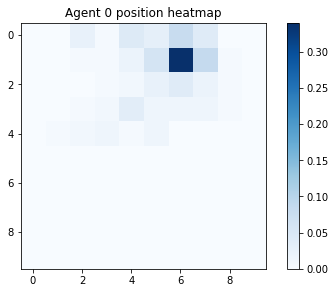

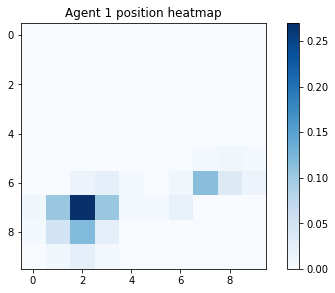

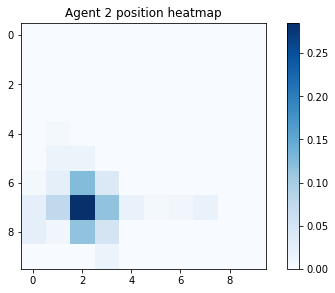

steps 47400 - 47600
gamma = 0.4659418432601928
avg reward for agent 0 : 1.0102728934266088
avg reward for agent 1 : 0.9886346925484759
avg reward for agent 2 : 0.9741391987563286


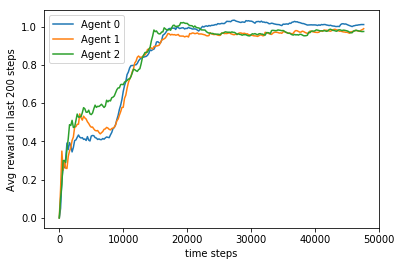

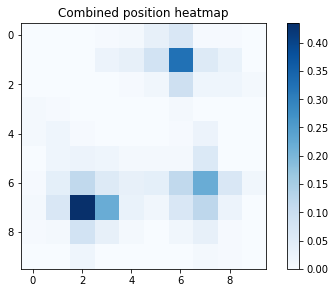

Per agent heatmaps:


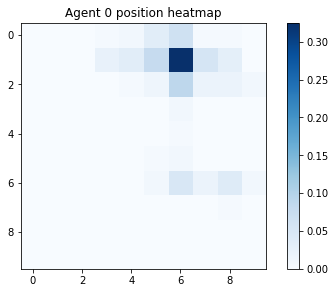

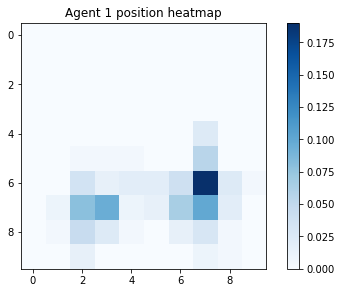

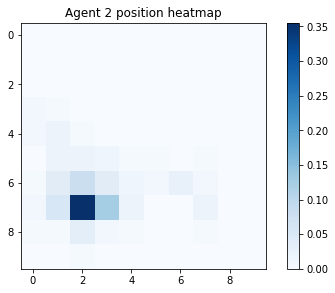

steps 47600 - 47800
gamma = 0.465010886186278
avg reward for agent 0 : 1.0079287044204097
avg reward for agent 1 : 0.9926570573837368
avg reward for agent 2 : 0.9723645948829522


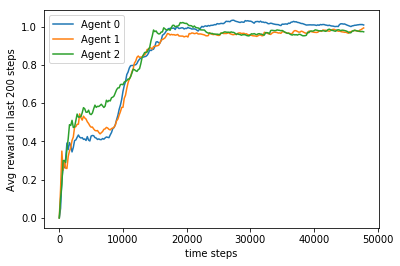

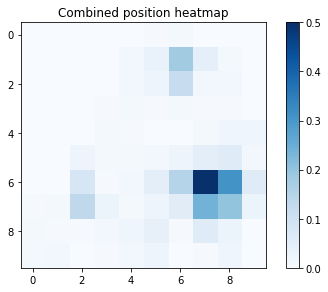

Per agent heatmaps:


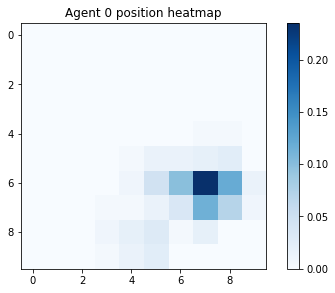

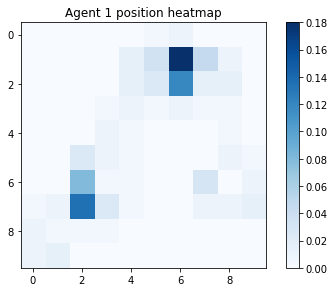

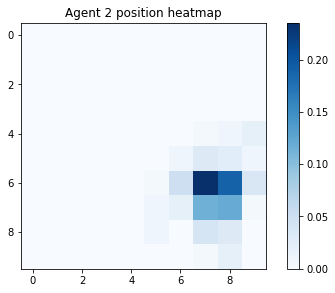

steps 47800 - 48000
gamma = 0.4640817891751287
avg reward for agent 0 : 1.0095623007854002
avg reward for agent 1 : 0.9916460073748463
avg reward for agent 2 : 0.9708131080602488


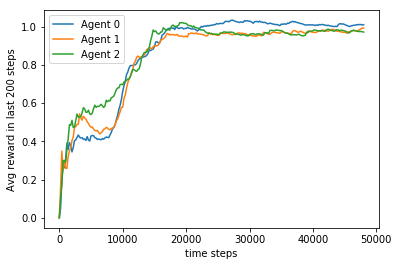

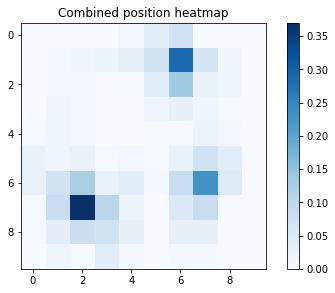

Per agent heatmaps:


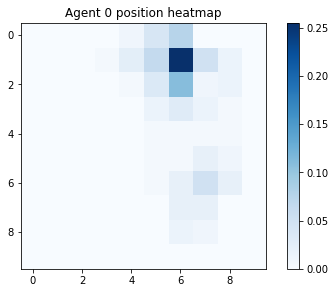

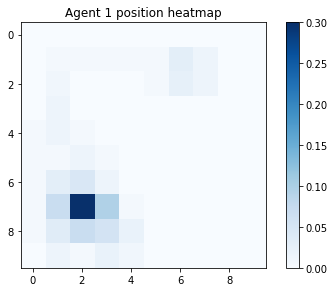

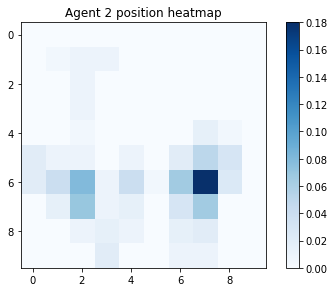

steps 48000 - 48200
gamma = 0.46315454851031806
avg reward for agent 0 : 1.0068255845314413
avg reward for agent 1 : 0.9893985601958466
avg reward for agent 2 : 0.9713491421339806


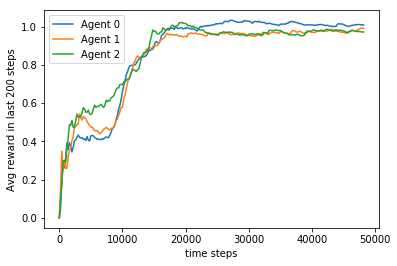

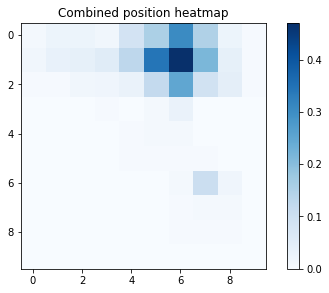

Per agent heatmaps:


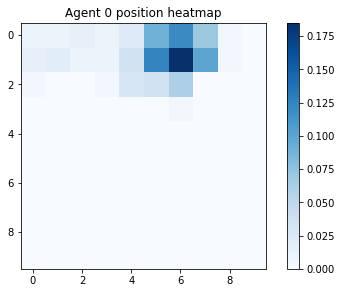

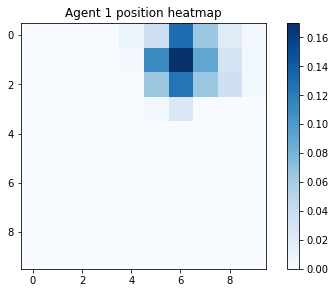

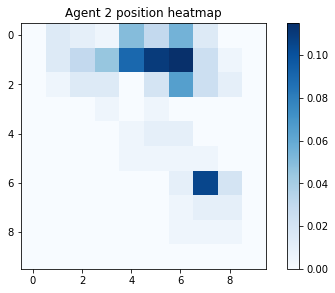

steps 48200 - 48400
gamma = 0.46222916048284585
avg reward for agent 0 : 1.0051445218074007
avg reward for agent 1 : 0.9869630792752215
avg reward for agent 2 : 0.9727071754715811


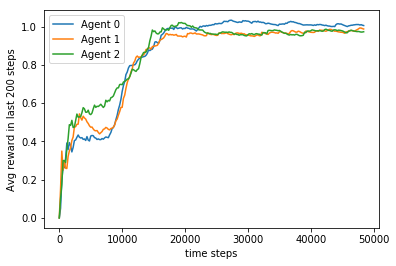

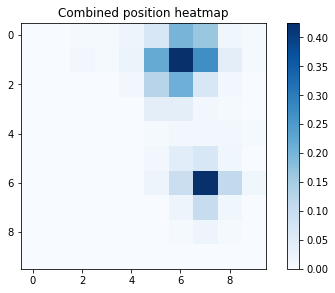

Per agent heatmaps:


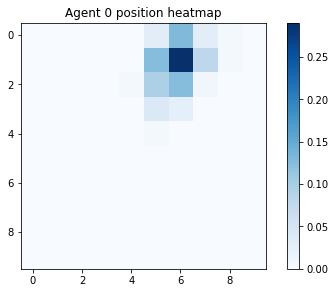

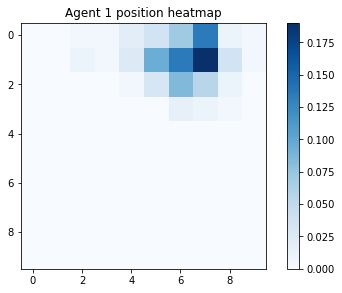

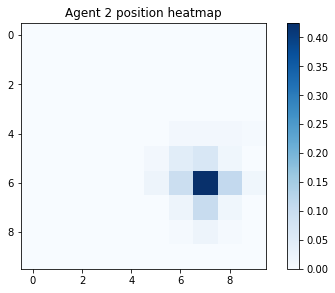

steps 48400 - 48600
gamma = 0.4613056213911211
avg reward for agent 0 : 1.0028600234563074
avg reward for agent 1 : 0.9861936997181128
avg reward for agent 2 : 0.9703504043126685


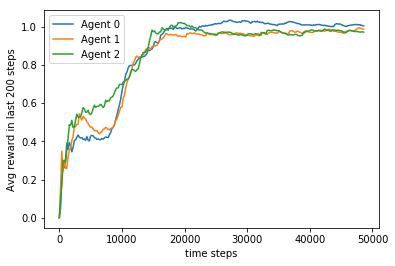

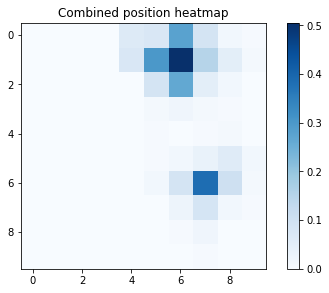

Per agent heatmaps:


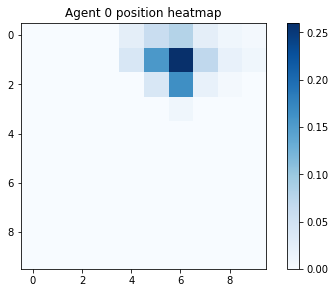

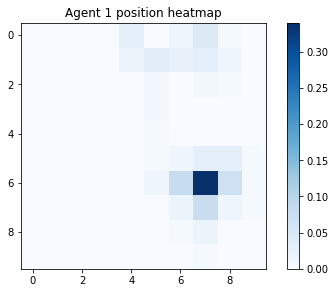

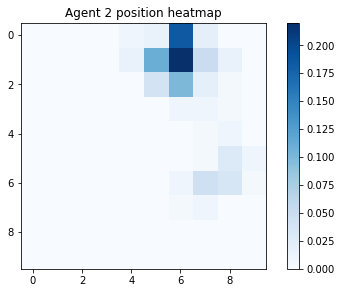

steps 48600 - 48800
gamma = 0.46038392754094914
avg reward for agent 0 : 1.0005942501178255
avg reward for agent 1 : 0.984815884920391
avg reward for agent 2 : 0.9692424335566894


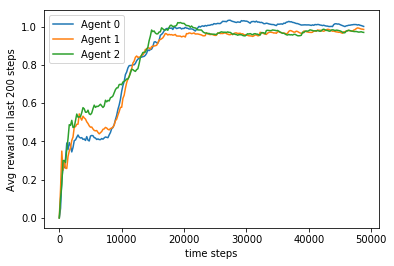

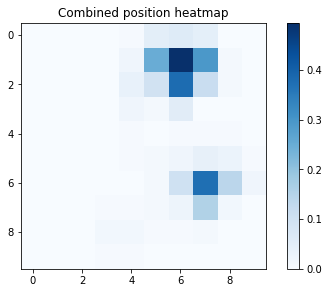

Per agent heatmaps:


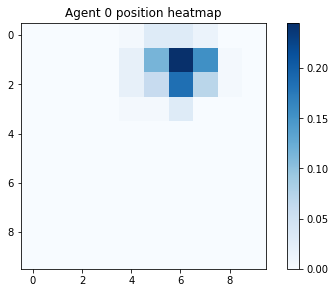

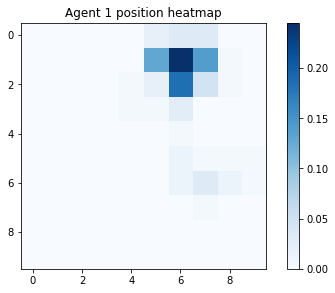

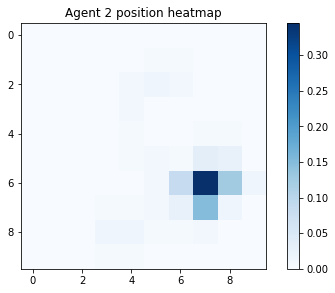

steps 48800 - 49000
gamma = 0.45946407524551713
avg reward for agent 0 : 0.9997755147854125
avg reward for agent 1 : 0.9842656272320973
avg reward for agent 2 : 0.9675312748719413


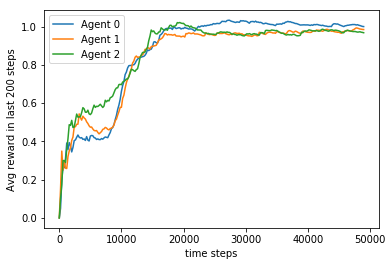

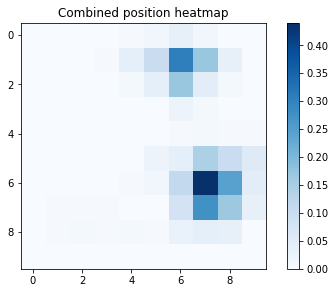

Per agent heatmaps:


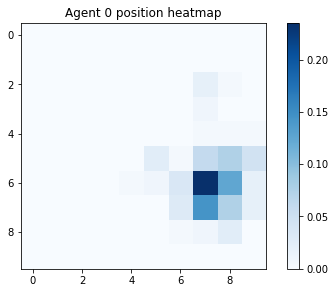

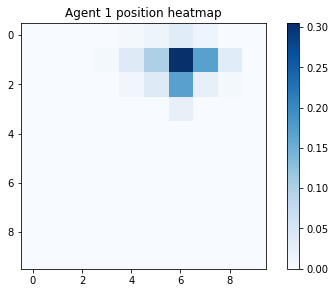

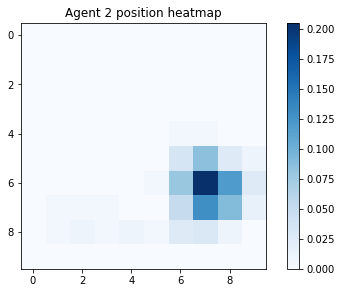

steps 49000 - 49200
gamma = 0.45854606082537647
avg reward for agent 0 : 0.9985569398995955
avg reward for agent 1 : 0.9841263388955509
avg reward for agent 2 : 0.981280868275035


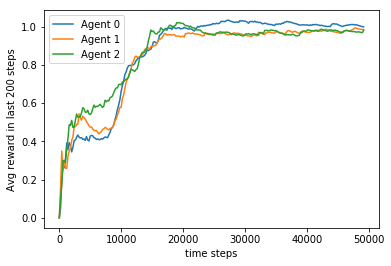

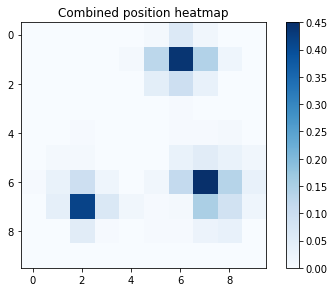

Per agent heatmaps:


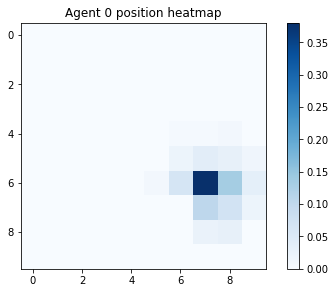

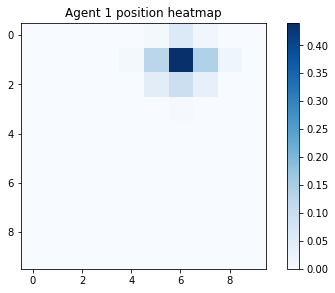

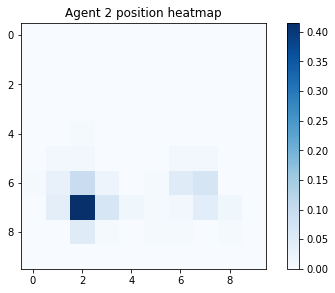

steps 49200 - 49400
gamma = 0.45762988060843357
avg reward for agent 0 : 0.9975506568692941
avg reward for agent 1 : 0.981761502803587
avg reward for agent 2 : 0.979534827230218


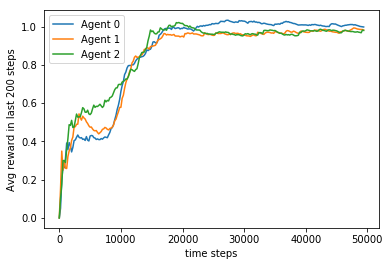

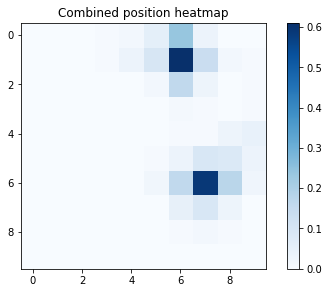

Per agent heatmaps:


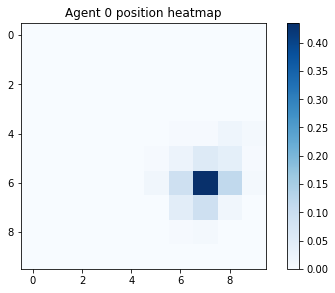

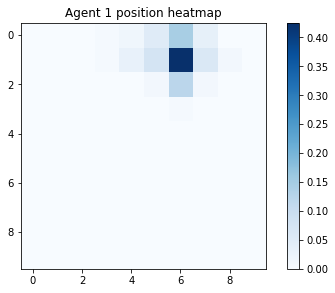

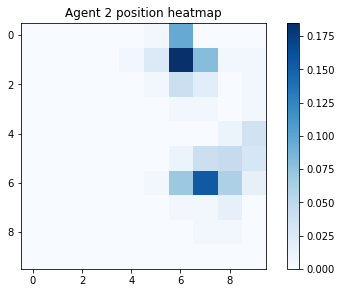

steps 49400 - 49600
gamma = 0.45671553092992795
avg reward for agent 0 : 1.0007862744702727
avg reward for agent 1 : 0.9798189552629988
avg reward for agent 2 : 0.9782060845547469


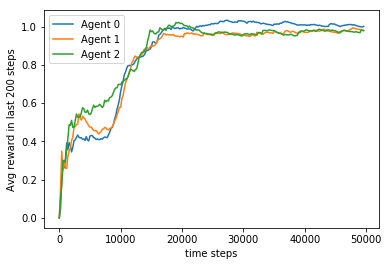

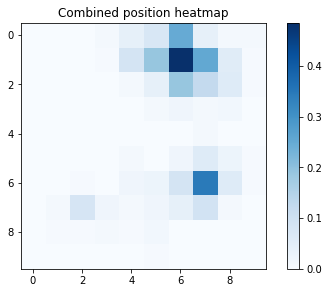

Per agent heatmaps:


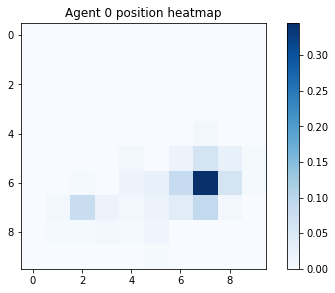

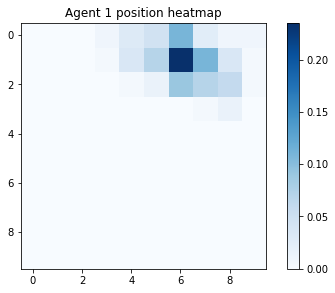

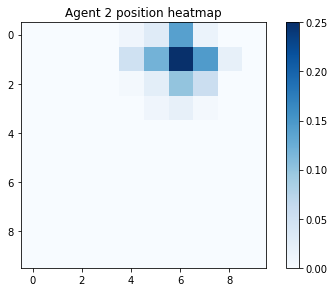

steps 49600 - 49800
gamma = 0.4558030081324242
avg reward for agent 0 : 1.0001807192626655
avg reward for agent 1 : 0.9823095921768639
avg reward for agent 2 : 0.976486415935423


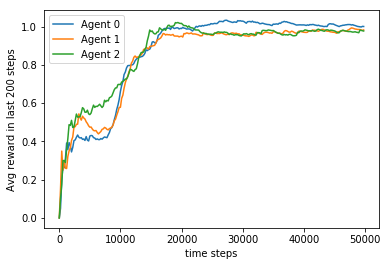

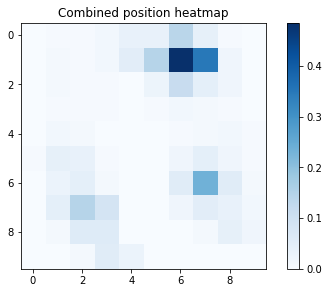

Per agent heatmaps:


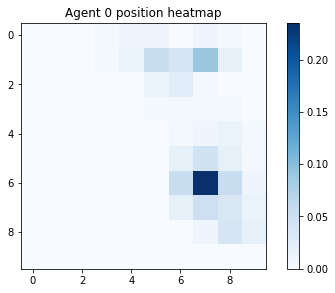

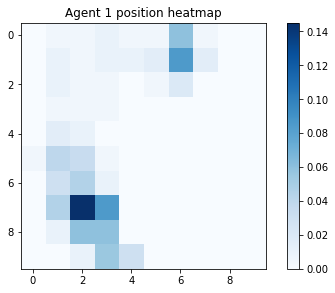

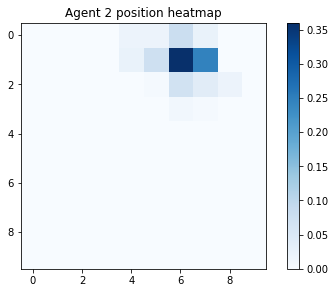

In [6]:
for i in range(config.n_episodes):
    env = Environment(dim=(config.grid_size_h, config.grid_size_w),
                      reward_eat_trash=10, 
                      reward_invalid_move=0,
                      reward_nothing_happend=0, 
                      trash_appearence_prob=0.1,
                      number_trash_sources=0,
                      saved_timesteps=config.time_steps)
    env.trash_sources.append(config.trash_source_1)# at [7,2]
    env.trash_sources.append(config.trash_source_2)# at [1,6]
    #env.trash_sources.append(config.trash_source_3)# at [2,2]
    env.trash_sources.append(config.trash_source_4)# at [6,7]

    
    all_reward_history,avg_reward_history,all_agents_heatmap,per_agent_heatmaps = run(model,env)

#### Now reset the model, train it on a different environment and use the pretrained model to learn the environment on top again. Will it learn faster?

In [ ]:
###########################################################################################
## Reset the model

data_i = Input(shape=(config.n_channels, config.grid_size_w, config.grid_size_h))
conv_1 = Conv2D(16, (2, 2), activation="relu", data_format="channels_first")(data_i)
conv_2 = Conv2D(32, (2, 2), activation="relu", data_format="channels_first")(conv_1)
pool_1 = MaxPooling2D(data_format="channels_first")(conv_2)
drop_1 = Dropout(0.25)(pool_1)
flat_1 = Flatten()(drop_1)
feed_1 = Dense(64, activation="relu")(flat_1)
drop_2 = Dropout(0.25)(feed_1)
feed_2 = Dense(config.n_actions, activation="linear")(drop_2)
data_o = feed_2

model = Model(inputs=data_i, outputs=data_o)

model.compile(optimizer="adam", loss="mse")

model.summary()


############################################################################################
## Set up a second environment
env2 = Environment(dim = (config.grid_size_h,config.grid_size_w),reward_eat_trash=10, 
                        reward_invalid_move=0, reward_nothing_happend=0, 
                        trash_appearence_prob=0.1, number_trash_sources=0, saved_timesteps=config.time_steps )
env2.trash_sources.append(config.trash_source_3)# at [5,1]
env2.trash_sources.append(config.trash_source_4)# at [5,5]
############################################################################################
## Run the model in the second environment
run(model, env2)

In [ ]:
###########################################################################################
## Run the pretrained model again on the old environment
env = Environment(dim = (config.grid_size_h,config.grid_size_w),reward_eat_trash=10, 
                        reward_invalid_move=0, reward_nothing_happend=0, 
                        trash_appearence_prob=0.1, number_trash_sources=0, saved_timesteps=config.time_steps )
env.trash_sources.append(config.trash_source_1)# at [2,3]
env.trash_sources.append(config.trash_source_2)# at [1,6]

run(model, env)

### We now define a new environment and see what the pretrained network will do on that

In [ ]:
env2 = Environment(dim = (config.grid_size_h,config.grid_size_w),reward_eat_trash=10, 
                        reward_invalid_move=0, reward_nothing_happend=0, 
                        trash_appearence_prob=0.1, number_trash_sources=0, saved_timesteps=config.time_steps )
env2.trash_sources.append(config.trash_source_3)
env2.trash_sources.append(config.trash_source_4)

run(model, env2)
